The three easy pieces refer to the three major thematic elements the book is organized around: **virtualization**, **concurrency**, and **persistence**
- In discussing these concepts, we’ll end up discussing most of the important things an operating system does

At the beginning of each major section, we’ll first present an abstraction that an operating system provides, and then work in subsequent chapters on the mechanisms, policies, and other support needed to provide the abstraction. Abstractions are fundamental to all aspects of Computer Science, so it is perhaps no surprise that they are also essential in operating systems

In various parts of the text, we have sprinkled in a few homeworks to ensure
that you are understanding what is going on. Many of these homeworks are little
simulations of pieces of the operating system; you should download the homeworks, and run them to quiz yourself. The homework simulators have the following feature: by giving them a different random seed, you can generate a virtually
infinite set of problems; the simulators can also be told to solve the problems for
you. Thus, you can test and re-test yourself until you have achieved a good level
of understanding.

The most important addendum to this book is a set of projects in which you learn about how real systems work by designing, implementing, and testing your own code
- All projects (as well as the code examples, mentioned above) are in the C programming language [KR88]; **C is a simple and powerful language that underlies most operating systems, and thus worth adding to your tool-chest of languages**.

# 2 - Introduction to Operating Systems
A running program does one very simple thing: it executes instructions. 
- Many millions/billions of times every second, the processor **fetches** an instruction from memory, **decodes** it (figures out which instruction this is), and **executes** it (does the thing that it is supposed to do, like add two numbers together, access memory, check a condition, jump to a function, and so forth). 
- After it is done with this instruction, the processor moves on to the next instruction, and so on, and so on, until the program finally completes

Thus, we have just described the basics of the **Von Neumann** model of computing

while a program runs, a lot of other wild things are going on with the primary goal of making the system **easy to use**.

**operating system (OS)** - body of software that is responsible for making it easy to run programs (even allowing you to seemingly run many at the same time), allowing programs to share memory, enabling programs to interact with devices, and other fun stuff like that - is in charge of making sure the system operates correctly and efficiently in an easy-to-use manner

The primary way the OS does this is through a general technique that we call **virtualization** - **the OS takes a physical resource** (such as
the processor, or memory, or a disk) **and transforms it into a more general, powerful, and easy-to-use virtual form of itself**. Thus, we sometimes
refer to the operating system as a **virtual machine**.

in order to allow users to tell the OS what to do and thus make use of the features of the virtual machine (such as running a program, or allocating memory, or accessing a file), the OS also provides some interfaces (APIs) that you can call

A typical OS, in fact, exports a few hundred system calls that are available to applications

Because the OS provides these calls to run programs, access memory and devices, and other related actions, we also sometimes say that the OS provides a **standard library** to applications

## 2.1 Virtualizing the CPU
Finally, because virtualization allows many programs to run (thus sharing the CPU), and many programs to concurrently access their own instructions and data (thus sharing memory), and many programs to access devices (thus sharing disks and so forth), the OS is sometimes known as a **resource manager**.

the OS, with some help from the hardware, is in charge of the illusion that the system has a very large number of virtual CPUs
- Turning a single CPU (or small set of them) into a seemingly infinite number of CPUs and thus allowing many programs to seemingly run at once is what we call **virtualizing the CPU**, the focus of the first major part of this book

Interfaces (APIs) that you can use to communicate with the OS. We’ll talk about these APIs throughout this book - main way in which most users interact with operating systems.

if two programs want to run at a particular time, which should run? 
- answered by a **policy** of the OS; policies are used in many different places within an OS to answer these types of questions, and thus we will study them as we learn about the basic **mechanisms** that operating systems implement (such as the ability to run multiple programs at once).
- Hence the role of the OS as a **resource manager**

## 2.2 Virtualizing Memory
The model of physical memory presented by modern machines is very simple. **Memory is just an array of bytes**; to read memory, one must specify an address to be able to access the data stored there; to write (or update) memory, one must also specify the data to be written to the given address

Don’t forget that each instruction of the program is in memory too; thus memory is accessed on each instruction fetch.

Each process accesses its own private virtual address space
(sometimes just called its address space), which the OS somehow maps
onto the physical memory of the machine. A memory reference within
one running program does not affect the address space of other processes
(or the OS itself); as far as the running program is concerned, it has physical memory all to itself. The reality, however, is that physical memory is
a shared resource, managed by the operating system. Exactly how all of
this is accomplished is also the subject of the first part of this book, on the
topic of virtualization.

## 2.3 Concurrency
We use this conceptual term to refer to a host of problems that arise, and must be addressed, when working on many things at once (i.e., concurrently) in the same program.

**Unfortunately, the problems of concurrency are no longer limited just to the OS itself. Indeed, modern multi-threaded programs exhibit the same problems**

You can think of a thread as a function running within the same memory space as other functions, with more than one of them active at a time

## 2.4 Persistence
The third major theme of the course is persistence. In system memory, data can be easily lost, as devices such as DRAM store values in a volatile manner; when power goes away or the system crashes, any data in memory is lost. Thus, we need hardware and software to be able to store data persistently; such storage is thus critical to any system as users care a great deal about their data.

The hardware comes in the form of some kind of input/output or I/O device; in modern systems, a hard drive is a common repository for longlived information, although solid-state drives (SSDs) are making headway in this arena as well.

The software in the OS that usually manages the disk is called the file system; it is thus responsible for storing any files the user creates in a reliable and efficient manner on the disks of the system.

Unlike the abstractions provided by the OS for the CPU and memory, the OS does not create a private, virtualized disk for each application. Rather, it is assumed that often times, users will want to share information that is in files

As anyone who has written a **device driver** knows, getting a device to do something on your behalf is an intricate and detailed process. It requires a deep knowledge of the low-level device interface and its exact semantics.

**NOTE:** A **device driver** is a specialized software component that allows higher-level computer programs (like an operating system or applications) to communicate with hardware devices. It acts as an intermediary between the operating system and the hardware, translating generic system calls into device-specific instructions.

To handle the problems of system crashes during writes, most file systems incorporate some kind of intricate write protocol, such as journaling or copy-on-write, carefully ordering writes to disk to ensure that if a failure occurs during the write sequence, the system can recover to reasonable state afterwards.

To make different common operations efficient, file systems employ many different data structures and access methods, from simple lists to complex btrees.

## 2.5 Design Goals
So now you have some idea of what an OS actually does: it takes physical **resources**, such as a CPU, memory, or disk, and **virtualizes** them. It handles 
tough and tricky issues related to **concurrency**. And it stores files **persistently**, thus making them safe over the long-term. 

Given that we want to build such a system, we want to have some goals in mind to help focus our design and implementation and make trade-offs as necessary; finding the right set of trade-offs is a key to building systems. One of the most basic goals is to build up some abstractions in order to make the system convenient and easy to use. Abstractions are fundamental to everything we do in computer science.

One goal in designing and implementing an operating system is to provide high **performance**; another way to say this is our goal is to **minimize the overheads of the OS**

- protection
- security
- efficiency

The operating system must also run non-stop; when it fails, all applications running on the system fail as well - **reliability**

**mobility** is increasingly important as OSes are run on smaller and smaller devices

Depending in how the system is used, the OS will have different goals and thus likely be implemented in at least slightly different ways. However, as we will see, many of the principles we will present on how to build operating systems are useful in the range of different devices.

## 2.6 Some History
##### Early Operating Systems: Just Libraries

eg: instead of having each programmer of the system write low-level I/O handling code, the “OS” would provide such APIs, and thus make life easier for the developer

Usually, on these old mainframe systems, one program ran at a time, as controlled by a human operator. Much of what you think a modern OS would do (e.g., deciding what order to run jobs in) was performed by this operator.

This mode of computing was known as **batch** processing, as a number of jobs were set up and then run in a “batch” by the operator

##### Beyond Libraries: Protection
OS's then took on a more central role in managing machines

One important aspect of this was the realization that code run on behalf of the OS was special; it had control of devices and thus should be treated differently than normal application code

Why is this? Well, imagine if you allowed any application to read from anywhere on the disk; the notion of privacy goes out the window, as any program could read any file. Thus, implementing a **file system** (to manage your files) as a library makes little sense

Thus, the idea of a system call was invented

Instead of providing OS routines as a library (where you just make a procedure call to access them), the idea here was to add a special pair of hardware instructions and hardware state to make the transition into the OS a more formal, controlled process.

The key difference between a system call and a procedure call is that a system call transfers control (i.e., jumps) into the OS while simultaneously raising the **hardware privilege level**. User applications run in what is referred to as **user mode** which means the hardware restricts what applications can do

**Eg:** an application running in user mode can’t typically initiate an I/O request to the disk, access any physical memory page, or send a packet on the network. When a system call is initiated (usually through a special hardware instruction called a **trap**), the hardware transfers control to a pre-specified **trap handler** (that the OS set up previously) and simultaneously raises the privilege level to **kernel mode**.

In kernel mode, the OS has full access to the hardware of the system and thus can do things like initiate an I/O request or make more memory available to a program.

When the OS is done servicing the request, it passes control back to the user via a special **return-from-trap** instruction, which reverts to user mode while simultaneously passing control back to where the application left off.

##### The Era of Multiprogramming
Where operating systems really took off was in the era of computing beyond the mainframe, that of the **minicomputer**

In particular, **multiprogramming** became commonplace due to the desire to make better use of machine resources. Instead of just running one job at a time, the OS would load a number of jobs into memory and switch rapidly between them, thus improving CPU utilization.

This switching was particularly important because I/O devices were slow; having a program wait on the CPU while its I/O was being serviced was a waste of CPU time. Instead, why not switch to another job and run it for a while?

Issues such as **memory protection** became important; we wouldn’t want one program to be able to access the memory of another program

Understanding how to deal with the **concurrency** issues introduced by multiprogramming was also critical; making sure the OS was behaving correctly despite the presence of interrupts is a great challenge.

One of the major practical advances of the time was the introduction of the UNIX operating system

##### The Modern Era
Beyond the minicomputer came a new type of machine, cheaper, faster, and for the masses: the **personal computer**, or **PC** as we call it today

this new breed of machine would soon become the dominant force in computing, as their low-cost enabled one machine per desktop instead of a shared minicomputer per workgroup.

Fortunately, after some years of suffering, the old features of minicomputer operating systems started to find their way onto the desktop

For example, Mac OS X has UNIX at its core, including all of the features one would expect from such a mature system

Even today’s cell phones run operating systems (such as Linux)

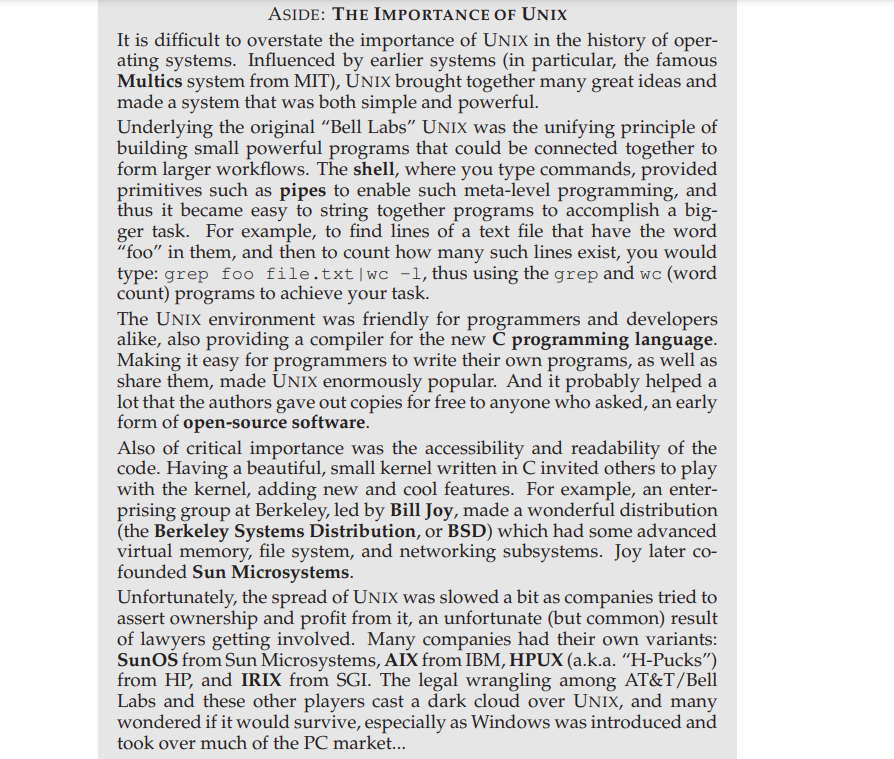

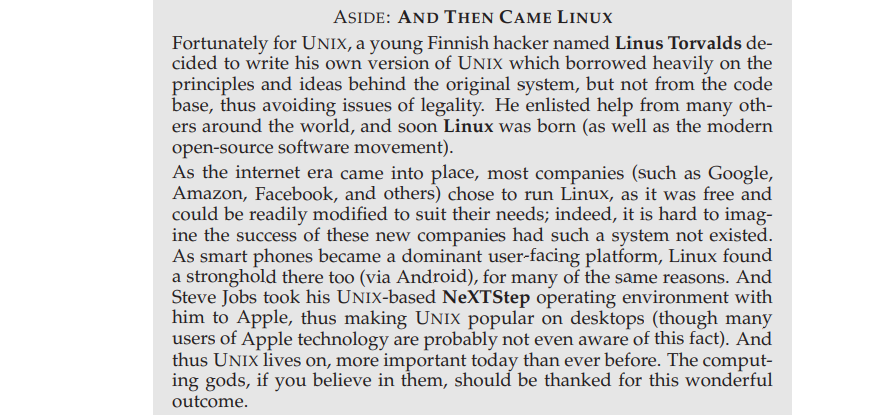

## 2.7 Summary
Unfortunately, due to time constraints, there are a number of parts of the OS we won’t cover in the book
- networking
- graphics
- security

# Part I - Virtualization
# 4 - The Abstraction: The Process
we discuss one of the most fundamental abstractions that the OS provides to users: the **process**.

def: **running program**

The program itself is a lifeless thing: it just sits there on the disk, a bunch of instructions (and maybe some static data), waiting to spring into action. It is the operating system that takes these bytes and gets them running, transforming the program into something useful.

a typical system may be seemingly running tens or even hundreds of processes at the same time. Doing so makes the system easy to use, as one never need be concerned with whether a CPU is available; one simply runs programs

**Challenge:** Although there are only a few physical CPUs available, how can the OS provide the illusion of a nearly-endless supply of said CPUs?

The OS creates this illusion by **virtualizing** the CPU

By running one **process**, then stopping it and running another, and so forth, the OS can promote the illusion that many virtual CPUs exist when in fact there is only one physical CPU (or a few)

This basic technique, known as **time sharing** of the CPU, allows users to run as many concurrent processes as they would like; the potential cost is performance, as each will run more slowly if the CPU(s) must be shared.

To implement virtualization of the CPU, and to implement it well, the OS will need both some low-level machinery as well as some high-level intelligence. We call the low-level machinery mechanisms; mechanisms are low-level methods or protocols that implement a needed piece of functionality. 

**Eg:** a **context switch** - gives OS ability to stop running one program and start running another on a given CPU
- this time-sharing mechanism is employed by all modern OSes

On top of these mechanisms resides some of the intelligence in the OS, in the form of **policies** - algorithms for making some kind of decision within the OS
- Eg: **scheduling policy** - given a number of possible programs to run on a CPU, which program should the OS run?

## 4.1 The Abstraction: A Process
The abstraction provided by the OS of a running program is something we will call a **process**

To understand what constitutes a process, we thus have to understand its **machine state**:
- what a program can read or update when it is running
- parts of the machine important to the execution of this program
- memory
- registers
- PC - some particularly special registers that form part of this machine state

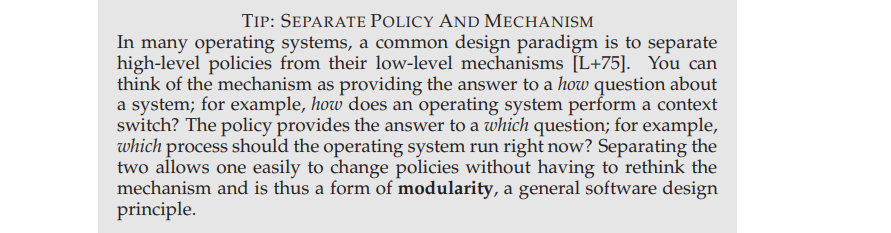


## 4.2 Process API
idea of what must be included in any interface of an operating system

These APIs, in some form, are available on any modern operating system.
- **Create** - a new process
    - When you type a command into the shell, or double-click on an application icon, the OS is invoked to create a new process to run the program you have indicated. 
- **Destroy** - a process
    - Of course, many processes will run and just exit by themselves when complete; when they don’t, however, the user may wish to kill them, and thus an interface to halt a runaway process is quite useful. 
- **Wait** - for a process to stop running
- **Miscellaneous Control** - sometimes other controls that are possible
    - eg: suspend a process (stop it from running for a while) and then resume it (continue it running) 
- **Status** - info about a process
    - how long it has run for, or what state it is in.
 


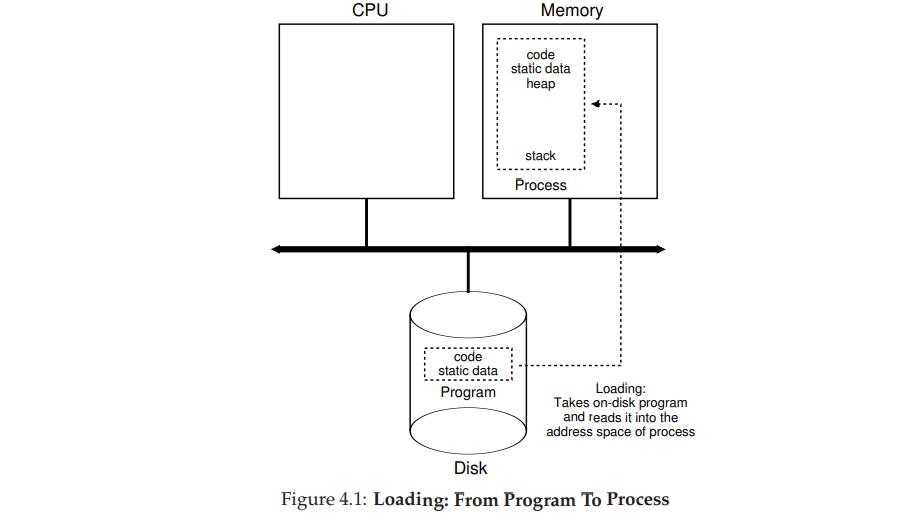



## 4.3 Process Creation: A Little More Detail
**How programs are transformed into processes? how does the OS get a program up and running? How does process creation actually work?**

1. The first thing that the OS must do to run a program is to load its code and any static data (e.g., initialized variables) into memory, into the address space of the process
- Programs initially reside on disk (or, in some modern systems, flash-based SSDs) in some kind of executable format; thus, the process of loading a program and static data into memory requires the OS to read those bytes from disk and place them in memory somewhere
    - **eagerly** - loaded at once before the program is run
    - **lazily** - load pieces of data only as they're needed by the program
        - **paging** and **swapping**
     
Once the code and static data are loaded into memory, there are a few other things the OS needs to do before running the process.

2. Some memory must be allocated for the program’s run-time stack (or just stack).
- C programs use the stack for local variables, function parameters, and return addresses; the OS allocates this memory and gives it to the process.

The OS may also create some initial memory for the program’s **heap**. In C programs, the heap is used for explicitly requested dynamicallyallocated data; programs request such space by calling `malloc()` and free it explicitly by calling `free()`

3. The OS will also do some other initialization tasks, particularly as related to input/output (I/O). For example, in UNIX systems, each process
by default has three open **file descriptors**, for standard input, output, and error; these descriptors let programs easily read input from the terminal as well as print output to the screen.

By loading the code and static data into memory, by creating and initializing a stack, and by doing other work as related to I/O setup, the OS
has now (finally) set the stage for program execution.

4. It thus has one **last task**: to start the program running at the entry point, namely `main()`. 
- By jumping to the main() routine (through a specialized mechanism that we will discuss next chapter), the OS transfers control of the CPU to the newly-created process, and thus the program begins its execution.

## 4.4 Process States
different **states** a process can be in at a given time

**In a simplified view, a process can be in one of three states:**
- **Running**: In the running state, a process is running on a processor. This means it is executing instructions.
- **Ready**: In the ready state, a process is ready to run but for some reason the OS has chosen not to run it at this given moment.
- **Blocked**: In the blocked state, a process has performed some kind of operation that makes it not ready to run until some other event takes place.
    - A common example: when a process initiates an I/O request to a disk, it becomes blocked and thus some other process can use the processor.
 
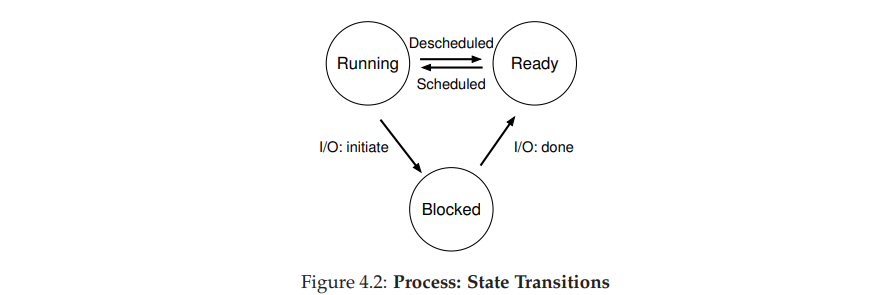

a process can be moved between the ready and running states at the discretion of the OS
- Being moved from ready to running means the process has been **scheduled**
- being moved from running to ready means the process has been **descheduled**.

## 4.5 Data Structures
The OS is a program, and like any program, it has some key data structures that track various relevant pieces of information

Eg: To track the state of each process the OS likely will keep some kind of **process list**

**Figure 4.3** shows what type of information an OS needs to track about each process in the xv6 kernel [CK+08]
- Similar process structures exist in “real” operating systems such as Linux, Mac OS X, or Windows; look them up and see how much more complex they are.

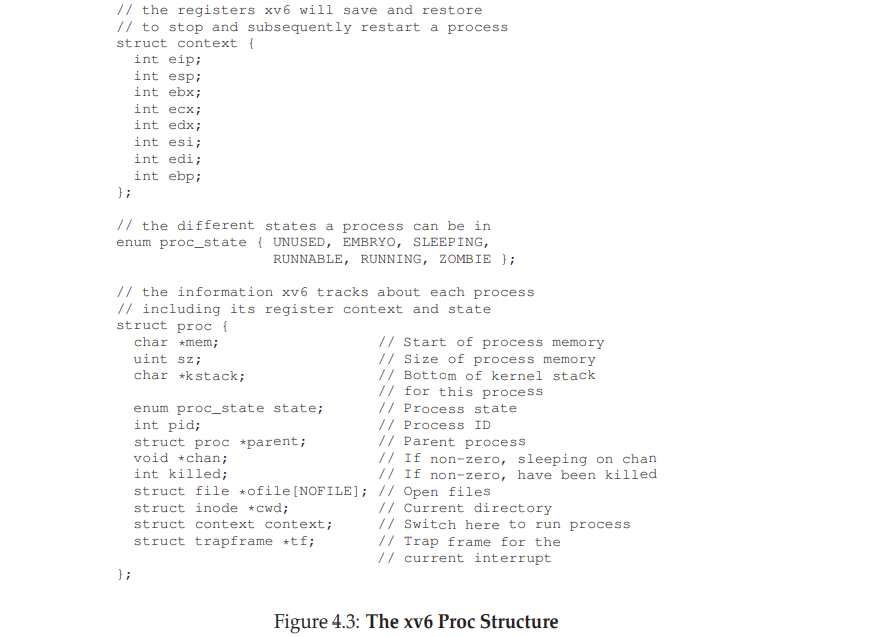

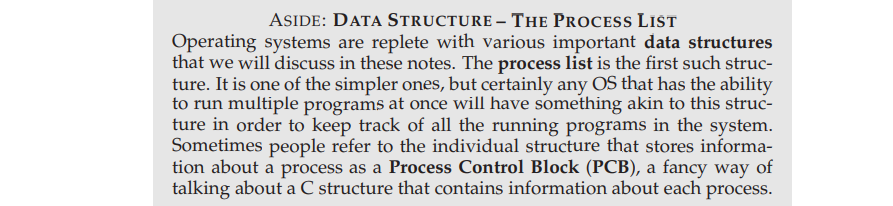


# 5 - Interlude: Process API
UNIX presents one of the most intriguing ways to create a new process with a pair of system calls: `fork()` and `exec()`

A third routine, **wait()**, can be used by a process wishing to wait for a process it has created to complete.

## 5.1 The fork() System Call
used to create a new process

be forewarned: it is certainly the strangest routine you will ever call

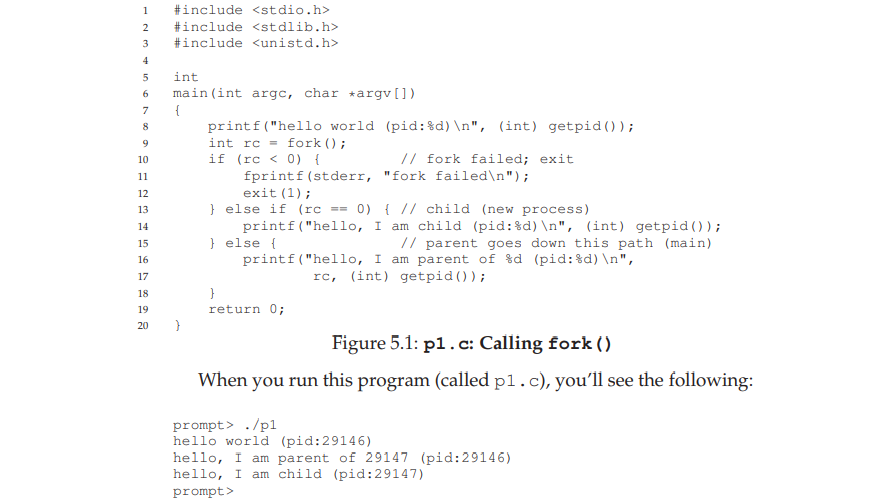

in UNIX systems, the PID is used to name the process if one wants to do something with the process, such as (for example) stop it from running

The process calls the `fork()` system call, which the OS provides as a way to create a new process

The newly-created process (called the child, in contrast to the creating parent) doesn’t start running at main(), like you might expect (note, the “hello, world” message only got printed out once); rather, it just comes into life as if it had called fork() itself.

You might have noticed: the child isn’t an exact copy. Specifically, although it now has its own copy of the address space (i.e., its own private memory), its own registers, its own PC, and so forth, the value it returns to the caller of fork() is different.

Specifically, while the parent receives the PID of the newly-created child, the child is simply returned a 0. This differentiation is useful, because it is simple then to write the code that handles the two different cases (as above). 

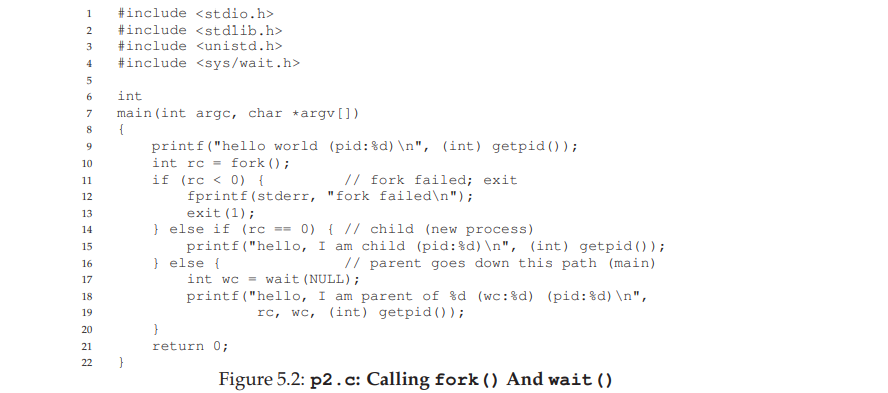



You might also have noticed: the output is **not deterministic**. When the child process is created, there are now two active processes in the system that we care about: the parent and the child. Assuming we are running on a system with a single CPU (for simplicity), then either the child or the parent might run at that point

In our example (above), the parent did and thus printed out its message first. In other cases, the opposite might happen, as we show in this output trace:

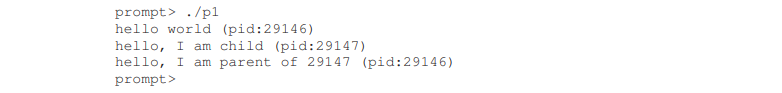

The CPU **scheduler**, a topic we’ll discuss in great detail soon, determines which process runs at a given moment in time; because the scheduler is complex, we cannot usually make strong assumptions about what it will choose to do, and hence which process will run first.

This **nondeterminism**, as it turns out, leads to some interesting problems, particularly in **multi-threaded programs**; hence, we’ll see a lot more nondeterminism when we study **concurrency** in the second part of the book.




## 5.2 Adding wait() System Call
Sometimes it is quite useful for a parent to wait for a child process to finish what it has been doing. 

This task is accomplished with the `wait()` system call  (or its more complete sibling `waitpid()`)

In this example (p2.c), the parent process calls wait() to delay its execution until the child finishes executing. When the child is done, wait() returns to the parent.

**Adding a `wait()` call to the code above makes the output deterministic**.

With this code, we now know that the child will always print first

Why do we know that? Well, it might simply run first, as before, and thus print before the parent. However, if the parent does happen to run first, it will immediately call wait(); this system call won’t return until the child has run and exited

Thus, even when the parent runs first, it politely waits for the child to finish running, then wait() returns, and then the parent prints its message.

## 5.3 Finally, the exec() System Call
This system call is useful when you want to run a program that is different from the calling program

For example, calling fork() in p2.c is only useful if you want to keep running copies of the same program.

However, often you want to run a different program; `exec()` does just that

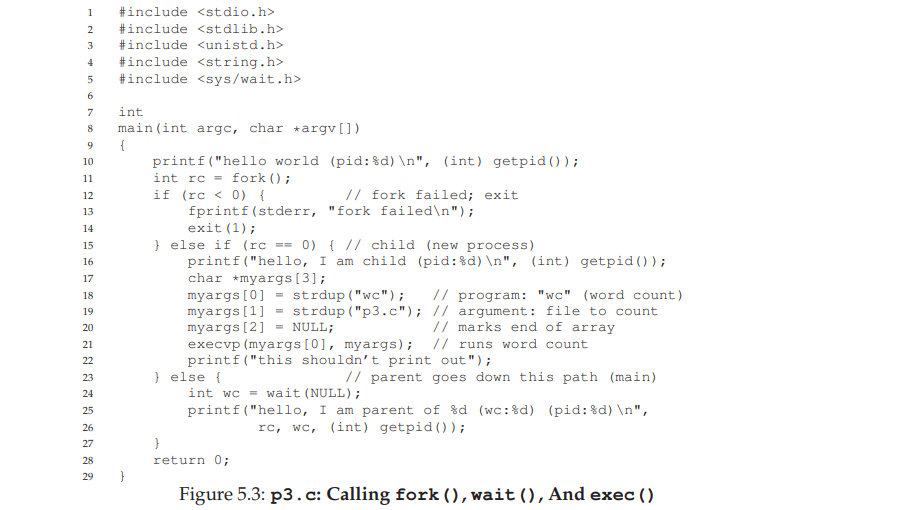

What it does: given the name of an executable (e.g., wc), and some arguments (e.g., p3.c), it **loads** code (and static data) from that executable and overwrites its current code segment (and current static data) with it; the heap and stack and other parts of the memory space of the program are reinitialized. 

it does not create a new process; rather, it transforms the currently running program (formerly p3) into a different running program (wc).

After the exec() in the child, it is almost as if p3.c never ran; a successful call to exec() never returns.

## 5.4 Why? Motivating the API
Why would we build such an odd interface to what should be the simple act of creating a new process? 

the separation of fork() and exec() is essential in building a UNIX shell, because it lets the shell run code after the call to `fork()` but before the call to `exec()`; this code can alter the environment of the about-to-be-run program, and thus enables a variety of interesting features to be readily built.

There are lots of ways to design APIs for process creation; however, the combination of fork() and exec() are simple and immensely powerful. Here, the UNIX designers simply got it right.

The shell is just a user program. 
- It shows you a prompt and then waits for you to type something into it. You then type a command (i.e., the name of an executable program, plus any arguments) into it; in most cases, the shell then figures out where in the file system the executable resides
- calls `fork()` to create a new child process to run the command
- calls some variant of `exec()` to run the command
- then waits for the command to complete by calling `wait()`
- When the child completes, the shell returns from `wait()` and prints out a prompt again, ready for your next command.

## 5.5 Other Parts of the API
Beyond fork(), exec(), and wait(), there are a lot of other interfaces for interacting with processes in UNIX systems. 

For example, the kill() system call is used to send signals to a process, including directives to go to sleep, die, and other useful imperatives.

## 5.6 Summary
We have introduced some of the APIs dealing with UNIX process creation: fork(), exec(), and wait(). However, we have just skimmed the surface. 

For more detail, read <mark>Stevens and Rago [SR05]</mark>, of course, particularly the chapters on Process Control, Process Relationships, and Signals. There is much to extract from the wisdom therein.


# 6 - Mechanism: Limited Direct Execution
In order to virtualize the CPU, the operating system needs to somehow share the physical CPU among many jobs running seemingly at the same time

**The basic idea is simple: run one process for a little while, then run another one, and so forth**. 

By time sharing the CPU in this manner, **virtualization** is achieved.

**Challenges in building such virtualization machinery:**
1. **performance:** how can we implement virtualization without adding excessive overhead to the system? 
2. **control:** how can we run processes efficiently while retaining control over the CPU?

Control is particularly important to the OS, as it is in charge of resources; without control, a process could simply run forever and take over the machine, or access information that it should not be allowed to access. 

**Attaining performance while maintaining control is thus one of the central challenges in building an operating system**

## 6.1 Basic Technique: Limited Direct Execution
To make a program run as fast as one might expect, not surprisingly OS developers came up with a technique, which we call **limited direct execution**.

The “direct execution” part of the idea is simple: just run the program directly on the CPU. Thus, when the OS wishes to start a program running, it creates a process entry for it in a process list, allocates some memory pages for it, loads the program code into memory (from disk), locates its entry point (i.e., the main() routine or something similar), jumps to it, and starts running the user’s code.

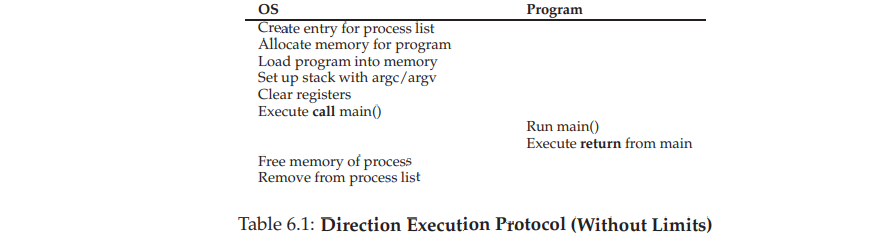

But this approach gives rise to a few problems in our quest to virtualize the CPU. 

The first is simple: if we just run a program, how can the OS make sure the program doesn’t do anything that we don’t want it to do, while still running it efficiently? 

The second: when we are running a process, how does the operating system stop it from running and switch to another process, thus implementing the time sharing we require to virtualize the CPU?

In answering these questions below, we’ll get a much better sense of what is needed to virtualize the CPU. In developing these techniques, we’ll also see where the “limited” part of the name arises from; **without limits on running programs, the OS wouldn’t be in control of anything and thus would be “just a library”** – a very sad state of affairs for an aspiring operating system! 

## 6.2 Problem #1: Restricted Operations
**THE CRUX: HOW TO PERFORM RESTRICTED OPERATIONS
A process must be able to perform I/O and some other restricted operations, but without giving the process complete control over the system.
How can the OS and hardware work together to do so?**

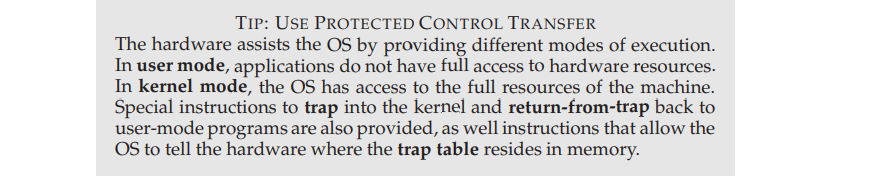

the approach we take is to introduce a new processor mode, known as **user mode**; code that runs in user mode is restricted in what it can do.
- For example, when running in user mode, a process can’t issue I/O requests; doing so would result in the processor raising an exception; the OS would then likely kill the process

In contrast to user mode is **kernel mode**, which the operating system (or kernel) runs in. In this mode, code that runs can do what it likes, including privileged operations such as issuing I/O requests and executing all types of restricted instructions.

We are still left with a challenge, however: what should a user process do when it wishes to perform some kind of privileged operation, such as reading from disk? To enable this, virtually all modern hardware provides the ability for user programs to perform a **system call**.

**system calls** allow the kernel to carefully expose certain key pieces of functionality to user programs, such as accessing the file system, creating and destroying processes, communicating with other processes, and allocating more memory
- Most operating systems provide a few hundred calls (see the POSIX standard for details [P10]); early Unix systems exposed a more concise subset of around twenty calls

To execute a system call, a program must execute a special **trap** instruction
- This instruction simultaneously jumps into the kernel and raises the privilege level to kernel mode; once in the kernel, the system can now perform whatever privileged operations are needed (if allowed), and thus do the required work for the calling process.
- When finished, the OS calls a special return-from-trap instruction

The hardware needs to be a bit careful when executing a trap, in that it must make sure to save enough of the caller’s register state in order to be able to return correctly when the OS issues the return-from-trap instruction
- On x86, for example, the processor will push the program counter, flags, and a few other registers onto a per-process kernel stack; the return-from-trap will pop these values off the stack and resume execution of the user-mode program

the kernel must carefully control what code executes upon a trap. The kernel does so by setting up a **trap table** at boot time
- When the machine boots up, it does so in privileged (kernel) mode, and thus is free to configure machine hardware as need be.
- One of the first things the OS thus does is to tell the hardware what code to run when certain exceptional events occur

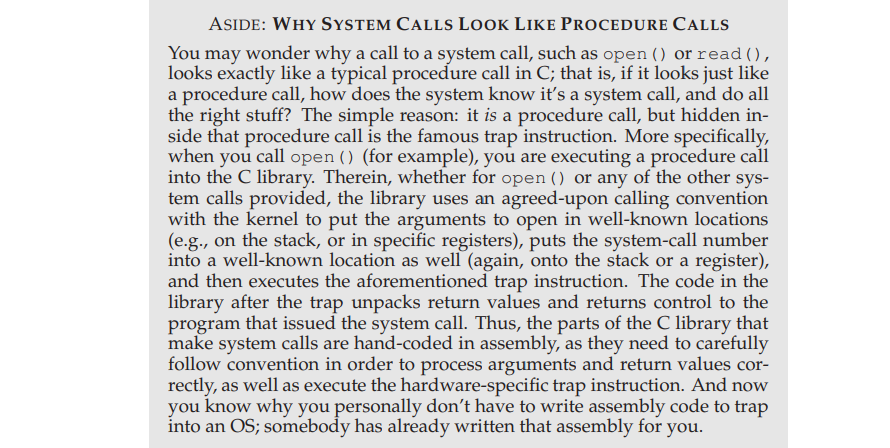

**There are two phases in the LDE protocol:**
1. In the first (at boot time), the kernel initializes the trap table, and the CPU remembers its location for subsequent use.
2. In the second (when running a process), the kernel sets up a few things (e.g., allocating a node on the process list, allocating memory) before using a return-from-trap instruction to start the execution of the process; this switches the CPU to user mode and begins running the process.

## 6.3 Problem #2: Switching Between Processes
tricky: specifically, if a process is running on the CPU, this by definition means the OS is not running.

If the OS is not running, how can it do anything at all? (hint: it can’t) 

there is clearly no way for the OS to take an action if it is not running on the CPU. Thus we arrive at the crux of the problem.

**THE CRUX: HOW TO REGAIN CONTROL OF THE CPU
How can the operating system regain control of the CPU so that it can switch between processes?**

#### A Cooperative Approach: Wait For System Calls
Most processes, as it turns out, transfer control of the CPU to the OS quite frequently by making system calls, for example, to open a file and subsequently read it, or to send a message to another machine, or to create a new process.

Systems like this often include an explicit **yield** system call, which does nothing except to transfer control to the OS so it can run other processes.

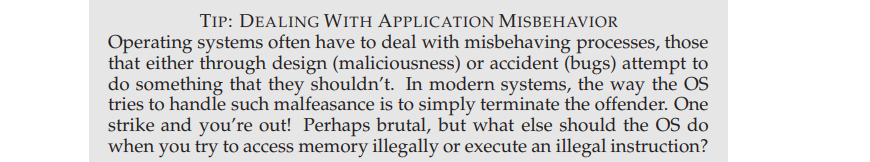

Applications also transfer control to the OS when they do something illegal. For example, if an application divides by zero, or tries to access memory that it shouldn’t be able to access, it will generate a trap to the OS

Thus, in a cooperative scheduling system, the OS regains control of the CPU by waiting for a system call or an illegal operation of some kind to take place. 

#### A Non-Cooperative Approach: The OS Takes Control
Without some additional help from the hardware, it turns out the OS can’t do much at all when a process refuses to make system calls (or mistakes) and thus return control to the OS

In fact, in the cooperative approach, your only recourse when a process gets stuck in an infinite loop is to resort to the age-old solution to all problems in computer systems: reboot the machine.

**THE CRUX: HOW TO GAIN CONTROL WITHOUT COOPERATION
How can the OS gain control of the CPU even if processes are not being cooperative? What can the OS do to ensure a rogue process does not take over the machine?**

Answer: a **timer interrupt**
- A timer device can be programmed to raise an interrupt every so many milliseconds; when the interrupt is raised, the currently running process is halted, and a pre-configured interrupt handler in the OS runs
- At this point, the OS has regained control of the CPU, and thus can do what it pleases: stop the current process, and start a different one

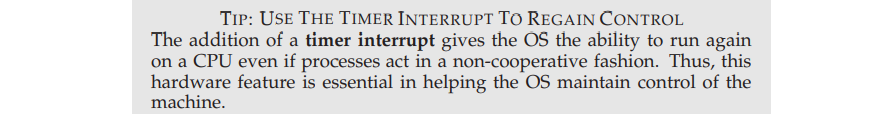

the OS must inform the hardware of which code to run when the timer interrupt occurs; thus, at boot time, the OS does exactly that

Second, also during the boot sequence, the OS must start the timer, which is of course a privileged operation

**Once the timer has begun, the OS can thus feel safe in that control will eventually be returned to it, and thus the OS is free to run user programs**

The timer can also be turned off (also a privileged operation), something we will discuss later when we understand concurrency in more detail

#### Saving and Restoring Context
Now that the OS has regained control, whether cooperatively via a system call, or more forcefully via a timer interrupt, a decision has to be made: whether to continue running the currently-running process, or switch to a different one

This decision is made by a part of the operating system known as the **scheduler**

If the decision is made to switch, the OS then executes a low-level piece of code which we refer to as a **context switch**

A context switch is conceptually simple: all the OS has to do is save a few register values for the currently-executing process (onto its kernel stack, for example) and restore a few for the soon-to-be-executing process (from its kernel stack)

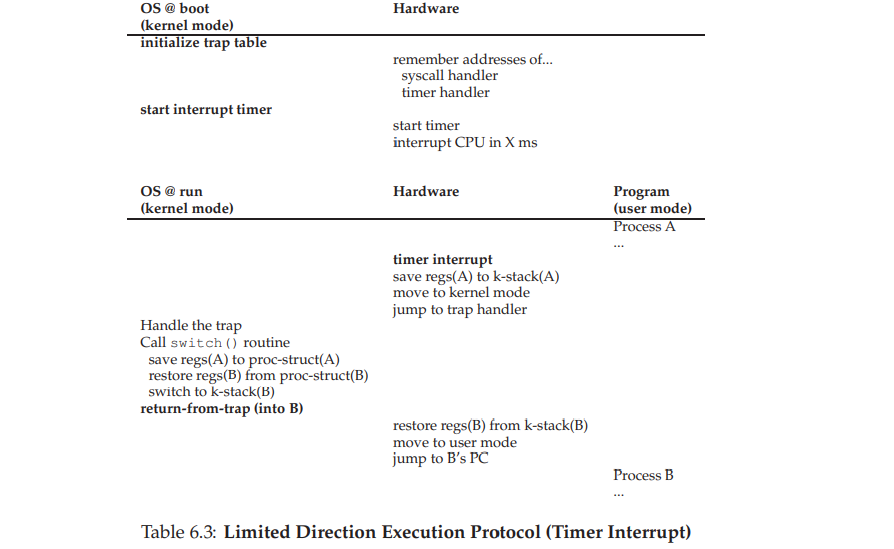



## 6.4 Worried About Concurrency?
the OS needs to be concerned as to what happens if, during interrupt or trap handling, another interrupt occurs

This, in fact, is the exact topic of the entire second piece of this book, on **concurrency**

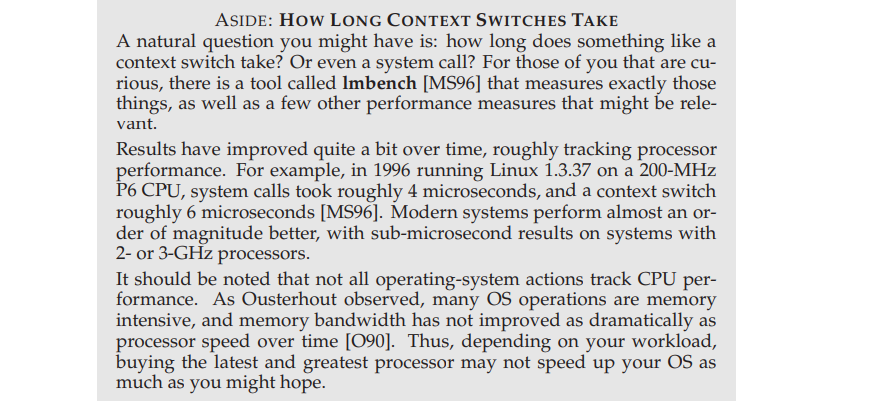

One simple thing an OS might do is disable interrupts during interrupt processing; doing so ensures that when
one interrupt is being handled, no other one will be delivered to the CPU.
Of course, the OS has to be careful in doing so; disabling interrupts for
too long could lead to lost interrupts, which is (in technical terms) bad.

Operating systems also have developed a number of sophisticated **locking** schemes to protect concurrent access to internal data structures.
- This enables multiple activities to be on-going within the kernel at the same time, particularly useful on multiprocessors

## 6.5 Summary
We have described some key low-level mechanisms to implement CPU virtualization, a set of techniques which we collectively refer to as **limited direct execution**

The basic idea is straightforward: just run the program you want to run on the CPU, but first make sure to set up the hardware so as to limit what the process can do without OS assistance.

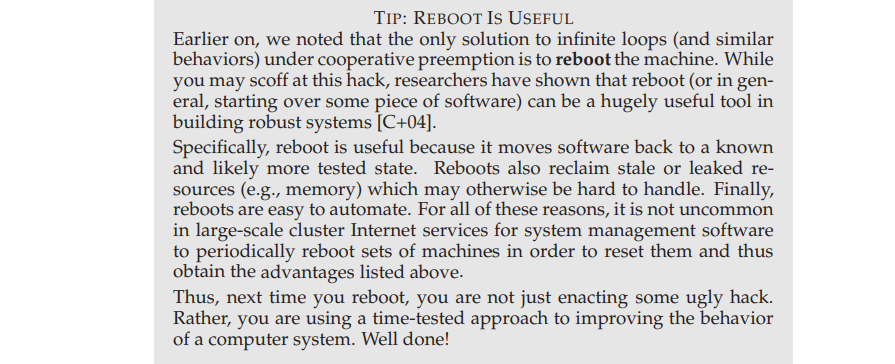

We thus have the basic mechanisms for virtualizing the CPU in place. 

But a major question is left unanswered: which process should we run at a given time? It is this question that the scheduler must answer, and thus the next topic of our study. 



# 7 - Scheduling: Introduction
- **scheduling policies** - sometimes called **disciplines**

## 7.1 Workload Assumptions
simplifying assumptions about the processes running in the system, sometimes collectively called the **workload**

**Determining the workload is a critical part of building policies, and the more you know about workload, the more fine-tuned your policy can be**

we will work towards developing a **fully-operational scheduling discipline**

**We will make the following assumptions about the processes, sometimes called jobs, that are running in the system:**
1. Each job runs for the same amount of time.
2. All jobs arrive at the same time.
3. All jobs only use the CPU (i.e., they perform no I/O)
4. The run-time of each job is known.

some assumptions are more unrealistic than others in this chapter

In particular, it might bother you that the run-time of each job is known: this would make the scheduler omniscient

## 7.2 Scheduling Metrics
metric - something that we use to **measure** something 

number of different metrics that make sense in scheduling

For now, however, let us also simplify our life by simply having a single metric: **turnaround time**

The turnaround time of a job is defined as; the time at which the job completes minus the time at which the job arrived in the system

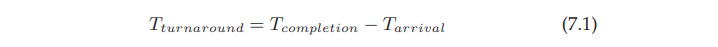

Because we have assumed that all jobs arrive at the same time, for now Tarrival = 0 and hence Tturnaround = Tcompletion. This fact will change as we relax the aforementioned assumptions.

**Note:**  turnaround time is a performance metric, which will be our primary focus this chapter

Another metric of interest is **fairness**, as measured (for example) by Jain’s Fairness Index [J91]. Performance and fairness are often at odds in scheduling - a scheduler, for example, may optimize performance but at the cost of preventing a few jobs from running, thus decreasing fairness

## 7.3 First In, First Out (FIFO)
most basic algorithm a scheduler can implement 

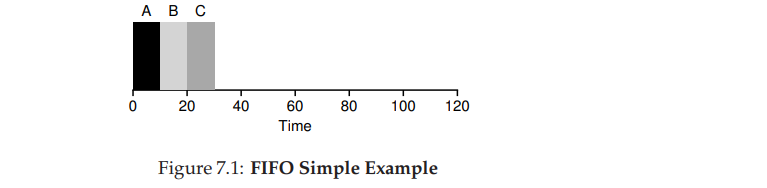

A finished at 10, B at 20, and C at 30. 

Thus, the average turnaround time for the three jobs is simply (10+20+30) / 3 = 20. Computing turnaround time is as easy as that.

Now let’s relax one of our assumptions. In particular, let’s relax assumption 1, and thus no longer assume that each job runs for the same amount of time. How does FIFO perform now? What kind of workload could you construct to make FIFO perform poorly?

let’s again assume three jobs (A, B, and C), but this time A runs for 100 seconds while B and C run for 10 each.

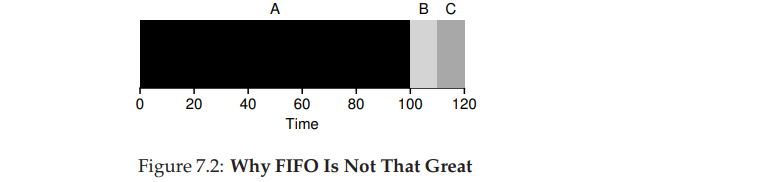



Job A runs first for the full 100 seconds before B or C even get a chance to run. 

Thus, the average turnaround time for the system is high: a painful 110 seconds (100+110+120) / 3 = 110

This problem is generally referred to as the **convoy effect** - where a number of relatively-short potential consumers of a resource get queued behind a heavyweight resource consumer.

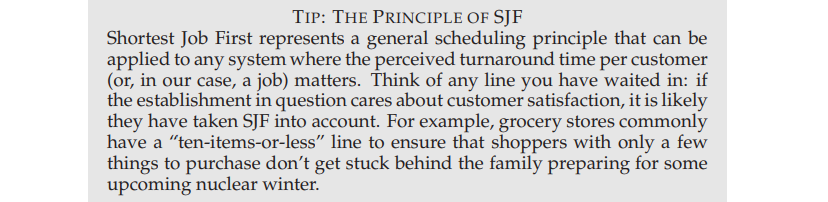



## 7.4 Shortest Job First (SJF)
ver simple solution; idea stolen from operations research and applied to scheduling of jobs in computer systems

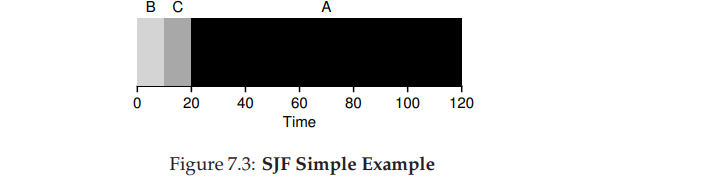

Simply by running B and C before A, SJF reduces average turnaround from 110 seconds to 50 `(10+20+120) / 3 = 50`, more than a factor of two improvement

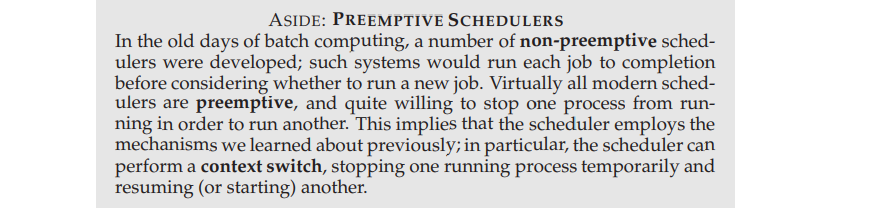



**Note:** In computing, **preemption** is the act of temporarily interrupting an executing task, with the intention of resuming it at a later time. This interrupt is done by an external scheduler with no assistance or cooperation from the task.


**now assume that jobs can arrive at any time instead of all at once:**

This time, assume A arrives at t = 0 and needs to run for 100 seconds, whereas B and C arrive at t = 10 and each need to run for 10 seconds. With pure SJF, we’d get the schedule seen in Figure 7.4.

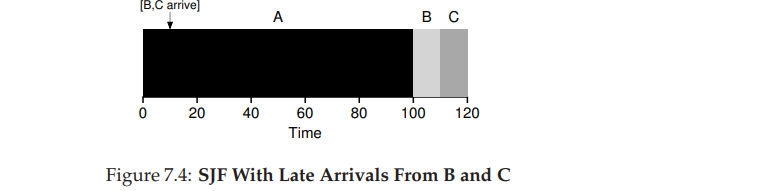

As you can see from the figure, even though B and C arrived shortly after A, they still are forced to wait until A has completed, and thus suffer the same convoy problem. Average turnaround time for these three jobs is 103.33 seconds `(100+(110−10)+(120−10)) /3`  

What can a scheduler do?

## 7.5 Shortest Time-to-Completion First (STCF)
the scheduler can certainly do something else when B and C arrive: it can preempt job A and decide to run another job, perhaps continuing A later. 

SJF by our definition is a non-preemptive scheduler, and thus suffers from the problems described above.

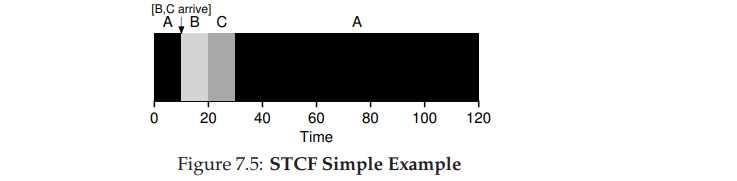

Fortunately, there is a scheduler which does exactly that: add preemption to SJF, known as the **Shortest Time-to-Completion First (STCF)** or **Preemptive Shortest Job First (PSJF)** scheduler

Any time a new job enters the system, it determines of the remaining jobs and new job, which has the least time left, and then schedules that one

The result is a much-improved average turnaround time: 50 seconds `((120−0)+(20−10)+(30−10)) / 3`

given our new assumptions, STCF is provably optimal

Thus, if we knew that job lengths, and jobs only used the CPU, and our only metric was turnaround time, STCF would be a great policy

new metric: **response time**

time from when the job arrives in a system to the first time it is scheduled. 

More formally: **Tresponse = Tfirstrun − Tarrival**

For example, if we had the schedule above (with A arriving at time 0, and B and C at time 10), the response time of each job is as follows: 0 for job A, 0 for B, and 10 for C (average: 3.33)

- STCF and related disciplines are not particularly good for response time - If three jobs arrive at the same time, for example, the third job has to wait for the previous two jobs to run in their entirety before being scheduled just once
- While great for turnaround time, this approach is quite bad for response time and interactivity

**Thus, we are left with another problem: how can we build a scheduler that is sensitive to response time?**

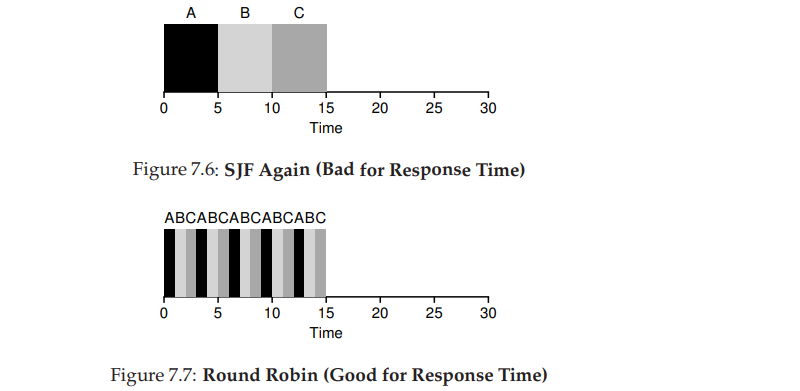




## 7.6 Round Robin
**Basic idea:** instead of running jobs to completion, RR runs a job for a **time slice** (sometimes called a **scheduling quantum**) and then switches to the next job in the run queue.

Note that the length of a time slice must be a multiple of the timer-interrupt period; thus if the timer interrupts every 10 milliseconds, the time slice could be 10, 20, or any other multiple of 10 ms.

Assume three jobs A, B, and C arrive at the same time in the system, and that they each wish to run for 5 seconds. 
- An SJF scheduler runs each job to completion before running another (Figure 7.6). 
- In contrast, RR with a time-slice of 1 second would cycle through the jobs quickly (Figure 7.7). 
- The average response time of **RR** is: 0+1+2 / 3 = 1; for **SJF**, average response time is: 0+5+10 / 3 = 5.

As you can see, the length of the time slice is critical for RR. The shorter it is, the better the performance of RR under the response-time metric
- However, making the time slice too short is problematic: suddenly the cost of context switching will dominate overall performance
- trade-off to a system designer, making it long enough to amortize the cost of switching without making it so long that the system is no longer responsive

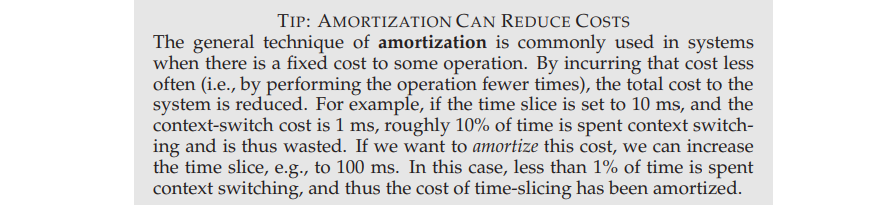

RR is indeed one of the worst policies if turnaround time is our metric

Intuitively, this should make sense: what RR is doing is stretching out each job as long as it can, by only running each job for a short bit before moving to the next

Because turnaround time only cares about when jobs finish, RR is nearly pessimal, even worse than simple FIFO in many cases

More generally, any policy (such as RR) that is **fair**, i.e., that evenly divides the CPU among active processes on a small time scale, will perform
poorly on metrics such as turnaround time

**Trade-off:** if you are willing to be unfair, you can run shorter jobs to completion, but at the cost of response time; if you instead value fairness, response time is lowered, but at the cost of turnaround time

**We have developed two types of schedulers:**
1. The first type (SJF, STCF) optimizes turnaround time, but is bad for response time. 
2. The second type (RR) optimizes response time but is bad for turnaround.

And we still have two assumptions which need to be relaxed: assumption 3 (that jobs do no I/O), and assumption 4 (that the run-time of each job is known). Let’s tackle those assumptions next.

## 7.7 Incorporating I/O
First we will relax assumption 3 – of course all programs perform I/O.

Imagine a program that didn’t take any input: it would produce the same output each time.

Imagine one without output: it is the proverbial tree falling in the forest, with no one to see it; it doesn’t matter that it ran.

A scheduler clearly has a decision to make when a job initiates an I/O request, because the currently-running job won’t be using the CPU during the I/O; it is blocked waiting for I/O completion

If the I/O is sent to a hard disk drive, the process might be blocked for a few milliseconds or longer, depending on the current I/O load of the drive. Thus, the scheduler should probably schedule another job on the CPU at that time

To understand this issue better, let us assume we have two jobs, A and B, which each need 50 ms of CPU time. However, there is one obvious difference: A runs for 10 ms and then issues an I/O request (assume here that I/Os each take 10 ms), whereas B simply uses the CPU for 50 ms and performs no I/O. The scheduler runs A first, then B after

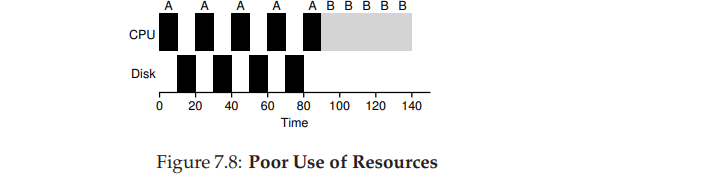

Assume we are trying to build a STCF scheduler. How should such a
scheduler account for the fact that A is broken up into 5 10-ms sub-jobs,
whereas B is just a single 50-ms CPU demand? Clearly, just running one
job and then the other without considering how to take I/O into account
makes little sense.

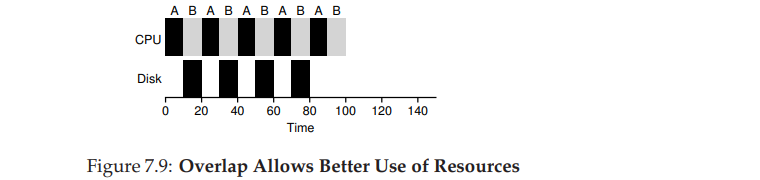

A common approach is to treat each 10-ms sub-job of A as an independent job.

Thus, when the system starts, its choice is whether to schedule a 10-ms A or a 50-ms B. With STCF, the choice is clear: choose the shorter one, in this case A.

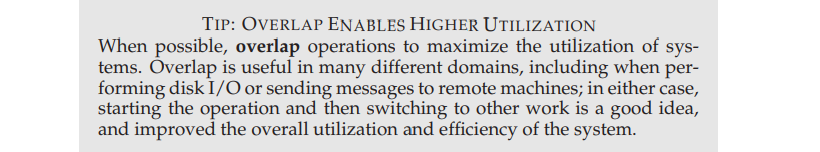

And thus we see how a scheduler might incorporate I/O. By treating
each CPU burst as a job, the scheduler makes sure processes that are “interactive” get run frequently. While those interactive jobs are performing
I/O, other CPU-intensive jobs run, thus better utilizing the processor



## 7.8 No More Oracle
With a basic approach to I/O in place, we come to our final assumption: that the scheduler knows the length of each job. As we said before,
this is likely the worst assumption we could make. In fact, in a generalpurpose OS (like the ones we care about), the OS usually knows very little
about the length of each job. Thus, how can we build an approach that behaves like SJF/STCF without such a priori knowledge? Further, how can
we incorporate some of the ideas we have seen with the RR scheduler so
that response time is also quite good?

## 7.9 Summary
We have introduced the basic ideas behind scheduling and developed two families of approaches.
1. The first runs the shortest job remaining and thus optimizes turnaround time
2. the second alternates between all jobs and thus optimizes response time.

Both are bad where the other is good, alas, an inherent trade-off common in systems.

We have also seen how we might incorporate I/O into the picture, but have still not solved the problem of the fundamental inability of the OS to see into the future - overcome this problem, by building a scheduler that uses the recent past to predict the future -known as the **multi-level feedback queue** (next chapter)

# 8 - Scheduling: The Multi-Level Feedback Queue 

one of the most well-known approaches to scheduling, known as the **Multi-level Feedback Queue (MLFQ)**

The fundamental problem MLFQ tries to address is two-fold
1. optimize **turnaround time**
2. make a system feel **responsive** to interactive users / minimize **response time**

Thus, our problem: given that we in general do not know anything about a process, how can we build a scheduler to achieve these goals? 

How can the scheduler learn, as the system runs, the characteristics of the jobs it is running, and thus make better scheduling decisions?

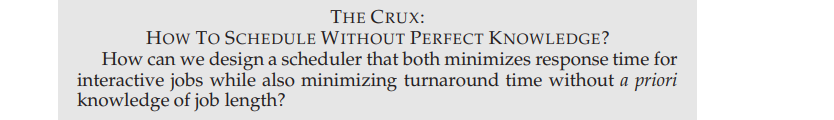

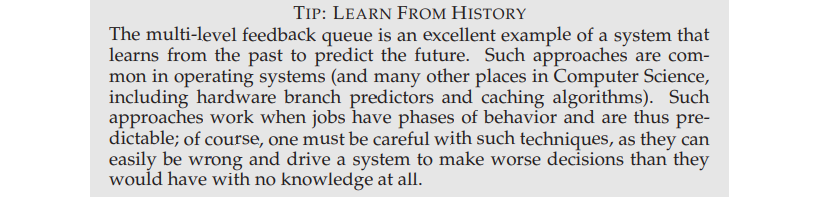


## 8.1 MLFQ: Basic Rules
**Multi-level Feedback Queue (MLFQ)**

In our treatment, the MLFQ has a number of distinct **queues**, each assigned a different **priority level**

MLFQ uses priorities to decide which job should run at a given time: a job with higher priority (i.e., a job on a higher queue) is chosen to run.

Of course, more than one job may be on a given queue, and thus have the **same** priority. In this case, we will just use **round-robin** scheduling among those jobs.

Thus, the key to MLFQ scheduling lies in how the scheduler sets priorities

**Rather than giving a fixed priority to each job, MLFQ varies the priority of a job based on its observed behavior.**
- If, for example, a job repeatedly relinquishes the CPU while waiting for input from the keyboard, MLFQ will keep its priority high, as this is how an interactive process might behave.
- If, instead, a job uses the CPU intensively for long periods of time, MLFQ will reduce its priority

In this way, MLFQ will try to learn about processes as they run, and thus use the history of the job to predict its future behavior.

**Thus, we arrive at the first two basic rules for MLFQ:**
- Rule 1: If Priority(A) > Priority(B), A runs (B doesn’t).
- Rule 2: If Priority(A) = Priority(B), A & B run in RR.

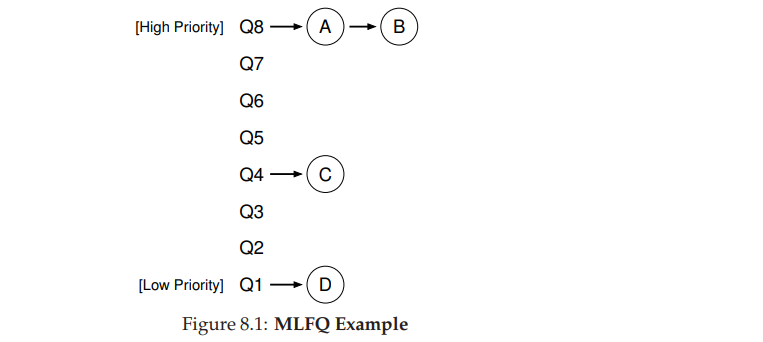

## 8.2 Attempt #1: How to Change Priority
We now must decide how MLFQ is going to change the priority level of a job (and thus which queue it is on) over the lifetime of a job

**Here is our first attempt at a priority adjustment algorithm:**
- Rule 3: When a job enters the system, it is placed at the highest priority (the topmost queue).
- Rule 4a: If a job uses up an entire time slice while running, its priority is reduced (i.e., it moves down one queue).
- Rule 4b: If a job gives up the CPU before the time slice is up, it stays at the same priority level.

##### Example 1: A Single Long-Running Job
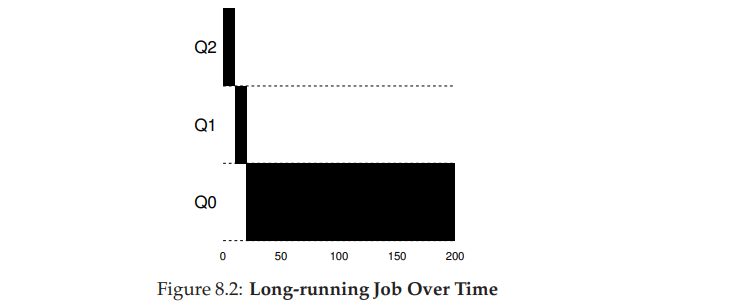

the job enters at the highest priority
(Q2). After a single time-slice of 10 ms, the scheduler reduces the job’s
priority by one, and thus the job is on Q1. After running at Q1 for a time
slice, the job is finally lowered to the lowest priority in the system (Q0),
where it remains

##### Example 2: Along Came A Short Job
a more complicated example, and hopefully see how MLFQ tries to approximate SJF

In this example, there are two jobs: A, which is a long-running CPU-intensive job, and B, which is a short-running interactive job. Assume A has been running for some time, and then B arrives

Figure 8.3 plots the results of this scenario. A (shown in black) is running along in the lowest-priority queue (as would any long-running CPUintensive jobs); B (shown in gray) arrives at time T = 100, and thus is inserted into the highest queue; as its run-time is short (only 20 ms), B
completes before reaching the bottom queue, in two time slices; then A resumes running (at low priority).

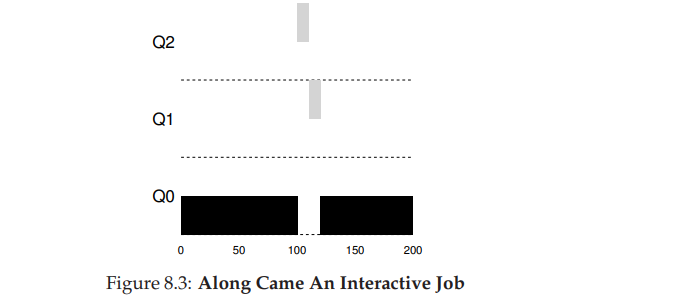

From this example, you can hopefully understand one of the major
goals of the algorithm: because it doesn’t know whether a job will be a
short job or a long-running job, it first assumes it might be a short job, thus
giving the job high priority. If it actually is a short job, it will run quickly
and complete; if it is not a short job, it will slowly move down the queues,
and thus soon prove itself to be a long-running more batch-like process.
In this manner, MLFQ approximates SJF.

##### Example 3: What About I/O?
As Rule 4b states above, if a process gives up the processor before using up its time slice, we keep it at the same priority level.

The intent of this rule is simple: if an interactive job, for example, is doing a lot of I/O (say by waiting for user input from the keyboard or mouse), it will relinquish the CPU before its time slice is complete; in such case, we don’t wish to penalize the job and thus simply keep it at the same level

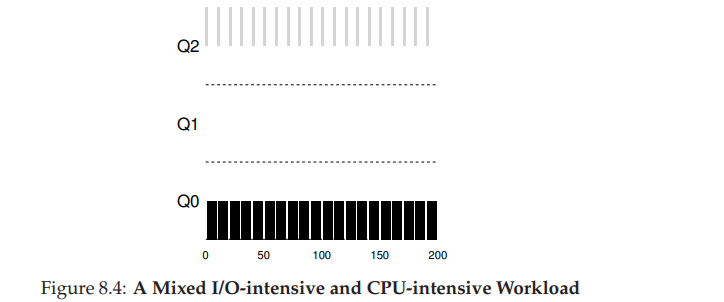

Figure 8.4 shows an example of how this works, with an interactive job B (shown in gray) that needs the CPU only for 1 ms before performing an I/O competing for the CPU with a long-running batch job A (shown in black). The MLFQ approach keeps B at the highest priority because B keeps releasing the CPU; if B is an interactive job, MLFQ further achieves its goal of running interactive jobs quickly.

##### Problems With Our Current MLFQ
We thus have a basic MLFQ. It seems to do a fairly good job, sharing the CPU fairly between long-running jobs, and letting short or I/O-intensive interactive jobs run quickly. 

Unfortunately, the approach we have developed thus far contains serious flaws.

1. First, there is the problem of **starvation**: if there are “too many” interactive jobs in the system, they will combine to consume all CPU time,
and thus long-running jobs will never receive any CPU time (they **starve**).
2. Second, a smart user could rewrite their program to **game the scheduler**
- The algorithm we have described is susceptible to the following attack: before the time slice is over, issue an I/O operation (to some file you don’t care about) and thus relinquish the CPU; doing so allows you to remain in the same queue, and thus gain a higher percentage of CPU time.
- When done right (e.g., by running for 99% of a time slice before relinquishing the CPU), a job could nearly monopolize the CPU.

## 8.3 Attempt #2: The Priority Boost
**Simple idea:** periodically **boost** the priority of all the jobs in system

- Rule 5: After some time period S, move all the jobs in the system to the topmost queue

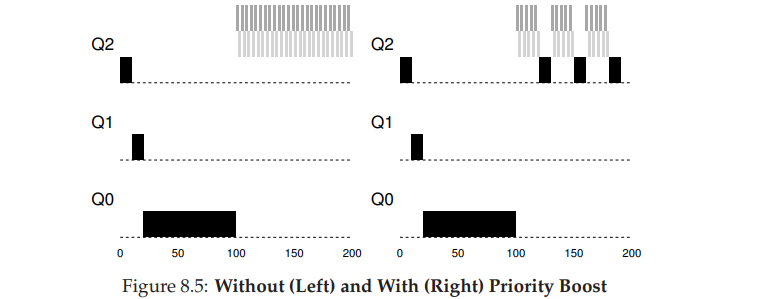

## 8.4 Attempt #3: Better Accounting
We now have one more problem to solve: how to prevent gaming of our scheduler?

The solution here is to perform better **accounting** of CPU time at each level of the MLFQ

Instead of forgetting how much of a time slice a process used at a given level, the scheduler should keep track; once a process has used its allotment, it is demoted to the next priority queue

-  Rule 4: Once a job uses up its time allotment at a given level (regardless of how many times it has given up the CPU), its priority is reduced (i.e., it moves down one queue).

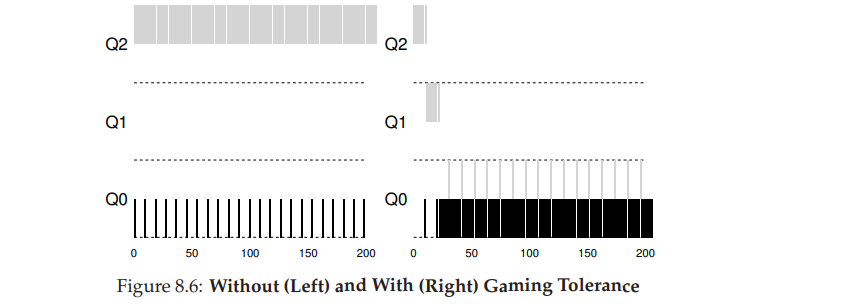

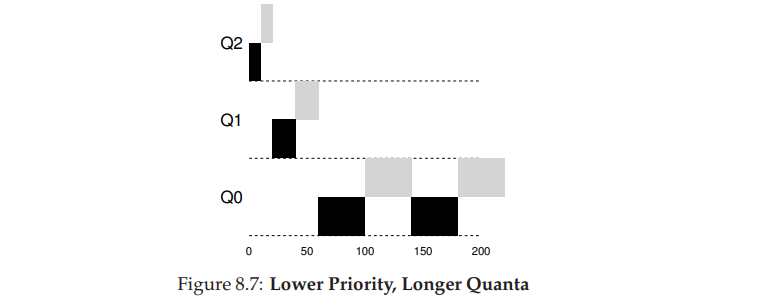

Let’s look at an example. Figure 8.6 shows what happens when a
workload tries to game the scheduler with the old Rules 4a and 4b (on
the left) as well the new anti-gaming Rule 4. Without any protection from
gaming, a process can issue an I/O just before a time slice ends and thus
dominate CPU time. With such protections in place, regardless of the
I/O behavior of the process, it slowly moves down the queues, and thus
cannot gain an unfair share of the CPU

## 8.5 Tuning MLFQ And Other Issues
One big question is how to **parameterize** such a scheduler

For example, 
- how many queues should there be? 
- How big should the time slice be per queue? 
- How often should priority be boosted in order to avoid starvation and account for changes in behavior?

no easy answers to these questions, and thus only some experience with workloads and subsequent tuning of the scheduler will lead to a satisfactory balance

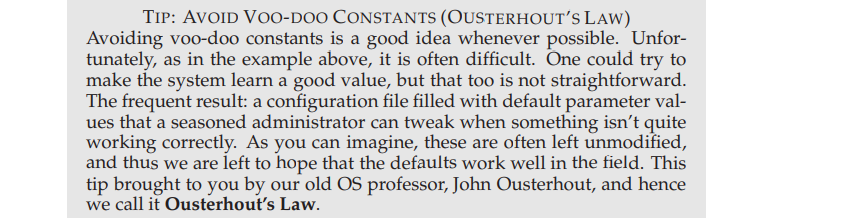

Finally, many schedulers have a few other features that you might encounter. For example, some schedulers reserve the highest priority levels
for operating system work; thus typical user jobs can never obtain the
highest levels of priority in the system. Some systems also allow some
user advice to help set priorities; for example, by using the command-line
utility nice you can increase or decrease the priority of a job (somewhat)
and thus increase or decrease its chances of running at any given time.
See the man page for more.

## 8.6 MLFQ: Summary
**MLFQ** - has multiple levels of queues, and uses feedback to determine the priority of a given job

History is its guide: pay attention to how jobs behave over time and treat them accordingly.

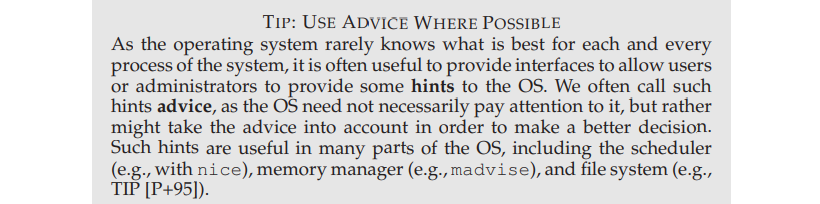

**The refined set of MLFQ rules:**
- Rule 1: If Priority(A) > Priority(B), A runs (B doesn’t).
- Rule 2: If Priority(A) = Priority(B), A & B run in RR.
- Rule 3: When a job enters the system, it is placed at the highest priority (the topmost queue).
- Rule 4: Once a job uses up its time allotment at a given level (regardless of how many times it has given up the CPU), its priority is reduced (i.e., it moves down one queue).
- Rule 5: After some time period S, move all the jobs in the system to the topmost queue.

MLFQ is interesting because instead of demanding a priori knowledge of the nature of a job, it instead observes the execution of a job and prioritizes it accordingly

In this way, it manages to achieve the best of both worlds: it can deliver excellent overall performance (similar to SJF/STCF) for short-running interactive jobs, and is fair and makes progress for longrunning CPU-intensive workloads.

For this reason, many systems, including BSD UNIX derivatives, Solaris, and Windows NT and subsequent Windows operating systems use a form of MLFQ as their base scheduler

# 9 - Scheduling: Proportional Share
**proportional-share** scheduler AKA. **fair-share** scheduler

**concept:** instead of optimizing for turnaround or response time, a scheduler might instead try to guarantee that each job obtain a certain percentage of CPU time

**lottery scheduling**; basic idea: every so often, hold a lottery to determine which process should get to run next; processes that should run more often should be given more chances to win the lottery

**CRUX: HOW TO SHARE THE CPU PROPORTIONALLY - How can we design a scheduler to share the CPU in a proportional manner? What are the key mechanisms for doing so? How effective are they?**

## 9.1 Basic Concept: Tickets Represent Your Share
Underlying lottery scheduling is one very basic concept: **tickets** - used to represent the share of a resource that a process (or user or whatever) should receive

**Eg:** two processes, A and B. A has 75 tickets while B has only 25. A receives 75% of the CPU and B the remaining 25%.

Lottery scheduling achieves this probabilistically (but not deterministically) by holding a lottery every so often (say, every time slice). 
Holding a lottery is straightforward: the scheduler must know how many total tickets there are (in our example, there are 100). 
The scheduler then picks a winning ticket, which is a number from 0 to 99

example output of a lottery scheduler’s winning tickets: 63 85 70 39 76 17 29 41 36 39 10 99 68 83 63 62 43 0 49 49
Here is the resulting schedule: A B A A B A A A A A A B A B A A A A A A

As you can see from the example, the use of randomness in lottery scheduling leads to a probabilistic correctness in meeting the desired proportion, but no guarantee

In our example above, B only gets to run 4 out of 20 time slices (20%), instead of the desired 25% allocation. However, the longer these two jobs compete, the more likely they are to achieve the desired percentages.

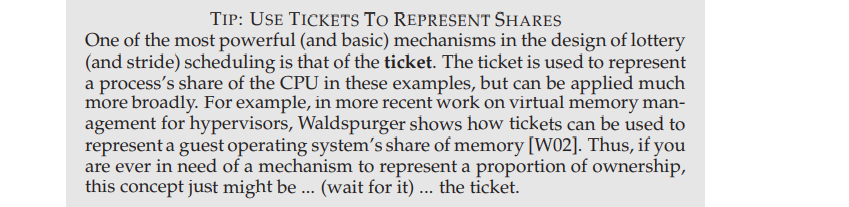



## 9.2 Ticket Mechanisms 
mechanisms to manipulate tickets in different and sometimes useful ways. One way is with the concept of **ticket currency**

Currency allows a user with a set of tickets to allocate tickets among their own jobs in whatever currency they would like; the system then automatically converts said currency into the correct global value.

    User A -> 500 (A’s currency) to A1 -> 50 (global currency)
           -> 500 (A’s currency) to A2 -> 50 (global currency)
    User B -> 10 (B’s currency) to B1 -> 100 (global currency)

Another useful mechanism is **ticket transfer** 
- a process can temporarily hand off its tickets to another process
- especially useful in a client/server setting, where a client process sends a message to a server asking it to do some work on the client’s behalf
- To speed up the work, the client can pass the tickets to the server and thus try to maximize the performance of the server while the server is handling the client’s request
- When finished, the server then transfers the tickets back to the client and all is as before

Finally, **ticket inflation** can sometimes be a useful technique. With inflation, a process can temporarily raise or lower the number of tickets it owns. 

Of course, in a competitive scenario with processes that do not trust one another, this makes little sense; one greedy process could give itself a vast number of tickets and take over the machine

Rather, inflation can be applied in an environment where a group of processes trust one another; in such a case, if any one process knows it needs more CPU time, it can boost its ticket value as a way to reflect that need to the system, all without communicating with any other processes.



## 9.3 Implementation 
Probably the most amazing thing about lottery scheduling is the simplicity of its implementation. All you need is a good random number generator to pick the winning ticket, a data structure to track the processes of the system (e.g., a list), and the total number of tickets

Let’s assume we keep the processes in a list. Here is an example comprised of three processes, A, B, and C, each with some number of tickets

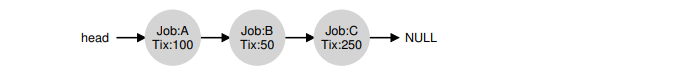

To make a scheduling decision, we first have to pick a random number (the winner) from the total number of tickets (400)

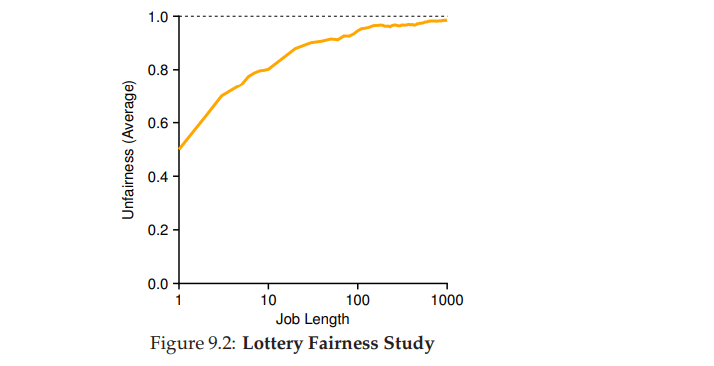

## 9.4 An Example
**unfairness metric**, U which is simply the time the first job completes divided by the time that the second job completes. 

For example, if R = 10, and the first job finishes at time 10 (and the second job at 20), U = 10 / 20 = 0.5. 

When both jobs finish at nearly the same time, U will be quite close to 1

In this scenario, that is our goal: a perfectly fair scheduler would achieve U = 1

## 9.6 Why Not Deterministic?
why use randomness at all? As we saw above, while randomness gets us a simple (and approximately correct) scheduler, it occasionally will not deliver the exact right proportions, especially over short time scales. 

For this reason, Waldspurger invented **stride scheduling**, a deterministic fair-share scheduler

Stride scheduling is also straightforward. Each job in the system has a stride, which is inverse in proportion to the number of tickets it has

    current = remove_min(queue); // pick client with minimum pass
    schedule(current); // use resource for quantum
    current->pass += current->stride; // compute next pass using stride
    insert(queue, current); // put back into the queue

In our example, we start with three processes (A, B, and C), with stride values of 100, 200, and 40, and all with pass values initially at 0

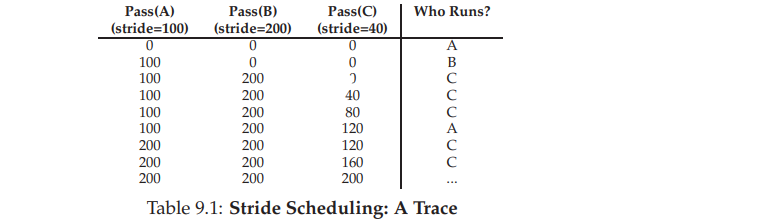

As we can see from the table, C ran five times, A twice, and B just once, exactly in proportion to their ticket values of 250, 100, and 50

Lottery scheduling achieves the proportions probabilistically over time; stride scheduling gets them exactly right at the end of each scheduling cycle.

So you might be wondering: given the precision of stride scheduling, why use lottery scheduling at all? Well, lottery scheduling has one nice property that stride scheduling does not: no global state.

Imagine a new
job enters in the middle of our stride scheduling example above; what
should its pass value be? Should it be set to 0? If so, it will monopolize
the CPU. With lottery scheduling, there is no global state per process;
we simply add a new process with whatever tickets it has, update the
single global variable to track how many total tickets we have, and go
from there. In this way, lottery makes it much easier to incorporate new
processes in a sensible manner.


## 9.7 Summary
We have introduced the concept of proportional-share scheduling and briefly discussed two implementations: lottery and stride scheduling.

proportional-share schedulers are more useful in domains where problems (such as assignment of shares) are relatively easy to solve. For example, in a virtualized data center, where you might like to assign one-quarter of your CPU cycles to the Windows VM and the rest to your base Linux installation, proportional sharing can be simple and effective

# 10 - Multiprocessor Scheduling (Advanced)
After years of existence only in the high-end of the computing spectrum, multiprocessor systems are increasingly commonplace, and have
found their way into desktop machines, laptops, and even mobile devices

The rise of the **multicore** processor, in which multiple CPU cores are packed onto a single chip, is the source of this proliferation; these chips have become popular as computer architects have had a difficult time making a single CPU much faster without using (way) too much power

Of course, there are many difficulties that arise with the arrival of more than a single CPU. 
- A primary one is that a typical application (i.e., some C program you wrote) only uses a single CPU; adding more CPUs does not make that single application run faster
    - To remedy this problem, you’ll have to rewrite your application to run in **parallel**, perhaps using **threads**
    -  Multithreaded applications can spread work across multiple CPUs and thus run faster when given more CPU resources.

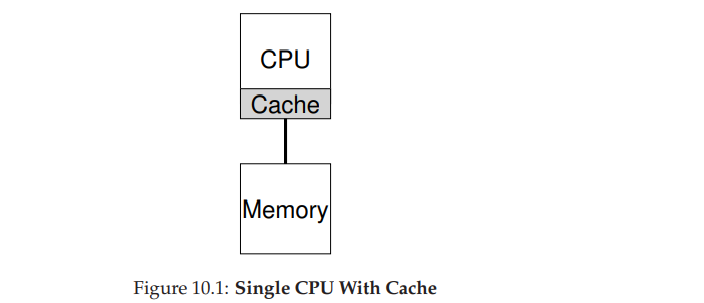

Beyond applications, a new problem that arises for the operating system is (not surprisingly!) that of **multiprocessor scheduling**

**CRUX: HOW TO SCHEDULE JOBS ON MULTIPLE CPUS - How should the OS schedule jobs on multiple CPUs? What new problems arise? Do the same old techniques work, or are new ideas required?**



## 10.1 Background: Multiprocessor Architecture
To understand the new issues surrounding multiprocessor scheduling, we have to understand a new and fundamental difference between single-CPU hardware and multi-CPU hardware. This difference centers around the use of hardware **caches**, , and exactly how data is shared across multiple processors

In a system with a single CPU, there are a hierarchy of **hardware caches** that in general help the processor run programs faster
- Caches are small, fast memories that (in general) hold copies of popular data that is found in the main memory of the system. Main memory, in contrast, holds all of the data, but access to this larger memory is slower. 
- By keeping frequently accessed data in a cache, the system can make the large, slow memory appear to be a fast one.

**Eg:** consider a program that issues an explicit load instruction to fetch a value from memory, and a simple system with only a single CPU; the CPU has a small cache (say 64 KB) and a large main memory
- The first time a program issues this load, the data resides in main memory, and thus takes a long time to fetch
- The processor, anticipating that the data may be reused, puts a copy of the loaded data into the CPU cache
- If the program later fetches this same data item again, the CPU first checks for it in the cache; because it finds it there, the data is fetched much more quickly and thus the program runs faster.

Caches are thus based on the notion of **locality**, of which there are two kinds: **temporal locality** and **spatial locality**
- **temporal** - when a piece of data is accessed, it is likely to be accessed again in the near future
    - imagine variables or even instructions themselves being accessed over and over again in a loop.
- **spatial** - spatial locality is that if a program accesses a data item at address x, it is likely to access data items near x as well
    - program streaming through an array, or instructions being executed one after the other
 
Because locality of these types exist in many programs, hardware systems can make good guesses about which data to put in a cache and thus work well.

Now for the tricky part: what happens when you have multiple processors in a single system, with a single shared main memory, as we see
in Figure 10.2?

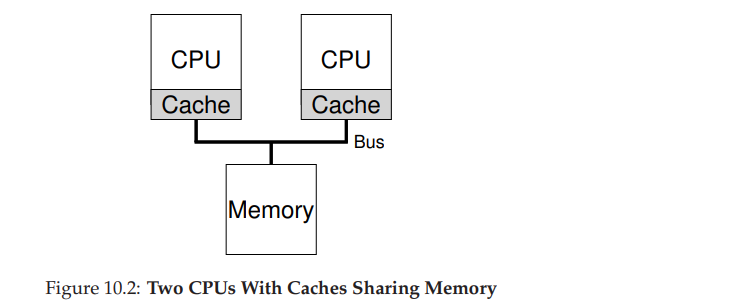

**caching with multiple CPUs is much more complicated**

Imagine, for example, that a program running on CPU 1 reads a data item (with value D) at address A; because the data is not in the cache on CPU 1, the system fetches it from main memory, and gets the value D. The program then modifies the value at address A, just updating its cache with the new value D′; writing the data through all the way to main memory is slow, so the system will (usually) do that later. Then assume the OS decides to stop running the program and move it to CPU 2. The program then re-reads the value at address A; there is no such data CPU 2’s cache, and thus the system fetches the value from main memory,and gets the old value D instead of the correct value D′. Oops!

This general problem is called the problem of **cache coherence**, and there is a vast research literature that describes many different subtleties involved with solving the problem

The basic solution is provided by the hardware: by monitoring memory accesses, hardware can ensure that basically the “right thing” happens and that the view of a single shared memory is preserved

One way to do this on a bus-based system (as described above) is to use an old technique known as **bus snooping** - each cache pays attention to memory updates by observing the bus that connects them to main memory

When a CPU then sees an update for a data item it holds in its cache, it will notice the change and either invalidate its copy (i.e., remove it from its own cache) or update it (i.e., put the new value into its cache too)


## 10.2 Don’t Forget Synchronization
Given that the caches do all of this work to provide coherence, do programs (or the OS itself) have to worry about anything when they access
shared data? Yes - second piece of this book on the topic of concurrency

When accessing (and in particular, updating) shared data items or structures across CPUs, mutual exclusion primitives (such as **locks**) should likely be used to guarantee correctness (other approaches, such as building **lock-free** data structures, are complex and only used on occasion

example, assume we have a shared queue being accessed on multiple CPUs concurrently. Without locks, adding or removing elements from the queue concurrently will not work as expected, even with the underlying coherence protocols; one needs locks to atomically update the data structure to its new state.

The solution, of course, is to make such routines correct via **locking**. 

In this case, allocating a simple mutex (e.g., `pthread_mutex_t m;`) and then adding a `lock(&m)` at the beginning of the routine and an `unlock(&m)` at the end will solve the problem, ensuring that the code will execute as desired.

Unfortunately, as we will see, such an approach is
not without problems, in particular with regards to performance. Specifically, as the number of CPUs grows, access to a synchronized shared data
structure becomes quite slow.

## 10.3 One Final Issue: Cache Affinity
This notion is simple: a process, when run on a particular CPU, builds up a fair bit of state in the caches (and TLBs) of the CPU.

The next time the process runs, it is often advantageous to run it on the same CPU, as it will run faster if some of its state is already present in the caches on that CPU

If, instead, one runs a process on a different CPU each time, the performance of the process will be worse, as it will have to reload the state each time it runs (note it will run correctly on a different CPU thanks to the cache coherence protocols of the hardware). 

Thus, a multiprocessor scheduler should consider cache affinity when making its scheduling decisions, perhaps preferring to keep a process on the same CPU if at all possible.

## 10.4 Single-Queue Scheduling
The most basic approach is to simply reuse the basic framework for single processor scheduling, by putting all jobs that need to be scheduled into a single queue; we call this **singlequeue multiprocessor scheduling** or **SQMS** for short

**first problem - lack of scalability**
- ensure the scheduler works correctly on multiple CPUs, the developers will have inserted some form of locking into the code, as described above
- Locks ensure that when SQMS code accesses the single queue (say, to find the next job to run), the proper outcome arises
- Locks, unfortunately, can greatly reduce performance, particularly as the number of CPUs in the systems grows

**second main problem - cache affinity**

For example, let us assume we have five jobs to run (A, B, C, D, E) and four processors. Our scheduling queue thus looks like this:

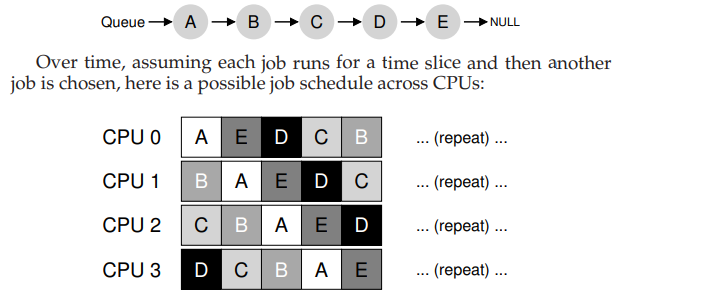

Because each CPU simply picks the next job to run from the globallyshared queue, each job ends up bouncing around from CPU to CPU, thus
doing exactly the opposite of what would make sense from the standpoint of cache affinity.

To handle this problem, most SQMS schedulers include some kind of affinity mechanism to try to make it more likely that process will continue to run on the same CPU if possible

Specifically, one might provide affinity for some jobs, but move others around to balance load. For example, 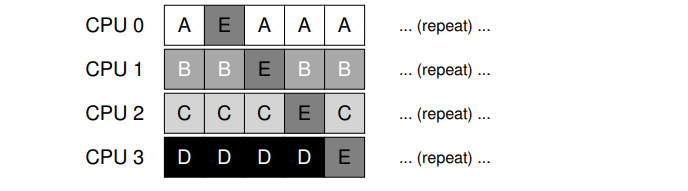imagine the same five jobs scheduled as follows:



In this arrangement, jobs A through D are not moved across processors, with only job E migrating from CPU to CPU, thus preserving affinity for most

You could then decide to migrate a different job the next time through, thus achieving some kind of affinity fairness as well

Thus, we can see the SQMS approach has its strengths and weaknesses. It is straightforward to implement given an existing single-CPU scheduler, which by definition has only a single queue. However, it does not scale well (due to synchronization overheads), and it does not readily preserve cache affinity.

## 10.5 Multi-Queue Scheduling
Because of the problems caused in single-queue schedulers, some systems opt for multiple queues, e.g., one per CPU. 

We call this approach **multi-queue multiprocessor scheduling** or **MQMS**

For example, assume we have a system where there are just two CPUs (labeled CPU 0 and CPU 1), and some number of jobs enter the system: A, B, C, and D for example. 

Given that each CPU has a scheduling queue now, the OS has to decide into which queue to place each job. It might do something like this:

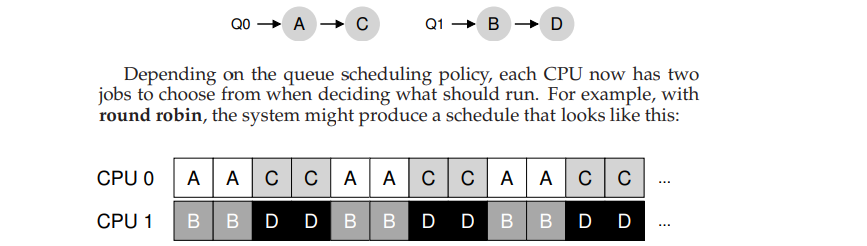

MQMS has a distinct advantage of SQMS in that it should be inherently more scalable. As the number of CPUs grows, so too does the number of queues, and thus lock and cache contention should not become a central problem

MQMS intrinsically provides cache affinity; jobs stay on the same CPU and thus reap the advantage of reusing cached contents therein

But, if you’ve been paying attention, you might see that we have a new problem, which is fundamental in the multi-queue based approach: **load imbalance**.

Let’s assume we have the same set up as above (four jobs, two CPUs), but then one of the jobs (say C) finishes. We now have the following scheduling queues:

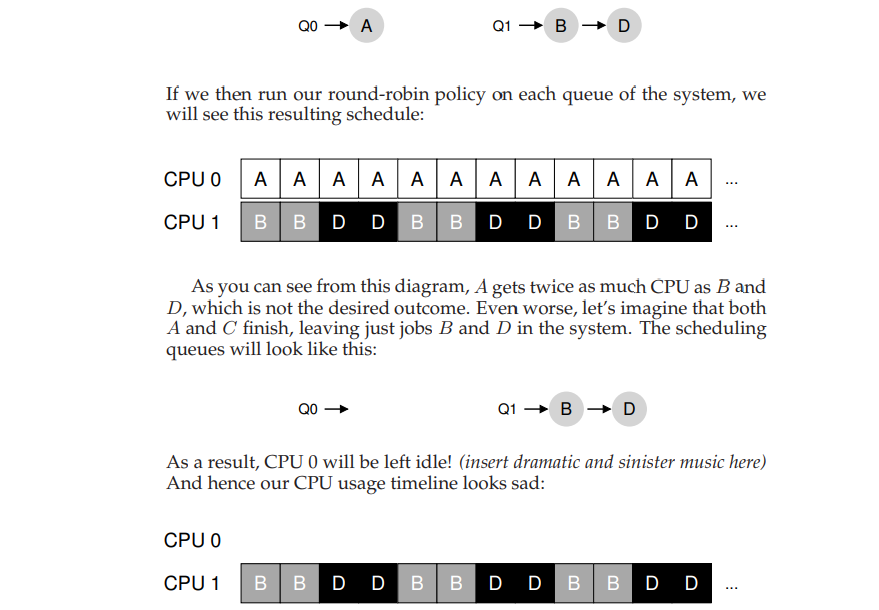



**CRUX: HOW TO DEAL WITH LOAD IMBALANCE - How should a multi-queue multiprocessor scheduler handle load imbalance, so as to better achieve its desired scheduling goals?**

solution: move jobs around - **migration**

Let’s look at a couple of examples to add some clarity. Once again, we have a situation where one CPU is idle and the other has some jobs.

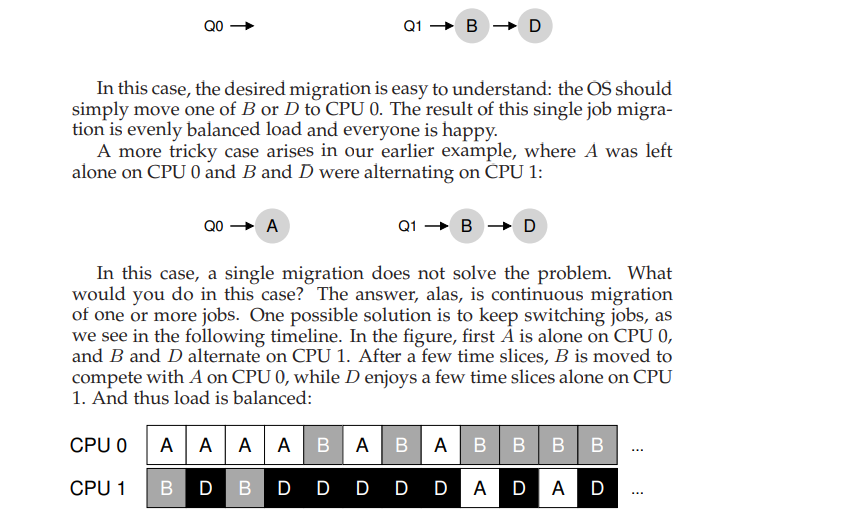



how should the system decide to enact such a migration? **work stealing**
- a (source) queue that is low on jobs will occasionally peek at another (target) queue, to see how full it is.
- If the target queue is (notably) more full than the source queue, the source will “steal” one or more jobs from the target to help balance load

## 10.6 Linux Multiprocessor Schedulers
Interestingly, in the Linux community, no common solution has approached to building a multiprocessor scheduler. Over time, three different schedulers arose: the **O(1)** scheduler, the Completely Fair Scheduler (**CFS**), and the BF Scheduler (**BFS**)

## 10.7 Summary
We have seen various approaches to multiprocessor scheduling. 

The single-queue approach (SQMS) is rather straightforward to build and balances load well but inherently has difficulty with scaling to many processors and cache affinity. 

The multiple-queue approach (MQMS) scales better and handles cache affinity well, but has trouble with load imbalance and is more complicated. 

Whichever approach you take, there is no simple answer: building a general purpose scheduler remains a daunting task, as small code changes can lead to large behavioral differences.

# 11 - Summary Dialogue on CPU Virtualization
OS virtualizes the CPU. There are a bunch of important mechanisms that I had to understand to make sense of this: traps and trap handlers, timer interrupts, and how the OS and the hardware have to carefully save and restore state when switching between processes

the OS is fairly paranoid. It wants to make sure it stays in charge of the machine. While it wants a program to run as efficiently as possible (and hence the whole reasoning behind limited direct execution), the OS also wants to be able to say “Ah! Not so fast my friend” in case of an errant or malicious process. Paranoia rules the day, and certainly keeps the OS in charge of the machine. Perhaps that is why we think of the OS as a resource manager.

policies on top of those mechanisms - the notion of bumping short jobs to the front of the queue

can build a smart scheduler that tries to be like SJF and RR all at once - MLFQ

still controversy to this day over which scheduler to use; see the Linux battles between CFS, BFS, and the O(1) scheduler, for example

is there really a right answer? Probably not. After all, even our own metrics are at odds: if your scheduler is good at turnaround time, it’s bad at response time, and vice versa. As Lampson said, perhaps the goal isn’t to find the best solution, but rather to avoid disaster.

Student: I really liked the notion of gaming the scheduler; it seems like that might be something to look into when I’m next running a job on Amazon’s EC2 service. Maybe I can steal some cycles from some other unsuspecting (and more importantly, OS-ignorant) customer!

## 12 - A Dialogue on Memory Virtualization
we are not nearly done with virtualization! Rather, you have just seen how to virtualize the CPU, but really there is a big monster waiting in the closet: memory. 

Virtualizing memory is complicated and requires us to understand many more intricate details about how the hardware and OS interact

We’ll start simple, with very basic techniques like base/bounds, and slowly add complexity to tackle new challenges, including fun topics like TLBs and multi-level page tables. Eventually, we’ll be able to describe the workings of a fully-functional modern virtual memory manager

For understanding virtual memory, start with this: **every address generated by a user program is a virtual address**. The OS is just providing an illusion to each process, specifically that it has its own large and private memory; with some hardware help, the OS will turn these pretend virtual addresses into real physical addresses, and thus be able to locate the desired information

why does the OS want to provide this illusion? 
- Mostly **ease of use**: the OS will give each program the view that it has a large contiguous address space to put its code and data into; thus, as a programmer, you never have to worry about things like “where should I store this variable?” because the virtual address space of the program is large and has lots of room for that sort of thing. Life, for a programmer, becomes much more tricky if you have to worry about fitting all of your code data into a small, crowded memory.
- **isolation** and **protection** - don’t want one errant program to be able to read, or worse, overwrite, some other program’s memory

the proper OS response to errant process behavior is to kill the offending process

# 13 - The Abstraction: Address Spaces
## 13.1 Early Systems
From the perspective of memory, early machines didn’t provide much of an abstraction to users. Basically, the physical memory of the machine looked something like what you see in Figure 13.1

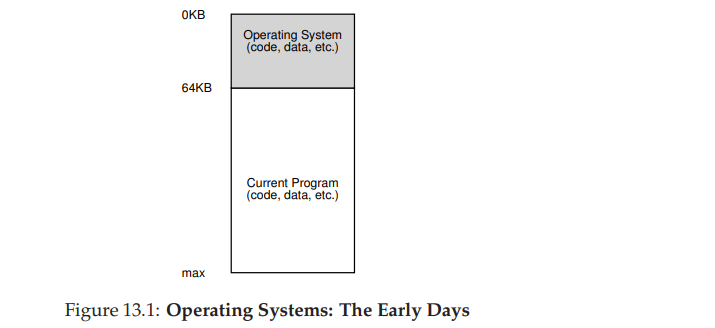

The OS was a set of routines (a library, really) that sat in memory (starting at physical address 0 in this example), and there would be one running program (a process) that currently sat in physical memory (starting at physical address 64k in this example) and used the rest of memory

There were few illusions here, and the user didn’t expect much from the OS.



## 13.2 Multiprogramming and Time Sharing
After a time, because machines were expensive, people began to share machines more effectively. Thus the era of **multiprogramming** was born, in which multiple processes were ready to run at a given time, and the OS would switch between them, for example when one decided to perform an I/O. Doing so increased the effective utilization of the CPU

Soon enough, however, people began demanding more of machines, and the era of **time sharing** was born.

Specifically, many realized the limitations of batch computing, particularly on programmers themselves, who were tired of long (and hence ineffective) program debug cycles. The notion of **interactivity** became important, as many users might be concurrently using a machine, each waiting for (or hoping for) a timely response from their currently-executing tasks.

Unfortunately, this approach has a big problem: it is way too slow, particularly as memory grew. While saving and restoring register-level state
(e.g., the PC, general-purpose registers, etc.) is relatively fast, saving the entire contents of memory to disk is brutally non-performant. Thus, what we’d rather do is leave processes in memory while switching between them, allowing the OS to implement time sharing efficiently (Figure 13.2).

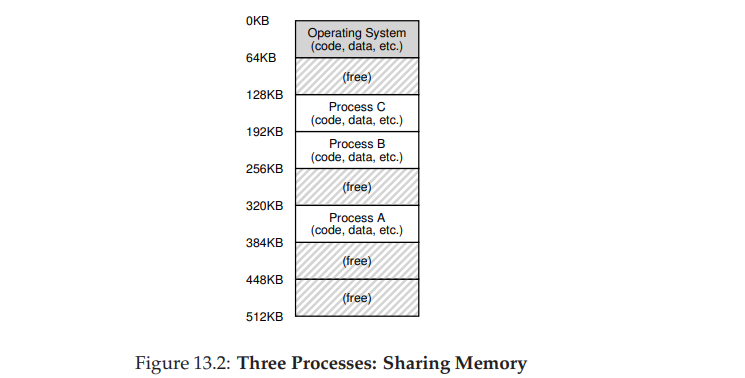

In the diagram, there are three processes (A, B, and C) and each of them have a small part of the 512-KB physical memory carved out for them. Assuming a single CPU, the OS chooses to run one of the processes (say A), while the others (B and C) sit in the ready queue waiting to run.

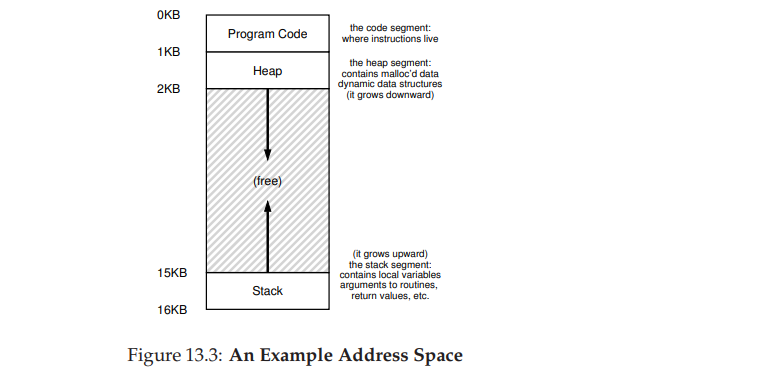

As time sharing became more popular, you can probably guess that new demands were placed on the operating system. In particular, allowing multiple programs to reside concurrently in memory makes **protection** an important issue; you don’t want a process to be able to read, or worse, write some other process’s memory.

## 13.3 The Address Space
OS to create an **easy to use** abstraction of physical memory

We call this abstraction the **address space**, and it is the running program’s view of memory in the system - Understanding this fundamental OS abstraction of memory is key to understanding how memory is virtualized.

The address space of a process contains all of the memory state of the running program

For example, the **code** of the program (the instructions) have to live in memory somewhere, and thus they are in the address space.

The program, while it is running, uses a **stack** to keep track of where it is in the function call chain as well as to allocate local variables and pass parameters and return values to and from routines.

Finally, the **heap** is used for dynamically-allocated, user-managed memory, such as that you might receive from a call to malloc() in C.

Of course, there are other things in there too (e.g., statically-initialized variables), but for now let us just assume those three components: code, stack, and heap.

In the example in Figure 13.3, we have a tiny address space (only 16 KB). The program code lives at the top of the address space (starting at 0 in this example, and is packed into the first 1K of the address space). Code is static (and thus easy to place in memory), so we can place it at the top of the address space and know that it won’t need any more space as the program runs

Next, we have the two regions of the address space that may grow (and shrink) while the program runs - **heap** & **stack**
- We place them like this because each wishes to be able to grow, and by putting them at opposite ends of the address space, we can allow such growth: they just have to grow in opposite directions
- The heap thus starts just after the code (at 1KB) and grows downward (say when a user requests more memory via malloc()); the stack starts at 16KB and grows upward (say when a user makes a procedure call).

However, this placement of stack and heap is just a convention; you could arrange the address space in a different way if you’d like (as we’ll see later, when multiple threads co-exist in an address space, no nice way to divide the address space like this works anymore, alas).

Of course, when we describe the address space, what we are describing is the **abstraction** that the OS is providing to the running program

The program really isn’t in memory at physical addresses 0 through 16KB; rather it is loaded at some arbitrary physical address(es).

**THE CRUX: HOW TO VIRTUALIZE MEMORY - How can the OS build this abstraction of a private, potentially large address space for multiple running processes (all sharing memory) on top of a single, physical memory?**

When the OS does this, we say the OS is **virtualizing memory**, because the running program thinks it is loaded into memory at a particular address (say 0) and has a potentially very large address space (say 32-bits or 64-bits); the reality is quite different

When, for example, process A in Figure 13.2 tries to perform a load
at address 0 (which we will call a virtual address), somehow the OS, in
tandem with some hardware support, will have to make sure the load
doesn’t actually go to physical address 0 but rather to physical address
320KB (where A is loaded into memory). This is the key to virtualization
of memory, which underlies every modern computer system in the world.

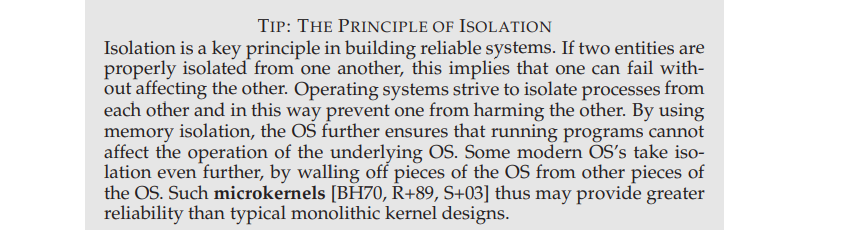

## 13.4 Goals
Thus we arrive at the job of the OS in this set of notes: to virtualize memory

1. transparency
- The OS should implement virtual memory in a way that is invisible to the running program
- Thus, the program shouldn’t be aware of the fact that memory is virtualized; rather, the program behaves as if it has its own private physical memory

2. efficiency
- wrt time & space
-  In implementing time-efficient virtualization, the OS will have to rely on hardware support, including hardware features such as TLBs

3. protection
-  The OS should make sure to protect processes from one another as well as the OS itself from processes
-  When one process performs a load, a store, or an instruction fetch, it should not be able to access or affect in any way the memory contents of any other process or the OS itself (that is, anything outside its address space)
-  Protection thus enables us to deliver the property of **isolation** among processes; each process should be running in its own isolated cocoon, safe from the ravages of other faulty or even malicious processes.

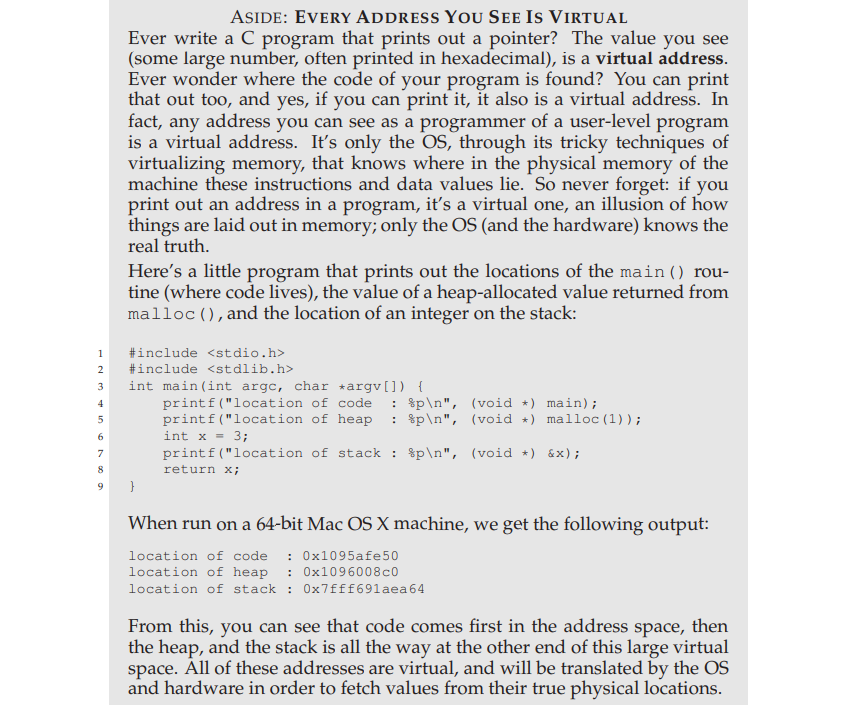

## 13.5 Summary
The VM system is responsible for providing the illusion of a large, sparse, private address space to programs, which hold all of their instructions and data therein.

The OS, with some serious hardware help, will take each of these virtual memory references, and turn them into physical addresses, which can be presented to the physical memory in order to fetch the desired information.

The OS will do this for many processes at once, making sure to protect programs from one another, as well as protect the OS.

# 14 - Interlude: Memory API
In this interlude, we discuss the memory allocation interfaces in UNIX systems

**CRUX: HOW TO ALLOCATE AND MANAGE MEMORY - In UNIX/C programs, understanding how to allocate and manage memory is critical in building robust and reliable software. What interfaces are commonly used? What mistakes should be avoided?**

## 14.1 Types of Memory
In running a C program, there are two types of memory that are allocated. 

1. The first is called **stack** memory, and allocations and deallocations of it are managed **implicitly** by the compiler for you, the programmer; for this reason it is sometimes called **automatic** memory.

Declaring memory on the stack in C is easy. For example, let’s say you need some space in a function func() for an integer, called x. To declare such a piece of memory, you just do something like this:
    
    void func() {
        int x; // declares an integer on the stack
        ...
    }
The compiler does the rest, making sure to make space on the stack when you call into func().

When your return from the function, the compiler deallocates the memory for you; thus, if you want some information to live beyond the call invocation, you had better not leave that information on the stack.

2. **heap** memory
- long lived memory
- all allocations / deallocations handled **explicitly** by you

example of how one might allocate a pointer to an integer on the heap:
    
    void func() {
        int *x = (int *) malloc(sizeof(int));
        ...
    }

both stack and heap allocation occur on this line: first the compiler knows to make room for a pointer to an integer when it sees your declaration of said pointer (int *x); subsequently, when the program calls malloc(), it requests space for an integer on the heap; the routine returns the address of such an integer

## 14.2 The malloc() Call
The malloc() call is quite simple: you pass it a size asking for some room on the **heap**, and it either succeeds and gives you back a pointer to the newly-allocated space, or fails and returns NULL

    #include <stdlib.h>
    ...
    void *malloc(size_t size);

- include the header file `stdlib.h` to use `malloc`
- u don’t really need to even do this, as the C library, which all C programs link with by default, has the code for malloc() inside of it; adding the header just lets the compiler check whether you are calling malloc() correctly (e.g., passing the right number of arguments to it, of the right type)
- The single parameter `malloc()` takes is of type `size_t` which simply describes how many bytes you need


    double *d = (double *) malloc(sizeof(double));

- This invocation of malloc() uses the sizeof() operator to request the right amount of space; in C, this is generally thought of as a compile-time operator, meaning that the actual size is known at compile time and thus a number (in this case, 8, for a double) is substituted as the argument to malloc()
-  For this reason, sizeof() is correctly thought of as an operator and not a function call (a function call would take place at run time).

## 14.3 The free() Call
allocating memory is the easy part of the equation; knowing when, how, and even if to free memory is the hard part

To free heap memory that is no longer in use, programmers simply call free():
    
    int *x = malloc(10 * sizeof(int));
    ...
    free(x);

## 14.4 Common Errors
#### Forgetting To Allocate Memory
Many routines expect memory to be allocated before you call them. For example, the routine `strcpy(dst, src)` copies a string from a source pointer to a destination pointer. However, if you are not careful, you might do this:
    
    char *src = "hello";
    char *dst; // oops! unallocated
    strcpy(dst, src); // segfault and die

When you run this code, it will likely lead to a **segmentation fault**, which is a fancy term for YOU DID **SOMETHING WRONG WITH MEMORY** YOU FOOLISH PROGRAMMER AND I AM ANGRY

In this case, the proper code might instead look like this:
    
    char *src = "hello";
    char *dst = (char *) malloc(strlen(src) + 1);
    strcpy(dst, src); // work properly

Alternately, you could use `strdup()` and make your life even easier.
Read the strdup man page for more information.
- strdup() simplifies the process of duplicating strings compared to manually using malloc() and strcpy().

#### Not Allocating Enough Memory
A related error is not allocating enough memory, sometimes called a **buffer overflow**

In the example above, a common error is to make almost enough room for the destination buffer.
    
    char *src = "hello";
    char *dst = (char *) malloc(strlen(src)); // too small!
    strcpy(dst, src); // work properly

Oddly enough, depending on how malloc is implemented and many other details, this program will often run seemingly correctly
- in some cases this is harmless, perhaps overwriting a variable that isn’t used anymore.
- In some cases, these overflows can be incredibly harmful, and in fact are the source of many security vulnerabilities in systems
- In other cases, the malloc library allocated a little extra space anyhow, and thus your program actually doesn’t scribble on some other variable’s value and works quite fine.
- In even other cases, the program will indeed fault and crash. And thus we learn another valuable lesson: even though it ran correctly once, doesn’t mean it’s correct. 
#### Forgetting to Initialize Allocated Memory
With this error, you call malloc() properly, but forget to fill in some values into your newly-allocated data type

Don’t do this! If you do forget, your program will eventually encounter an **uninitialized read**, where it reads from the heap some data of unknown value

#### Forgetting To Free Memory
**memory leak**

In long-running applications or systems (such as the OS itself), this is a huge problem, as slowly leaking memory eventually leads one to run out of memory, at which point a restart is required.

Thus, in general, when you are done with a chunk of memory, you should make sure to free it. Note that using a garbage-collected language doesn’t help here: if you still have a reference to some chunk of memory, no garbage collector will ever free it, and thus memory leaks remain a problem even in more modern languages.

#### Freeing Memory Before You Are Done With It
Sometimes a program will free memory before it is finished using it; such a mistake is called a **dangling pointer**

The subsequent use can crash the program, or overwrite valid memory (e.g., you called free(), but then called malloc() again to allocate something else, which then recycles the errantly-freed memory).

#### Freeing Memory Repeatedly
Programs also sometimes free memory more than once; this is known as the **double free**

The result of doing so is undefined. 

As you can imagine, the memory-allocation library might get confused and do all sorts of weird things; crashes are a common outcome.

#### Calling free() Incorrectly
One last problem we discuss is the call of free() incorrectly. 

After all, free() expects you only to pass to it one of the pointers you received from malloc() earlier. 

When you pass in some other value, bad things can (and do) happen. Thus, such **invalid frees** are dangerous and of course should also be avoided.

## Summary
As you can see, there are lots of ways to abuse memory. Because of frequent errors with memory, a whole ecosphere of tools have developed to help find such problems in your code. 

Check out both **purify** and **valgrind** - both are excellent at helping you locate the source of your memory-related problems.

Once you become accustomed to using these powerful tools, you will wonder how you survived without them

## 14.5 Underlying OS Support
You might have noticed that we haven’t been talking about system calls when discussing malloc() and free(). The reason for this is simple: they are not system calls, but rather library calls

Thus **the malloc library manages space within your virtual address space**, but itself is built on top of some system calls which call into the OS to ask for more memory or release some back to the system

One such system call is called `brk`, which is used to change the location of the program’s **break**: the location of the end of the heap. It takes one argument (the address of the new break), and thus either increases or decreases the size of the heap based on whether the new break is larger or smaller than the current break.
- An additional call `sbrk` is passed an increment but otherwise serves a similar purpose

Note that you should never directly call either brk or sbrk. They are used by the memory-allocation library; if you try to use them, you will likely make something go (horribly) wrong. Stick to malloc() and free() instead

Finally, you can also obtain memory from the operating system via the `mmap()` call. By passing in the correct arguments, `mmap()` can create an anonymous memory region within your program – a region which is not associated with any particular file but rather with **swap space** (discussed in detail later on in virtual memory). 

This memory can then also be treated like a heap and managed as such. Read the manual page of mmap() for more details.

## 14.6 Other Calls
`calloc()` -  allocates memory and also zeroes it before returning; this prevents some errors where you assume that memory is zeroed and forget to initialize it yourself

`realloc()` - makes a new larger region of memory, copies the old region into it, and returns the pointer to the new region.



# 15 - Mechanism: Address Translation
In developing the virtualization of the CPU, we focused on a general mechanism known as **limited direct execution** (or **LDE**)

**Idea behind LDE:** for the most part, let the program run directly on the hardware; however, at certain key points in time (such as when a process issues a system call, or a timer interrupt occurs), arrange so that the OS gets involved and makes sure the “right” thing happens.

Thus, the OS, with a little hardware support, tries its best to get out of the way of the running program, to deliver an efficient virtualization; however, by **interposing** at those critical points in time, the OS ensures that it maintains control over the hardware.
- Efficiency and control together are two of the main goals of any modern operating system

**THE CRUX:
HOW TO EFFICIENTLY AND FLEXIBLY VIRTUALIZE MEMORY - How can we build an efficient virtualization of memory? How do we provide the flexibility needed by applications? How do we maintain control over which memory locations an application can access, and thus ensure that application memory accesses are properly restricted? How do we do all of this efficiently?**

The generic technique we will use, which you can consider an addition to our general approach of limited direct execution, is something that is referred to as **hardware-based address translation**, or just **address translation** for short
- With address translation, the hardware transforms each memory access (e.g., an instruction fetch, load, or store), changing the virtual address provided by the instruction to a physical address where the desired information is actually located
- Thus, on each and every memory reference, an address translation is performed by the hardware to redirect application memory references to their actual locations in memory.

the hardware alone cannot virtualize memory, as it just provides the low-level mechanism for doing so efficiently. The OS must get involved at key points to set up the hardware

## 15.1 Assumptions
- the user’s address space must be placed contiguously in physical memory
- for simplicity, that the size of the address space is not too big; specifically, that it is less than the size of physical memory
- each address space is exactly the same size

## 15.2 An Example
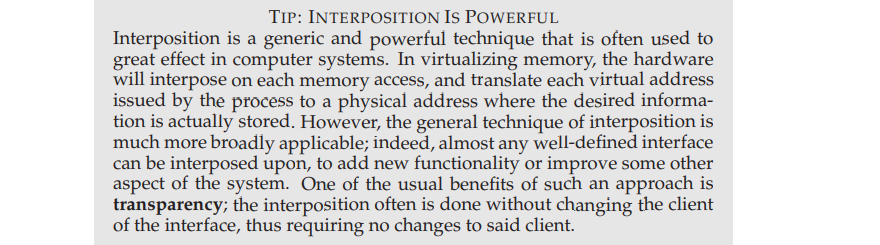

Eg: code loads a value from memory, increments it by three, and then stores the
value back into memory. You can imagine the C-language representation of this code might look like this: 

    void func()
        int x;
        ...
        x = x + 3; // this is the line of code we are interested in

The compiler turns this line of code into assembly, which might look something like this (in x86 assembly). Use **objdump** on Linux or **otool** on Mac OS X to disassemble it:

    128: movl 0x0(%ebx), %eax ;load 0+ebx into eax
    132: addl $0x03, %eax ;add 3 to eax register
    135: movl %eax, 0x0(%ebx) ;store eax back to mem

This code snippet is relatively straightforward; it presumes that the
address of x has been placed in the register ebx, and then loads the value
at that address into the general-purpose register eax using the movl instruction (for “longword” move). The next instruction adds 3 to eax,
and the final instruction stores the value in eax back into memory at that
same location.

When these instructions run, from the perspective of the process, the following memory accesses take place.
- Fetch instruction at address 128
- Execute this instruction (load from address 15 KB)
- Fetch instruction at address 132
- Execute this instruction (no memory reference)
- Fetch the instruction at address 135
- Execute this instruction (store to address 15 KB)

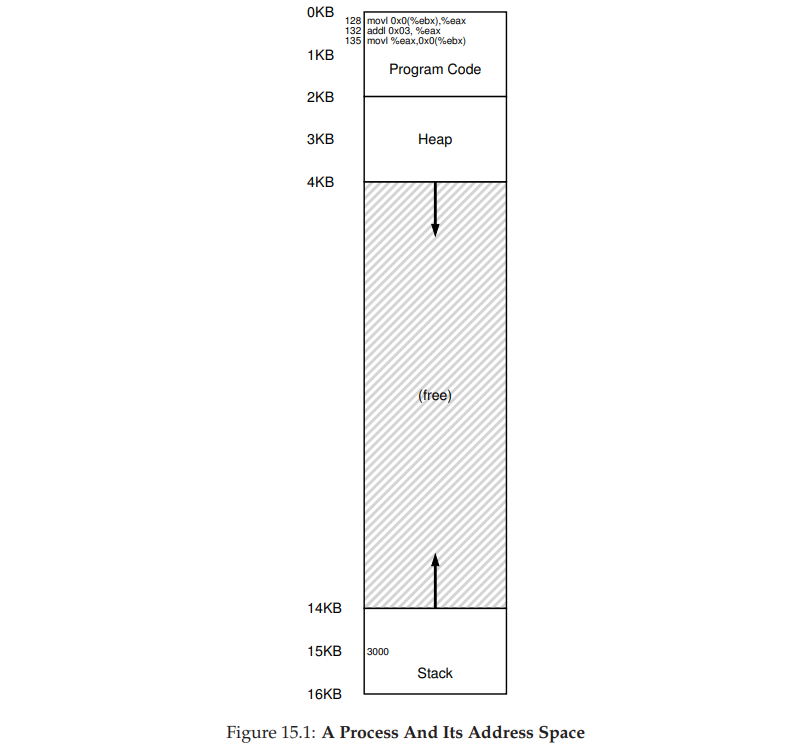

From the program’s perspective, its address space starts at address 0 and grows to a maximum of 16 KB; all memory references it generates should be within these bounds.

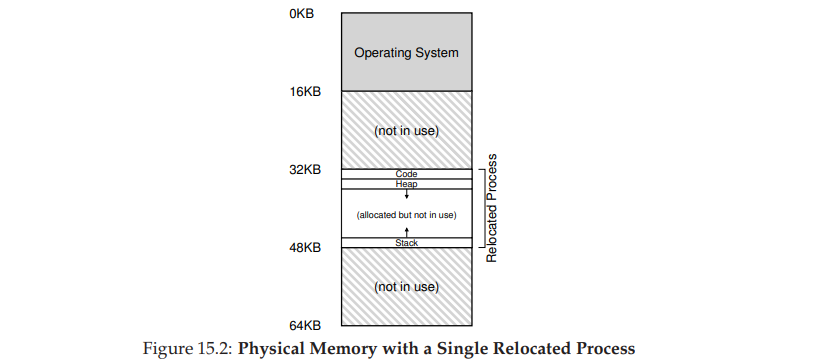

An example of what physical memory might look like once this process’s address space has been placed in memory is found in Figure 15.2.
In the figure, you can see the OS using the first slot of physical memory
for itself, and that it has relocated the process from the example above
into the slot starting at physical memory address 32 KB. The other two
slots are free (16 KB-32 KB and 48 KB-64 KB).

## 15.3 Dynamic (Hardware-based) Relocation
To gain some understanding of hardware-based address translation, we’ll first discuss its first incarnation

Introduced in the first time-sharing machines of the late 1950’s is a simple idea referred to as **base and bounds** (the technique is also referred to as **dynamic relocation**)

2 hardware registers within each CPU: one is called the **base** register, and the other the **bounds** (sometimes called a **limit** register).

This base-and-bounds pair is going to allow us to place the address space anywhere we’d like in physical memory, and do so while ensuring that the process can only access its own address space.

In this setup, each program is written and compiled as if it is loaded at
address zero. However, when a program starts running, the OS decides
where in physical memory it should be loaded and sets the base register
to that value.

In the example above, the OS decides to load the process at physical address 32 KB and thus sets the base register to this value.

Now, when any memory reference is generated by the process, it is translated by the processor in the following manner: **`physical address = virtual address + base`**

Each memory reference generated by the process is a **virtual address**; the hardware in turn adds the contents of the base register to this address and the result is a **physical address** that can be issued to the memory system.

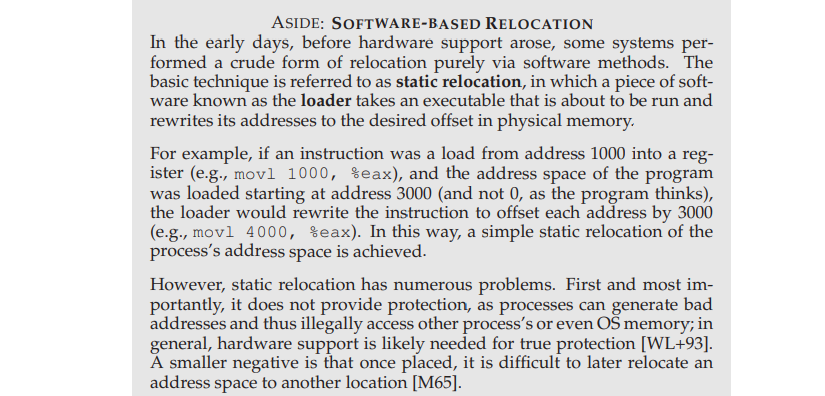

**address translation** - the hardware takes a virtual address the process thinks it is referencing and transforms it into a physical address which is where the data actually resides.
- Because this relocation of the address happens at runtime, and because we can move address spaces even after the process has started running, the technique is often referred to as **dynamic relocation**

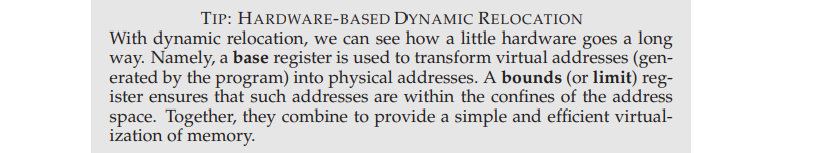

the **bounds** register is there to help with protection. Specifically, the processor will first check that the memory reference is within bounds to make sure it is legal

Note: the base and bounds registers are hardware structures kept on the chip (one pair per CPU)
- Sometimes people call the part of the processor that helps with address translation the **memory management unit** (**MMU**)
- as we develop more sophisticated memorymanagement techniques, we will be adding more circuitry to the MMU

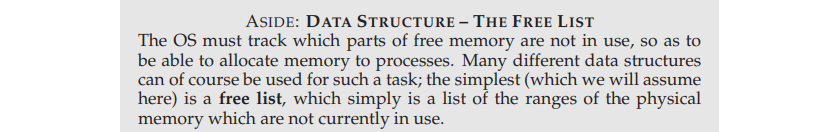

## 15.4 OS Issues
three critical junctures where the OS must take action to implement this base-and-bounds approach to virtualizing memory

the OS must also take action when a context switch occurs. There is only one base and bounds register on each CPU, after all, and their values differ for each running program, as each program is loaded at a different physical address in memory. Thus, the OS must save and restore the base-and-bounds pair when it switches between processes

when a process is stopped (i.e., not running), it is possible for the OS to move an address space from one location in memory to another rather easily

## 15.5 Summary
In this chapter, we have extended the concept of limited direct execution with a specific mechanism used in virtual memory, known as **address translation**.

Key to the efficiency of this technique is hardware support, which performs the translation quickly for each access, turning virtual addresses (the process’s view of memory) into physical ones (the actual view).

# 16 - Segmentation
there is a big chunk of “free” space right in the middle, between the stack and the heap

although the space between the stack and heap is not being used by the process, it is still taking up physical memory when we relocate the entire address space somewhere in physical memory; thus, the simple approach of using a base and bounds register pair to virtualize memory is wasteful

**THE CRUX: HOW TO SUPPORT A LARGE ADDRESS SPACE - How do we support a large address space with (potentially) a lot of free space between the stack and the heap? Note that in our examples, with tiny (pretend) address spaces, the waste doesn’t seem too bad. Imagine, however, a 32-bit address space (4 GB in size); a typical program will only use megabytes of memory, but still would demand that the entire address space be resident in memory**

## 16.1 Segmentation: Generalized Base/Bounds
To solve this problem, an idea was born, and it is called segmentation. It is quite an old idea, going at least as far back as the very early
1960’s

**IDEA:** instead of having just one base and bounds pair in our MMU, why not have a base and bounds pair per logical segment of the address space?

A segment is just a contiguous portion of the address space of a particular length, and in our canonical address space, we have three logically different segments: code, stack, and heap

**What segmentation allows the OS to do is to place each one of those segments in different parts of physical memory, and thus avoid filling physical memory with unused virtual address space.**

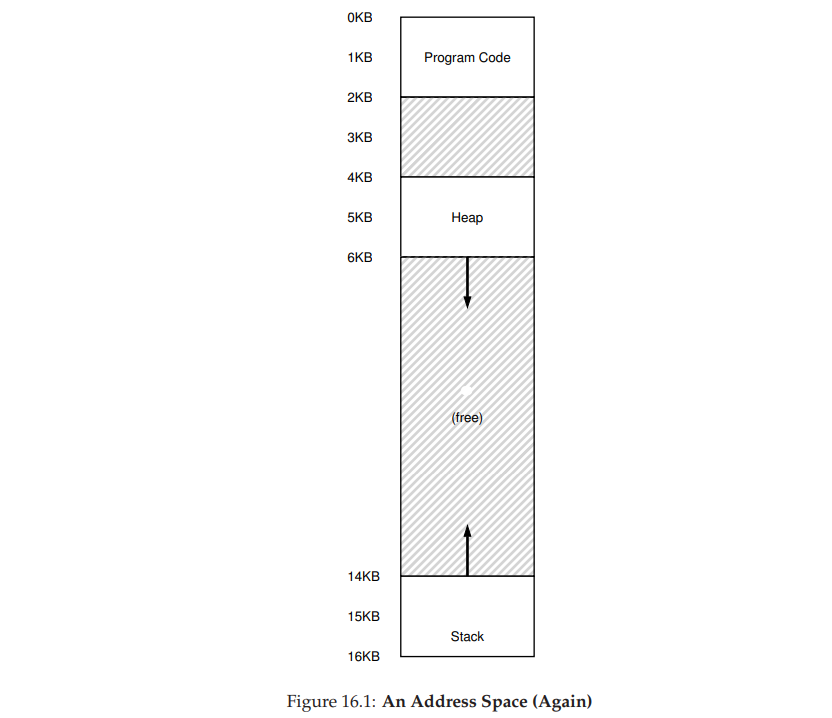

we can place each segment independently in physical memory.

**The hardware structure in our MMU required to support segmentation is just what you’d expect: in this case, a set of three base and bounds
register pairs.**

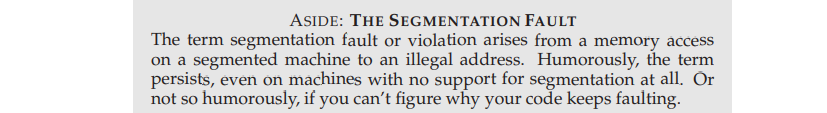

What if we tried to refer to an illegal address beyond the end of the heap? The hardware detects that the address is out of bounds, traps into the OS, likely leading to the termination of the offending process. And now you know the origin of the famous term that all C programmers learn to dread: the **segmentation violation** or **segmentation fault**.

## 16.3 What About The Stack?
it grows backwards – in physical memory; translation has to proceed differently

The first thing we need is a little extra hardware support. Instead of just base and bounds values, the hardware also needs to know which way the segment grows

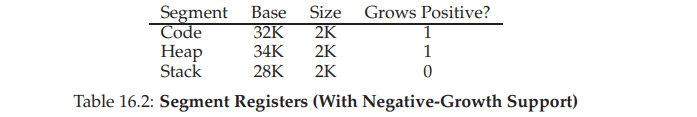

## 16.4 Support for Sharing
As support for segmentation grew, system designers soon realized that they could realize new types of efficiencies with a little more hardware support. Specifically, to save memory, sometimes it is useful to share certain memory segments between address spaces. 

In particular, **code sharing** is common and still in use in systems today.

To support sharing, we need a little extra support from the hardware, in the form of **protection bits**. Basic support adds a few bits per segment, indicating whether or not a program can read or write a segment, or perhaps execute code that lies within the segment.

By setting a code segment to read-only, the same code can be shared across multiple processes, without worry of harming isolation; while each process still thinks that it is accessing its own private memory, the OS is secretly sharing memory which cannot be modified by the process, and thus the illusion is preserved. 

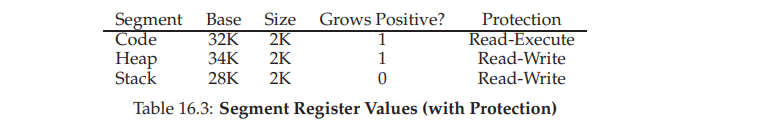

## 16.5 Fine-grained vs. Coarse-grained Segmentation
Most of our examples thus far have focused on systems with just a few segments (i.e., code, stack, heap); we can think of this segmentation as **coarse-grained**, as it chops up the address space into relatively large, coarse chunks. However, some early systems (e.g., Multics [CV65,DD68]) were more flexible and allowed for address spaces to consist of a large number smaller segments, referred to as **fine-grained** segmentation.

Supporting many segments requires even further hardware support, with a segment table of some kind stored in memory

## 16.6 OS Support
You now should have a basic idea as to how segmentation works. Pieces of the address space are relocated into physical memory as the system runs, and thus a huge savings of physical memory is achieved relative to our simpler approach with just a single base/bounds pair for the entire address space.

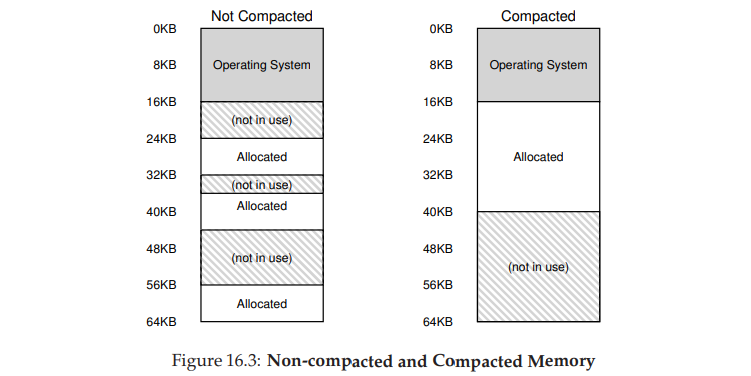

**external fragmentation** - physical memory quickly becomes full of little holes of free space, making it difficult to allocate new segments, or to grow existing ones

One solution to this problem would be to **compact** physical memory by rearranging the existing segments
- However, compaction is expensive, as copying segments is memory-intensive and thus would use a fair amount of processor time.

A simpler approach is to use a free-list management algorithm that tries to keep large extents of memory available for allocation
- There are literally hundreds of approaches that people have taken, including classic algorithms like best-fit (which keeps a list of free spaces and returns the one closest in size that satisfies the desired allocation to the requester), worst-fit, first-fit, and more complex schemes like buddy algorithm
- Unfortunately, though, no matter how smart the algorithm, external fragmentation will still exist; thus, a good algorithm simply attempts to minimize it.

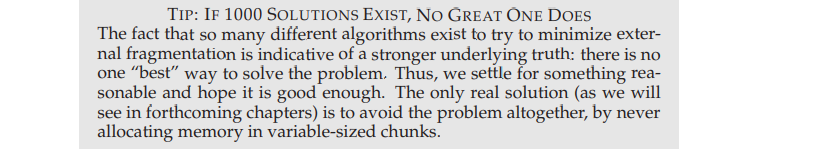

## 16.7 Summary
Segmentation solves a number of problems, and helps us build a more effective virtualization of memory

avoiding the huge potential waste of memory between logical segments of the address space

It is also fast, as doing the arithmetic segmentation requires in hardware is easy and well-suited to hardware; the overheads of translation are minimal

A fringe benefit arises too: code sharing. If code is placed within a separate segment, such a segment could potentially be shared across multiple running programs

problems 
- external fragmentation
- segmentation still isn’t flexible enough to support our fully generalized, sparse address space


# 17 - Free-Space Management

Managing free space can certainly be easy, as we will see when we discuss the concept of paging. It is easy when the space you are managing is divided into fixed-sized units; in such a case, you just keep a list of these fixed-sized units; when a client requests one of them, return the first entry

Where free-space management becomes more difficult (and interesting) is when the free space you are managing consists of variable-sized units; this arises in a user-level memory-allocation library (as in malloc() and free()) and in an OS managing physical memory when using segmentation to implement virtual memory

In either case, the problem that exists is known as **external fragmentation**: the free space gets chopped into little pieces of different sizes and is thus fragmented; subsequent requests may fail because there is no single contiguous space that can satisfy the request, even though the total amount of free space exceeds the size of the request

The figure shows an example of this problem. In this case, the total
free space available is 20 bytes; unfortunately, it is fragmented into two
chunks of size 10 each. As a result, a request for 15 bytes will fail even
though there are 20 bytes free.

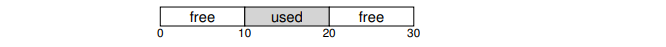

**CRUX: HOW TO MANAGE FREE SPACE - How should free space be managed, when satisfying variable-sized requests? What strategies can be used to minimize fragmentation? What are the time and space overheads of alternate approaches?**

## 17.1 Assumptions
We assume a basic interface such as that provided by malloc() and free(). Specifically, void *malloc(size t size) takes a single parameter, size, which is the number of bytes requested by the application; it hands back a pointer (of no particular type, or a void pointer in C lingo) to a region of that size (or greater).

The complementary routine void free(void *ptr) takes a pointer and frees the corresponding chunk.

Note the implication of the interface: the user, when freeing the space, does not inform the library of its size; thus, the library must be able to figure out how big a chunk of memory is when handed just a pointer to it. We’ll discuss how to do this a bit later on in the chapter.

The space that this library manages is known historically as the **heap**, and the generic data structure used to manage free space in the heap is some kind of **free list**
- This structure contains references to all of the free chunks of space in the managed region of memory. Of course, this data structure need not be a list per se, but just some kind of data structure to track free space.

Allocators could of course also have the problem of **internal fragmentation**; if an allocator hands out chunks of memory bigger than that requested, any unasked for (and thus unused) space in such a chunk is considered internal fragmentation (because the waste occurs inside the allocated unit) and is another example of space waste

## 17.2 Low-level Mechanisms
#### Splitting and Coalescing
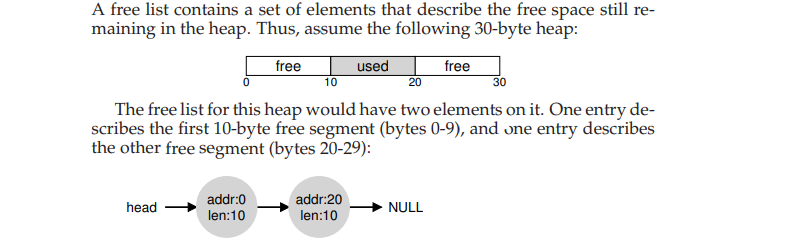

In this case, the allocator will perform an action known as **splitting**: it will find a free chunk of memory that can satisfy the request and split it into two
- The first chunk it will return to the caller; the second chunk will remain on the list

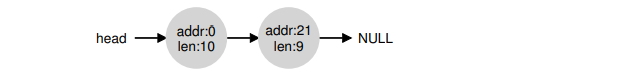

In the picture, you can see the list basically stays intact; the only change is that the free region now starts at 21 instead of 20, and the length of that free region is now just 9

**coalescing** of free space. Take our example from above once more (free 10 bytes, used 10 bytes, and another free 10 bytes). Given this (tiny) heap, what happens when an application calls free(10), thus returning the space in the middle of the heap? If we simply add this free space back into our list without too much thinking, we might end up with a list that looks like this:

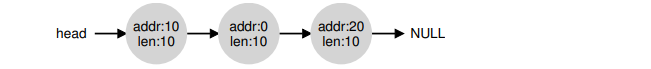

Note the problem: while the entire heap is now free, it is seemingly
divided into three chunks of 10 bytes each. Thus, if a user requests 20
bytes, a simple list traversal will not find such a free chunk, and return
failure.

What allocators do in order to avoid this problem is coalesce free space
when a chunk of memory is freed. The idea is simple: when returning a
free chunk in memory, look carefully at the addresses of the chunk you
are returning as well as the nearby chunks of free space; if the newlyfreed space sits right next to one (or two, as in this example) existing free
chunks, merge them into a single larger free chunk. Thus, with coalescing, our final list should look like this:

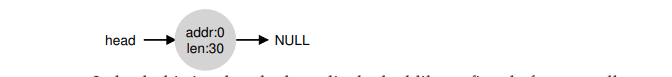

#### Tracking The Size Of Allocated Regions
You might have noticed that the interface to free(void *ptr) does not take a size parameter; thus it is assumed that given a pointer, the malloc library can quickly determine the size of the region of memory being freed and thus incorporate the space back into the free list.

To accomplish this task, most allocators store a little bit of extra information in a **header** block which is kept in memory, usually just before
the handed-out chunk of memory.

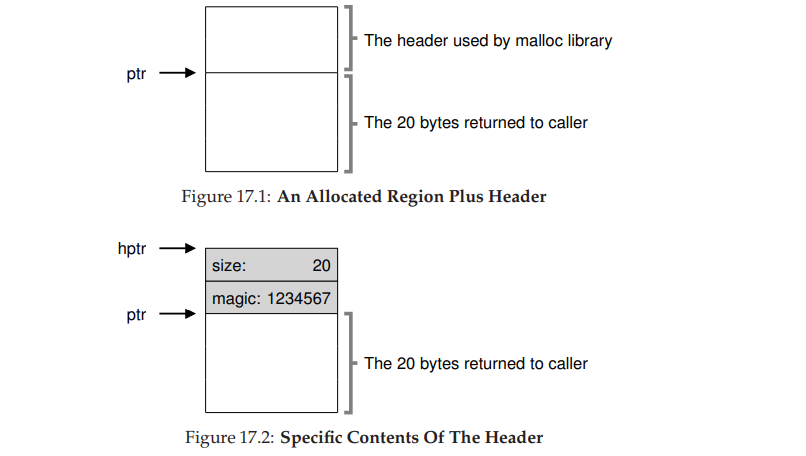

example, we are examining an allocated block of size 20 bytes, pointed to by ptr; imagine the user called malloc() and stored the results in ptr, e.g., ptr = malloc(20);.

The header minimally contains the size of the allocated region (in this case, 20); it may also contain additional pointers to speed up deallocation, a magic number to provide additional integrity checking, and other information.

Let’s assume a simple header which contains the size of the region and a magic number, like this:
    
    typedef struct __header_t {
        int size;
        int magic;
    } header_t;

The example above would look like what you see in Figure 17.2. When the user calls free(ptr), the library then uses simple pointer arithmetic to figure out where the header begins:
    
    void free(void *ptr) {
        header_t *hptr = (void *)ptr - sizeof(header_t);
    }

**Note:** the size of the free region is the size of the header plus the size of the space allocated to the user. Thus, when a user requests N bytes of memory, the library does not search for a free chunk of size N; rather, it searches for a free chunk of size N plus the size of the header.

#### Embedding A Free List
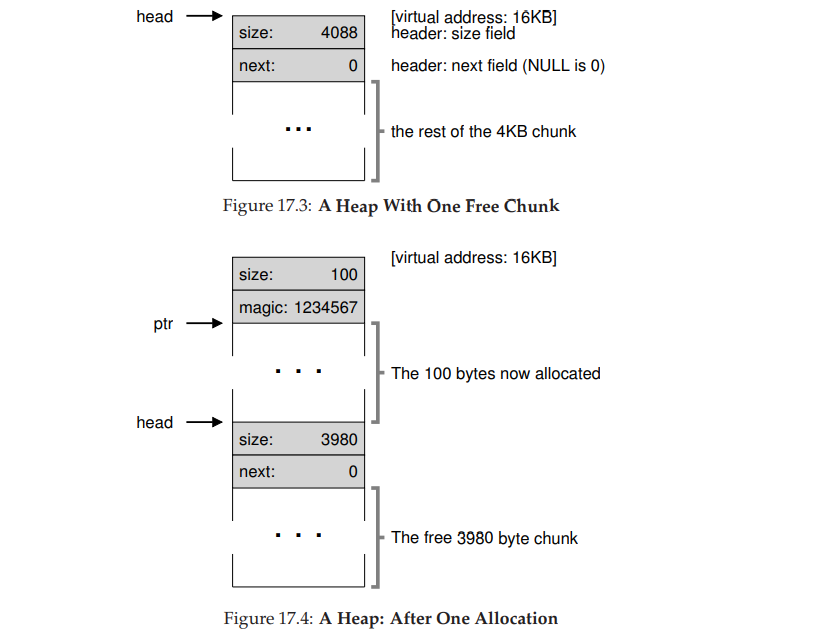

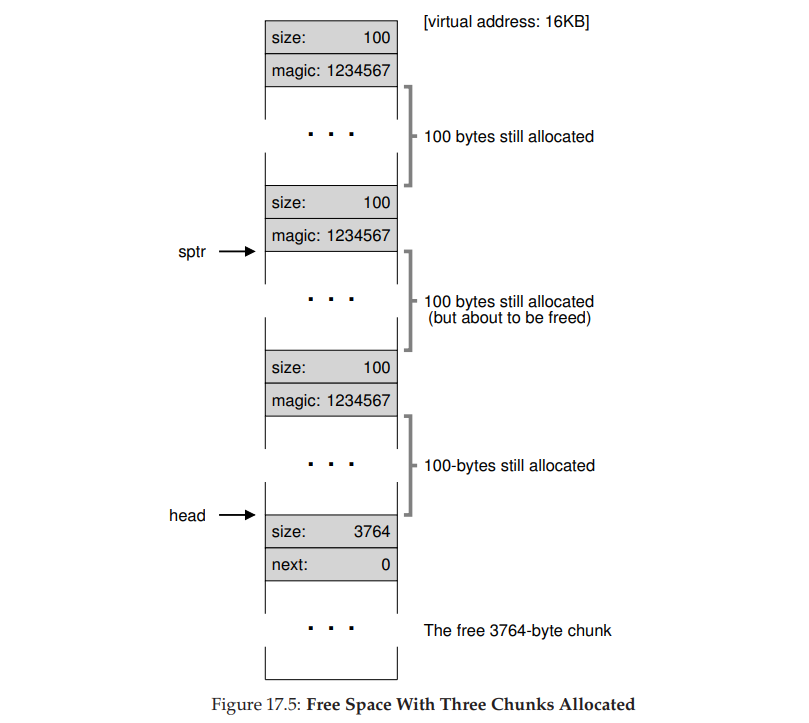

But what happens when the calling program returns some memory via free()?

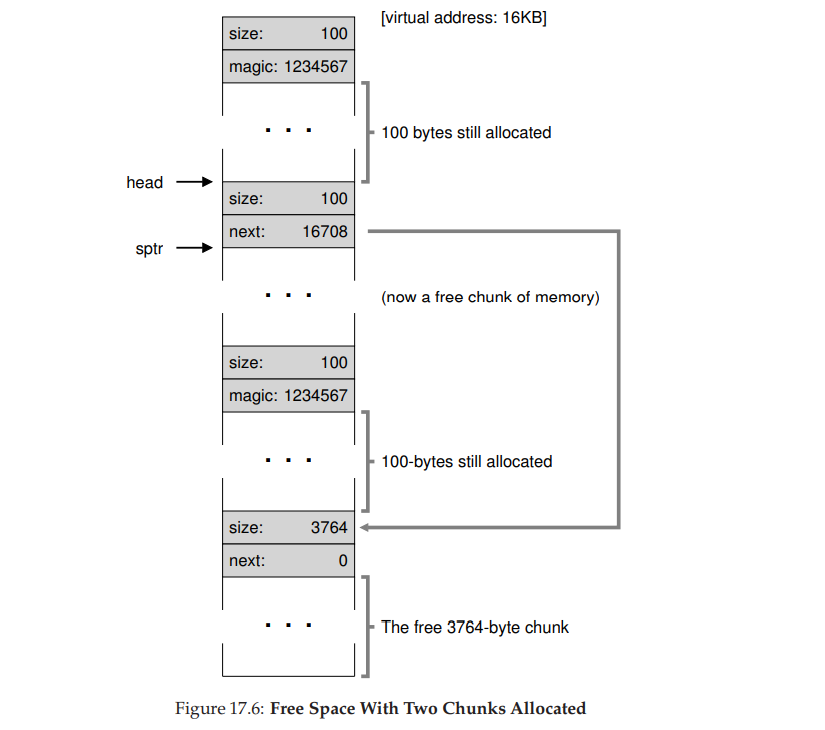

In this example, the application returns the middle chunk of allocated memory, by calling free(16500) (the value 16500 is arrived upon by adding the start of the memory region, 16384, to the 108 of the previous chunk and the 8 bytes of the header for this chunk). This value is shown in the previous diagram by the pointer sptr.

The library immediately figures out the size of the free region, and then adds the free chunk back onto the free list.

#### Growing The Heap

## 17.3 Basic Strategies
The ideal allocator is both fast and minimizes fragmentation

#### Best Fit
The best fit strategy is quite simple: first, search through the free list and
find chunks of free memory that are as big or bigger than the requested
size. Then, return the one that is the smallest in that group of candidates;
this is the so called best-fit chunk (it could be called smallest fit too)

#### Worst Fit
The worst fit approach is the opposite of best fit; find the largest chunk and return the requested amount; keep the remaining (large) chunk on the free list. Worst fit tries to thus leave big chunks free instead of lots ofsmall chunks that can arise from a best-fit approach.

#### First Fit
has the advantage of speed – no exhaustive search of all the free spaces are necessary

address-based ordering; by keeping the list ordered by the address of the free space, coalescing becomes easier, and fragmentation tends to be reduced.

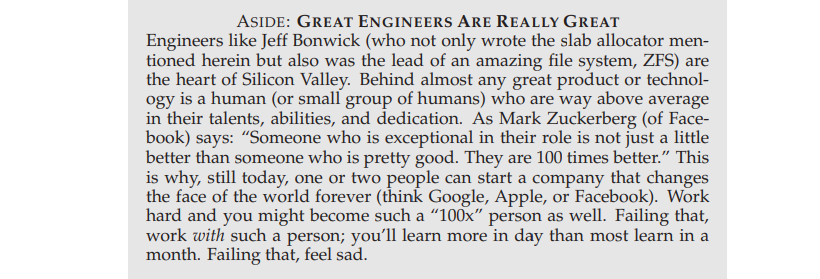

## 17.5 Summary
In this chapter, we’ve discussed the most rudimentary forms of memory allocators. Such allocators exist everywhere, linked into every C program you write, as well as in the underlying OS which is managing memory for its own data structures. 

As with many systems, there are many trade-offs to be made in building such a system, and the more you know about the exact workload presented to an allocator, the more you could do to tune it to work better for that workload. 

Making a fast, space-efficient, scalable allocator that works well for a broad range of workloads remains an on-going challenge in modern computer systems.

# 18 - Paging: Introduction
Remember our goal: to virtualize memory. 

Segmentation (a generalization of dynamic relocation) helped us do this, but has some problems; in particular, managing free space becomes quite a pain as memory becomes fragmented and segmentation is not as flexible as we might like. 

Is there a better solution?

**THE CRUX:
HOW TO VIRTUALIZE MEMORY WITHOUT SEGMENTS - How can we virtualize memory in a way as to avoid the problems of segmentation? What are the basic techniques? How do we make those techniques work well?**

**IDEA:** **paging** 
- goes back to the earliest of computer systems
- Instead of splitting up our address space into three logical segments (each of variable size), we split up our address space into fixed-sized units we call a **page**

Figure 18.1 an example of a tiny address space, only 64 bytes total in size, with 16 byte pages (real address spaces are much bigger, of course, commonly 32 bits and thus 4-GB of address space, or even 64 bits)

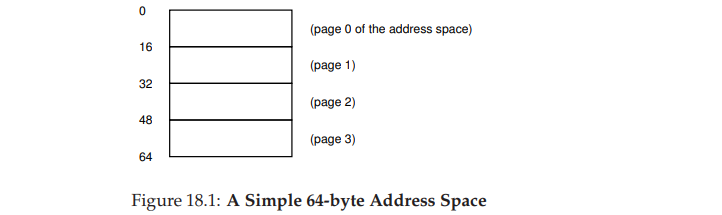

With paging, physical memory is also split into some number of pages as well; we sometimes will call each page of physical memory a **page frame**. For an example, let’s examine Figure 18.2.

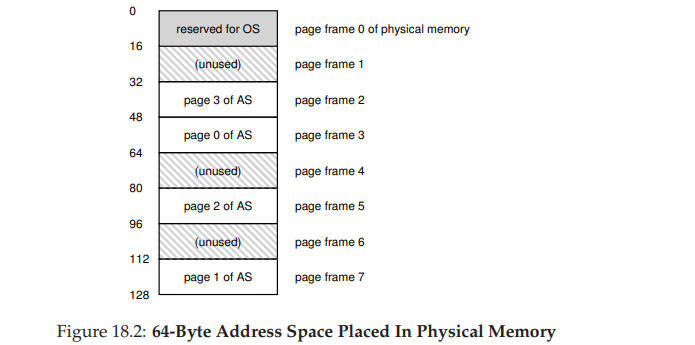

Advantages of paging; 
- **flexibility:** with a fully-developed paging approach, the system will be able to support the abstraction of an address space effectively, regardless of how the processes uses the address space; we won’t, for example, have to make assumptions about how the heap and stack grow and how they are used.
- **simplicity** of free-space management that paging affords
    - Eg: when the OS wishes to place our tiny 64-byte address space from above into our 8-page physical memory, it simply finds four free pages; perhaps the OS keeps a **free list** of all free pages for this, and just grabs the first four free pages off of this list
 
**page table** - stores **address translations** for each of the virtual pages of the address space, thus letting us know where in physical memory they live

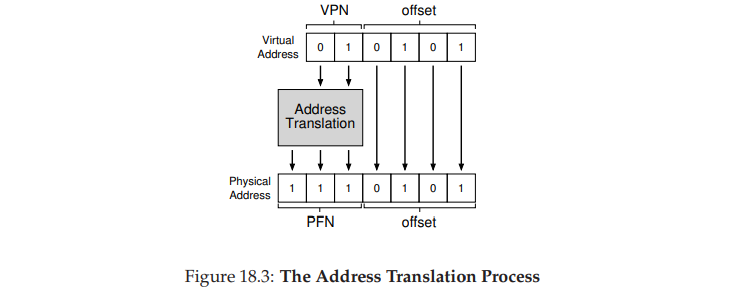



## 18.1 Where Are Page Tables Stored?
Because page tables are so big, we don’t keep any special on-chip hardware in the MMU to store the page table of the currently-running process.
Instead, we store the page table for each process in **memory** somewhere.

## 18.2 What’s Actually In The Page Table?
Let’s talk a little about page table organization. The page table is just a
data structure that is used to map virtual addresses (or really, virtual page
numbers) to physical addresses (physical page numbers). Thus, any data
structure could work. The simplest form is called a linear page table,
which is just an array

As for the contents of each PTE, we have a number of different bits in there worth understanding at some level. A **valid bit** is common to indicate whether the particular translation is valid; for example, when a program starts running, it will have code and heap at one end of its address space, and the stack at the other. All the unused space in-between will be marked invalid, and if the process tries to access such memory, it will generate a trap to the OS which will likely terminate the process.

- **protection bits**, indicating whether the page could be read from, written to, or executed from - accessing a page in a way not allowed by these bits will generate a trap to the OS.
- **present bit** indicates whether this page is in physical memory or on disk (swapped out)
- **dirty bit** is also common, indicating whether the page has been modified since it was brought into memory
- **reference bit** (a.k.a. accessed bit) is sometimes used to track whether a page has been accessed, and is useful in determining which pages are popular and thus should be kept in memory; such knowledge is critical during **page replacement**

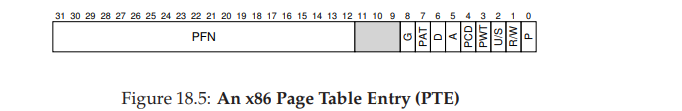

Figure 18.5 shows an example page table entry from the x86 architecture [I09]. It contains a present bit (P); a read/write bit (R/W) which
determines if writes are allowed to this page; a user/supervisor bit (U/S)
which determines if user-mode processes can access the page; a few bits
(PWT, PCD, PAT, and G) that determine how hardware caching works for
these pages; an accessed bit (A) and a dirty bit (D); and finally, the page
frame number (PFN) itself.



## 18.3 Paging: Also Too Slow
    movl 21, %eax

To find the location of the desired PTE, the hardware will thus perform the following functions:

    VPN = (VirtualAddress & VPN_MASK) >> SHIFT
    PTEAddr = PageTableBaseRegister + (VPN * sizeof(PTE))

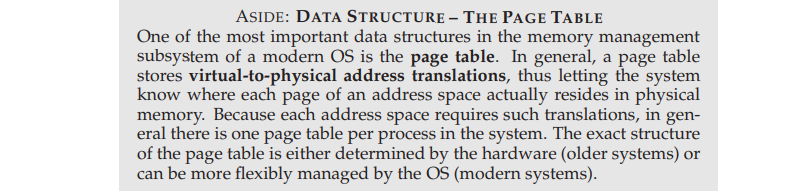

For every memory reference (whether an instruction fetch or an explicit load or store), paging requires us to perform one extra memory reference in order to first fetch the translation from the page table. That is a lot of work! Extra memory references are costly, and in this case will likely slow down the process by a factor of two or more.

2 problems that we must solve; Without careful design of both hardware and software, page tables will cause the system to run too slowly, as well as take up too much memory


## 18.5 Summary
We have introduced the concept of paging as a solution to our challenge of virtualizing memory

Paging has many advantages over previous approaches (such as segmentation). 
- First, it does not lead to external fragmentation, as paging (by design) divides memory into fixed-sized units. 
- Second, it is quite flexible, enabling the sparse use of virtual address spaces. 

However, implementing paging support without care will lead to a slower machine (with many extra memory accesses to access the page table) as well as memory waste (with memory filled with page tables instead of useful application data)

# 19 - Paging: Faster Translations (TLBs)
Using paging as the core mechanism to support virtual memory can lead to high performance overheads. By chopping the address space into small, fixed-sized units (i.e., pages), paging requires a large amount of mapping information

Because that mapping information is generally stored in physical memory, paging logically requires an extra memory lookup for each virtual address generated by the program. 

Going to memory for translation information before every instruction fetch or explicit load or store is prohibitively slow. And thus our problem:

**THE CRUX: HOW TO SPEED UP ADDRESS TRANSLATION - How can we speed up address translation, and generally avoid the extra memory reference that paging seems to require? What hardware support is required? What OS involvement is needed?**

<mark>**When we want to make things fast, the OS usually needs some help. And help often comes from the OS’s old friend: the hardware.**</mark>

To speed address translation, we are going to add what is called (for historical reasons) a **translation-lookaside buffer**, or **TLB**

A TLB is part of the chip’s **memory-management unit (MMU**), and is simply a hardware **cache** of popular virtual-to-physical address translations; thus, a better name would be an **address-translation cache**

Upon each virtual memory reference, the hardware first checks the TLB to see if the desired translation is held therein; if so, the translation is performed (quickly) without having to consult the page table (which has all translations). 

Because of their tremendous performance impact, TLBs in a real sense make virtual memory possible 

## 19.2 Example: Accessing An Array

- TLBs leverage spatial locality (proximity in memory) and temporal locality (repeated access over time) to improve memory translation performance.
- Programs with these properties achieve high TLB hit rates, minimizing costly TLB misses and improving execution speed.

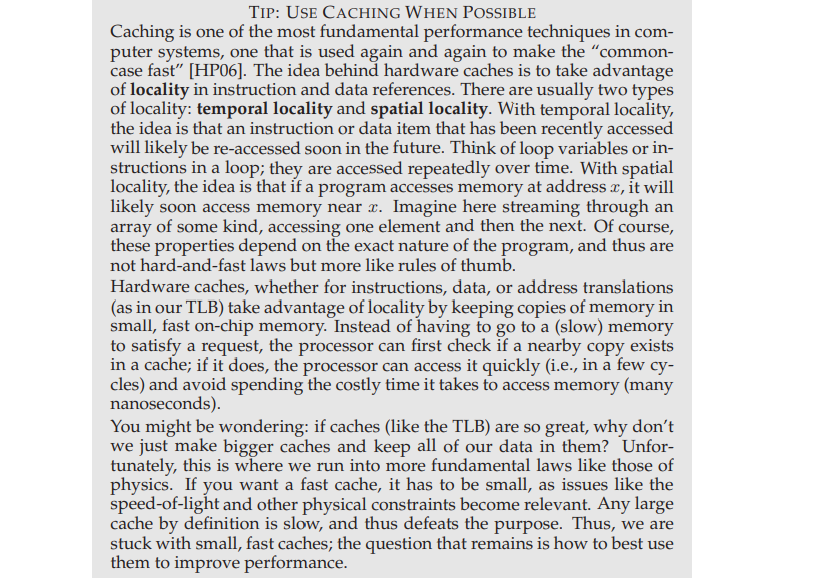


## 19.3 Who Handles The TLB Miss?
Two answers are possible: the hardware, or the software (OS). 

In the olden days, the hardware had complex instruction sets (sometimes called **CISC**) and the people who built the hardware didn’t much trust those sneaky OS people. Thus, the hardware would handle the TLB miss entirely. 

To do this, the hardware has to know exactly where the page tables are located in memory (via a pagetable base register), as well as their exact format; on a miss, the hardware would “walk” the page table, find the correct page-table entry and extract the desired translation, update the TLB with the translation, and retry the instruction. 

An example of an “older” architecture that has **hardware-managed TLBs** is the Intel x86 architecture, which uses a fixed multi-level page table 

More modern architectures (e.g., MIPS R10k or Sun’s SPARC v9, both **RISC** or reduced-instruction set computers) have what is known as a **software-managed TLB**

On a TLB miss, the hardware simply raises an exception, which pauses the current instruction stream, raises the privilege level to kernel mode, and jumps to a **trap handler**

this trap handler is code within the OS that is written with the express purpose of handling TLB misses

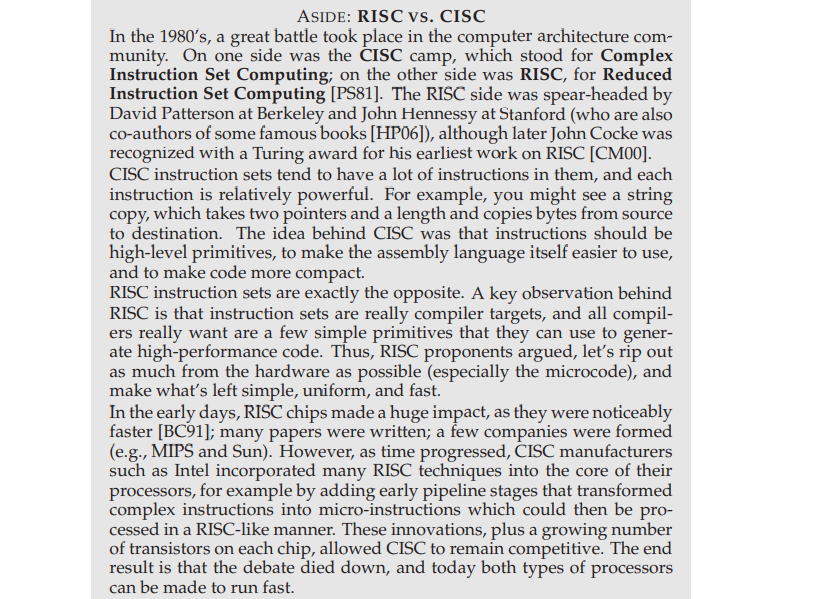



## 19.4 TLB Contents: What’s In There?
A typical TLB might have 32, 64, or 128 entries and be what is called **fully associative** - any given translation can be anywhere in the TLB, and that the hardware will search the entire TLB in parallel to find the desired translation

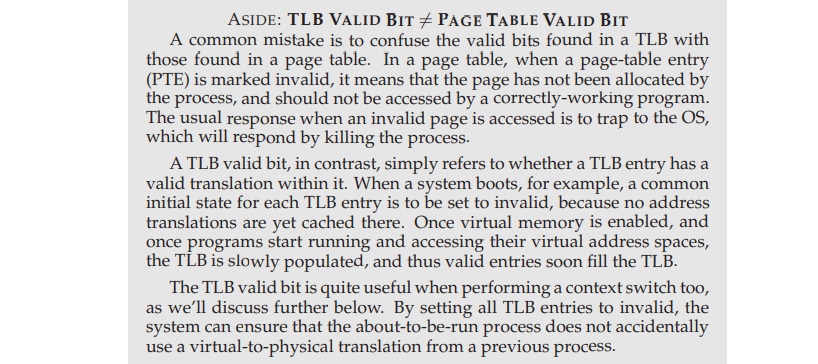

More interesting are the “other bits”. For example, the TLB commonly
has a valid bit, which says whether the entry has a valid translation or
not. Also common are protection bits, which determine how a page can
be accessed (as in the page table). For example, code pages might be
marked read and execute, whereas heap pages might be marked read and
write. There may also be a few other fields, including an address-space
identifier, a dirty bit, and so forth

## 19.5 TLB Issue: Context Switches
**THE CRUX: HOW TO MANAGE TLB CONTENTS ON A CONTEXT SWITCH - When context-switching between processes, the translations in the TLB for the last process are not meaningful to the about-to-be-run process. What should the hardware or OS do in order to solve this problem?**

There are a number of possible solutions to this problem. One approach is to simply **flush** the TLB on context switches

To reduce overhead, some systems add hardware support to enable sharing of the TLB across context switches. In particular, some hardware systems provide an address space identifier (ASID) field in the TLB. You can think of the ASID as a process identifier (PID), but usually it has fewer bits (e.g., 8 bits for the ASID versus 32 bits for a PID).

If we take our example TLB from above and add ASIDs, it is clear
processes can readily share the TLB: only the ASID field is needed to differentiate otherwise identical translations. Here is a depiction of a TLB
with the added ASID field:

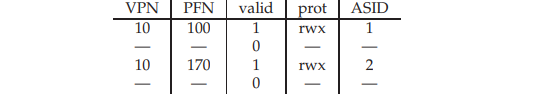

Thus, with address-space identifiers, the TLB can hold translations
from different processes at the same time without any confusion

## 19.6 Issue: Replacement Policy
As with any cache, and thus also with the TLB, one more issue that we must consider is cache replacement. Specifically, when we are installing a new entry in the TLB, we have to replace an old one, and thus the question: which one to replace?

**THE CRUX: HOW TO DESIGN TLB REPLACEMENT POLICY - Which TLB entry should be replaced when we add a new TLB entry? The goal, of course, being to minimize the miss rate (or increase hit rate) and thus improve performance.**

- least-recently-used or LRU
- random

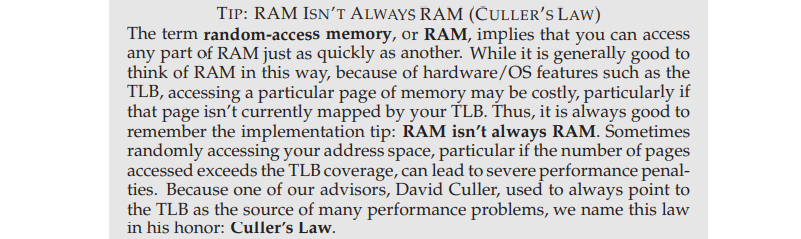

## Summary of 19.8

Modern hardware leverages **Translation Lookaside Buffers (TLBs)** to enhance the performance of address translation by caching frequently used translations on-chip. This approach minimizes the need to access the page table in main memory, allowing most memory references to execute quickly, as if memory virtualization weren’t in use—a critical feature for modern operating systems.

### Key Points:
- **Benefits of TLBs**:
  - Most memory references are resolved quickly due to the cached translations.
  - The performance of programs benefits significantly from this optimization, making paging practical in modern systems.

- **Limitations of TLBs**:
  - **TLB Coverage**: Programs accessing more pages than the TLB can hold experience frequent TLB misses, leading to slower performance.
  - **Mitigation**: Larger page sizes can increase TLB coverage by mapping large data structures (e.g., database management systems) more efficiently into the address space.

- **Potential Bottlenecks**:
  - **Physically-Indexed Caches**: These require address translation before cache access, which can slow down the CPU pipeline.
  - **Virtual Caches**: Using virtual addresses for cache indexing avoids translation delays but introduces additional complexity in hardware design.

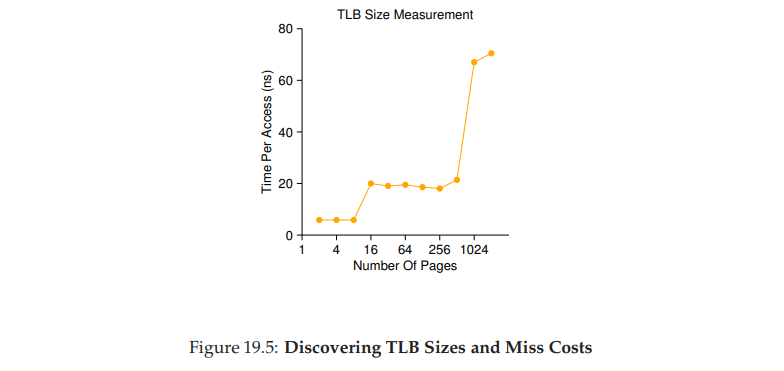

## Paging: Smaller Tables
We now tackle the second problem that paging introduces: page tables are too big and thus consume too much memory

Recall: we usually have one page table for every process in the system!

With a hundred active processes (not uncommon on a modern system), we will be allocating hundreds of megabytes of memory just for page tables!

As a result, we are in search of some techniques to reduce this heavy burden - there are a lot of them

**CRUX: HOW TO MAKE PAGE TABLES SMALLER? Simple array-based page tables (usually called linear page tables) are too big, taking up far too much memory on typical systems. How can we make page tables smaller? What are the key ideas? What inefficiencies arise as a result of these new data structures?**

## 20.1 Simple Solution: Bigger Pages
We could reduce the size of the page table in one simple way: use bigger pages

The major problem with this approach, however, is that big pages lead to waste **within** each page, a problem known as **internal fragmentation** (as the waste is **internal** to the unit of allocation)

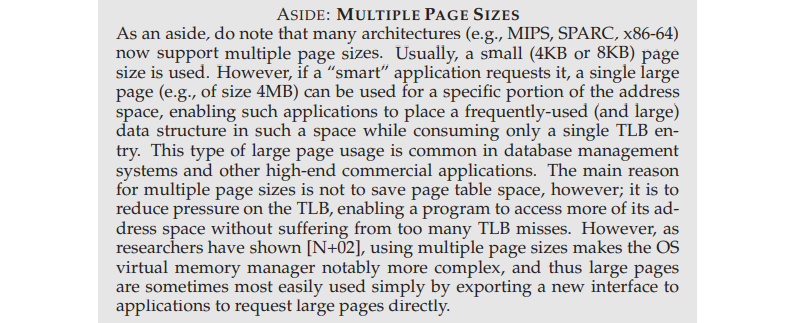



## 20.2 Hybrid Approach: Paging and Segments
Whenever you have two reasonable but different approaches to something in life, you should always examine the combination of the two to see if you can obtain the best of both worlds. We call such a combination a hybrid.

We can see why this might work by examining a typical linear page table in more detail. Assume we have an address space in which the used portions of the heap and stack are small. For the example, we use a tiny 16KB address space with 1KB pages (Figure 20.1); the page table for this address space is in Table 20.1.

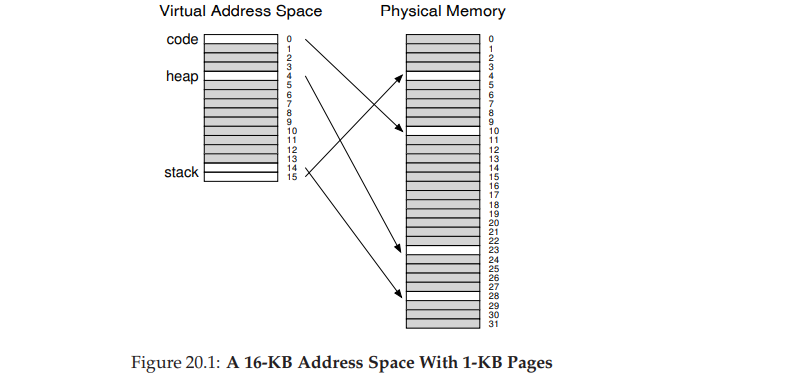

This example assumes the single code page (VPN 0) is mapped to
physical page 10, the single heap page (VPN 4) to physical page 23, and
the two stack pages at the other end of the address space (VPNs 14 and
15) are mapped to physical pages 28 and 4, respectively

As you can see from the picture, most of the page table is unused, full of **invalid** entries - What a waste! And this is for a tiny 16KB address space

Thus, our hybrid approach: instead of having a single page table for the entire address space of the process, why not have one per logical segment?

In this example, we might thus have three page tables, one for the code, heap, and stack parts of the address space

Now, remember with segmentation, we had a base register that told us where each segment lived in physical memory, and a bound or limit register that told us the size of said segment.

In our hybrid, we still have those structures in the MMU; here, we use the base not to point to the segment itself but rather to hold the physical address of the page table of that segment. The bounds register is used to indicate the end of the page table (i.e., how many valid pages it has).

    SN = (VirtualAddress & SEG_MASK) >> SN_SHIFT
    VPN = (VirtualAddress & VPN_MASK) >> VPN_SHIFT
    AddressOfPTE = Base[SN] + (VPN * sizeof(PTE))

This sequence should look familiar; it is virtually identical to what we saw before with linear page tables. The only difference, of course, is the use of one of three segment base registers instead of the single page table base register.

**TIP: USE HYBRIDS - When you have two good and seemingly opposing ideas, you should always see if you can combine them into a hybrid that manages to achieve the best of both worlds. Hybrid corn species, for example, are known to be more robust than any naturally-occurring species. Of course, not all hybrids are a good idea**

our hybrid approach realizes a significant memory savings compared to
the linear page table; unallocated pages between the stack and the heap
no longer take up space in a page table (just to mark them as not valid).

this approach is not without problems.
1. still requires us to use segmentation; segmentation is not quite as flexible as we would like, as it assumes a certain usage pattern of the address space; if we have a large but sparsely-used heap, for example, we can still end up with a lot of page table waste.
2. Second, this hybrid causes external fragmentation to arise again. While most of memory is managed in page-sized units, page tables now can be of arbitrary size (in multiples of PTEs). Thus, finding free space for them in memory is more complicated

## 20.3 Multi-level Page Tables
**multi-level page table** - turns the linear page table into something like a tree

so effective that many modern systems employ it (e.g., x86)

The basic idea behind a multi-level page table is simple. First, chop up the page table into page-sized units; then, if an entire page of page-table entries (PTEs) is invalid, don’t allocate that page of the page table at all. To track whether a page of the page table is valid (and if valid, where it is in memory), use a new structure, called the **page directory**

The page directory thus either can be used to tell you where a page of the page table is, or that the entire page of the page table contains no valid pages.

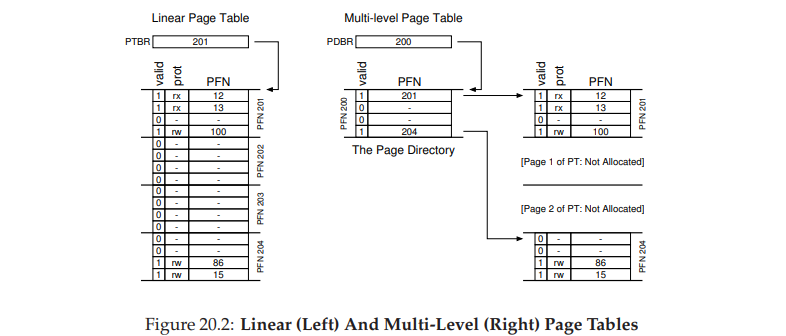

Figure 20.2 shows an example. 
- left - linear page table; even though most of the middle regions of the address space are not valid, we still have to have page-table space allocated for those regions (i.e., the middle two pages of the page table). 
- right - multi-level page table. The page directory marks just two pages of the page table as valid (the first and last); thus, just those two pages of the page table reside in memory

And thus you can see one way to visualize what a multi-level table is doing: it just makes parts of the linear page table disappear (freeing those frames for other uses), and tracks which pages of the page table are allocated with the page directory.

The page directory, in a simple two-level table, contains one entry per
page of the page table. It consists of a number of page directory entries
(PDE). A PDE (minimally) has a valid bit and a page frame number
(PFN), similar to a PTE

Multi-level page tables have some obvious advantages over approaches we’ve seen thus far. 
1. the multi-level table only allocates page-table space in proportion to the amount of address space you are using; thus it is generally compact and supports sparse address spaces.
2. if carefully constructed, each portion of the page table fits neatly within a page, making it easier to manage memory; the OS can simply grab the next free page when it needs to allocate or grow a page table.

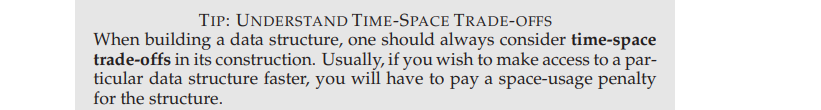

It should be noted that there is a cost to multi-level tables; on a TLB
miss, two loads from memory will be required to get the right translation
information from the page table (one for the page directory, and one for
the PTE itself), in contrast to just one load with a linear page table

Thus, the multi-level table is a small example of a **time-space trade-off**

Often we are willing to increase complexity in order to improve performance or reduce overheads; in the case of a multi-level table, we make page-table lookups more complicated in order to save valuable memory.



#### A Detailed Multi-Level Example
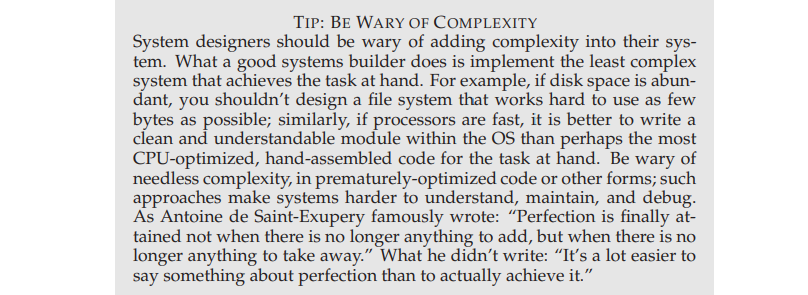

##### Benefits:
- Multi-level tables reduce memory usage by allocating only required portions of the page table.
- Scales well for larger address spaces.

##### Challenges:
- For even larger address spaces (e.g., 32-bit or 64-bit), two-level page tables may still be insufficient, requiring more levels for further space optimization.

#### More Than Two Levels
In our example thus far, we’ve assumed that multi-level page tables only have two levels: a page directory and then pieces of the page table. In some cases, a deeper tree is possible (and indeed, needed).

Efficiency Trade-Off:
- Multi-level page tables save memory by only allocating needed table pages for valid mappings.
- However, this introduces additional memory access overhead during translation, especially on TLB misses.

Multi-level structures are essential for balancing memory efficiency and lookup complexity in modern systems.

## 20.5 Swapping the Page Tables to Disk
Finally, we discuss the relaxation of one final assumption. Thus far,
we have assumed that page tables reside in kernel-owned physical memory. Even with our many tricks to reduce the size of page tables, it is still
possible, however, that they may be too big to fit into memory all at once.
Thus, some systems place such page tables in kernel virtual memory,
thereby allowing the system to swap some of these page tables to disk
when memory pressure gets a little tight

## 20.6 Summary
Modern page tables are not just linear arrays but complex data structures designed to balance **time** and **space** trade-offs.
- **Larger Tables:** Faster TLB miss resolution but consume more memory.
- **Smaller Tables:** Save memory but result in slower TLB miss handling.

- **Choice of Structure:**
  - **Memory-Constrained Systems:** Favor smaller structures to optimize limited resources.
  - **Memory-Rich Systems:** Larger structures are better suited for workloads using many pages, improving TLB miss performance.

- **Software-Managed TLBs:** Allow for innovative data structures, offering flexibility for operating system developers.

# 21 - Beyond Physical Memory: Mechanisms
Thus far, we’ve assumed that an address space is unrealistically small and fits into physical memory. In fact, we’ve been assuming that every address space of every running process fits into memory. 

We will now relax these big assumptions, and assume that we wish to support many concurrently-running large address spaces.

To do so, we require an additional level in the **memory hierarchy**

Thus far, we have assumed that all pages reside in physical memory. However, to support large address spaces, the OS will need a place to stash away portions of address spaces that currently aren’t in great demand.

In general, the characteristics of such a location are that it should have more capacity than memory; as a result, it is generally slower (if it were faster, we would just use it as memory)

In modern systems, this role is usually served by a hard disk drive. Thus, in our memory hierarchy, big and slow hard drives sit at the bottom, with memory just above

**THE CRUX: HOW TO GO BEYOND PHYSICAL MEMORY - How can the OS make use of a larger, slower device to transparently provide the illusion of a large virtual address space?**

why do we want to support a single large address space for a process? convenience and ease of use.

With a large address space, you don’t have to worry about if there is room enough in memory for your program’s data structures; rather, you just write the program naturally, allocating memory as needed - It is a powerful illusion that the OS provides, and makes your life vastly simpler.

A contrast is found in older systems that used memory overlays, which required programmers to manually move pieces of code or data in and out of memory as they were needed
- before calling a function or accessing some data, you need to first arrange for the code or data to be in memory; yuck!

## 21.1 Swap Space
The first thing we will need to do is to reserve some space on the disk for moving pages back and forth

In operating systems, we generally refer to such space as **swap space**, because we swap pages out of memory to it and swap pages into memory from it
- Thus, we will simply assume that the OS can read from and write to the swap space, in page-sized units.

The size of the swap space is important, as ultimately it determines the maximum number of memory pages that can be in use by a system at a given time.

We should note that swap space is not the only on-disk location for swapping traffic. For example, assume you are running a program binary (e.g., ls, or your own compiled main program). The code pages from this binary are initially found on disk, and when the program runs, they are loaded into memory (either all at once when the program starts execution or, as in modern systems, one page at a time when needed)
- However, if the system needs to make room in physical memory for other needs, it can safely re-use the memory space for these code pages, knowing that it can later swap them in again from the on-disk binary in the file system.

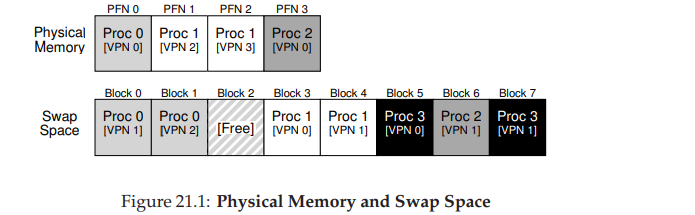



## 21.2 The Present Bit

If we wish to allow pages to be swapped to disk, however, we must add even more machinery. Specifically, when the hardware looks in the PTE, it may find that the page is not present in physical memory. The way the hardware (or the OS, in a software-managed TLB approach) determines this is through a new piece of information in each page-table entry, known as the **present bit**.

If the present bit is set to one, it means the page is present in physical memory and everything proceeds as above; if it is set to zero, the page is **not** in memory but rather on disk somewhere.

The act of accessing a page that is not in physical memory is commonly referred to as a **page fault**.

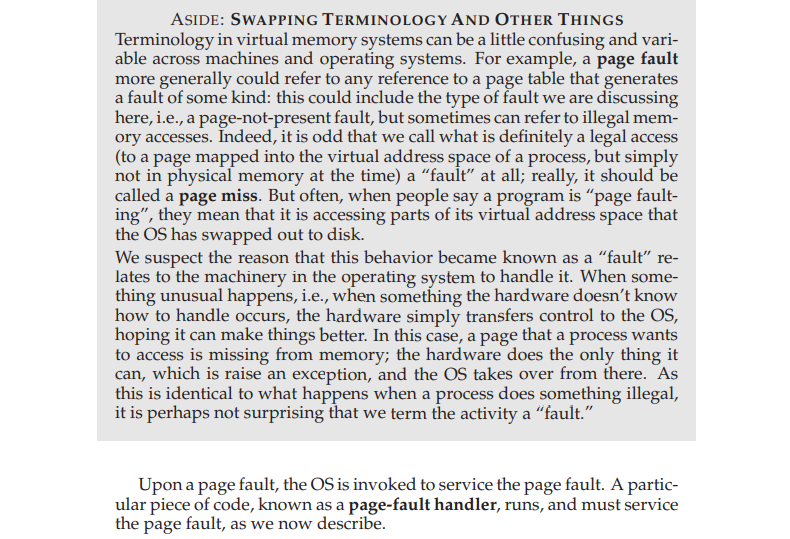



## 21.3 The Page Fault
Recall that with TLB misses, we have two types of systems: hardwaremanaged TLBs (where the hardware looks in the page table to find the
desired translation) and software-managed TLBs (where the OS does).

In either type of system, if a page is not present, the OS is put in charge to handle the page fault. The appropriately-named OS page-fault handler runs to determine what to do.

Virtually all systems handle page faults in software; even with a hardware-managed TLB, the hardware trusts the OS to manage this important duty.

If a page is not present and has been swapped to disk, the OS will need
to swap the page into memory in order to service the page fault. Thus, a
question arises: how will the OS know where to find the desired page? In
many systems, the page table is a natural place to store such information.
Thus, the OS could use the bits in the PTE normally used for data such as
the PFN of the page for a disk address. When the OS receives a page fault
for a page, it looks in the PTE to find the address, and issues the request
to disk to fetch the page into memory.

When the disk I/O completes, the OS will then update the page table to mark the page as present, update the PFN field of the page-table entry (PTE) to record the in-memory location of the newly-fetched page, and retry the instruction.

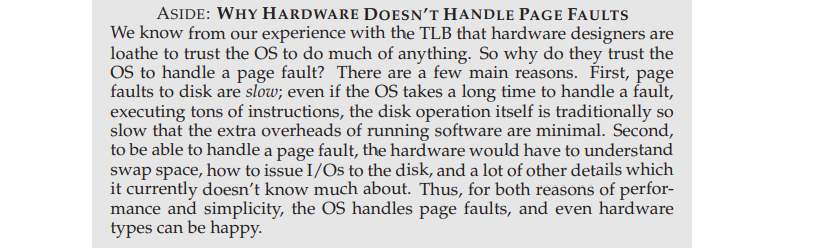

Note that while the I/O is in flight, the process will be in the **blocked** state. Thus, the OS will be free to run other ready processes while the page fault is being serviced. Because I/O is expensive, this overlap of the I/O (page fault) of one process and the execution of another is yet another way a multiprogrammed system can make the most effective use of its hardware

## 21.4 What If Memory Is Full?
the OS might like to first **page out** one or more pages to make room for the new page(s) the OS is about to bring in. The process of picking a page to kick out, or replace is known as the **page-replacement policy**.

a lot of thought has been put into creating a good pagereplacement policy, as kicking out the wrong page can exact a great cost on program performance. Making the wrong decision can cause a program to run at disk-like speeds instead of memory-like speeds - 10,000 or 100,000 times slower.

## 21.5 Page Fault Control Flow
With all of this knowledge in place, we can now roughly sketch the complete control flow of memory access. 

In other words, when somebody asks you “what happens when a program fetches some data from memory?”, you should have a pretty good idea of all the different possibilities.

#### Hardware Control Flow (Figure 21.2)
When a program fetches data from memory, three cases occur during a **TLB miss**:
1. **Page Present and Valid:**  
   - TLB miss handler retrieves the **Page Frame Number (PFN)** from the **Page Table Entry (PTE)**.  
   - The instruction is retried, resulting in a **TLB hit**, and execution continues.

2. **Page Valid but Not Present:**  
   - The **page fault handler** runs because the page isn't in physical memory.  
   - The OS brings the page into memory.

3. **Invalid Page Access:**  
   - Caused by a program bug or unauthorized access.  
   - The OS trap handler terminates the offending process.

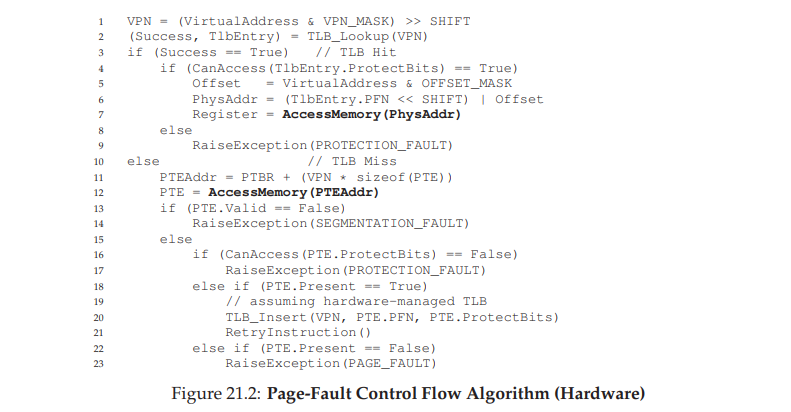

---

#### Software Control Flow (Figure 21.3)
When the OS handles a **page fault**:
1. **Find a Free Frame:**  
   - Locate a free physical frame.  
   - If none is available, run the **replacement algorithm** to evict a page.

2. **Read the Page from Disk:**  
   - Issue an I/O request to bring the page from swap space into the physical frame.  
   - Wait for the operation to complete.

3. **Update the Page Table:**  
   - Mark the page as present and update the PTE with the new PFN.

4. **Retry the Instruction:**  
   - On retry, the TLB initially misses but eventually hits, enabling hardware access to the data.
  
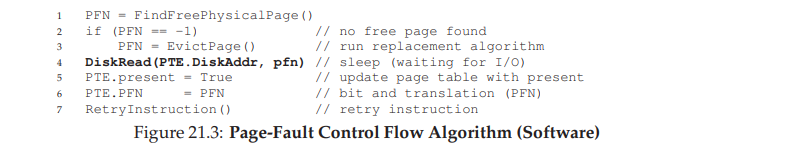

---

#### Key Points
- **Hardware and OS Coordination:** The hardware handles translation and traps invalid access, while the OS manages memory through replacement and I/O.  
- **Efficient Memory Access:** A combination of TLB hits and OS handling ensures efficient access, even with faults.


## 21.6 When Replacements Really Occur
Thus far, the way we’ve described how replacements occur assumes
that the OS waits until memory is entirely full, and only then replaces
(evicts) a page to make room for some other page. As you can imagine,
this is a little bit unrealistic, and there are many reasons for the OS to keep
a small portion of memory free more proactively

To keep a small amount of memory free, most operating systems thus have some kind of **high watermark** (**HW**) and **low watermark** (**LW**) to help decide when to start evicting pages from memory

when the OS notices that there are fewer than **LW** pages available, a background thread that is responsible for freeing memory runs. The thread evicts pages until there are **HW** pages available. The background thread, sometimes called the **swap daemon** or **page daemon** then goes to sleep, happy that is has freed some memory for running processes and the OS to use

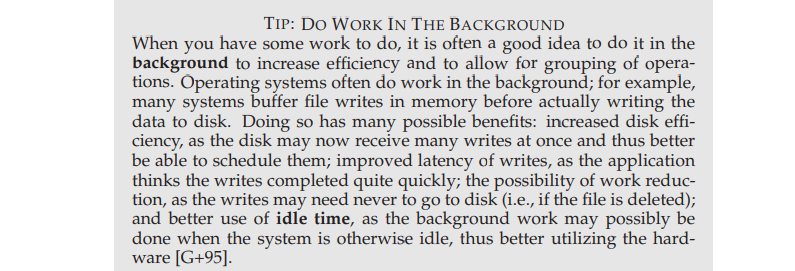

**ASIDE:** Buffering is the practice of preloading and storing a portion of a media file in the buffer or temporary memory of a device. This process enables video, audio, gaming, or other media files to be played smoothly and without jitter or stuttering.

## 21.7 Summary

In this chapter, we introduced the concept of accessing more memory than is physically available in a system. This requires more complex page-table structures, including a present bit to indicate whether a page is in memory. If a page is not present, the operating system's page-fault handler is triggered to fetch the page from disk, possibly after swapping out other pages to free space in memory.

Importantly, these actions occur transparently to the process, which views its memory as contiguous and private. Behind the scenes, however, pages are placed non-contiguously in physical memory, and some pages might not even be in memory at all, requiring a fetch from disk. While memory access is typically fast, in some cases, it may require multiple disk operations, and a simple instruction could take several milliseconds to complete in the worst case.


# 22 - Beyond Physical Memory: Policies
In a virtual memory manager, life is easy when you have a lot of free memory. A page fault occurs, you find a free page on the free-page list, and assign it to the faulting page.

Unfortunately, things get a little more interesting when little memory is free. In such a case, this **memory pressure** forces the OS to start **paging out** pages to make room for actively-used pages.

Deciding which page (or pages) to **evict** is encapsulated within the **replacement policy** of the OS; historically, it was one of the most important decisions the early virtual memory systems made, as older systems had little physical memory

**THE CRUX: HOW TO DECIDE WHICH PAGE TO EVICT -How can the OS decide which page (or pages) to evict from memory? This decision is made by the replacement policy of the system, which usually follows some general principles (discussed below) but also includes certain tweaks to avoid corner-case behaviors.**

## 22.1 Cache Management
Given that main memory holds some subset of all the pages in the system, it can rightly be viewed as a cache for virtual memory pages in the system

Thus, our goal in picking a replacement policy for this cache is to min/max the number of page misses/hits

Average Memory Access Time; `AMAT = (Hit% * TM) + (Miss% * TD)`, where TM represents the cost of accessing memory, and represents TD the
cost of accessing disk

To calculate AMAT, we simply need to know the cost of accessing memory and the cost of accessing disk.

Unfortunately, the cost of disk access is so high in modern systems that even a tiny miss rate will quickly dominate the overall AMAT of running programs

## 22.2 The Optimal Replacement Policy
an optimal policy was developed by Belady many years ago (he originally called it MIN). 

The optimal replacement policy leads to the fewest number of misses overall. 

Belady showed that a simple approach that replaces the page that will be accessed furthest in the future is the optimal policy, resulting in the fewest-possible cache misses.

#### Limitations of the Optimal Policy
While ideal in theory, the optimal policy requires knowledge of future memory accesses, which is impractical for general-purpose systems. Thus, it is primarily used as a benchmark to evaluate the effectiveness of real-world replacement strategies.

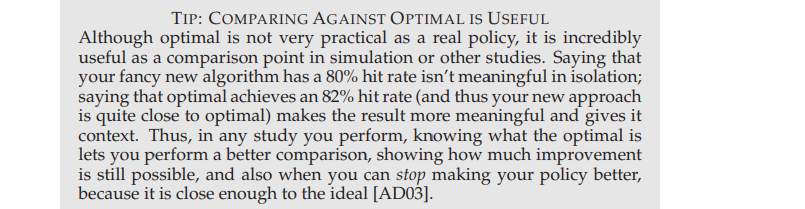

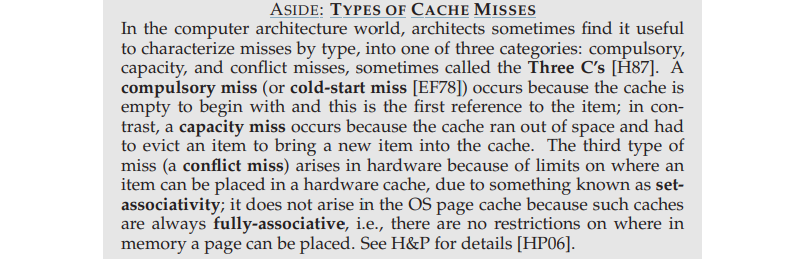



## 22.3 A Simple Policy: FIFO

## 22.4 Another Simple Policy: Random
Of course, how Random does depends entirely upon how lucky (or unlucky) Random gets in its choices.

## 22.5 Using History: LRU
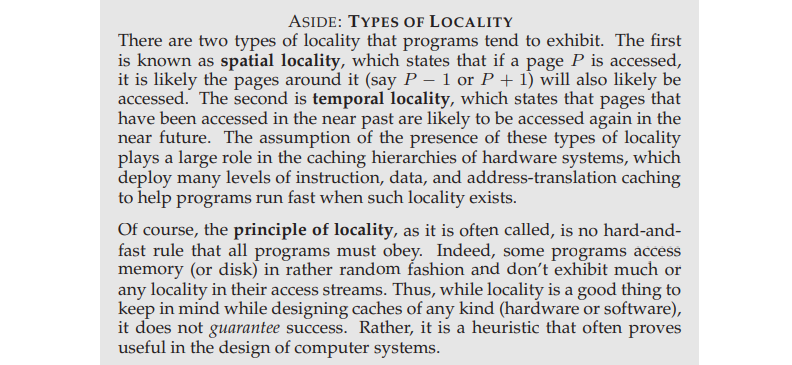

LRU uses historical information about page accesses to make eviction decisions. It assumes that pages recently accessed are more likely to be used again, based on the **principle of locality**:

#### Key Features
- **Historical Basis**: LRU tracks the recency of page accesses and evicts the least recently used page when necessary.
- **Improved Accuracy**: Compared to FIFO or Random policies, LRU better approximates the optimal replacement by leveraging past access patterns.

#### Example
Using the reference stream with a cache size of 3:
- Pages 0, 1, and 2 are loaded initially (compulsory misses).
- Page 3 is accessed, and LRU evicts page 2 (least recently used). The cache contains pages 0, 1, and 3.
- Page 0 is then evicted when page 2 is accessed, as pages 1 and 3 were used more recently.

**Performance**: In the given example, LRU matches the performance of the optimal policy, demonstrating its effectiveness in scenarios with clear locality.

#### Other Historical Policies
- **LFU (Least Frequently Used)**: Evicts the page with the lowest access frequency.  
- **MFU (Most Frequently Used)** and **MRU (Most Recently Used)**: Typically perform poorly as they go against the principle of locality.

#### Strengths and Weaknesses
- **Strengths**: LRU adapts to access patterns and aligns well with program behavior in most cases. It often outperforms stateless policies like FIFO or Random.
- **Weaknesses**: LRU's reliance on historical data may still fail if the program lacks locality (e.g., random access patterns).

#### Conclusion
LRU is a powerful and intuitive replacement policy that uses the past to predict the future. By leveraging locality, it approaches optimal performance in many scenarios.


## 22.6 Workload Examples

**Eg1:**

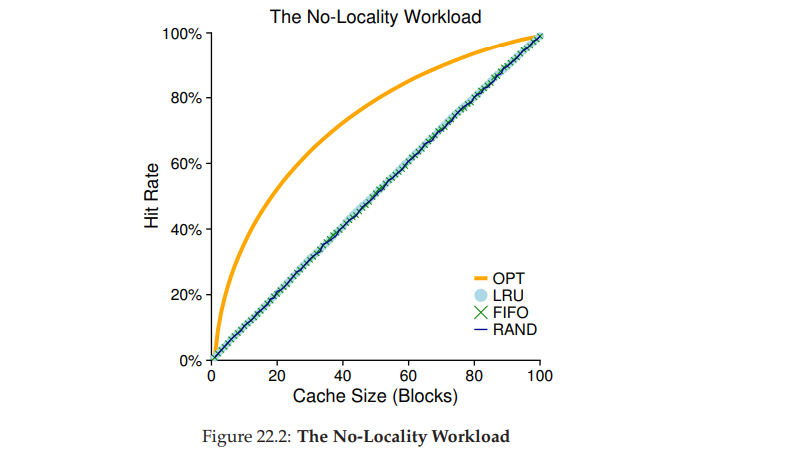

**We can draw a number of conclusions from the graph:**
1. First, when there is no locality in the workload, it doesn’t matter much which realistic policy you are using; LRU, FIFO, and Random all perform the same, with the hit rate exactly determined by the size of the cache. 
2. Second, when the cache is large enough to fit the entire workload, it also doesn’t matter which policy you use; all policies (even optimal) converge to a 100% hit rate when all the referenced blocks fit in cache. 
3. Finally, you can see that optimal performs noticeably better than the realistic policies; peeking into the future, if it were possible, does a much better job of replacement.

The next workload we examine is called the “80-20” workload, which exhibits locality: 80% of the references are made to 20% of the pages (the “hot” pages); the remaining 20% of the references are made to the remaining 80% of the pages (the “cold” pages).


**Eg2:**

As you can see from the figure, while both random and FIFO do reasonably well, LRU does better, as it is more likely to hold onto the hot pages; as those pages have been referred to frequently in the past, they are likely to be referred to again in the near future. Optimal once again does better, showing that LRU’s historical information is not perfect.

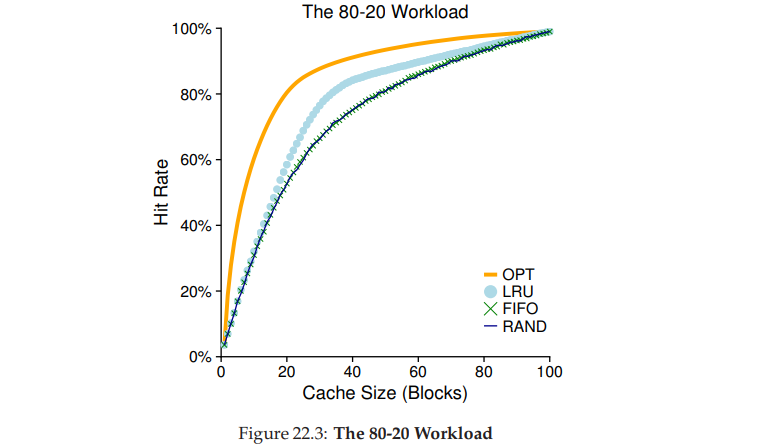

You might now be wondering: is LRU’s improvement over Random and FIFO really that big of a deal? The answer, as usual, is “it depends.” If each miss is very costly (not uncommon), then even a small increase in hit rate (reduction in miss rate) can make a huge difference on performance.

**Eg3:**

Interestingly, Random fares notably better, not quite approaching optimal, but at least achieving a non-zero hit rate. Turns out that random has some nice properties; one such property is not having weird corner-case behaviors

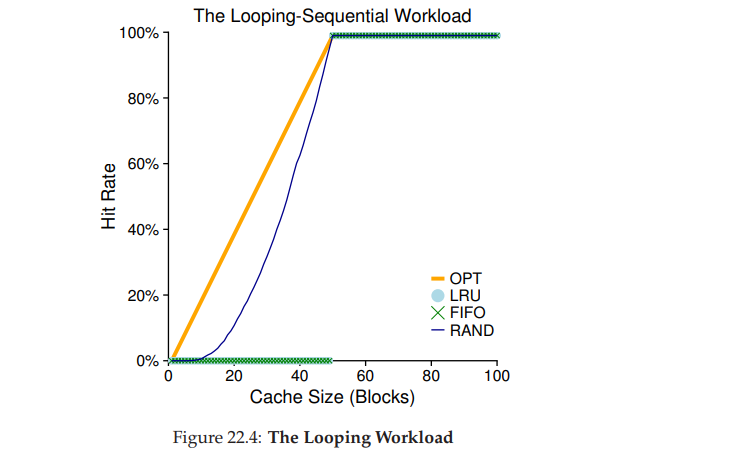


## 22.7 Implementing Historical Algorithms
As you can see, an algorithm such as LRU can generally do a better job than simpler policies like FIFO or Random, which may throw out important pages. Unfortunately, historical policies present us with a new challenge: how do we implement them?

Let’s take, for example, LRU. To implement it perfectly, we need to
do a lot of work. Specifically, upon each page access (i.e., each memory
access, whether an instruction fetch or a load or store), we must update
some data structure to move this page to the front of the list (i.e., the
MRU side). Contrast this to FIFO, where the FIFO list of pages is only
accessed when a page is evicted (by removing the first-in page) or when
a new page is added to the list (to the last-in side). To keep track of which
pages have been least- and most-recently used, the system has to do some
accounting work on every memory reference. Clearly, without great care,
such accounting could greatly reduce performance.

**CRUX: HOW TO IMPLEMENT AN LRU REPLACEMENT POLICY - Given that it will be expensive to implement perfect LRU, can we approximate it in some way, and still obtain the desired behavior?**

Unfortunately, as the number of pages in a system grows, scanning a
huge array of times just to find the absolute least-recently-used page is
prohibitively expensive. Imagine a modern machine with 4GB of memory, chopped into 4KB pages. This machine has 1 million pages, and thus
finding the LRU page will take a long time, even at modern CPU speeds.
Which begs the question: do we really need to find the absolute oldest
page to replace? Can we instead survive with an approximation?

## 22.8 Approximating LRU
approximating LRU is more feasible from a computational-overhead standpoint, and indeed it is what many modern systems do.

The idea requires some hardware support, in the form of a **use bit** (sometimes called the **reference bit**)

There is one use bit per page of the system, and the use bits live in memory somewhere (they could be in the per-process page tables, for example, or just in an array somewhere). Whenever a page is referenced (i.e., read or written), the use bit is set by hardware to 1. The hardware never clears the bit, though (i.e., sets it to 0); that is the responsibility of the OS.

any approach which periodically clears the use bits and then differentiates between which pages have use bits of 1versus 0 to decide which to replace would be fine.  

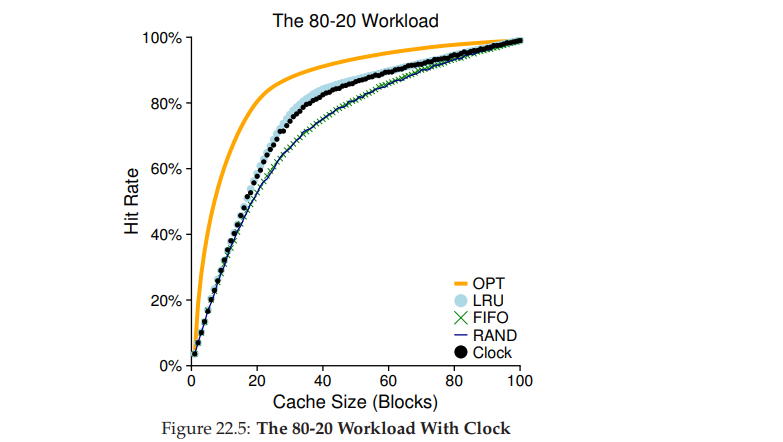

The behavior of a clock algorithm variant is shown in Figure 22.5. This
variant randomly scans pages when doing a replacement; when it encounters a page with a reference bit set to 1, it clears the bit (i.e., sets it
to 0); when it finds a page with the reference bit set to 0, it chooses it as
its victim. As you can see, although it doesn’t do quite as well as perfect
LRU, it does better than approaches that don’t consider history at all.

## 22.9 Considering Dirty Pages
One small modification to the clock algorithm that is commonly made - whether a page has been modified or not while in memory

Reason: 
- if a page has been **modified** and is thus **dirty**, it must be written back to disk to evict it, which is expensive
- If it has not been modified (and is thus **clean**), the eviction is free; the physical frame can simply be reused for other purposes without additional I/O. Thus, some VM systems prefer to evict clean pages over dirty pages.

To support this behavior, the hardware should include a modified bit (a.k.a. dirty bit). This bit is set any time a page is written, and thus can be incorporated into the page-replacement algorithm

The clock algorithm,
for example, could be changed to scan for pages that are both unused
and clean to evict first; failing to find those, then for unused pages that
are dirty; etc.




## 22.10 Other Virtual Memory Policies

##### Page Selection Policy
- **Demand Paging**: Pages are brought into memory only when accessed ("on demand").
- **Prefetching**: The OS guesses that a page will be used soon and loads it in advance (e.g., loading page `P + 1` when page `P` is accessed).
  - Effective when the guess is accurate.

##### Write Policy
- **Clustering/Grouping**: Instead of writing pages to disk individually, multiple pending writes are grouped and written together.
  - Improves efficiency as disk drives handle large, single writes better than multiple small writes.

---

## 22.11 Thrashing

Before closing, we address one final question: what should the OS do when memory is simply oversubscribed, and the memory demands of the set of running processes simply exceeds the available physical memory? In this case, the system will constantly be paging, a condition sometimes referred to as thrashing

##### Handling Thrashing
1. **Admission Control**:
   - Limits the number of active processes so their working sets fit in memory.
   - Focuses on doing fewer tasks well instead of all tasks poorly.
2. **Out-of-Memory Killer** (Linux Example):
   - Kills memory-intensive processes to free up memory.
   - Can cause issues if critical processes (e.g., X server) are terminated, disrupting user applications.

## 22.12 Summary
We have seen the introduction of a number of page-replacement (and other) policies, which are part of the VM subsystem of all modern operating systems.

However, in many cases the importance of said algorithms has decreased, as the discrepancy between memory-access and disk-access times has increased. Because paging to disk is so expensive, the cost of frequent paging is prohibitive. Thus, the best solution to excessive paging is often a simple (if intellectually dissatisfying) one: buy more memory.



# 23 - The VAX/VMS Virtual Memory System
**THE CRUX: HOW TO AVOID THE CURSE OF GENERALITY - Operating systems often have a problem known as “the curse of generality”, where they are tasked with general support for a broad class of applications and systems. The fundamental result of the curse is that the OS is not likely to support any one installation very well. In the case of VMS, the curse was very real, as the VAX-11 architecture was realized in a number of different implementations. Thus, how can an OS be built so as to run effectively on a wide range of systems?**

As an additional issue, VMS is an excellent example of software innovations used to hide some of the inherent flaws of the architecture. Although the OS often relies on the hardware to build efficient abstractions and illusions, sometimes the hardware designers don’t quite get everything right; in the VAX hardware, we’ll see a few examples of this, and what the VMS operating system does to build an effective, working system despite these hardware flaws.

## 23.3 A Real Address Space
One neat aspect of studying VMS is that we can see how a real address space is constructed (Figure 23.1. 

Thus far, we have assumed a simple address space of just user code, user data, and user heap, but as we can see above, a real address space is notably more complex.

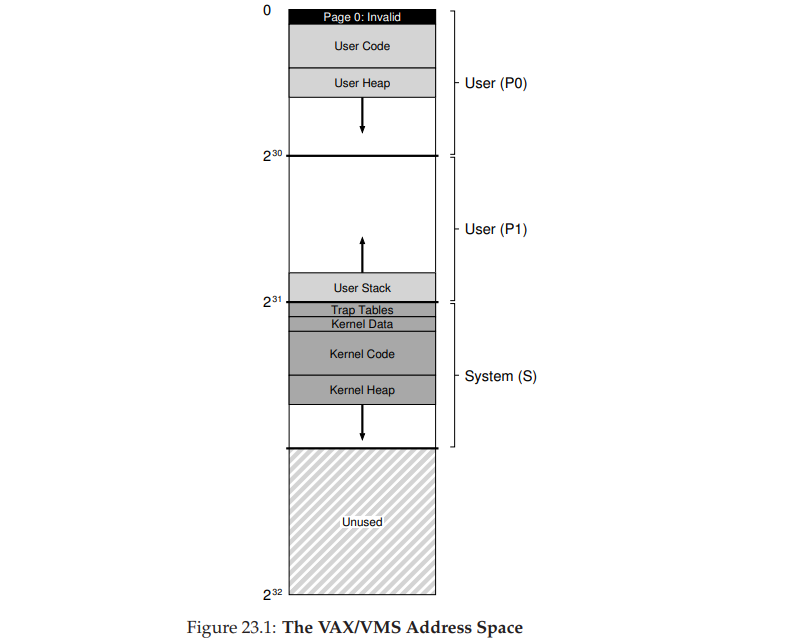

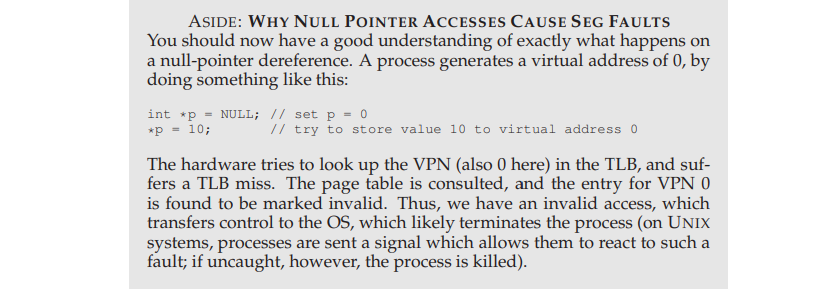

For example, the code segment never begins at page 0. This page, instead, is marked inaccessible, in order to provide some support for detecting null-pointer accesses.

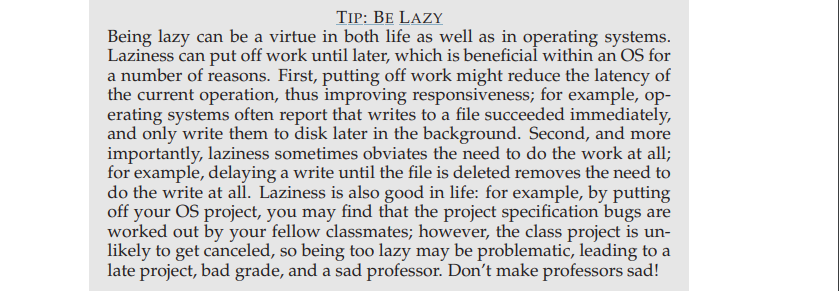

## Summary
More detail is available in the excellent (and short) paper by Levy and Lipman [LL82]; we encourage you to read it, a great way to see what the source material behind these chapters is like

You should also learn more about the state of the art by reading about Linux and other modern systems when possible


# 24 - Summary Dialogue on Memory Virtualization
trying to learn something here, so that when you go off into the world, you’ll understand how systems actually work

Eg: Professor: 
- One time back in graduate school, my friends and I were measuring how long memory accesses took, and once in a while the numbers were way higher than we expected; we thought all the data was fitting nicely into the second-level hardware cache, you see, and thus should have been really fast to access.
- We couldn’t figure out what was going on. So what do you do in such a case? Easy, ask a professor! So we went and asked one of our professors, who looked at the graph we had produced, and simply said “TLB”. Aha! Of course, TLB misses! Why didn’t we think of that? **Having a good model of how virtual memory works helps diagnose all sorts of interesting performance problems**

what have you learned? What’s in your mental model of how virtual memory works?
- Student: Well, I think I now have a pretty good idea of what happens when memory is referenced by a process, which, as you’ve said many times, happens on each instruction fetch as well as explicit loads and stores
- I now really know that all addresses that we can observe within a program are virtual addresses; that I, as a programmer, am just given this illusion of where data and code are in memory
- I used to think it was cool that I could print the address of a pointer, but now I find it frustrating – it’s just a virtual address! I can’t see the real physical address where the data lives.
- the TLB is a really key piece, providing the system with a small hardware cache of address translations. Page tables are usually quite large and hence live in big and slow memories. Without that TLB, programs would certainly run a great deal more slowly. Seems like the TLB truly makes virtualizing memory possible. And I shudder at the thought of a program with a working set that exceeds the coverage of the TLB: with all those TLB misses, it would be hard to watch.
- I also now understand that the page table is one of those data structures you need to know about; it’s just a data structure, though, and that means almost any structure could be used
- We started with simple structures, like arrays (a.k.a. linear page tables), and advanced all the way up to multi-level tables (which look like trees), and even crazier things like pageable page tables in kernel virtual memory. All to save a little space in memory!
- the address translation structures need to be flexible enough to support what programmers want to do with their address spaces. Structures like the multi-level table are perfect in this sense; they only create table space when the user needs a portion of the address space, and thus there is little waste. Earlier attempts, like the simple base and bounds register, just weren’t flexible enough; the structures need to match what users expect and want out of their virtual memory system.

---

# Part II - Concurrency
# 25 - A Dialogue on Concurrency

the second of our three pillars of operating systems: **concurrency**

imagine there are a lot of peaches on a table, and a lot of people who wish to eat them. Let’s say we did it this way: each eater first identifies a peach visually, and then tries to grab it and eat it. What is wrong with this approach?

you might see a peach that somebody else also sees. If they get there first, when you reach out, no peach for you! 

Well, probably develop a better way of going about this. Maybe form a line, and when you get to the front, grab a peach and get on with it.

we used to have many people grabbing for peaches all at once, which is faster. But in my way, we just go one at a time, which is correct, but quite a bit slower. The best kind of approach would be fast and correct

there are certain types of programs that we call **multi-threaded** applications; 
- each **thread** is kind of like an independent agent running around in this program, doing things on the program’s behalf.
- But these threads access memory, and for them, each spot of memory is kind of like one of those peaches. 
- If we don’t coordinate access to memory between threads, the program won’t work as expected.

why do we talk about this in an OS class? Isn’t that just application programming?
1.  the OS must support multi-threaded applications with primitives such as **locks** and **condition variables**
2.  the OS itself was the first concurrent program – it must access its own memory very carefully or many strange and terrible things will happen

# 26 - Concurrency: An Introduction
In this note, we introduce a new abstraction for a single running process: that of a **thread**

Instead of our classic view of a single point of execution within a program (i.e., a single PC where instructions are being fetched from and executed), **a multi-threaded program has more than one point of execution** (i.e., multiple PCs, each of which is being fetched and executed from)
- Perhaps another way to think of this is that each thread is very much like a separate process, except for one difference: they share the same address space and thus can access the same data.

The state of a single thread is thus very similar to that of a process.
- It has a program counter (PC) that tracks where the program is fetching instructions from.
- Each thread has its own private set of registers it uses for computation; thus, if there are two threads that are running on a single processor, when switching from running one (T1) to running the other (T2), a context switch must take place.
- The context switch between threads is quite similar to the context switch between processes, as the register state of T1 must be saved and the register state of T2 restored before running T2.
- With processes, we saved state to a **process control block (PCB)**; now, we’ll need one or more **thread control blocks (TCBs)** to store the state of each thread of a process.

There is one major difference, though, in the context switch we perform between threads as compared to processes: the address space remains the same (i.e., there is no need to switch which page table we are using).

One other major difference between threads and processes concerns the stack. In our simple model of the address space of a classic process (which we can now call a single-threaded process), there is a single stack, usually residing at the bottom of the address space (**Figure 26.1, left**).

However, in a multi-threaded process, each thread runs independently and of course may call into various routines to do whatever work it is doing. 

Instead of a single stack in the address space, there will be one per thread. Let’s say we have a multi-threaded process that has two threads in it; the resulting address space looks different (**Figure 26.1, right**)
- In this figure, you can see two stacks spread throughout the address space of the process. Thus, any stack-allocated variables, parameters, return values, and other things that we put on the stack will be placed in what is sometimes called **thread-local storage**, i.e., the stack of the relevant thread.

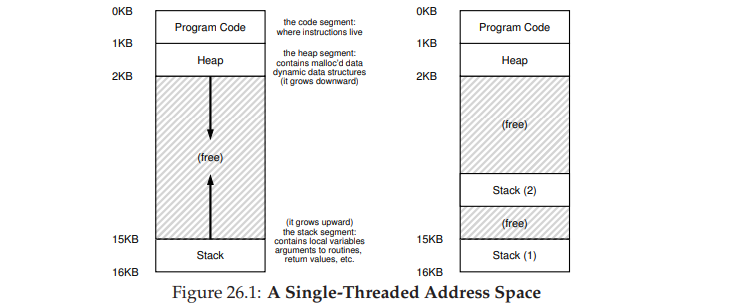

You might also notice how this ruins our beautiful address space layout. Before, the stack and heap could grow independently and trouble only arose when you ran out of room in the address space. Here, we no longer have such a nice situation. Fortunately, this is usually OK, as stacks do not generally have to be very large (the exception being in programs that make heavy use of recursion).

## 26.1 An Example: Thread Creation
runing a program that created two threads, each doing some independent work, in this case printing “A” or “B”. The code is shown in Figure 26.2.

main program creates two threads, each of which will run the function `mythread()`, though with different arguments (the string A or B). 
- Once a thread is created, it may start running right away (depending on the whims of the scheduler)
- alternately, it may be put in a “ready” but not “running” state and thus not run yet.
- After creating the two threads (T1 and T2), the main thread calls pthread join(), which waits for a particular thread to complete.

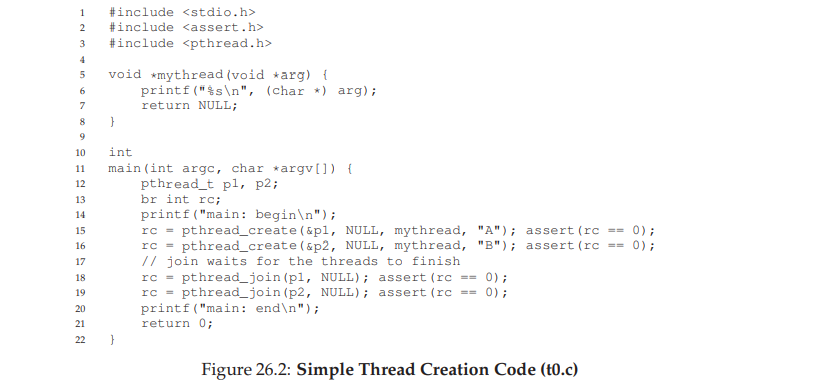

In the execution diagram (Table 26.1), time increases in the downwards direction, and each column shows when a different thread (the main one, or Thread 1, or Thread 2) is running.

there is no reason to assume that a thread that is created first will run first.

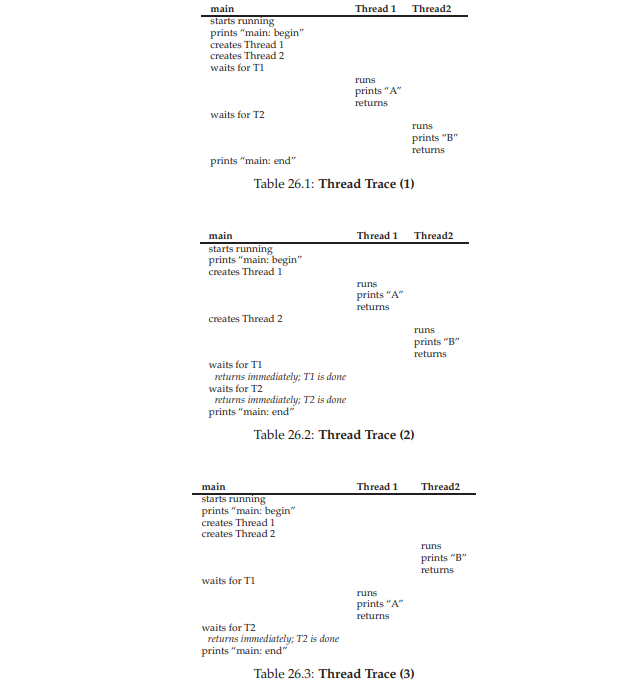

## 26.2 Why It Gets Worse: Shared Data
The simple thread example we showed above was useful in showing how threads are created and how they can run in different orders depending on how the scheduler decides to run them. What it doesn’t show you, though, is how threads interact when they access shared data.

Let us imagine a simple example where two threads wish to update a global shared variable. The code we’ll study is in **Figure 26.3**

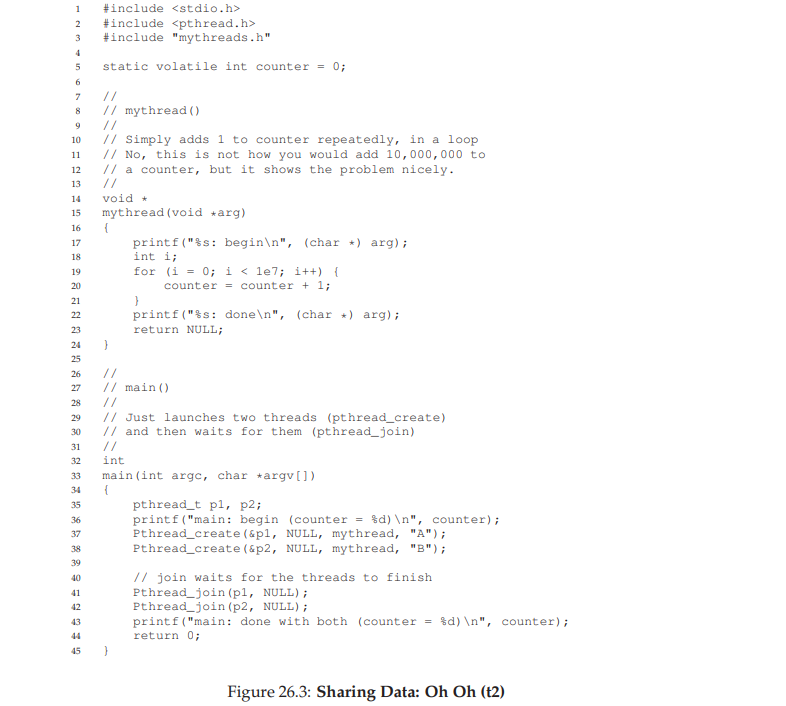

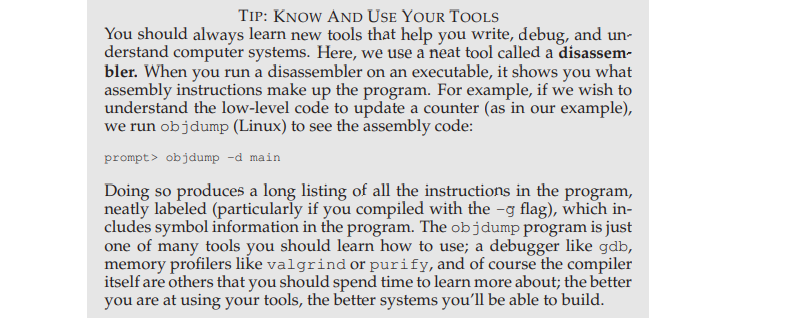



## 26.3 The Heart of the Problem: Uncontrolled Scheduling

To understand why this (variation of program output) happens, we must understand the code sequence that the compiler generates for the update to counter. 

In this case, we wish to simply add a number (1) to counter. Thus, the code sequence for doing so might look something like this (in x86);

    mov 0x8049a1c, %eax
    add $0x1, %eax
    mov %eax, 0x8049a1c

This example assumes that the variable counter is located at address 0x8049a1c. 
- In this three-instruction sequence, the x86 mov instruction is used first to get the memory value at the address and put it into register eax.
- Then, the add is performed, adding 1 (0x1) to the contents of the eax register
- finally, the contents of eax are stored back into memory at the same address.

Let us imagine one of our two threads (Thread 1) enters this region of code, and is thus about to increment counter by one. 
- It loads the value of counter (let’s say it’s 50 to begin with) into its register eax. Thus, eax=50 for Thread 1.
- Then it adds one to the register; thus eax=51.
- Now, something unfortunate happens: a timer interrupt goes off; thus, the OS saves the state of the currently running thread (its PC, its registers including eax, etc.) to the thread’s TCB.

Now something worse happens: Thread 2 is chosen to run, and it enters this same piece of code. It also executes the first instruction, getting the value of counter and putting it into its eax (remember: each thread when running has its own private registers; the registers are virtualized by the context-switch code that saves and restores them). The value of counter is still 50 at this point, and thus Thread 2 has eax=50.

Let’s then assume that Thread 2 executes the next two instructions, incrementing eax by 1 (thus eax=51), and then saving the contents of eax into counter (address 0x8049a1c). Thus, the global variable counter now has the value 51.

**Put simply, what has happened is this:** the code to increment counter has been run twice, but counter, which started at 50, is now only equal to 51. A “correct” version of this program should have resulted in counter equal to 52.

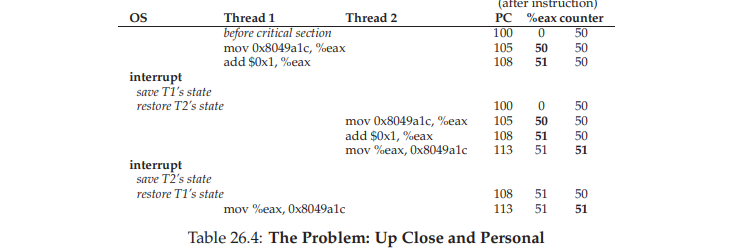

(note for those of you used to nice, RISC-like instruction sets: x86 has variable-length instructions; the mov instructions here take up 5 bytes of memory, whereas the add takes only 3)

    100 mov 0x8049a1c, %eax
    105 add $0x1, %eax
    108 mov %eax, 0x8049a1c

With these assumptions, what happens is seen in Table 26.4. Assume the counter starts at value 50, and trace through this example to make sure you understand what is going on.

What we have demonstrated here is called a **race condition: the results depend on the timing execution of the code**
- With some bad luck (i.e., context switches that occur at untimely points in the execution), we get the wrong result
- we may get a different result each time; thus, instead of a nice **deterministic** computation (which we are used to from computers), we call this result **indeterminate**, where it is not known what the output will be and it is indeed likely to be different across runs

Because multiple threads executing this code can result in a race condition, we call this code a **critical section**
- A critical section is a piece of code that accesses a shared variable (or more generally, a shared resource) and must not be concurrently executed by more than one thread.

What we really want for this code is what we call **mutual exclusion**. This property guarantees that if one thread is executing within the critical section, the others will be prevented from doing so.



## 26.4 The Wish For Atomicity
One way to solve this problem would be to have more powerful instructions that, in a single step, did exactly whatever we needed done and thus removed the possibility of an untimely interrupt

For example, what if we had a super instruction that looked like this?

    memory-add 0x8049a1c, $0x1

Assume this instruction adds a value to a memory location, and the hardware guarantees that it executes **atomically**; when the instruction executed, it would perform the update as desired.
- It could not be interrupted mid-instruction, because that is precisely the guarantee we receive from the hardware: when an interrupt occurs, either the instruction has not run at all, or it has run to completion; there is no in-between state
- **Atomically**, in this context, means **“as a unit”**, which sometimes we take as **“all or none”**

What we’d like is to execute the three instruction sequence atomically:

    mov 0x8049a1c, %eax
    add $0x1, %eax
    mov %eax, 0x8049a1c

what we do is ask the hardware for a few useful instructions upon which we can build a general set of what we call **synchronization primitives**

By using these hardware synchronization primitives, in combination with some help from the operating system, we will be able to build multi-threaded code that accesses critical sections in a synchronized and controlled manner, and thus reliably produces the correct result despite the challenging nature of concurrent execution

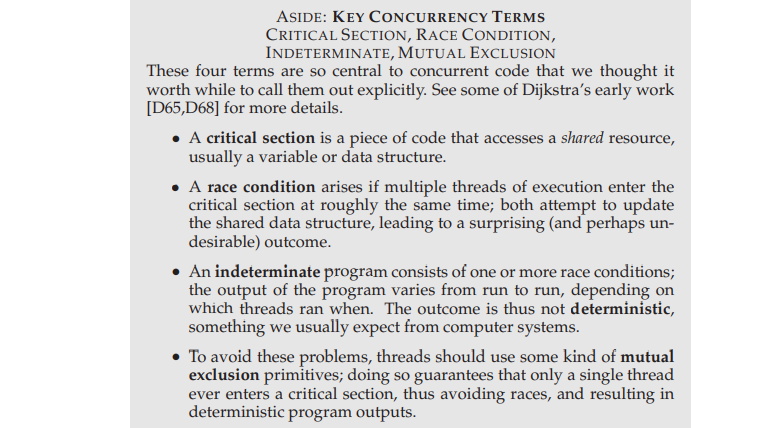

**THE CRUX:
HOW TO PROVIDE SUPPORT FOR SYNCHRONIZATION - What support do we need from the hardware in order to build useful synchronization primitives? What support do we need from the OS? How can we build these primitives correctly and efficiently? How can programs use them to get the desired results?**

## 26.5 One More Problem: Waiting For Another
This chapter has set up the problem of concurrency as if only one type
of interaction occurs between threads, that of accessing shared variables
and the need to support atomicity for critical sections. As it turns out,
there is another common interaction that arises, where one thread must
wait for another to complete some action before it continues. This interaction arises, for example, when a process performs a disk I/O and is put
to sleep; when the I/O completes, the process needs to be roused from its
slumber so it can continue.

Thus, in the coming chapters, we’ll be not only studying how to build
support for synchronization primitives to support atomicity but also for
mechanisms to support this type of sleeping/waking interaction that is
common in multi-threaded programs.

## 26.6 Summary: Why in OS Class?
Why are we studying this in OS class? 
- “History” is the one-word answer; the OS was the first concurrent program, and many techniques were created for use within the OS.
- Later, with multi-threaded processes, application programmers also had to consider such things.
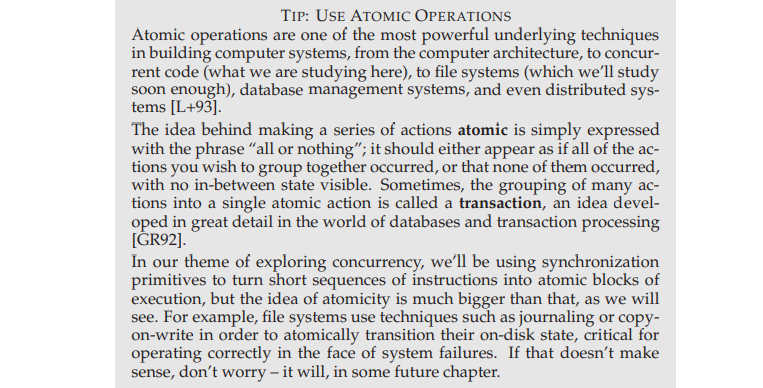

# 27 - Interlude: Thread API
This chapter briefly covers the main portions of the thread API

**CRUX: HOW TO CREATE AND CONTROL THREADS - What interfaces should the OS present for thread creation and control? How should these interfaces be designed to enable ease of use as well as utility?**

## 27.1 Thread Creation
The first thing you have to be able to do to write a multi-threaded program is to create new threads, and thus some kind of thread creation interface must exist.

**ASIDE:** POSIX (Portable Operating System Interface) is a standardized API for maintaining compatibility across UNIX-based operating systems. It defines a set of functions and interfaces, including those for thread management, ensuring that programs written for one compliant system can run on another with minimal modification.

In POSIX, it is easy:
    
    #include <pthread.h>
    int
    pthread_create(       pthread_t * thread,
                    const pthread_attr_t * attr,
                          void * (*start_routine)(void*),
                          void * arg);

There are four arguments: thread, attr, start routine, and arg. 
- The first, thread, is a pointer to a structure of type pthread t; we’ll use this structure to interact with this thread, and thus we need to pass it to pthread create() in order to initialize it.
- The second argument, attr, is used to specify any attributes this thread might have
- The third argument is the most complex, but is really just asking: which function should this thread start running in?
    - In C, we call this a **function pointer**, and this one tells us the following is expected: a function name (start routine), which is passed a single argument of type void * (as indicated in the parentheses after start routine), and which returns a value of type void * (i.e., a **void pointer**).
- Finally, the fourth argument, arg, is exactly the argument to be passed to the function where the thread begins execution

If this routine instead required an integer argument, instead of a void pointer, the declaration would look like this:

    int pthread_create(..., // first two args are the same
                        void * (*start_routine)(int),
                        int arg);

If instead the routine took a void pointer as an argument, but returned an integer, it would look like this:
    
    int pthread_create(..., // first two args are the same
                        int (*start_routine)(void *),
                        void * arg);

why do we need these void pointers? having a void pointer as an argument to the function start routine allows us to pass in any type of argument; having it as a return value allows the thread to return any type of result.

## 27.2 Thread Completion
what happens if you want to wait for a thread to complete? You need to do something special in order to wait for completion; in particular, you must call the routine `pthread_join()`

    int pthread_join(pthread_t thread, void **value_ptr);

This routine takes only two arguments. 
1. The first is of type pthread t, and is used to specify which thread to wait for. This value is exactly what you passed into the thread library during creation; if you held onto it, you can now use it to wait for the thread to stop running.
2. The second argument is a pointer to the return value you expect to get back.

often times we don’t have to do all of this painful packing and unpacking of arguments. For example, if we just create a thread with no arguments, we can pass NULL in as an argument when the thread is created. Similarly, we can pass NULL into pthread join() if we don’t care about the return value.

you might notice that the use of `pthread_create()` to create a thread, followed by an immediate call to `pthread_join()`, is a pretty strange way to create a thread. In fact, there is an easier way to accomplish this exact task; it’s called a **procedure call**. Clearly, we’ll usually be creating more than just one thread and waiting for it to complete, otherwise there is not much purpose to using threads at all.

We should note that not all code that is multi-threaded uses the join routine. 
- For example, a multi-threaded web server might create a number of worker threads, and then use the main thread to accept requests and pass them to the workers, indefinitely. Such long-lived programs thus may not need to join. 
- However, a parallel program that creates threads to execute a particular task (in parallel) will likely use join to make sure all such work completes before exiting or moving onto the next stage of computation.


## 27.3 Locks
Beyond thread creation and join, probably the next most useful set of functions provided by the POSIX threads library are those for **providing mutual exclusion to a critical section via locks**

The most basic pair of routines to use for this purpose is provided by this pair of routines:
    
    int pthread_mutex_lock(pthread_mutex_t *mutex);
    int pthread_mutex_unlock(pthread_mutex_t *mutex);

When you have a region of code you realize is a **critical section**, and thus needs to be protected by locks in order to operate as desired. You can probably imagine what the code looks like:

    pthread_mutex_t lock;
    pthread_mutex_lock(&lock);
    x = x + 1; // or whatever your critical section is
    pthread_mutex_unlock(&lock);

**The intent of the code is as follows:**
- if no other thread holds the lock when `pthread_mutex_lock()` is called, the thread will acquire the lock and enter the critical section.
- If another thread does indeed hold the lock, the thread trying to grab the lock will not return from the call until it has acquired the lock (implying that the thread holding the lock has released it via the unlock call)
- Of course, many threads may be stuck waiting inside the lock acquisition function at a given time; only the thread with the lock acquired, however, should call unlock.

With POSIX threads, there are two ways to initialize locks. One way to do this is to use PTHREAD_MUTEX_INITIALIZER, as follows:
    
    pthread_mutex_t lock = PTHREAD_MUTEX_INITIALIZER;

Minimally, use wrappers, which assert that the routine succeeded (e.g., as in Figure 27.4); more sophisticated (non-toy) programs, which can’t simply exit when something goes wrong, should check for failure and do something appropriate when the lock or unlock does not succeed.

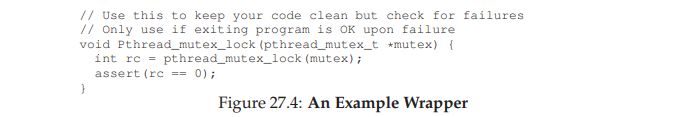

The lock and unlock routines are not the only routines that pthreads has to interact with locks. In particular, here are two more routines which may be of interest:
    
    int pthread_mutex_trylock(pthread_mutex_t *mutex);
    int pthread_mutex_timedlock(pthread_mutex_t *mutex,
                                struct timespec *abs_timeout);

These two calls are used in lock acquisition. The `trylock` version returns failure if the lock is already held; the `timedlock` version of acquiring a lock returns after a timeout or after acquiring the lock, whichever happens first. Thus, the timedlock with a timeout of zero degenerates to the trylock case. Both of these versions should generally be avoided; however, there are a few cases where avoiding getting stuck (perhaps indefinitely) in a lock acquisition routine can be useful, as we’ll see in future chapters (e.g., when we study deadlock).



## 27.4 Condition Variables
Condition variables are useful when some kind of signaling must take place between threads, if one thread is waiting for another to do something before it can continue.

Two primary routines are used by programs wishing to interact in this way:
    
    int pthread_cond_wait(pthread_cond_t *cond, pthread_mutex_t *mutex);
    int pthread_cond_signal(pthread_cond_t *cond);

To use a condition variable, one has to in addition have a lock that is associated with this condition. When calling either of the above routines, this lock should be held.

The first routine, pthread cond wait(), puts the calling thread to sleep, and thus waits for some other thread to signal it, usually when something in the program has changed that the now-sleeping thread might care about

For example, a typical usage looks like this:
    
    pthread_mutex_t lock = PTHREAD_MUTEX_INITIALIZER;
    pthread_cond_t init = PTHREAD_COND_INITIALIZER;
    Pthread_mutex_lock(&lock);
    while (initialized == 0)
        Pthread_cond_wait(&init, &lock);
    Pthread_mutex_unlock(&lock);

It is safer to view waking up as a hint that something might have changed, rather than an absolute fact.

Note that sometimes it is tempting to use a simple flag to signal between two threads, instead of a condition variable and associated lock.
For example, we could rewrite the waiting code above to look more like this in the waiting code:
    
    while (initialized == 0)
    ; // spin

The associated signaling code would look like this:
    
    initialized = 1;

Don’t ever do this, for the following reasons. First, it performs poorly in many cases (spinning for a long time just wastes CPU cycles). Second, it is error prone. As recent research shows, it is surprisingly easy to make mistakes when using flags (as above) to synchronize between threads; roughly half the uses of these ad hoc synchronizations were buggy! Don’t be lazy; use condition variables even when you think you can get away without doing so.

## 27.5 Compiling and Running
All of the code examples in this chapter are relatively easy to get up and running. To compile them, you must include the header `pthread.h` in your code.

On the link line, you must also explicitly link with the pthreads library, by adding the `-pthread` flag.

For example, to compile a simple multi-threaded program, all you have to do is the following: `prompt> gcc -o main main.c -Wall -pthread`

## 27.6 Summary
We have introduced the basics of the pthread library, including thread creation, building mutual exclusion via locks, and signaling and waiting via condition variables.
- You don’t need much else to write robust and efficient multi-threaded code, except patience and a great deal of care!

the basics discussed herein should enable you to build sophisticated (and hopefully, correct and performant) multi-threaded programs. The hard part with threads is not the APIs, but rather the tricky logic of how you build concurrent programs.

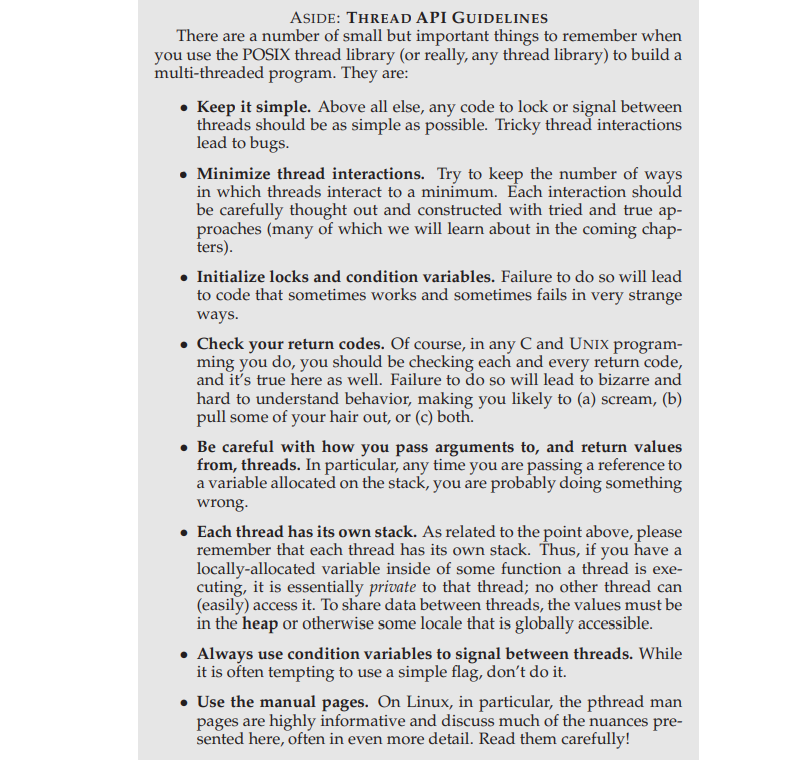



# 28 - Locks
Programmers annotate source code with locks, putting them around critical sections, and thus ensure that any such critical section executes as if it were a single atomic instruction.

## 28.1 Locks: The Basic Idea
**Eg:** assume our critical section looks like this, the canonical update of a shared variable:

    balance = balance + 1;

To use a lock, we add some code around the critical section like this:

    1 lock_t mutex; // some globally-allocated lock ’mutex’
    2 ...
    3 lock(&mutex);
    4 balance = balance + 1;
    5 unlock(&mutex);

**A lock is just a variable**, and thus to use one, you must declare a lock variable of some kind (such as mutex above).
- lock variable / “lock” - holds the state of the lock at any instant in time
    - It is either available (or unlocked or free) and thus no thread holds the lock, or acquired (or locked or held), and thus exactly one thread holds the lock and presumably is in a critical section
 
- We could store other information in the data type as well, such as which thread holds the lock, or a queue for ordering lock acquisition, but information like that is hidden from the user of the lock

**The semantics of the `lock()` and `unlock()` routines are simple**: 
- Calling the routine **`lock()`** tries to acquire the lock; if no other thread holds the lock (i.e., it is free), the thread will acquire the lock and enter the critical section; this thread is sometimes said to be the owner of the lock.
- If another thread then calls **`lock()`** on that same lock variable (mutex in this example), it will not return while the lock is held by another thread; in this way, other threads are prevented from entering the critical section while the first thread that holds the lock is in there.
- Once the owner of the lock calls **`unlock()`**, the lock is now available (free) again.
- If no other threads are waiting for the lock (i.e., no other thread has called lock() and is stuck therein), the state of the lock is simply changed to free.
- If there are waiting threads (stuck in lock()), one of them will (eventually) notice (or be informed of) this change of the lock’s state, acquire the lock, and enter the critical section


**Locks provide some minimal amount of control over scheduling to programmers**. 
- In general, we view threads as entities created by the programmer but scheduled by the OS, in any fashion that the OS chooses.
- Locks yield some of that control back to the programmer; **by putting a lock around a section of code, the programmer can guarantee that no more than a single thread can ever be active within that code**.
- Thus locks help transform the chaos that is traditional OS scheduling into a more controlled activity. 




## 28.2 Pthread Locks
The name that the POSIX library uses for a lock is a **mutex**, as it is used to provide **mutual exclusion** between threads, i.e., if one thread is in the critical section, it excludes the others from entering until it has completed the section.

the POSIX version passes a variable to lock and unlock, as we may be using different locks to protect different variables

Doing so can increase concurrency: instead of one big lock that is used any time any critical section is accessed (a coarse-grained locking strategy), one will often protect different data and data structures with different locks, thus allowing more threads to be in locked code at once (a more fine-grained approach). 

## 28.3 Building A Lock
**The Crux: HOW TO BUILD A LOCK - How can we build an efficient lock? Efficient locks provided mutual exclusion at low cost, and also might attain a few other properties we discuss below. What hardware support is needed? What OS support?**

To build a working lock, we will need some help from our old friend, the hardware, as well as our good pal, the OS.

Over the years, a number of different hardware primitives have been added to the instruction sets of various computer architectures, we will study how to use them in order to build a mutual exclusion primitive like a lock. 

We will also study how the OS gets involved to complete the picture and enable us to build a sophisticated locking library.

## 28.4 Evaluating Locks
- mutual exclusion
- fairness
    - Does each thread contending for the lock get a fair shot at acquiring it once it is free? 
    - Does any thread contending for the lock starve while doing so, thus never obtaining it? 
- performance
    - specifically the time overheads added by using the lock
 
## 28.5 Controlling Interrupts
One of the earliest solutions used to provide mutual exclusion was to disable interrupts for critical sections; this solution was invented for single-processor systems.

    1 void lock() {
    2 DisableInterrupts();
    3 }
    4 void unlock() {
    5 EnableInterrupts();
    6 }

Assume we are running on such a single-processor system. By turning off interrupts (using some kind of special hardware instruction) before entering a critical section, we ensure that the code inside the critical section will not be interrupted, and thus will execute as if it were atomic.

1. Using interrupt disabling as a general purpose synchronization solution requires too much trust in applications
2. Second, the approach does not work on multiprocessors. If multiple threads are running on different CPUs, and each try to enter the same critical section, it does not matter whether interrupts are disabled; threads will be able to run on other processors, and thus could enter the critical section. As multiprocessors are now commonplace, our general solution will have to do better than this.
3. Third, and probably least important, this approach can be inefficient

ASIDE: For some reason, developing locks that work without special hardware support became all the rage for a while, giving theory-types a lot of problems to work on. Of course, this all became quite useless when people realized it is much easier to assume a little hardware support (and indeed that support had been around from the very earliest days of multiprocessing)

## 28.6 Test And Set (Atomic Exchange)
Because disabling interrupts does not work on multiple processors, system designers started to invent hardware support for locking. 

today all systems provide this type of support, even for single CPU systems

The simplest bit of hardware support to understand is what is known as a **test-and-set instruction**, also known as **atomic exchange**. To understand how test-and-set works, let’s first try to build a simple lock without it. In this failed attempt, we use a simple flag variable to denote whether the lock is held or not.

In this first attempt (Figure 28.1), the idea is quite simple: use a simple variable to indicate whether some thread has possession of a lock. The first thread that enters the critical section will call lock(), which tests whether the flag is equal to 1 (in this case, it is not), and then sets the flag to 1 to indicate that the thread now holds the lock.

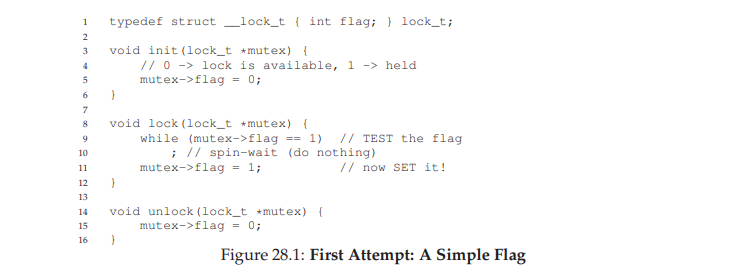

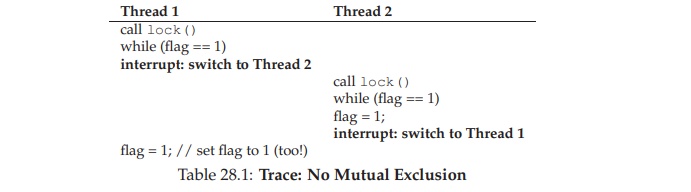

Unfortunately, the code has two problems: one of correctness, and another of performance.
- we can easily produce a case where both threads set their flags to 1 and both threads are thus able to enter the critical section. This is bad! We have obviously failed to provide the most basic requirement: providing mutual exclusion.
- The performance problem, which we will address more later on, is the fact that the way a thread waits to acquire a lock that is already held: it endlessly checks the value of flag, a technique known as spin-waiting. Spin-waiting wastes time waiting for another thread to release a lock


## 28.7 Building A Working Spin Lock

While the idea behind the example above is a good one, it is not possible to implement without some support from the hardware. Fortunately, some systems provide an instruction to support the creation of simple locks based on this concept.

We define what the test-and-set instruction does with the following C code snippet:

    1 int TestAndSet(int *ptr, int new) {
    2 int old = *ptr; // fetch old value at ptr
    3 *ptr = new; // store ’new’ into ptr
    4 return old; // return the old value
    5 }

The reason it is called “test and set” is that it enables you to “test” the old value (which is what is returned) while simultaneously “setting” the memory location to a new value; as it turns out, this slightly more powerful instruction is enough to build a simple spin lock

Let’s make sure we understand why this works. Imagine first the case where a thread calls lock() and no other thread currently holds the lock; thus, flag should be 0. When the thread then calls TestAndSet(flag, 1), the routine will return the old value of flag, which is 0; thus, the calling thread, which is testing the value of flag, will not get caught spinning in the while loop and will acquire the lock. The thread will also atomically set the value to 1, thus indicating that the lock is now held. When the thread is finished with its critical section, it calls unlock() to set the flag back to zero.

By making both the test (of the old lock value) and set (of the new value) a single atomic operation, we ensure that only one thread acquires the lock.

## 28.8 Evaluating Spin Locks
- corectness; Yes
- fairness; No
    - How fair is a spin lock to a waiting thread? Can you guarantee that a waiting thread will ever enter the critical section? spin locks don’t provide any fairness guarantees
    - Indeed, a thread spinning may spin forever, under contention. Spin locks are not fair and may lead to starvation.
- performance; single CPU = can be quite painful, multiple CPU = reasonably good

## 28.9 Compare-And-Swap
The basic idea is for compare-and-swap to test whether the value at the address specified by ptr is equal to expected; if so, update the memory location pointed to by ptr with the new value. If not, do nothing. 

In either case, return the actual value at that memory location, thus allowing the code calling compare-and-swap to know whether it succeeded or not.

With the compare-and-swap instruction, we can build a lock in a manner quite similar to that with test-and-set

**compare-and-swap is a more powerful instruction than test-and-set**. We will make some use of this power in the future when we briefly delve into wait-free synchronization [H91]. However, if we just build a simple spin lock with it, its behavior is identical to the spin lock we analyzed above.

## 28.10 Load-Linked and Store-Conditional
Some platforms provide a pair of instructions that work in concert to help build critical sections. 

On the MIPS architecture the load-linked and store-conditional instructions can be used in tandem to build locks and other concurrent structures

Alpha, PowerPC, and ARM provide similar instructions

The key feature of these instructions is that only one of these threads will succeed in updating the flag to 1 and thus acquire the lock

## 28.11 Fetch-And-Add
One final hardware primitive is the fetch-and-add instruction, which atomically increments a value while returning the old value at a particular address.

    1 int FetchAndAdd(int *ptr) {
    2 int old = *ptr;
    3 *ptr = old + 1;
    4 return old;
    5 }

In this example, we’ll use fetch-and-add to build a more interesting **ticket lock**

Instead of a single value, this solution uses a ticket and turn variable in combination to build a lock. The basic operation is pretty simple: when a thread wishes to acquire a lock, it first does an atomic fetch-and-add on the ticket value; that value is now considered this thread’s “turn” (myturn)

The globally shared lock->turn is then used to determine which thread’s turn it is; when (myturn == turn) for a given thread, it is that thread’s turn to enter the critical section. Unlock is accomplished simply by incrementing the turn such that the next waiting thread (if there is one) can now enter the critical section.

Note one important difference with this solution versus our previous attempts: it ensures progress for all threads

## 28.12 Summary: So Much Spinning
Our simple hardware-based locks are simple. However, in some cases, these solutions can be quite inefficient

Imagine you are running two threads on a single processor. Now imagine that one thread (thread 0) is in a critical section and thus has a lock held, and unfortunately gets interrupted. The second thread (thread 1) now tries to acquire the lock, but finds that it is held. Thus, it begins to spin. And spin. Then it spins some more. And finally, a timer interrupt goes off, thread 0 is run again, which releases the lock, and finally (the next time it runs, say), thread 1 won’t have to spin so much and will be able to acquire the lock. 

Thus, any time a thread gets caught spinning in a situation like this, it wastes an entire time slice doing nothing but checking a value that isn’t going to change! The problem gets worse with N threads contending for a lock; N − 1 time slices may be wasted in a similar manner, simply spinning and waiting for a single thread to release the lock. And thus, our next problem:

**THE CRUX: HOW TO AVOID SPINNING - How can we develop a lock that doesn’t needlessly waste time spinning on the CPU?**

Hardware support alone cannot solve the problem. We’ll need OS support too!

## 28.13 A Simple Approach: Just Yield, Baby
Hardware support got us pretty far: working locks, and even (as with the case of the ticket lock) fairness in lock acquisition.

problem: what to do when a context switch occurs in a critical section, and threads start to spin endlessly, waiting for the interrupt (lockholding) thread to be run again?

Because a thread can be in one of three states (running, ready, or blocked), you can think of this as an OS system call that moves the caller from the running state to the ready state, and thus promotes another thread to running.

## 28.14 Using Queues: Sleeping Instead Of Spinning
must explicitly exert some control over who gets to acquire the lock next after the current holder releases it. To do this, we will need a little more OS support, as well as a queue to keep track of which threads are waiting to enter the lock.

For simplicity, we will use the support provided by Solaris, in terms of two calls: park() to put a calling thread to sleep, and unpark(threadID) to wake a particular thread as designated by threadID.

ASIDE: **Solaris** is a Unix-based operating system originally developed by Sun Microsystems, now owned by Oracle Corporation. It is known for its scalability, robustness, and advanced features in enterprise environments.

First, we combine the old test-and-set idea with an explicit queue of lock waiters to make a more efficient lock. Second, we use a queue to help control who gets the lock next and thus avoid starvation

## 28.15 Different OS, Different Support
Other OS’s provide similar support; the details vary. 

For example, Linux provides something called a futex which is similar to the Solaris interface but provides a bit more in-kernel functionality

## 28.16 Two-Phase Locks
One final note: the Linux approach has the flavor of an old approach - now referred to as a two-phase lock

A two-phase lock realizes that spinning can be useful, particularly if the lock is about to be released. So in the first phase, the lock spins for a while, hoping that it can acquire the lock.

However, if the lock is not acquired during the first spin phase, a second phase is entered, where the caller is put to sleep, and only woken up when the lock becomes free later

The Linux lock above is a form of such a lock, but it only spins once; a generalization of this could spin in a loop for a fixed amount of time before using futex support to sleep.

Two-phase locks are yet another instance of a hybrid approach, where
combining two good ideas may indeed yield a better one. Of course,
whether it does depends strongly on many things, including the hardware environment, number of threads, and other workload details. As
always, making a single general-purpose lock, good for all possible use
cases, is quite a challenge.

## 28.17 Summary
The above approach shows how real locks are built these days: some
hardware support (in the form of a more powerful instruction) plus some
operating system support (e.g., in the form of park() and unpark()
primitives on Solaris, or futex on Linux).



# 29 - Lock-based Concurrent Data Structures
Adding locks to a data structure to make it usable by threads makes the structure thread safe. 

**CRUX: HOW TO ADD LOCKS TO DATA STRUCTURES - When given a particular data structure, how should we add locks to it, in order to make it work correctly? Further, how do we add locks such that the data structure yields high performance, enabling many threads to access the structure at once, i.e., concurrently?**

## 29.1 Concurrent Counters
One of the simplest data structures is a counter. It is a structure that is commonly used and has a simple interface.

#### Simple But Not Scalable
As you can see, the non-synchronized counter is a trivial data structure, requiring a tiny amount of code to implement. We now have our next challenge: how can we make this code thread safe? Figure 29.2 shows how we do so.

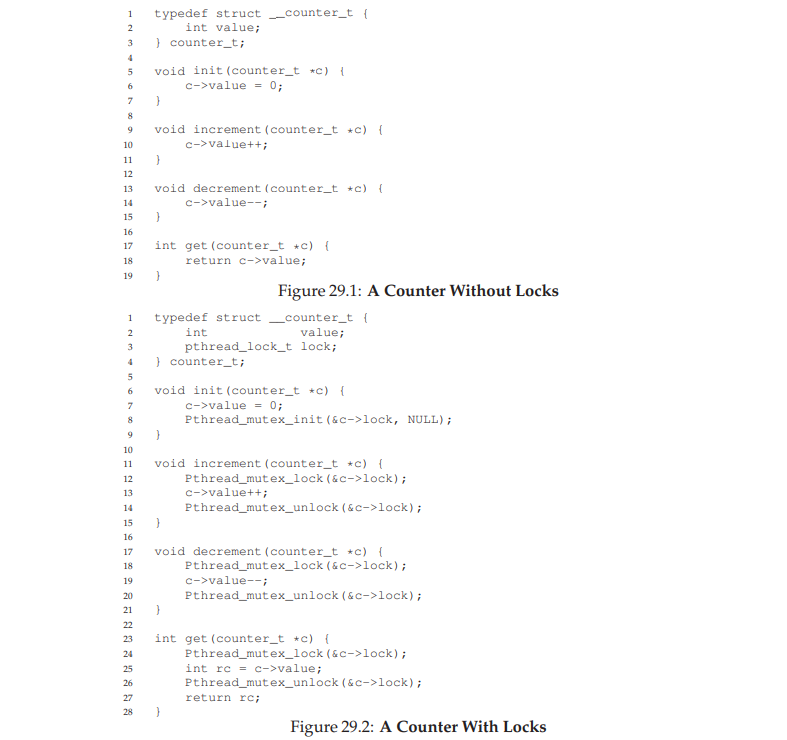

This concurrent counter is simple and works correctly. In fact, it follows a design pattern common to the simplest and most basic concurrent
data structures: it simply adds a single lock, which is acquired when calling a routine that manipulates the data structure, and is released when
returning from the call. In this manner, it is similar to a data structure
built with monitors [BH73], where locks are acquired and released automatically as you call and return from object methods.

At this point, you have a working concurrent data structure. The problem you might have is performance. If your data structure is too slow, you’ll have to do more than just add a single lock; such optimizations, if needed, are thus the topic of the rest of the chapter

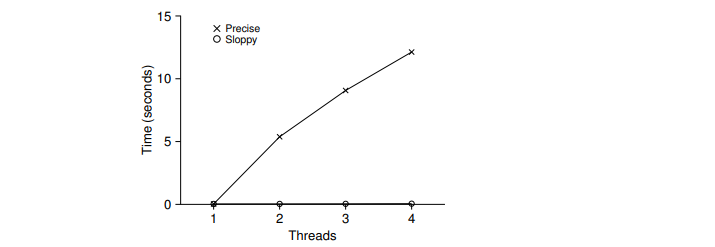

Ideally, you’d like to see the threads complete just as quickly on multiple processors as the single thread does on one. Achieving this end is
called **perfect scaling**; even though more work is done, it is done in parallel, and hence the time taken to complete the task is not increased. 

#### Scalable Counting
Linux suffer from serious scalability problems on multicore machines. Though many techniques have been developed to attack this problem, we’ll now describe one particular approach. The idea, introduced in recent research, is known as a **sloppy counter**

The sloppy counter works by representing a single logical counter via numerous local physical counters, one per CPU core, as well as a single global counter.

Specifically, on a machine with four CPUs, there are four local counters and one global one. In addition to these counters, there are also locks: one for each local counter, and one for the global counter.

The basic idea of sloppy counting is as follows. When a thread running on a given core wishes to increment the counter, it increments its local counter; access to this local counter is synchronized via the corresponding local lock. Because each CPU has its own local counter, threads across CPUs can update local counters without contention, and thus counter updates are scalable

However, to keep the global counter up to date (in case a thread wishes to read its value), the local values are periodically transferred to the global counter, by acquiring the global lock and incrementing it by the local counter’s value; the local counter is then reset to zero.

How often this local-to-global transfer occurs is determined by a **threshold**, which we call **S** here (for **sloppiness**).

sloppy counters enables; accuracy/performance trade-off 

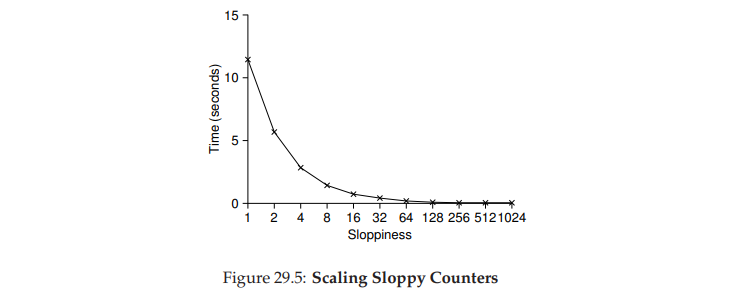




## 29.2 Concurrent Linked Lists
more complex structure

As you can see in the code, the code simply acquires a lock in the insert
routine upon entry, and releases it upon exit. One small tricky issue arises
if malloc() happens to fail (a rare case); in this case, the code must also
release the lock before failing the insert.

#### Scaling Linked Lists
Though we again have a basic concurrent linked list, once again we are in a situation where it does not scale particularly well. One technique that researchers have explored to enable more concurrency within a list is **hand-over-hand locking** (a.k.a. **lock coupling**)

IDEA: Instead of having a single lock for the entire list, you instead add a lock per node of the list. When traversing the list, the code first grabs the next node’s lock and then releases the current node’s lock (which inspires the name hand-over-hand)

Conceptually, a hand-over-hand linked list makes some sense; it enables a high degree of concurrency in list operations. However, in practice, it is hard to make such a structure faster than the simple single lock
approach, as the overheads of acquiring and releasing locks for each node
of a list traversal is prohibitive.

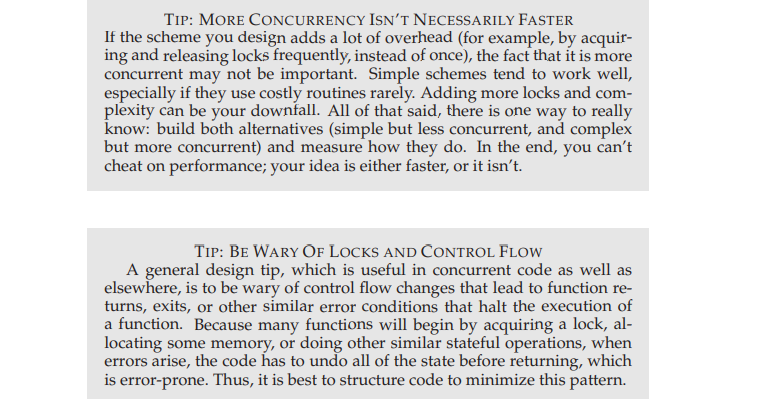

## 29.3 Concurrent Queues
As you know by now, there is always a standard method to make a concurrent data structure: add a big lock.

If you study this code carefully, you’ll notice that there are two locks, one for the head of the queue, and one for the tail. The goal of these two locks is to enable concurrency of enqueue and dequeue operations. In the common case, the enqueue routine will only access the tail lock, and dequeue only the head lock.

## 29.4 Concurrent Hash Table
We end our discussion with a simple and widely applicable concurrent
data structure, the hash table. We’ll focus on a simple hash table that does
not resize; a little more work is required to handle resizing

The reason for its good performance is that instead of having a single lock for the entire structure, it uses a lock per hash bucket (each of which is represented by a list). Doing so enables many concurrent operations to take place.

Figure 29.10 shows the performance of the hash table under concurrent updates (from 10,000 to 50,000 concurrent updates from each of four threads, on the same iMac with four CPUs). Also shown, for the sake of comparison, is the performance of a linked list (with a single lock).

As you can see from the graph, this simple concurrent hash table scales magnificently; the linked list, in contrast, does not.

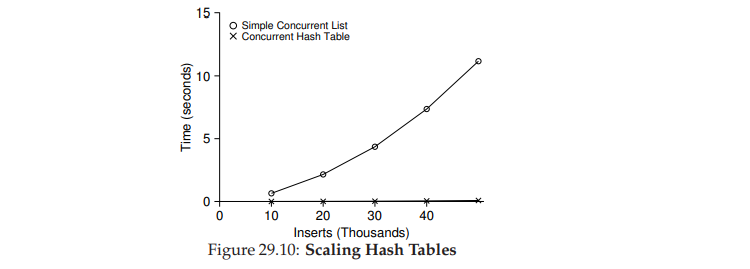

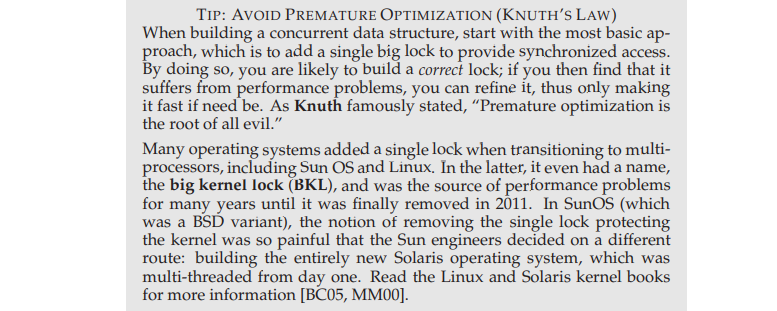

## 29.5 Summary

This section introduced a variety of concurrent data structures, including counters, lists, queues, and hash tables. Key lessons include:

- **Careful Lock Handling**: Pay attention to acquiring and releasing locks, especially during control flow changes.  
- **Concurrency vs. Performance**: Increasing concurrency does not always lead to better performance.  
- **Avoid Premature Optimization**: Optimize only when performance issues are identified; unnecessary optimizations may not benefit the application's overall performance.

### Further Learning
- **Advanced Structures**: Explore high-performance structures like B-trees in database courses.  
- **Non-blocking Data Structures**: Investigate techniques that avoid traditional locks entirely, though this requires deeper study beyond the scope of this book.


# 30 - Condition Variables
Thus far we have developed the notion of a lock and seen how one can be properly built with the right combination of hardware and OS support

**locks are not the only primitives that are needed to build concurrent programs**

many cases where a thread wishes to check whether a condition is true before continuing its execution

For example, a parent thread might wish to check whether a child thread has completed before continuing (this is often called a join()); how should such a wait be implemented? 

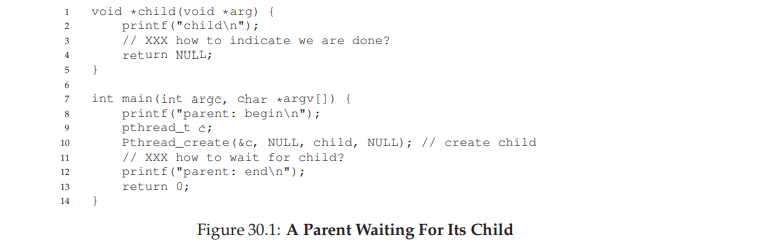

What we would like to see here is the following output:
    
    parent: begin
    child
    parent: end

**shared variable** - will generally work, but it is hugely inefficient as the parent spins and wastes CPU time.

put the parent to sleep until the condition we are waiting for (e.g., the child is done executing) comes true.

**THE CRUX: HOW TO WAIT FOR A CONDITION - In multi-threaded programs, it is often useful for a thread to wait for some condition to become true before proceeding. The simple approach, of just spinning until the condition becomes true, is grossly inefficient and wastes CPU cycles, and in some cases, can be incorrect. Thus, how should a thread wait for a condition?**

## 30.1 Definition and Routines
To wait for a condition to become true, a thread can make use of what is known as a condition variable. A condition variable is an explicit queue that threads can put themselves on when some state of execution (i.e., some condition) is not as desired (by waiting on the condition); some other thread, when it changes said state, can then wake one (or more) of those waiting threads and thus allow them to continue (by signaling on the condition).

The idea goes back to Dijkstra’s use of “private semaphores”; a similar idea was later named a “condition variable” by Hoare in his work on monitors

To declare such a condition variable, one simply writes something like this: `pthread_cond_t c;`, which declares `c` as a condition variable

A condition variable has two operations associated with it: `wait()` and `signal()`
- The wait() call is executed when a thread wishes to put itself to sleep
- the signal() call is executed when a thread has changed something in the program and thus wants to wake a sleeping thread waiting on this condition. 

Specifically, the POSIX calls look like this:

    pthread_cond_wait(pthread_cond_t *c, pthread_mutex_t *m);
    pthread_cond_signal(pthread_cond_t *c);

One thing you might notice about the `wait()` call is that it also takes a **mutex** as a parameter; it assumes that this mutex is locked when wait() is called.

#### Handling Thread Completion with `thr_exit()` and `thr_join()`

##### Two Cases of Execution:
1. **Parent Waits for Child:**
   - The parent creates the child thread, continues running, and immediately calls `thr_join()` to wait for the child to finish.
   - The parent:
     - Acquires the lock.
     - Checks if the child is done (it's not) and calls `wait()` to sleep, releasing the lock.
   - The child:
     - Runs, prints "child", and calls `thr_exit()` to:
       - Acquire the lock.
       - Set the state variable `done` to 1.
       - Signal the parent to wake up.
   - The parent:
     - Wakes, returns from `wait()` (with the lock held), unlocks the lock, and prints "parent: end."

2. **Child Runs Immediately:**
   - The child:
     - Runs upon creation, sets `done` to 1, calls `signal` (no threads are waiting), and exits.
   - The parent:
     - Calls `thr_join()`, sees `done` is 1, skips waiting, and continues.

##### Importance of the While Loop:
- The parent uses a `while` loop, not an `if`, to decide whether to wait.
- While not strictly necessary in this program's logic, it ensures correctness in edge cases and is a best practice.

##### Key Takeaways:
- Use a state variable like `done` to track thread status.
- Synchronize all access to shared variables and condition variables using locks.
- Handle edge cases carefully to prevent race conditions and lost signals.

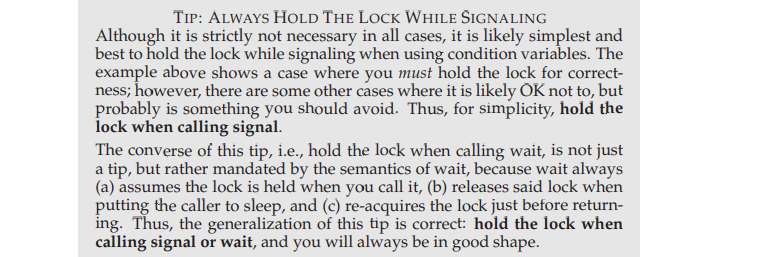

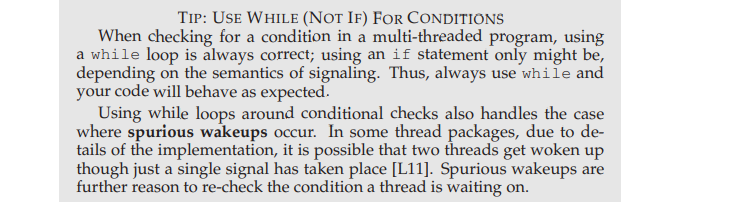

## 30.4 Summary
We have seen the introduction of another important synchronization
primitive beyond locks: condition variables. By allowing threads to sleep
when some program state is not as desired, CVs enable us to neatly solve
a number of important synchronization problems, including the famous
(and still important) producer/consumer problem, as well as covering
conditions.

# 31 - Semaphores
As we know now, one needs both locks and condition variables to solve a broad range of relevant and interesting concurrency problems.

Dijkstra and colleagues invented the semaphore as a single primitive for all things related to synchronization; as you will see, one can use semaphores as both locks and condition variables.

**THE CRUX: HOW TO USE SEMAPHORES**
- How can we use semaphores instead of locks and condition variables?
- What is the definition of a semaphore? What is a binary semaphore?
- Is it straightforward to build a semaphore out of locks and condition variables?
- What about building locks and condition variables out of semaphores?

## 31.1 Semaphores: A Definition
**A semaphore is as an object with an integer value that we can manipulate with two routines**; in the POSIX standard, these routines are `sem_wait()` and `sem_post()`

Because the initial value of the semaphore determines its behavior, before calling any other routine to interact with the semaphore, we must first initialize it to some value:

    1 #include <semaphore.h>
    2 sem_t s;
    3 sem_init(&s, 0, 1);

- In the figure, we declare a semaphore s and initialize it to the value 1 by passing 1 in as the third argument. 
- The second argument to `sem_init()` will be set to 0 in all of the examples we’ll see; this indicates that the semaphore is shared between threads in the same process.

After a semaphore is initialized, we can call one of two functions to interact with it, `sem_wait()` or `sem_post()`

- `sem_wait()` will either return right away (because the value of the semaphore was one or higher when we called sem_wait()), or it will cause the caller to suspend execution waiting for a subsequent post
- multiple calling threads may call into sem_wait(), and thus all be queued waiting to be woken.
- `sem_post()` does not wait for some particular condition to hold like sem_wait() does. Rather, it simply increments the value of the semaphore and then, if there is a thread waiting to be woken, wakes one of them up.
- the value of the semaphore, when negative, is equal to the number of waiting threads

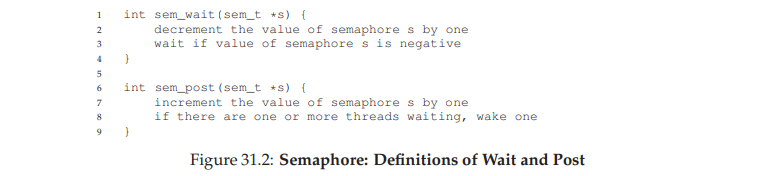



## 31.2 Binary Semaphores (Locks)
we simply surround the critical section of interest with a sem_wait()/sem_post() pair. Critical to making this work, though, is the initial value of the semaphore `m` (initialized to `X` in the figure). What should `X` be?
- the initial value should be `1`

To make this clear, let’s imagine a scenario with two threads. The first
thread (Thread 0) calls sem wait(); it will first decrement the value of
the semaphore, changing it to 0. Then, it will wait only if the value is
not greater than or equal to 0; because the value is 0, the calling thread
will simply return and continue; Thread 0 is now free to enter the critical
section. If no other thread tries to acquire the lock while Thread 0 is inside
the critical section, when it calls sem post(), it will simply restore the
value of the semaphore to 1

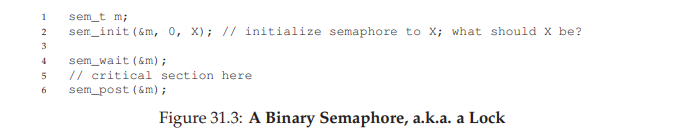

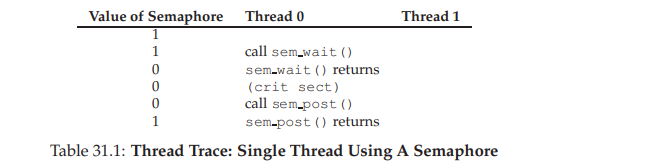

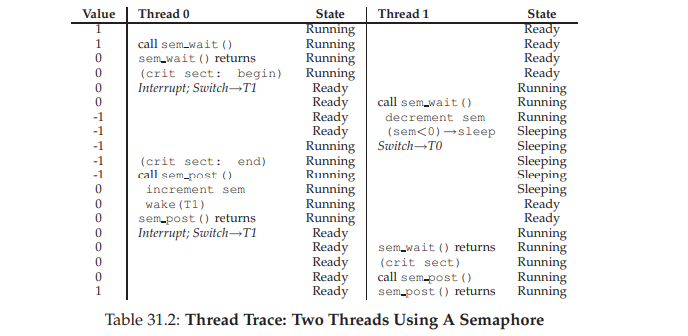

Thus we are able to use semaphores as locks. Because locks only have two states (held and not held), this usage is sometimes known as a binary semaphore and in fact can be implemented in a more simplified manner than discussed here; we instead use the generalized semaphore as a lock.

## 31.3 Semaphores As Condition Variables
Semaphores are also useful when a thread wants to halt its progress waiting for a condition to become true.

For example, a thread may wish to wait for a list to become non-empty, so it can delete an element from it. In this pattern of usage, we often find a thread waiting for something to happen, and a different thread making that something happen and then signaling that it has happened, thus waking the waiting thread. Because the waiting thread (or threads) is waiting for some condition in the program to change, we are using the semaphore as a condition variable.

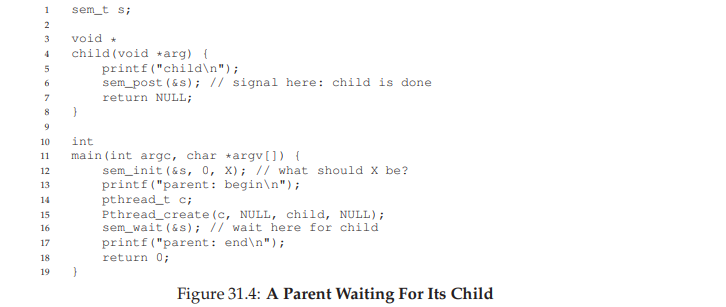

the parent simply calls sem_wait() and the child sem_post() to wait for the condition of the child finishing its execution to become true.

## 31.4 The Producer/Consumer (Bounded-Buffer) Problem
The next problem we will confront in this chapter is known as the producer/consumer problem, or sometimes as the **bounded buffer** problem

The producer/consumer problem, also known as the bounded-buffer problem, involves managing a shared buffer between producer and consumer threads. 

## 31.5 Reader-Writer Locks
Another classic problem stems from the desire for a more flexible locking primitive that admits that different data structure accesses might require different kinds of locking.

Reader-writer locks are a more flexible locking primitive that allows for different types of access to shared data. For example, while insert operations modify a data structure and require exclusive access, lookup operations only read the data and can proceed concurrently, provided no insert is ongoing. This concept is implemented with a **reader-writer lock**.

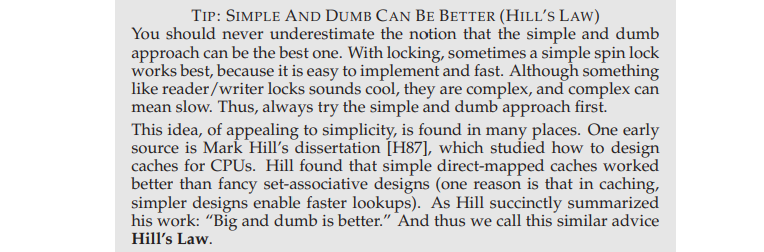



## 31.6 The Dining Philosophers
One of the most famous concurrency problems posed, and solved, by
Dijkstra, is known as the dining philosopher’s problem [DHO71]. The
problem is famous because it is fun and somewhat intellectually interesting; however, its practical utility is low. However, its fame forces its
inclusion here

The basic setup for the problem: assume there are five “philosophers” sitting around a table. Between each pair of philosophers is a single fork (and thus, five total). The philosophers each have times where they think, and don’t need any forks, and times where they eat. In order to eat, a philosopher needs two forks, both the one on their left and the one on their right. 

The contention for these forks, and the synchronization problems that ensue, are what makes this a problem we study in concurrent programming.

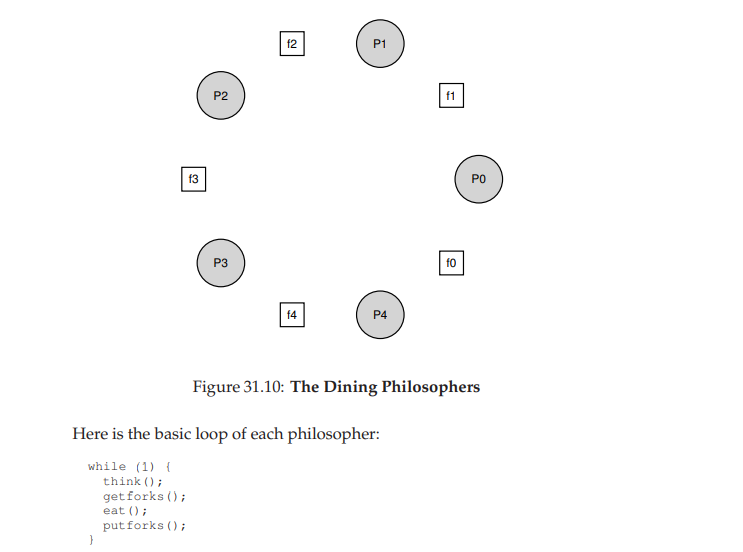

The key challenge, then, is to write the routines getforks() and putforks() such that there is no deadlock, no philosopher starves and never gets to eat, and concurrency is high (i.e., as many philosophers can eat at the same time as possible).

**Problem: Deadlock** - If all philosophers simultaneously pick up the fork on their left, they will wait indefinitely for the fork on their right, causing a deadlock.

**A Solution: Breaking the Dependency** - To avoid deadlock, change the order in which one philosopher (e.g., philosopher 4) acquires forks. By reversing the acquisition order for one philosopher, the circular waiting condition is eliminated.

Key Insights:
- Breaking the Cycle: Reversing the order for one philosopher prevents all philosophers from simultaneously holding one fork and waiting for another.
- Fairness: This solution ensures that all philosophers eventually eat without getting stuck.

## 31.7 How to Implement Semaphores

Semaphores, a classic synchronization primitive, can be implemented using basic building blocks such as locks and condition variables. This section demonstrates how to create a custom version of semaphores called **Zemaphores**.

A Zemaphore uses:
- A **lock** for mutual exclusion.
- A **condition variable** for signaling.
- A **state variable** to track the semaphore value.

Key Details:
1. Value Management: Unlike pure semaphores, Zemaphore values never go below zero. This approach simplifies implementation and matches Linux's semaphore behavior.
2. State Tracking: The value of the semaphore does not reflect the number of waiting threads when negative, differing slightly from Dijkstra's original definition.

Generalization and Its Pitfalls:
- Generalization in Design: While generalizing concepts can broaden their applicability, it must be done cautiously. As Lampson advises, "Don't generalize; generalizations are generally wrong."
- Semaphores vs. Locks/Condition Variables: Semaphores can be seen as a generalization of locks and condition variables, but this generalization is not always necessary or practical. For example:
    - Building condition variables on top of semaphores is notably more challenging than implementing semaphores using locks and condition variables.

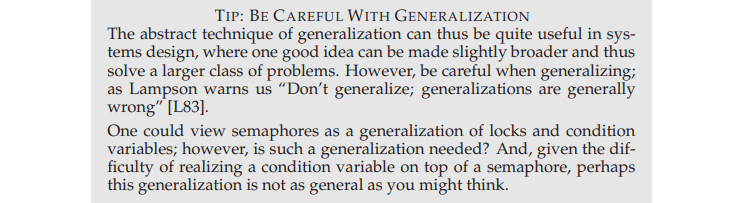

## 31.8 Summary
Semaphores are a powerful and flexible primitive for writing concurrent programs. Some programmers use them exclusively, shunning locks
and condition variables, due to their simplicity and utility

# 32 - Common Concurrency Problems
**CRUX: HOW TO HANDLE COMMON CONCURRENCY BUGS - Concurrency bugs tend to come in a variety of common patterns. Knowing which ones to look out for is the first step to writing more robust, correct concurrent code.**

## 32.1 What Types Of Bugs Exist?
Specifically, we rely upon a study by Lu et al. which analyzes a number of popular concurrent applications in great detail to understand what types of bugs arise in practice.

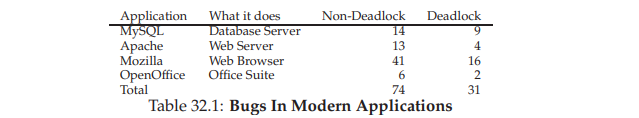

## 32.2 Non-Deadlock Bugs
Non-deadlock bugs make up a majority of concurrency bugs, according to Lu’s study
- **atomicity violation** bugs
- **order violation** bugs

The more formal definition of an **atomicity violation**, according to Lu et al, is this: “The desired serializability among multiple memory accesses is violated (i.e. a code region is intended to be atomic, but the atomicity is not enforced during execution).”
- Finding a fix for this type of problem is often (but not always) straightforward. Can you think of how to fix the code above? In this solution, we simply add **locks** around the shared-variable references, ensuring that when either thread accesses the field, it has a lock held

The more formal definition of an **order violation** is this: “The desired order between two (groups of) memory accesses is flipped (i.e., A should always be executed before B, but the order is not enforced during execution).”
- The fix to this type of bug is generally to enforce ordering. As we discussed in detail previously, using condition variables is an easy and robust way to add this style of synchronization into modern code bases.

##### Non-Deadlock Bugs: Summary
A large fraction (97%) of non-deadlock bugs studied by Lu et al. are either atomicity or order violations. Thus, by carefully thinking about these types of bug patterns, programmers can likely do a better job of avoiding them.

## 32.3 Deadlock Bugs
Deadlock occurs, for example, when a thread (say Thread 1) is holding a lock (L1) and waiting for another one (L2); unfortunately, the thread (Thread 2) that holds lock L2 is waiting for L1 to be released.

Here is a code snippet that demonstrates such a potential deadlock:
    
    Thread 1: Thread 2:
    lock(L1); lock(L2);
    lock(L2); lock(L1);

each thread is waiting for the other and neither can run

**CRUX: HOW TO DEAL WITH DEADLOCK - How should we build systems to prevent, avoid, or at least detect and recover from deadlock? Is this a real problem in systems today?**

#### Why Do Deadlocks Occur?
Simple deadlocks such as the one above seem readily avoidable. Eg; if Thread 1 and 2 both made sure to grab locks in the same order, the deadlock would never arise. So why do deadlocks happen?

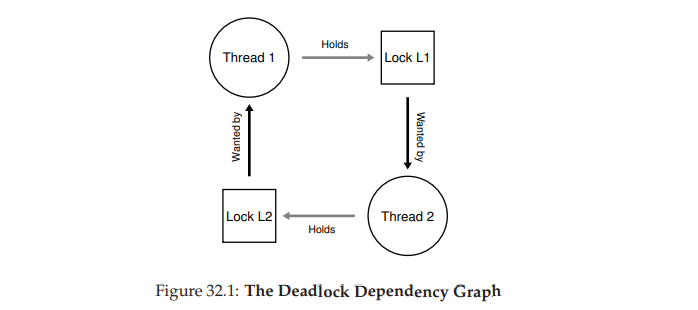

One reason is that in large code bases, **complex dependencies** arise between components. 
- Take the operating system, for example. The virtual memory system might need to access the file system in order to page in a block from disk; the file system might subsequently require a page of memory to read the block into and thus contact the virtual memory system
- Thus, the design of locking strategies in large systems must be carefully done to avoid deadlock in the case of circular dependencies that may occur naturally in the code.

Another reason is due to the nature of **encapsulation**. As software developers, we are taught to hide details of implementations and thus make
software easier to build in a modular way. Unfortunately, such modularity does not mesh well with locking

#### Conditions for Deadlock
**Four conditions need to hold for a deadlock to occur:**
- **Mutual exclusion:** Threads claim exclusive control of resources that they require (e.g., a thread grabs a lock).
- **Hold-and-wait:** Threads hold resources allocated to them (e.g., locks that they have already acquired) while waiting for additional resources (e.g., locks that they wish to acquire).
- **No preemption:** Resources (e.g., locks) cannot be forcibly removed from threads that are holding them.
- **Circular wait:** There exists a circular chain of threads such that each thread holds one more resources (e.g., locks) that are being requested by the next thread in the chain.

If any of these four conditions are not met, deadlock cannot occur. 

Thus, we first explore techniques to prevent deadlock; each of these strategies seeks to prevent one of the above conditions from arising and thus is one approach to handling the deadlock problem.

#### Deadlock Prevention and Recovery Techniques:

##### Circular Wait Prevention
- **Technique**: Enforce a strict ordering of lock acquisition.
  - Always acquire locks in a predetermined order (e.g., L1 before L2).
  - This ensures no cyclical wait arises, thus preventing deadlock.
- **Challenges**:
  - Requires careful design and adherence to global locking strategies.
  - A single mistake can lead to incorrect ordering and potential deadlock.

##### Hold-and-Wait Prevention
- **Technique**: Acquire all locks at once, atomically.
  - Use a global prevention lock to serialize lock acquisition.
- **Challenges**:
  - Reduces concurrency as locks are acquired earlier than needed.
  - Requires knowledge of which locks are needed before calling routines.

##### No Preemption
- **Technique**: Use flexible locking mechanisms like `trylock()` to avoid holding multiple locks while waiting.
  - Example:
    ```c
    top:
    lock(L1);
    if (trylock(L2) == -1) {
        unlock(L1);
        goto top;
    }
    ```
  - **Benefits**:
    - Threads retry acquiring locks instead of waiting, preventing deadlock.
    - Allows different lock acquisition orders without causing deadlock.
  - **Challenges**:
    - Can lead to *livelock*, where progress stalls due to constant retries.
    - Requires careful resource management when retrying.

##### Mutual Exclusion Avoidance
- **Technique**: Design wait-free data structures using atomic operations like `compare-and-swap`.

  - **Benefits**:
    - Eliminates deadlocks by avoiding locks entirely.
  - **Challenges**:
    - Livelock remains a possibility.
    - Building complex wait-free structures is non-trivial.

##### Deadlock Avoidance via Scheduling
- **Technique**: Use global knowledge of thread behavior to schedule execution safely.
  - Example: Schedule threads such that conflicting lock acquisitions do not overlap.
  - **Challenges**:
    - Static scheduling is conservative and reduces concurrency.
    - Practical only in controlled environments (e.g., embedded systems).

##### Detect and Recover
- **Technique**: Allow deadlocks to occur and resolve them when detected.
  - Use a resource graph to detect cycles (deadlocks) periodically.
  - Recovery involves restarting the system or manually repairing data structures.
  - **Pragmatic**: Useful when deadlocks are rare and their impact is minimal.

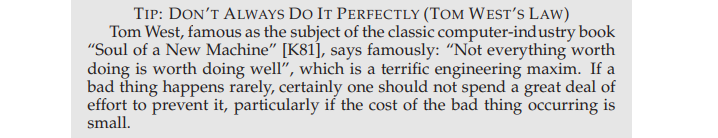

# 33 - Event-based Concurrency (Advanced)
Thus far, we’ve written about concurrency as if the only way to build concurrent applications is to use threads. Like many things in life, this is not completely true.

Specifically, a different style of concurrent programming is often used in both GUI-based applications as well as some types of internet servers. 
- This style, known as **event-based concurrency**, has become popular in some modern systems, including server-side frameworks such as **node.js**
- its roots are found in C/UNIX systems

**THE CRUX:
HOW TO BUILD CONCURRENT SERVERS WITHOUT THREADS - How can we build a concurrent server without using threads, and thus retain control over concurrency as well as avoid some of the problems that seem to plague multi-threaded applications?**

## 33.1 The Basic Idea: An Event Loop
IDEA: you simply wait for something (an “event”) to occur; when it does, you check what type of event it is and do the small amount of work it requires (which may include issuing I/O requests, or scheduling other events for future handling, etc.)

Such applications are based around a simple construct known as the event loop. Pseudocode for an event loop looks like this:
    
    while (1) {
        events = getEvents();
        for (e in events)
            processEvent(e);
    }

The main loop simply waits for something to do (by calling getEvents() in the code above) and then, for each event returned, processes them, one at a time; the code that processes each event is known as an **event handler**

Importantly, when a handler processes an event, it is the only activity taking place in the system; thus, deciding which event to handle next is equivalent to scheduling - This explicit control over scheduling is one of the fundamental advantages of the eventbased approach.

## 33.2 An Important API: select() (or poll())
With that basic event loop in mind, we next must address the question of how to receive events. 

In most systems, a basic API is available, via either the `select()` or `poll()` system calls.

What these interfaces enable a program to do is simple: check whether there is any incoming I/O that should be attended to. 
- For example, imagine that a network application (such as a web server) wishes to check whether any network packets have arrived, in order to service them. These system calls let you do exactly that.

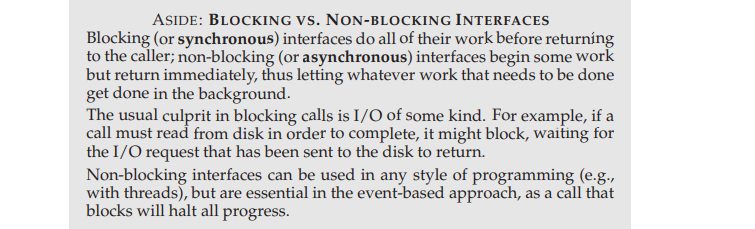

## 33.4 Why Simpler? No Locks Needed
With a single CPU and an event-based application, the problems found
in concurrent programs are no longer present. Specifically, because only
one event is being handled at a time, there is no need to acquire or release
locks; the event-based server cannot be interrupted by another thread because it is decidedly single threaded. Thus, concurrency bugs common in
threaded programs do not manifest in the basic event-based approach.

## 33.5 A Problem: Blocking System Calls
Thus far, event-based programming sounds great, right? You program a simple loop, and handle events as they arise. You don’t even need to think about locking! But there is an issue: what if an event requires that you issue a system call that might block?

For example, imagine a request comes from a client into a server to read a file from disk and return its contents to the requesting client (much like a simple HTTP request). 
To service such a request, some event handler will eventually have to issue an open() system call to open the file, followed by a series of read() calls to read the file. 
When the file is read into memory, the server will likely start sending the results to the client.
Both the open() and read() calls may issue I/O requests to the storage system (when the needed metadata or data is not in memory already), and thus may take a long time to service. 
With a thread-based server, this is no issue: while the thread issuing the I/O request suspends (waiting for the I/O to complete), other threads can run, thus enabling the server to make progress. 
Indeed, this natural overlap of I/O and other computation is what makes thread-based programming quite natural and straightforward.

**With an event-based approach, however, there are no other threads to run: just the main event loop. And this implies that if an event handler issues a call that blocks, the entire server will do just that: block until the call completes**
- When the event loop blocks, the system sits idle, and thus is a huge potential waste of resources.
- We thus have a rule that must be obeyed in event-based systems: no blocking calls are allowed.

## 33.6 A Solution: Asynchronous I/O
To overcome this limit, many modern operating systems have introduced new ways to issue I/O requests to the disk system, referred to
generically as **asynchronous I/O**.

These interfaces enable an application to issue an I/O request and return control immediately to the caller, before the I/O has completed; additional interfaces enable an application to determine whether various I/Os have completed.
- **AIO control block**

## 33.7 Another Problem: State Management
such code is generally more complicated to write than traditional thread-based code

## 33.8 Challenges with Event-Based Programming

1. **Scaling to Multiple CPUs**
   - Event-based systems were simpler on single CPUs.
   - On multicore systems, running multiple event handlers in parallel introduces synchronization challenges, requiring solutions like locks.

2. **Implicit Blocking (e.g., Paging)**
   - Event-based systems are designed to avoid explicit blocking, but implicit blocking (e.g., page faults) can halt the server until the fault completes, leading to performance issues.

3. **Code Complexity**
   - Event-based code can become difficult to maintain:
     - Changing a routine from non-blocking to blocking requires rewriting event handlers.
     - Programmers must vigilantly manage API changes to prevent blocking, which can disrupt the server.

4. **Asynchronous I/O Challenges**
   - Asynchronous disk I/O has become more common but often does not integrate seamlessly with asynchronous network I/O.
   - Typically, a combination of `select()` (for networking) and AIO calls (for disk I/O) is required, complicating the implementation.

## 33.9 Summary
Event-based servers give control of scheduling to the application itself, but do so at some cost in complexity and difficulty of integration with other aspects of modern systems (e.g., paging). 

Because of these challenges, no single approach has emerged as best; thus, both threads and events are likely to persist as two different approaches to the same concurrency problem for many years to come. 




# 34 - Summary Dialogue on Concurrency
if concurrent code is so hard to think about, and so hard to get right, how are we supposed to write correct concurrent code?
- keep it simple! 
- Avoid complex interactions between threads
- use well-known and tried-and-true ways to manage thread interactions

Like simple locking, and maybe a producer-consumer queue -common paradigms, and you should be able to produce the working solutions given what you’ve learned. 

Second, only use concurrency when absolutely needed; avoid it if at all possible. There is nothing worse than premature optimization of a program.

if you really need parallelism, seek it in other simplified forms. 
- Eg: Map-Reduce method for writing parallel data analysis code - an excellent example of achieving parallelism without having to handle any of the horrific complexities of locks, condition variables, and the other nasty things we’ve talked about.

# Part III - Persistence
# 35 - A Dialogue on Persistence
third of our three pillars of operating systems: **persistence**

you probably know what it means in the traditional sense. As the dictionary would say: “a firm or obstinate continuance in a course of action in spite of difficulty or opposition."

making information persist, despite computer crashes, disk failures, or power outages is a tough and interesting challenge.

# 36 - I/O Devices
**CRUX: HOW TO INTEGRATE I/O INTO SYSTEMS - How should I/O be integrated into systems? What are the general mechanisms? How can we make them efficient?**

## 36.1 System Architecture
structure of a typical system - single CPU attached to the main memory of the system via some kind of memory bus or interconnect

Some devices are connected to the system via a **general I/O bus**, which in many modern systems would be PCI (or one if its many derivatives)
- graphics and some other higher-performance I/O devices might be found here.

Finally, even lower down are one or more of what we call a **peripheral bus**, such as SCSI, SATA, or USB
- These connect the slowest devices to the system, including disks, mice, and other similar components.

why do we need a hierarchical structure like this? Put simply: physics, and cost.
- The faster a bus is, the shorter it must be; thus, a high-performance memory bus does not have much room to plug devices and such into it
- engineering a bus for high performance is quite costly

Thus, system designers have adopted this hierarchical approach, where components that demands high performance (such as the graphics card) are nearer the CPU

The benefits of placing disks and other slow devices on a peripheral bus are manifold; in particular, you can place a large number of devices on it.

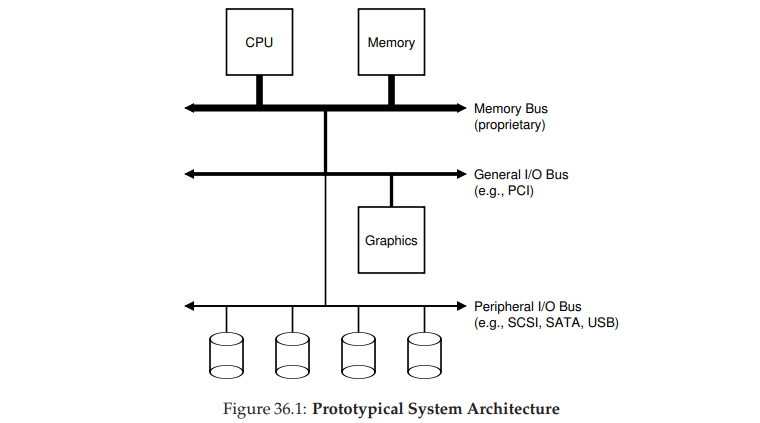

## 36.2 A Canonical Device
A device has two important components
- the hardware interface it presents to the rest of the system
    - Just like a piece of software, hardware must also present some kind of interface that allows the system software to control its operation
- its internal structure.
    - This part of the device is implementation specific and is responsible for implementing the abstraction the device presents to the system.
    - Very simple devices will have one or a few hardware chips to implement their functionality; more complex devices will include a simple CPU, some general purpose memory, and other device-specific chips to get their job done

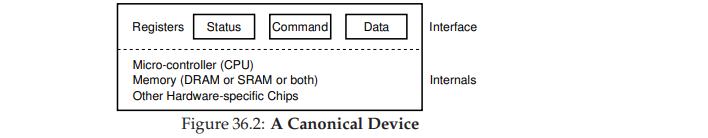

## 36.3 The Canonical Protocol
In the picture above, the (simplified) device interface is comprised of three registers: 
1. a **status register** - can be read to see the current status of the device
2. a **command register** - tells the device to perform a certain task
3. a **data register** - passes data to the device, or get data from the device.

By reading and writing these registers, the operating system can control device behavior.

**A typical interaction that the OS might have with the device in order to get the device to do something on its behalf**

The protocol is as follows:

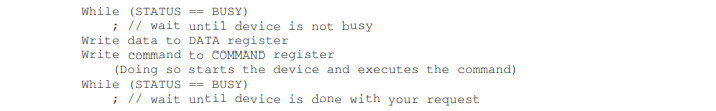

**The protocol has four steps:**
1. The OS waits until the device is ready to receive a command by repeatedly reading the status register; we call this **polling** the device (basically, just asking it what is going on). 
2. OS sends some data down to the data register; one can imagine that if this were a disk, for example, that multiple writes would need to take place to transfer a disk block (say 4KB) to the device. When the main CPU is involved with the data movement (as in this example protocol), we refer to it as **programmed I/O (PIO)**. 
3. OS writes a command to the command register; doing so implicitly lets the device know that both the data is present and that it should begin working on the command. 
4. OS waits for the device to finish by again **polling** it in a loop, waiting to see if it is finished (it may then get an error code to indicate success or failure).

This basic protocol has the positive aspect of being simple and working. However, there are some inefficiencies and inconveniences involved.
- polling seems inefficient; specifically, it wastes a great deal of CPU time just waiting for the (potentially slow) device to complete its activity, instead of switching to another ready process and thus better utilizing the CPU.

**THE CRUX: HOW TO AVOID THE COSTS OF POLLING - How can the OS check device status without frequent polling, and thus lower the CPU overhead required to manage the device?**

## 36.4 Lowering CPU Overhead With Interrupts
the **interrupt**

Instead of polling the device repeatedly, the OS can issue a request, put the calling process to sleep, and context switch to another task. 
- When the device is finally finished with the operation, it will raise a hardware interrupt, causing the CPU to jump into the OS at a pre-determined **interrupt service routine (ISR)** or more simply an **interrupt handler**.
- The handler is just a piece of OS code that will finish the request and wake the process waiting for the I/O, which can then proceed as desired.

Interrupts thus allow for overlap of computation and I/O, which is key for improved utilization

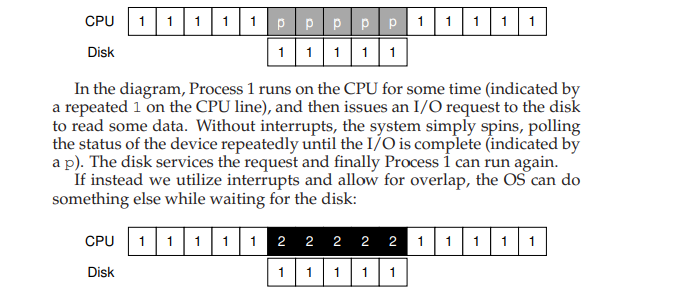

- In this example, the OS runs Process 2 on the CPU while the disk services Process 1’s request. 
- When the disk request is finished, an interrupt occurs, and the OS wakes up Process 1 and runs it again

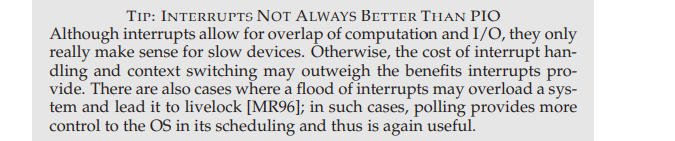

If the speed of the device is not known, or sometimes
fast and sometimes slow, it may be best to use a hybrid that polls for a
little while and then, if the device is not yet finished, uses interrupts. This
two-phased approach may achieve the best of both worlds.

Another reason not to use interrupts arises in networks. When a huge stream of incoming packets each generate an interrupt, it is possible for the OS to **livelock**, that is, find itself only processing interrupts and never allowing a user-level process to run and actually service the requests.

Another interrupt-based optimization is **coalescing**. 
- In such a setup, a device which needs to raise an interrupt first waits for a bit before delivering the interrupt to the CPU. 
- While waiting, other requests may soon complete, and thus **multiple interrupts can be coalesced into a single interrupt delivery**, thus lowering the overhead of interrupt processing.


## 36.5 More Efficient Data Movement With DMA
In particular, when using programmed I/O (PIO) to transfer a large chunk of data to a device, the CPU is once again overburdened with a rather trivial task, and thus wastes a lot of time and effort that could better be spent running other processes.

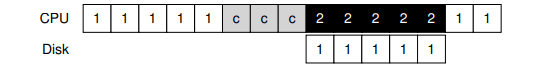

In the timeline, Process 1 is running and then wishes to write some data to
the disk. It then initiates the I/O, which must copy the data from memory
to the device explicitly, one word at a time (marked c in the diagram).
When the copy is complete, the I/O begins on the disk and the CPU can
finally be used for something else.

**THE CRUX: HOW TO LOWER PIO OVERHEADS - With PIO, the CPU spends too much time moving data to and from devices by hand. How can we offload this work and thus allow the CPU to be more effectively utilized?**

solution: **Direct Memory Access (DMA)**
- A DMA engine is essentially a very specific device within a system that can orchestrate transfers between devices and main memory without much CPU intervention.

DMA works as follows. 
- To transfer data to the device, for example, the OS would program the DMA engine by telling it where the data lives in memory, how much data to copy, and which device to send it to. 
- At that point, the OS is done with the transfer and can proceed with other work.
- When the DMA is complete, the DMA controller raises an interrupt, and the OS thus knows the transfer is complete.

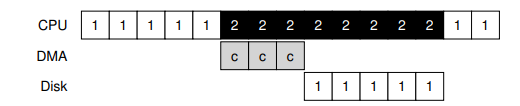

From the timeline, you can see that the copying of data is now handled by the DMA controller. Because the CPU is free during that time, the OS can do something else, here choosing to run Process 2. Process 2 thus gets to use more CPU before Process 1 runs again.

## 36.6 Methods Of Device Interaction
**THE CRUX: HOW TO COMMUNICATE WITH DEVICES - How should the hardware communicate with a device? Should there be explicit instructions? Or are there other ways to do it?**

Over time, two primary methods of device communication have developed. 
1. explicit I/O instructions - specify a way for the OS to send data to specific device registers and thus allow the construction of the protocols described above
2. memorymapped I/O - the hardware makes device registers available as if they were memory locations

There is not some great advantage to one approach or the other. The
memory-mapped approach is nice in that no new instructions are needed
to support it, but both approaches are still in use today.

## 36.7 Fitting Into The OS: The Device Driver
One final problem: how to fit devices, each of which have very specific interfaces, into the OS, which we would like to keep as general as possible.

**THE CRUX: HOW TO BUILD A DEVICE-NEUTRAL OS - How can we keep most of the OS device-neutral, thus hiding the details of device interactions from major OS subsystems?**

The problem is solved through the age-old technique of **abstraction**. 

At the lowest level, a piece of software in the OS must know in detail how a device works. We call this piece of software a **device driver**, and any specifics of device interaction are encapsulated within.

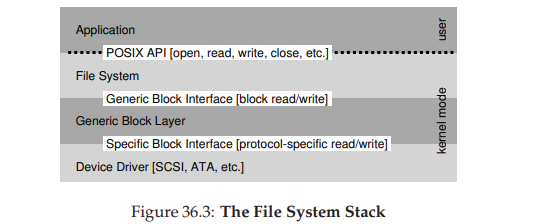

Figure 36.3 is a rough and approximate depiction of the Linux software organization
- As you can see from the diagram, a file system (and certainly, an application above) is completely oblivious to the specifics of which disk class it is using; it simply issues block read and write requests to the generic block layer, which routes them to the appropriate device driver, which handles the details of issuing the specific request.
- Although simplified, the diagram shows how such detail can be hidden from most of the OS.

Interestingly, because device drivers are needed for any device you might plug into your system, over time they have come to represent a huge percentage of kernel code.
- over 70% of OS code is found in device drivers; for Windows-based systems, it is likely quite high as well
- Thus, when people tell you that the OS has millions of lines of code, what they are really saying is that the OS has millions of lines of device-driver code
- Of course, for any given installation, most of that code may not be active (i.e., only a few devices are connected to the system at a time)
- drivers are often written by “amateurs” (instead of full-time kernel developers) -> more bugs and thus are a primary contributor to kernel crashes

## 36.8 Case Study: A Simple IDE Disk Driver
An IDE disk presents a simple interface to the system, consisting of
four types of register: control, command block, status, and error. These
registers are available by reading or writing to specific “I/O addresses”
(such as 0x3F6 below) using (on x86) the in and out I/O instructions.

The basic protocol to interact with the device is as follows:
1. Wait for drive to be ready
2. Write parameters to command registers
3. Start the I/O.
4. Data transfer (for writes)
5. Handle interrupts
6. Error handling

## 36.10 Summary
You should now have a very basic understanding of how an OS interacts with a device. Two techniques, the interrupt and DMA, have been
introduced to help with device efficiency, and two approaches to accessing device registers, explicit I/O instructions and memory-mapped I/O,
have been described.

- These ideas emerged naturally as a solution to the mismatch between fast CPUs and slow I/O devices.
- it is evident that the need for I/O support led to innovations like interrupts and DMA across early computing machines.

# 37 - Hard Disk Drives
These drives have been the main form of persistent data storage in computer systems for decades and much of the development of file system technology is predicated on their behavior.

**CRUX: HOW TO STORE AND ACCESS DATA ON DISK - How do modern hard-disk drives store data? What is the interface? How is the data actually laid out and accessed? How does disk scheduling improve performance?**

## 37.1 The Interface
The drive consists of a large number of sectors (512-byte blocks), each of which can be read or written

The sectors are numbered from 0 to n − 1 on a disk with n sectors. Thus, we can view the disk as an array of sectors; 0 to n − 1 is thus the **address space** of the drive.

Multi-sector operations are possible; indeed, many file systems will read or write 4KB at a time (or more). 
However, when updating the disk, the only guarantee drive manufactures make is that a single 512- byte write is **atomic** (i.e., it will either complete in its entirety or it won’t complete at all); thus, if an untimely power loss occurs, only a portion of a larger write may complete (sometimes called a **torn write**).

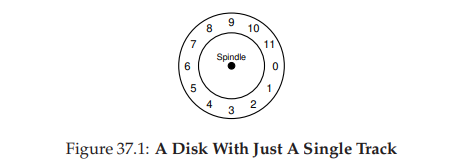

can generally assume:
- accessing two blocks that are near one-another within the drive’s address space will be faster than accessing two blocks that are far apart.
- accessing blocks in a contiguous chunk (i.e., a sequential read or write) is the fastest access mode, and usually much faster than any more random access pattern

## 37.2 Basic Geometry
Some of the components of a modern disk.
- a **platter** - a circular hard surface on which data is stored persistently by inducing magnetic changes to it
    - A disk may have one or more platters; each platter has 2 sides, each of which is called a **surface**
    - These platters are usually made of some hard material (such as aluminum), and then coated with a thin magnetic layer that enables the drive to persistently store bits even when the drive is powered off
- The platters are all bound together around the **spindle**, which is connected to a motor that spins the platters around (while the drive is powered on) at a constant (fixed) rate
- Data is encoded on each surface in concentric circles of sectors; we call one such concentric circle a **track**
    - A single surface contains many thousands and thousands of tracks, tightly packed together, with hundreds of tracks fitting into the width of a human hair.
- To read and write from the surface, we need a mechanism that allows us to either sense (read) the magnetic patterns on the disk or to induce a change in (write) them.
- This process of reading and writing is accomplished by the **disk head**; there is one such head per surface of the drive.
- The disk head is attached to a single **disk arm**, which moves across the surface to position the head over the desired track.

## 37.3 A Simple Disk Drive
Let’s understand how disks work by building up a model one track at a time. 

Assume we have a simple disk with a single track

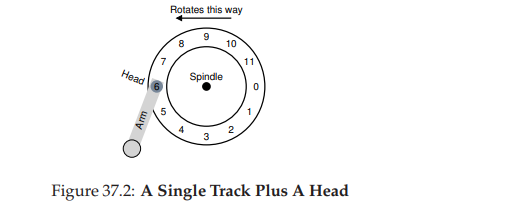

This track has just 12 sectors, each of which is 512 bytes in size (our typical sector size, recall) and addressed therefore by the numbers 0 through 11. The single platter we have here rotates around the spindle, to which a motor is attached. In the figure, the disk head, attached to the end of the arm, is positioned over sector 6, and the surface is rotating counter-clockwise.

#### Single-track Latency: The Rotational Delay
In our simple disk, the disk doesn’t have to do much. In particular, it must just wait for the desired sector to rotate under the disk head. This wait happens often enough in modern drives, and is an important enough component of I/O service time, that it has a special name: **rotational delay** (sometimes **rotation delay**)
- In the example, if the full rotational delay is R, the disk has to incur a rotational delay of about R/2 to wait for 0 to come under the read/write head (if we start at 6). A worst-case request on this single track would be to sector 5, causing nearly a full rotational delay in order to service such a request.

#### Multiple Tracks: Seek Time
So far our disk just has a single track, which is not too realistic; modern disks of course have many millions

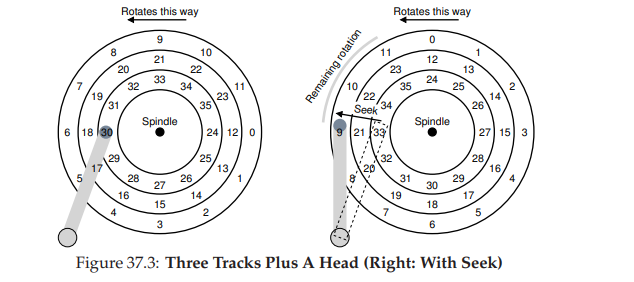

In the figure, the head is currently positioned over the innermost track (which contains sectors 24 through 35); the next track over contains the next set of sectors (12 through 23), and the outermost track contains the first sectors (0 through 11).

To understand how the drive might access a given sector, we now trace what would happen on a request to a distant sector, e.g., a read to sector 11. To service this read, the drive has to first move the disk arm to the correct track (in this case, the outermost one), in a process known as a **seek**
- Seeks, along with rotations, are one of the most costly disk operations

The seek, it should be noted, has many phases: 
- first an acceleration phase as the disk arm gets moving
- then coasting as the arm is moving at full speed
- then deceleration as the arm slows down
- finally settling as the head is carefully positioned over the correct track
The settling time is often quite significant, e.g., 0.5 to 2 ms, as the drive must be certain to find the right track

As we can see, during the seek, the arm has been moved to the desired track, and the platter of course has rotated, in this case about 3 sectors. Thus, sector 9 is just about to pass under the disk head, and we must only endure a short rotational delay to complete the transfer.

When sector 11 passes under the disk head, the final phase of I/O will take place, known as the transfer, where data is either read from or written to the surface. 

And thus, we have a complete picture of I/O time:
- first a seek
- then waiting for the rotational delay
- finally the transfer

#### Some Other Details
Many drives employ some kind of **track skew** to make sure that sequential reads can be properly serviced even when crossing track boundaries

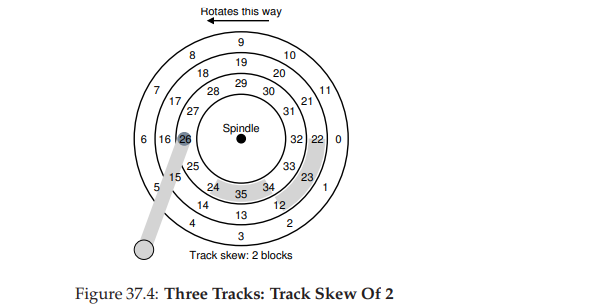

Sectors are often skewed like this because when switching from one
track to another, the disk needs time to reposition the head (even to neighboring tracks). Without such skew, the head would be moved to the next
track but the desired next block would have already rotated under the
head, and thus the drive would have to wait almost the entire rotational
delay to access the next block

Another reality is that outer tracks tend to have more sectors than inner tracks, which is a result of geometry; there is simply more room out there. These tracks are often referred to as **multi-zoned** disk drives, where the disk is organized into multiple zones, and where a zone is consecutive set of tracks on a surface.

Finally, an important part of any modern disk drive is its **cache**, for historical reasons sometimes called a **track buffer**. This cache is just some small amount of memory (usually around 8 or 16 MB) which the drive can use to hold data read from or written to the disk.
- For example, when reading a sector from the disk, the drive might decide to read in all of the sectors on that track and cache them in its memory; doing so allows the drive to quickly respond to any subsequent requests to the same track.

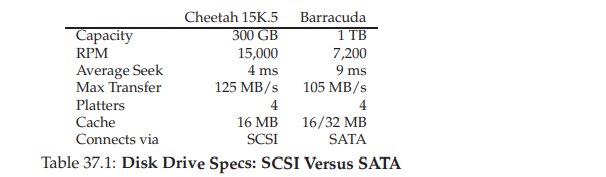

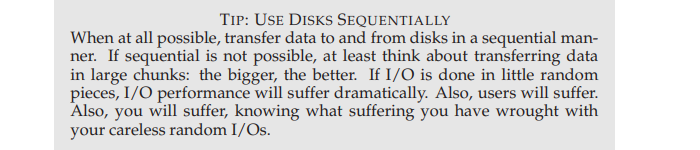



# 38 - Redundant Arrays of Inexpensive Disks (RAIDs)
**CRUX: HOW TO MAKE A LARGE, FAST, RELIABLE DISK - How can we make a large, fast, and reliable storage system? What are the key techniques? What are trade-offs between different approaches?**

In this chapter, we introduce the Redundant Array of Inexpensive Disks better known as RAID, a technique to use multiple disks in concert to build a faster, bigger, and more reliable disk system.
- Externally, a RAID looks like a disk: a group of blocks one can read or write. 
- Internally, the RAID is a complex beast, consisting of multiple disks, memory (both volatile and non-), and one or more processors to manage the system.

A hardware RAID is very much like a computer system, specialized for the task of managing a group of disks.

advantages:
- performance. Using multiple disks in parallel can greatly speed up I/O times. 
- capacity. Large data sets demand large disks. 
- reliability; spreading data across multiple disks (without RAID techniques) makes the data vulnerable to the loss of a single disk; with some form of redundancy, RAIDs can tolerate the loss of a disk and keep operating as if nothing were wrong.

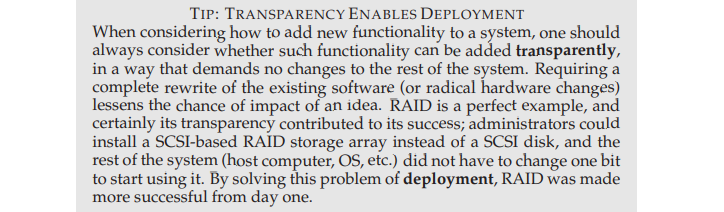

Amazingly, RAIDs provide these advantages transparently to systems that use them, i.e., a RAID just looks like a big disk to the host system. The beauty of transparency, of course, is that it enables one to simply replace a disk with a RAID and not change a single line of software; the operating system and client applications continue to operate without modification

## 38.1 Interface And RAID Internals
When a file system issues a logical I/O request to the RAID, the RAID internally must calculate which disk (or disks) to access in order to complete the request, and then issue one or more physical I/Os to do so.

A RAID system is often built as a separate hardware box, with a standard connection (e.g., SCSI, or SATA) to a host. Internally, however,
RAIDs are fairly complex, consisting of a microcontroller that runs firmware
to direct the operation of the RAID, volatile memory such as DRAM
to buffer data blocks as they are read and written, and in some cases non-volatile memory to buffer writes safely and perhaps even specialized logic to perform parity calculations

At a high level, a RAID is very much a specialized computer system: it has a processor, memory, and disks; however, instead of running applications, it runs specialized software designed to operate the RAID.

## 38.2 Fault Model
Fail-Stop Fault Model

In the fail-stop fault model, a disk is either in one of two states: working or failed.
- Working disk: All blocks can be read or written.
- Failed disk: Permanently lost and cannot be accessed.

Fault detection: The model assumes that when a disk fails, it is easily detected by the RAID controller (hardware or software), which immediately identifies the failure.

## 38.3 How To Evaluate A RAID

To evaluate a RAID design, we assess it along three main axes:

#### 1. **Capacity**
   - **Capacity** refers to the useful storage available in the RAID system. For example:
     - Without redundancy, capacity is equal to the total number of disks (N).
     - With redundancy (e.g., two copies of each block), capacity is reduced to N/2.
     - Parity-based schemes offer a capacity between these extremes.

#### 2. **Reliability**
   - **Reliability** measures how many disk faults the RAID system can tolerate. In the fail-stop fault model, it assumes entire disk failures, without considering more complex failures like disk corruption or latent sector errors.

#### 3. **Performance**
   - **Performance** depends on the workload presented to the RAID system. To evaluate it, we must consider typical workloads that the system will handle.

This evaluation framework is used to analyze three common RAID designs: 
- **RAID Level 0** (striping)
- **RAID Level 1** (mirroring)
- **RAID Levels 4/5** (parity-based redundancy)

The "levels" refer to different approaches in RAID design, introduced by Patterson, Gibson, and Katz at Berkeley.


## 38.4 RAID Level 0: Striping

RAID Level 0, or striping, is a non-redundant RAID configuration designed to maximize performance and capacity. It stripes data blocks across multiple disks in a round-robin fashion, with no redundancy or data protection. 

#### Chunk Sizes

The chunk size refers to the amount of data written to each disk before moving to the next one. Smaller chunk sizes improve parallelism, while larger ones reduce positioning time by placing more data on a single disk.

#### Mapping Problem

When accessing a logical block, RAID needs to determine which physical disk and offset to read/write. For a chunk size of 4KB (single block), the disk and offset can be computed using:
- `Disk = A % number_of_disks`
- `Offset = A / number_of_disks`

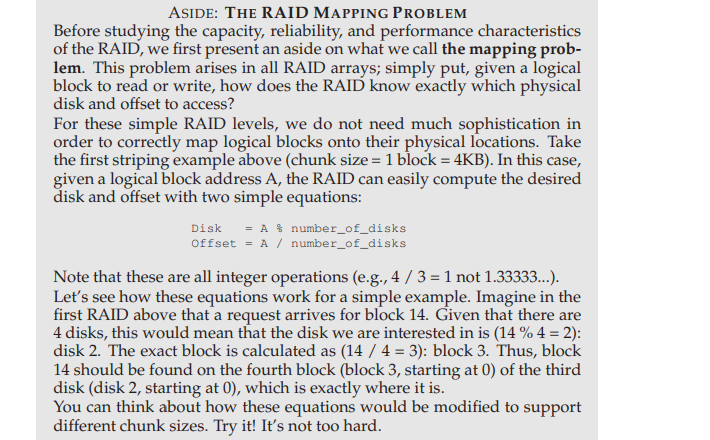

#### RAID-0 Evaluation

- **Capacity**: RAID-0 delivers N disks' worth of useful capacity (no redundancy).
- **Reliability**: Any disk failure results in data loss (no fault tolerance).
- **Performance**: Excellent performance with all disks used in parallel. The performance can be measured in two ways:
  - **Single-request latency**: How long it takes for a single I/O request.
  - **Steady-state throughput**: Total bandwidth for concurrent requests. This is critical in high-performance environments.

#### Performance Analysis

- **Sequential Workload**: RAID-0 achieves maximum efficiency, with minimal seeking and rotation, focusing on data transfer.
- **Random Workload**: Performance is less efficient as time is spent seeking and waiting for data.

To compute performance, sequential throughput (S) and random throughput (R) are calculated:
- **S (sequential)**: Average data transfer rate when accessing large contiguous blocks.
- **R (random)**: Transfer rate for small, random access requests.

For example:
- **S**: With 10MB data transfer, total time is 210ms (7ms seek, 3ms rotation, 200ms transfer). Sequential throughput is 47.62 MB/s.
- **R**: With 10KB data transfer, total time is 10.195ms. Random throughput is 0.981 MB/s.

#### RAID-0 Performance Recap

- **Single-request latency**: Comparable to a single disk.
- **Throughput**: RAID-0 can utilize the full bandwidth of the system, with sequential throughput being N times the sequential bandwidth of a single disk (N * S). For random I/O, throughput is N * R.

## 38.5 RAID Level 1: Mirroring

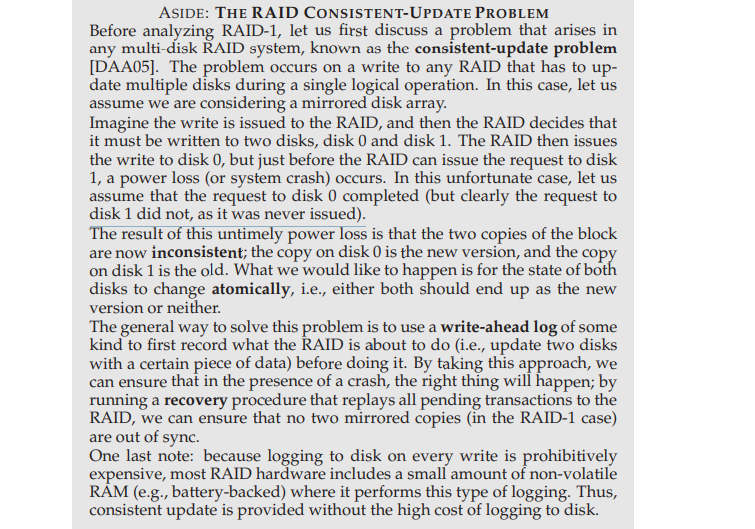

RAID Level 1, or **mirroring**, involves creating duplicate copies of data across multiple disks. This provides redundancy, allowing the system to tolerate disk failures. In a typical RAID-1 setup, each logical block has two physical copies stored on separate disks, as shown in the example where disks 0 and 1, and disks 2 and 3 mirror each other.

## Key Features of RAID-1

- **Redundancy**: Provides high reliability as it can withstand the failure of one disk without data loss. In some cases, it can even tolerate multiple disk failures depending on which disks fail.
- **Capacity**: The usable capacity is halved (N/2), as data is mirrored across multiple disks.

### Performance Analysis

#### Reads
- **Single Read**: A single read request has the same latency as reading from a single disk, as it chooses one of the copies to read from.
  
#### Writes
- **Writes**: Each write requires updates to both copies, which can happen in parallel. However, the time to complete a write is longer due to the need for both physical writes and the worst-case seek time.

#### Sequential Reads and Writes
- **Sequential Read/Write**: These operations can only achieve half of the peak bandwidth, as data must be written to both disks. Sequential reads are limited due to how data is distributed across disks.

#### Random Reads and Writes
- **Random Reads**: Perform optimally, as the reads can be distributed across all disks, achieving full bandwidth.
- **Random Writes**: Similar to sequential writes, random writes only achieve half of the available bandwidth because each logical write must be duplicated across two disks.

### Consistent-Update Problem
RAID-1 can experience a **consistent-update problem** in the event of a system crash during a write operation. To mitigate this, a **write-ahead log** is often used, ensuring both copies of the data are consistent after a failure.

### Conclusion
RAID-1 provides a good balance of reliability and performance but sacrifices usable capacity due to its mirroring.

## 38.6 RAID Level 4: Saving Space With Parity

RAID Level 4 introduces **parity-based redundancy** to reduce the storage space cost compared to mirroring, but it comes at the expense of performance. In a RAID-4 system, data is striped across multiple disks with one disk used for parity information.

#### Parity Calculation
Parity is calculated using the XOR function, which ensures that the number of 1's in a data block is even. If a disk fails, the missing data can be reconstructed by XORing the remaining data and the parity block.

#### RAID-4 Layout Example:

In this layout, each stripe of data (blocks 0-3) has an associated parity block (P0). The parity for a set of data blocks is calculated by XORing the values.

### RAID-4 Performance Analysis

#### Capacity
RAID-4 uses one disk for parity, so the usable capacity for an array of N disks is \( (N - 1) \).

#### Reliability
RAID-4 can tolerate a single disk failure. If more than one disk fails, data cannot be reconstructed.

#### Read Performance
Sequential read performance utilizes all disks except for the parity disk, resulting in a peak bandwidth of \( (N - 1) \times S \) MB/s. Random reads are distributed across data disks but not the parity disk, with an effective bandwidth of \( (N - 1) \times R \) MB/s.

#### Write Performance
Sequential writes can be optimized through **full-stripe writes**, where data and parity blocks are updated in parallel, resulting in an effective bandwidth of \( (N - 1) \times S \) MB/s.

#### Random Writes
Random writes are more complex since the parity block needs to be updated. There are two methods for updating the parity:
1. **Additive Parity**: Involves reading data blocks and recalculating the parity, which can cause performance bottlenecks.
2. **Subtractive Parity**: A more efficient method where the old data is compared to the new, and the parity is updated accordingly.

The **small-write problem** arises when multiple small write requests occur, as the parity disk becomes a bottleneck, preventing parallelism. This limits random write throughput to \( R / 2 \) MB/s.

#### I/O Latency
- **Read latency**: A single read is mapped to one disk, with latency equal to that of a single disk.
- **Write latency**: A single write involves two reads and two writes, leading to approximately twice the latency of a single disk operation.

RAID-4 is efficient for large sequential reads and writes but struggles with random writes due to the parity disk bottleneck.


## 38.7 RAID Level 5: Rotating Parity

RAID-5 was introduced to address the small-write problem by rotating the parity block across drives (unlike RAID-4, which has a dedicated parity disk). This change helps avoid the parity-disk bottleneck.

#### RAID-5 Example:

| Disk 0 | Disk 1 | Disk 2 | Disk 3 | Disk 4 |
|--------|--------|--------|--------|--------|
| 0      | 1      | 2      | 3      | P0     |
| 5      | 6      | 7      | P1     | 4      |
| 10     | 11     | P2     | 8      | 9      |
| 15     | P3     | 12     | 13     | 14     |
| P4     | 16     | 17     | 18     | 19     |

#### RAID-5 Performance:
- **Capacity & Reliability**: Similar to RAID-4; effective capacity is `N-1` and failure tolerance is `1/2`.
- **Sequential Performance**: Same as RAID-4.
- **Random Read**: Slight improvement over RAID-4 due to better disk utilization.
- **Random Write**: Significant improvement over RAID-4 as writes are handled in parallel across disks. Despite this, small-write performance still suffers due to the parity overhead.

**RAID-5 Bandwidth for Small Writes**:
- Total bandwidth = `(N/4) * R` MB/s, where `R` is random write speed.

### 38.8 RAID Comparison: A Summary

| RAID Level | Capacity         | Reliability       | Sequential Read | Sequential Write | Random Read | Random Write | Latency (Read/Write) |
|------------|------------------|------------------|-----------------|------------------|-------------|--------------|----------------------|
| RAID-0     | N                | 0                | N * S           | N * S            | N * R       | N * R        | D / D                |
| RAID-1     | N/2              | 1 (Guaranteed)   | (N/2) * S       | (N/2) * S        | N * R       | (N/2) * R    | D / D                |
| RAID-4     | N - 1            | 1                | (N-1) * S       | (N-1) * S        | (N-1) * R   | (N/2) * R    | 2D / 2D              |
| RAID-5     | N - 1            | 1/2              | (N-1) * S       | (N-1) * S        | N * R       | N/4 * R      | 2D / 2D              |

#### Key Insights:
- **RAID-0**: Best for performance, no reliability.
- **RAID-1**: Best for reliability and random I/O performance, but reduced capacity.
- **RAID-4**: Simple but suffers from small-write performance.
- **RAID-5**: Balanced between capacity, reliability, and sequential I/O performance, but with reduced small-write performance.

In summary:
- **RAID-5** is optimal when you need a balance of reliability and capacity but are doing mostly sequential I/O.
- For small writes, RAID-5 has some limitations due to the parity overhead.

## 38.9 Other Interesting RAID Issues

When considering RAID, several additional topics are worth exploring:

- **Other RAID Designs**: Apart from the common RAID levels, there are others like Levels 2, 3, and 6, which can tolerate multiple disk failures.
- **Handling Disk Failures**: RAID can use hot spares to replace failed disks. It is important to understand how RAID performance is affected during disk failure and the reconstruction process.
- **Fault Models**: More realistic fault models, including latent sector errors or block corruption, should be considered. Various techniques can handle these faults (see the Data Integrity chapter for more details).
- **Software RAID**: Software RAID is cheaper but comes with challenges like the consistent-update problem.

## 38.10 Summary

RAID (Redundant Array of Independent Disks) enhances disk storage by combining multiple independent disks into a larger, more reliable system. This transformation is transparent to hardware and software above it.

- **RAID Levels**: The choice of RAID level depends on the user's needs. For example:
  - **RAID-1 (Mirrored)**: Simple, reliable, and good performance, but at a high capacity cost.
  - **RAID-5**: Reliable with better capacity efficiency but struggles with performance during small writes.
  
- **Choosing RAID Parameters**: Selecting the appropriate RAID level, chunk size, and disk count based on workload is a complex process, more of an art than a science.

ASIDE: These RAID levels originated from academic research and practical needs in the late 1980s and early 1990s, with the RAID-0, RAID-1, RAID-4, and RAID-5 levels being part of the original taxonomy developed by Patterson, Gibson, and Katz. Over time, additional levels like RAID-6, RAID-10, and others were introduced to meet specific storage needs.

# 39 - Interlude: File and Directories
Thus far we have seen the development of two key operating system abstractions: 
- the process, which is a virtualization of the CPU
- the address space, which is a virtualization of memory.

In tandem, these two abstractions allow a program to run as if it is in its own private, isolated world; as if it has its own processor (or processors); as if it has its own memory

This illusion makes programming the system much easier and thus is prevalent today not only on desktops and servers but increasingly on all programmable platforms including mobile phones and the like.

In this section, we add one more critical piece to the virtualization puzzle: **persistent storage**. A persistent-storage device, such as a classic **hard disk drive** or a more modern **solid-state storage device**, stores information permanently

Unlike memory, whose contents are lost when there is a power loss, a persistent-storage device keeps such data intact. Thus, the OS must take extra care with such a device: this is where users keep data that they really care about.

**CRUX: HOW TO MANAGE A PERSISTENT DEVICE - How should the OS manage a persistent device? What are the APIs? What are the important aspects of the implementation?**

## 39.1 Files and Directories
Two key abstractions have developed over time in the virtualization of storage:

1. The first is the **file**
- A file is simply a linear array of bytes, each of which you can read or write.
- Each file has some kind of **low-level name**, usually a number of some kind; often, the user is not aware of this name (as we will see).
    - For historical reasons, the low-level name of a file is often referred to as its **inode number** - each file has an inode number associated with it.
 
In most systems, the OS does not know much about the structure of the file (e.g., whether it is a picture, or a text file, or C code); rather, the responsibility of the file system is simply to store such data persistently on disk and make sure that when you request the data again, you get what you put there in the first place. Doing so is not as simple as it seems!

2. The second abstraction is that of a **directory**. 
- A directory, like a file, also has a low-level name (i.e., an inode number), but its contents are quite specific: it contains a list of (user-readable name, low-level name) pairs.

For example, let’s say there is a file with the low-level name “10”,
and it is referred to by the user-readable name of “foo”. The directory
“foo” resides in thus would have an entry (“foo”, “10”) that maps the
user-readable name to the low-level name. Each entry in a directory refers
to either files or other directories.

By placing directories within other directories, users are able to build an arbitrary **directory tree** (or **directory hierarchy**), under which all files and directories are stored.

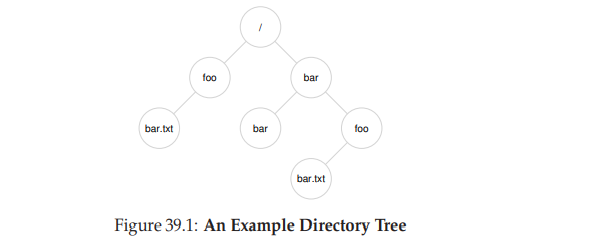

The directory hierarchy starts at a root directory (in UNIX-based systems, the root directory is simply referred to as /) and uses some kind
of separator to name subsequent sub-directories until the desired file or
directory is named.

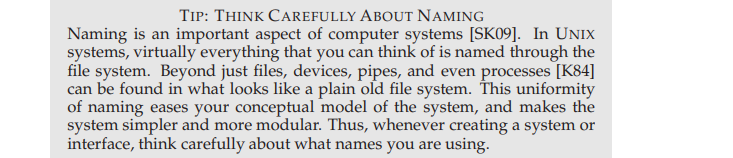

## 39.2 The File System Interface
mysterious call that is used to remove files, known as `unlink()`

## 39.3 Creating Files
This can be accomplished with the `open` system call; by calling `open()` and passing it the `O_CREAT` flag, a program can create a new file.

Here is some example code to create a file called “foo” in the current working directory.

    int fd = open("foo", O_CREAT | O_WRONLY | O_TRUNC);

The routine open() takes a number of different flags. In this example, the program 
- creates the file (O CREAT)
- can only write to that file while opened in this manner (O WRONLY)
- if the file already exists, first truncate it to a size of zero bytes thus removing any existing content (O TRUNC).

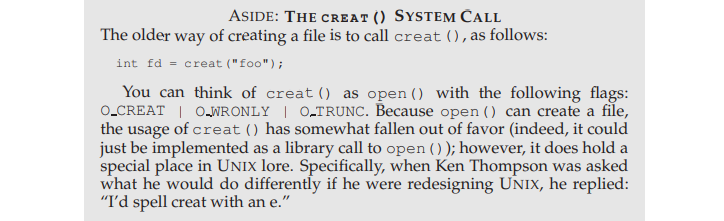

## 39.4 Reading and Writing Files
If we were typing at a command line, we might just use the program cat to dump the contents of the file to the screen.
    
    prompt> echo hello > foo
    prompt> cat foo
    hello
    prompt>

In this code snippet, we redirect the output of the program echo to the file `foo`, which then contains the word `“hello”` in it. We then use `cat` to see the contents of the file. But how does the `cat` program access the file `foo`?

To find this out, we’ll use an incredibly useful tool to **trace the system calls made by a program**. On Linux, the tool is called **strace**; other systems have similar tools (see **dtruss** on Mac OS X, or **truss** on some older UNIX variants).
- What strace does is trace every system call made by a program while it runs, and dump the trace to the screen for you to see.

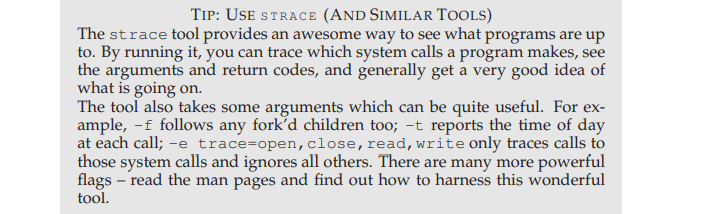

## 39.5 Reading And Writing, But Not Sequentially
Thus far, we’ve discussed how to read and write files, but all access has been sequential; that is, we have either read a file from the beginning to the end, or written a file out from beginning to end.

Sometimes, however, it is useful to be able to read or write to a specific offset within a file; for example, if you build an index over a text document, and use it to look up a specific word, you may end up reading from some random offsets within the document. 

To do so, we will use the `lseek()` system call. 

Here is the function prototype:

    off_t lseek(int fildes, off_t offset, int whence);

1. The first argument is familiar (a file descriptor).
2. The second argument is the offset, which positions the file offset to a particular location within the file.
3. The third argument, called whence for historical reasons, determines exactly how the seek is performed.

## 39.6 Writing Immediately with fsync()
Most times when a program calls `write()`, it is just telling the file system: please write this data to persistent storage, at some point in the future

The file system, for performance reasons, will buffer such writes in memory for some time (say 5 seconds, or 30); at that later point in time, the write(s) will actually be issued to the storage device

From the perspective of the calling application, writes seem to complete quickly, and only in rare cases (e.g., the machine crashes after the write() call but before the write to disk) will data be lost.

However, some applications require something more than this eventual guarantee. For example, in a database management system (DBMS), development of a correct recovery protocol requires the ability to force writes to disk from time to time

To support these types of applications, most file systems provide some additional control APIs. In the UNIX world, the interface provided to applications is known as fsync(int fd). When a process calls fsync() for a particular file descriptor, the file system responds by forcing all dirty (i.e., not yet written) data to disk, for the file referred to by the specified file descriptor. **The `fsync()` routine returns once all of these writes are complete**.

## 39.7 Renaming Files
Once we have a file, it is sometimes useful to be able to give a file a different name. When typing at the command line, this is accomplished with `mv` command; in this example, the file foo is renamed bar:

    prompt> mv foo bar

Using **strace**, we can see that mv uses the system call `rename(char *old, char *new)`, which takes precisely two arguments: the original name of the file (old) and the new name (new).

One interesting guarantee provided by the rename() call is that it is (usually) implemented as an atomic call with respect to system crashes; if the system crashes during the renaming, the file will either be named the old name or the new name, and no odd in-between state can arise.

## 39.8 Getting Information About Files
file system stores metadata wrt each file it is storing

stat() or fstat() - syscall to see the metadata

These calls take a pathname (or file descriptor) to a file and fill in a stat structure as seen here:

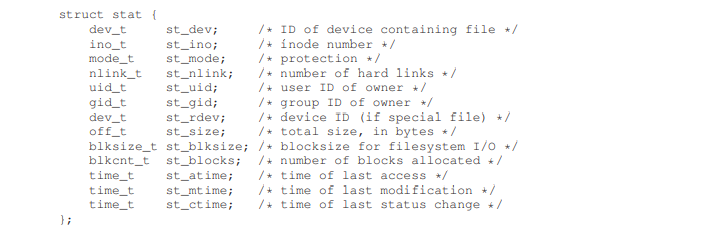

You can see that there is a lot of information kept about each file, including its size (in bytes), its low-level name (i.e., inode number), some
ownership information, and some information about when the file was
accessed or modified, among other things. 

To see this information, you can use the command line tool `stat`:

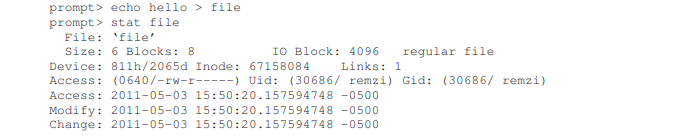

each file system usually keeps this type of information in a structure called an **inode** - For now, you should just think of an inode as a persistent data structure kept by the file system that has information like we see above inside of it

## 39.9 Removing Files
If you’ve used UNIX, you probably think you know: just run the program `rm`. But what system call does rm use to remove a file?

Let’s use our old friend strace again to find out. Here we remove that pesky file “foo”:
    
    prompt> strace rm foo
    ...
    unlink("foo") = 0
    ...

`unlink()` just takes the name of the file to be removed, and returns zero upon success.

why is this system call named “unlink”? Why not just “remove” or “delete”. 

To understand the answer to this puzzle, we must first understand more than just files, but also directories

## 39.10 Making Directories
Beyond files, a set of directory-related **system calls** enable you to **make, read, and delete directories**. 

Note you **can never write to a directory directly; because the format of the directory is considered file system metadata**, you can only update a directory indirectly by, for example, creating files, directories, or other object types within it. 

To create a directory, a single system call, `mkdir()`

Let’s take a look at what happens when we run the mkdir program to make a simple directory called foo:
    
    prompt> strace mkdir foo
    ...
    mkdir("foo", 0777) = 0
    ...
    prompt>

When such a directory is created, it is considered “empty”, although it does have a bare minimum of contents
- an empty directory has two entries: one entry that refers to itself, and one entry that refers to its parent.

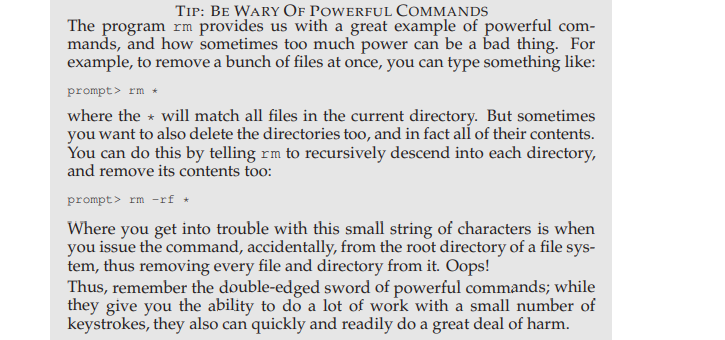

## 39.11 Reading Directories
what the program `ls` does

three calls, `opendir()`, `readdir()`, and `closedir()`

simple loop to read one directory entry at a time, and print out the name and inode number of each file in the directory.

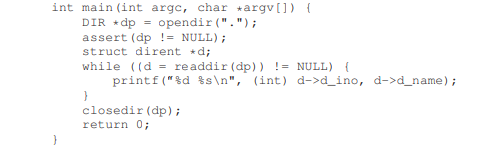

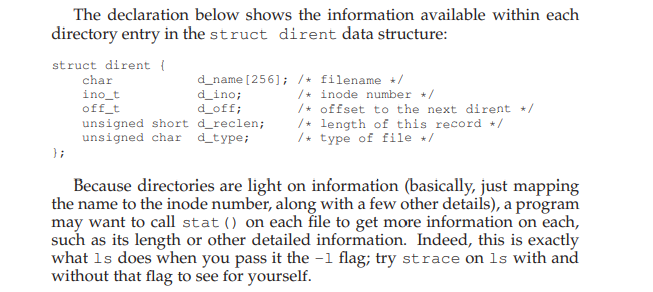

## 39.12 Deleting Directories
Finally, you can delete a directory with a call to `rmdir()` (which is used by the program of the same name, rmdir). 

Unlike file deletion, however, removing directories is more dangerous, as you could potentially delete a large amount of data with a single command.

Thus, rmdir() has the requirement that the directory be empty (i.e., only has “.” and “..”)

## 39.13 Hard Links
We now come back to the mystery of why removing a file is performed via unlink(), by understanding a new way to make an entry in the file system tree, through a system call known as link(). 

The link() system call takes two arguments, an old pathname and a new one; when you “link” a new file name to an old one, you essentially create another way to refer to the same file

    prompt> echo hello > file
    prompt> cat file
    hello
    prompt> ln file file2
    prompt> cat file2
    hello

- created a file with the word “hello” in it, and called the file `file`
- We then create a hard link to that file using the `ln` program.
- After this, we can examine the file by either opening `file` or `file2`.

The way link works is that it simply creates another name in the directory you are creating the link to, and **refers it to the same inode number
(i.e., low-level name) of the original file**

The file is not copied in any way; rather, you now just have two human names (file and file2) that both refer to the same file.

We can even see this in the directory itself, by printing out the inode number of each file:
    
    prompt> ls -i file file2
    67158084 file
    67158084 file2
    prompt>

By passing the `-i` flag to `ls`, it prints out the inode number of each file (as well as the file name).

And thus you can see what link really has done: just make a new reference to the same exact inode number (67158084 in this example).

By now you might be starting to see why unlink() is called unlink().
- When you create a file, you are really doing two things. First, you are making a structure (the inode) that will track virtually all relevant information about the file, including its size, where its blocks are on disk, and so forth.
- Second, you are linking a human-readable name to that file, and putting that link into a directory.

After creating a hard link to a file, to the file system, there is no difference between the original file name (file) and the newly created file
name (file2); indeed, they are both just links to the underlying metadata about the file, which is found in inode number 67158084.

Thus, to remove a file from the file system, we call unlink(). In the example above, we could for example remove the file named file, and still access the file without difficulty:
    
    prompt> rm file
    removed ‘file’
    prompt> cat file2
    hello

only when the reference count reaches zero does the file system also free the inode and related data blocks, and thus truly “delete” the file

## 39.14 Symbolic Links
There is one other type of link that is really useful, and it is called a **symbolic link** or sometimes a **soft link**

As it turns out, hard links are somewhat limited: 
- you can’t create one to a directory (for fear that you will create a cycle in the directory tree)
- you can’t hard link to files in other disk partitions (because inode numbers are only unique within a particular file system, not across file systems)

Thus, a new type of link called the symbolic link was created.

To create such a link, you can use the same program `ln`, but with the `-s` flag. Here is an example:
    
    prompt> echo hello > file
    prompt> ln -s file file2
    prompt> cat file2
    hello

As you can see, creating a soft link looks much the same, and the original file can now be accessed through the file name file as well as the
symbolic link name file2.

However, beyond this surface similarity, symbolic links are actually quite different from hard links. The first difference is that a symbolic link is actually a file itself, of a different type. We’ve already talked about regular files and directories; symbolic links are a third type the file system knows about. 

A stat on the symlink reveals all:
    
    prompt> stat file
     ... regular file ...
    prompt> stat file2
     ... symbolic link ...

Running ls also reveals this fact. If you look closely at the first character of the long-form of the output from ls, you can see that the first
character in the left-most column is a - for regular files, a d for directories, and an l for soft links.

You can also see the size of the symbolic link (4 bytes in this case), as well as what the link points to (the file named file).
    
    prompt> ls -al
    drwxr-x--- 2 remzi remzi 29 May 3 19:10 ./
    drwxr-x--- 27 remzi remzi 4096 May 3 15:14 ../
    -rw-r----- 1 remzi remzi 6 May 3 19:10 file
    lrwxrwxrwx 1 remzi remzi 4 May 3 19:10 file2 -> file

because of the way symbolic links are created, they leave the possibility for what is known as a dangling reference:
    
    prompt> echo hello > file
    prompt> ln -s file file2
    prompt> cat file2
    hello
    prompt> rm file
    prompt> cat file2
    cat: file2: No such file or directory

As you can see in this example, quite unlike hard links, removing the original file named file causes the link to point to a pathname that no longer exists.

## 39.15 Making and Mounting a File System
To make a file system, most file systems provide a tool, usually referred to as `mkfs` (pronounced “make fs”), that performs exactly this task

IDEA: give the tool, as input, a device (such as a disk partition, e.g., /dev/sda1) a file system type (e.g., ext3), and it simply writes an empty file system, starting with a root directory, onto that disk partition. And `mkfs` said, let there be a file system

However, once such a file system is created, it needs to be made accessible within the uniform file-system tree. This task is achieved via the `mount` program (which makes the underlying system call `mount()` to do the real work).
- What mount does, quite simply is take an existing directory as a target mount point and essentially paste a new file system onto the directory tree at that point.

**Eg:**
Imagine we have an unmounted ext3 file system, stored in device partition `/dev/sda1`, that has the following contents: a root directory which contains two sub-directories, a and b, each of which in turn holds a single file named foo. Let’s say we wish to mount this file system at the mount point `/home/users`. 

We would type something like this: 

    prompt> mount -t ext3 /dev/sda1 /home/users

the beauty of mount: instead of having a number of separate file systems, mount unifies all file systems into one tree, making naming uniform and convenient.

## 39.16 Summary
The file system interface in UNIX systems (and indeed, in any system) is seemingly quite rudimentary, but there is a lot to understand if you wish to master it. Nothing is better, of course, than simply using it (a lot).

Read more: Stevens [SR05] - Advanced Programming in the UNIX Environment

# 40 - File System Implementation

In this chapter, we introduce a simple file system implementation, known as **vsfs (the Very Simple File System)**

This file system is a simplified version of a typical UNIX file system and thus serves to introduce some of the basic on-disk structures, access methods, and various policies that you will find in many file systems today

The file system is pure software; unlike our development of CPU and memory virtualization, we will not be adding hardware features to make some aspect of the file system work better

Because of the great flexibility we have in building a file system have a range with different data structures and do some things better or worse
than their peers

**THE CRUX: HOW TO IMPLEMENT A SIMPLE FILE SYSTEM How can we build a simple file system? What structures are needed on the disk? What do they need to track? How are they accessed?**

---
**ASIDE: What is a File System?**
- A file system is a method and data structure used by an operating system (OS) to manage and organize data on storage devices (e.g., hard drives, SSDs, USB sticks).
- It determines how data is stored, retrieved, and managed.
- Examples of file systems include NTFS, ext4, FAT32, and VSFS (Very Simple File System, often used for educational purposes).

**Key aspects of a file system include:**
- **Data Organization:** Divides the storage into smaller units, like files and directories, for easier management.
- **Addressing:** Tracks where files are located on the physical disk.
- **Metadata:** Maintains information about files (e.g., size, permissions, timestamps).
- **Access Control:** Implements permissions and user access.
---

## 40.1 The Way To Think
To think about file systems, we usually suggest thinking about **two different aspects** of them; if you understand both of these aspects, you probably understand how the file system basically works.
1. The first is the **data structures of the file system**. In other words, what types of on-disk structures are utilized by the file system to organize its data and metadata?
- The first file systems we’ll see (including vsfs below) employ simple structures, like arrays of blocks or other objects, whereas more sophisticated file systems, like SGI’s XFS, use more complicated tree-based structures

2. its **access methods**
- How does it map the calls made by a process, such as open(), read(), write(), etc., onto its structures?
- Which structures are read during the execution of a particular system call? Which are written? How efficiently are all of these steps performed?

If you understand the data structures and access methods of a file system, you have developed a good mental model of how it truly works, a
key part of the systems mindset

## 40.2 Overall Organization
We now develop the overall on-disk organization of the data structures of the vsfs file system. 

The first thing we’ll need to do is divide the disk into blocks; simple file systems use just one block size (EG: 4 KB)

Thus, our view of the disk partition where we’re building our file system is simple: a series of blocks, each of size 4 KB. The blocks are addressed from 0 to N − 1, in a partition of size N 4-KB blocks. Assume we have a really small disk, with just 64 blocks:

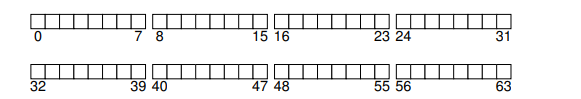

what we need to store in these blocks to build a file system. 
- user data. 
- most of the space in any file system is (and should be) user data.

Let’s call the region of the disk we use for user data the **data region**, and, for simplicity, reserve a fixed portion of the disk for these blocks,
say the last 56 of 64 blocks on the disk:

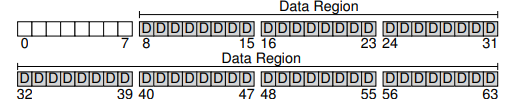

The file system has to track information about each file. This information is a key piece of metadata, and tracks things like which data blocks (in the data region) comprise a file, the size of the file, its owner and access rights, access and modify times, and other similar kinds of information.
- To store this information, file system usually have a structure called an **inode**
- To accommodate inodes, we’ll need to reserve some space on the disk for them as well
- Let’s call this portion of the disk the **inode table**, which simply holds an array of on-disk inodes

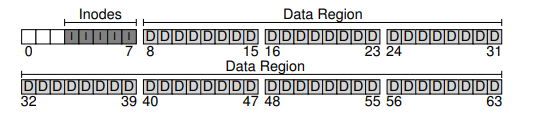

One primary component that is still needed, as you might have guessed, is some way to track whether inodes or data blocks are free or allocated. Such **allocation structures** are thus a requisite element in any file system

Many allocation-tracking methods are possible, of course. For example, we could use
- **free list** that points to the first free block, which then points to the next free block, and so forth.
- We instead choose a simple and popular structure known as a **bitmap**, one for the data region (the **data bitmap**), and one for the inode table (the **inode bitmap**).

A bitmap is a simple structure: each bit is used to indicate whether the corresponding object/block is free (0) or in-use (1). And thus our new on-disk layout, with an inode bitmap (i) and a data bitmap (d):

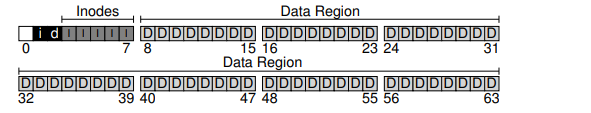

- You may notice that it is a bit of overkill to use an entire 4-KB block for these bitmaps; such a bitmap can track whether 32K objects are allocated, and yet we only have 80 inodes and 56 data blocks. However, we just use an entire 4-KB block for each of these bitmaps for simplicity.

We reserve this for the **superblock**, denoted by an **S** in the diagram below. 
- The superblock contains information about this particular file system, including, for example, how many inodes and data blocks are in the file system (80 and 56, respectively in this instance), where the inode table begins (block 3), and so forth.
- It will likely also include a **magic number** of some kind to identify the file system type (in this case, vsfs).
    - Magic numbers are the first bits of a file which uniquely identify the type of file.
        - This makes programming easier because complicated file structures need not be searched in order to identify the file type. For example, a jpeg file starts with ffd8 ffe0 0010 4a46 4946 0001 0101 0047 ...
     
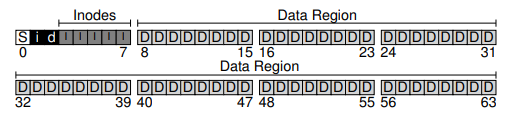

Thus, when mounting a file system, the operating system will read
the superblock first, to initialize various parameters, and then attach the
volume to the file-system tree. When files within the volume are accessed,
the system will thus know exactly where to look for the needed on-disk
structures.



## 40.3 File Organization: The Inode
One of the most important on-disk structures of a file system is the **inode**; virtually all file systems have a structure similar to this

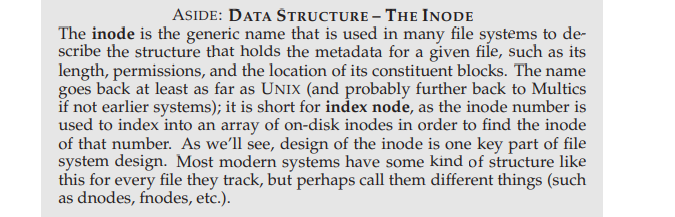

Each inode is implicitly referred to by a number (called the inumber), which we’ve earlier called the low-level name of the file.

Inside each inode is virtually all of the information you need about a file: its type (e.g., regular file, directory, etc.), its size, the number of blocks, etc. We refer to all such information about a file as metadata; in fact, any information inside the file system that isn’t pure user data is often referred to as such.

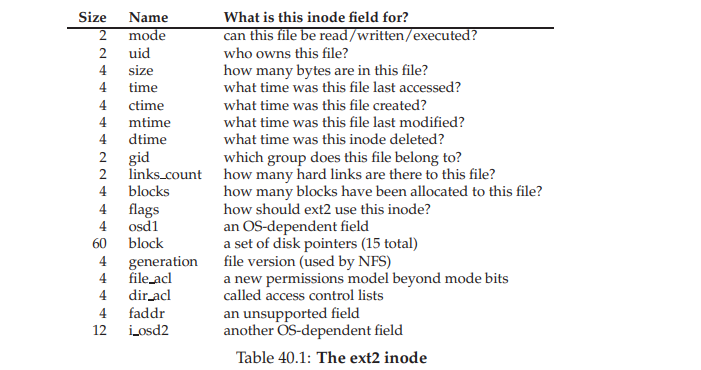

One of the most important decisions in the design of the inode is how it refers to where data blocks are. One simple approach would be to have one or more direct pointers (disk addresses) inside the inode; each pointer refers to one disk block that belongs to the file. Such an approach is limited: for example, if you want to have a file that is really big (e.g., bigger than the size of a block multiplied by the number of direct pointers), you are out of luck.

#### The Multi-Level Index
**indirect pointer** - points to a block that contains more pointers, each of which point to user data.
- inode may have some fixed number of direct pointers (e.g., 12), and a single indirect pointer. 
- If a file grows large enough, an indirect block is allocated (from the data-block region of the disk), and the inode’s slot for an indirect pointer is set to point to it.

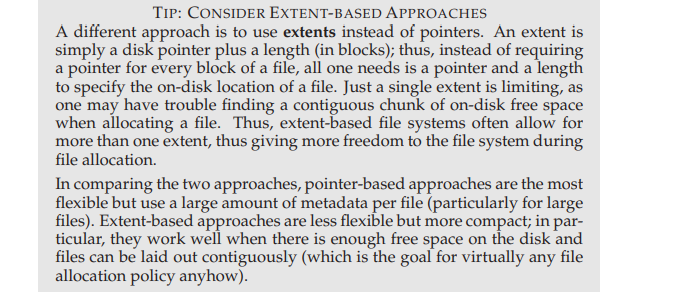

more data: **double indirect pointer**. This pointer refers to a block that contains pointers to indirect blocks, each of which contain pointers to data blocks.
- adds the possibility to grow files with an additional 1024 · 1024 or 1-million 4KB blocks, in other words supporting files that are over 4GB in size.

even more data: the **triple indirect pointer**. 

Overall, this imbalanced tree is referred to as the multi-level index approach to pointing to file blocks.

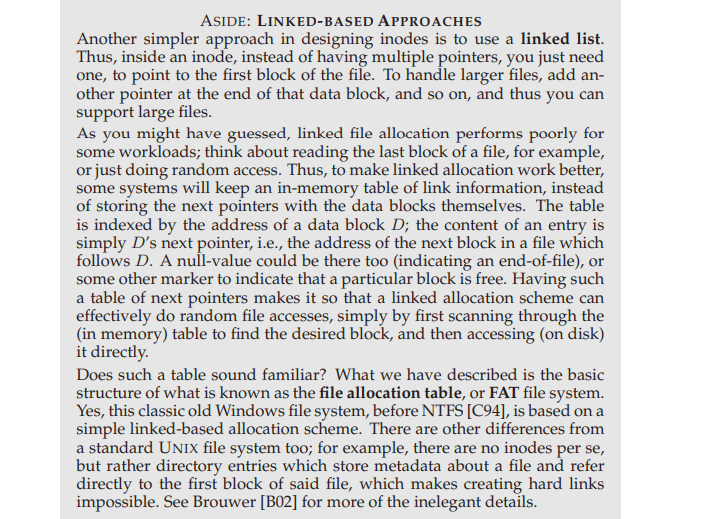



## 40.4 Directory Organization
In vsfs (as in many file systems), directories have a simple organization; a directory basically just contains a list of (entry name, inode number) pairs. For each file or directory in a given directory, there is a string and a number in the data block(s) of the directory.

You might be wondering where exactly directories are stored. Often,
file systems treat directories as a special type of file. Thus, a directory has
an inode, somewhere in the inode table (with the type field of the inode
marked as “directory” instead of “regular file”).

## 40.5 Free Space Management
A file system must track which inodes and data blocks are free, and which are not, so that when a new file or directory is allocated, it can find space for it. Thus free space management is important for all file systems.

In vsfs, we have two simple bitmaps for this task.

For example, when we create a file, we will have to allocate an inode
for that file. The file system will thus search through the bitmap for an inode that is free, and allocate it to the file; the file system will have to mark
the inode as used (with a 1) and eventually update the on-disk bitmap
with the correct information. A similar set of activities take place when a
data block is allocated.

## 40.6 Access Paths: Reading and Writing
Understanding what happens on this access path is thus the second key in developing an understanding of how a file system works

#### Reading A File From Disk
1. **Opening a File**: 
   - Example: To open `/foo/bar`, the file system starts by traversing the pathname to locate the inode of the file.
   - The process begins at the root inode (usually inode number 2), reading its data to find pointers to directories or files in the path.
   - Each directory's inode and data are read recursively until the target inode (`bar`) is found.

2. **Reading Data**:
   - Once the file is open, a `read()` system call reads the required file block using the inode’s pointers.
   - Metadata such as the last-accessed time may also be updated.

3. **Closing the File**:
   - The file descriptor is deallocated, but no disk I/O occurs during this step.

4. **Key Observations**:
   - **I/O Cost**: The number of I/O operations depends on the pathname length and the size of directories.
   - **Allocation Structures**: Structures like bitmaps are **not accessed** during reads.

#### Writing a File to Disk
1. **Opening a File**:
   - Similar to reading, opening a file for writing involves traversing the pathname to locate the target inode.

2. **Writing Data**:
   - If writing to an existing block, the data is simply written to disk.
   - If allocating a new block, the file system:
     - Reads and updates the data bitmap to mark the block as allocated.
     - Writes the data to the allocated block.
   - Each write generates multiple I/O operations: updating bitmaps, the inode, and writing the data block.

3. **File Creation**:
   - Creating a new file involves:
     - Allocating a new inode (read/write to inode bitmap).
     - Updating the parent directory to link the file name to the inode.
     - Potentially growing the directory, requiring additional I/Os.

#### Example Timelines
1. **File Read Timeline**:
   - Opening `/foo/bar`: Multiple I/Os to traverse the pathname and find the inode.
   - Reading the file: Uses inode pointers to access the data block, updating metadata as needed.

2. **File Creation Timeline**:
   - Creating `/foo/bar` and writing 3 blocks: Each write involves updates to the inode, data bitmap, and writing the data itself. Total I/Os are significant.

#### Challenges and Optimizations
- **High I/O Cost**: Operations like opening, reading, writing, and creating files incur numerous scattered I/Os across the disk.
- **Improving Efficiency**: File systems employ techniques like caching, journaling, and delayed writes to reduce the I/O overhead.


**THE CRUX: HOW TO REDUCE FILE SYSTEM I/O COSTS - Even the simplest of operations like opening, reading, or writing a file incurs a huge number of I/O operations, scattered over the disk. What can a file system do to reduce the high costs of doing so many I/Os?**

## 40.7 Caching and Buffering
As the examples above show, reading and writing files can be expensive, incurring many I/Os to the (slow) disk. 

To remedy what would clearly be a huge performance problem, most file systems aggressively use system memory (DRAM) to cache important blocks.

Imagine the open example above: without caching, every file open would require at least two reads for every level in the directory hierarchy (one to read the inode of the directory in question, and at least one to read its data).

With a long pathname (e.g., /1/2/3/ ... /100/file.txt), the file system would literally perform hundreds of reads just to open the file! Early file systems thus introduced a **fix-sized cache** to hold popular blocks

Now imagine the file open example with caching. The first open may generate a lot of I/O traffic to read in directory inode and data, but subsequent file opens of that same file (or files in the same directory) will mostly hit in the cache and thus no I/O is needed.

Let us also consider the effect of caching on writes. Whereas read I/O can be avoided altogether with a sufficiently large cache, write traffic has to go to disk in order to become persistent. Thus, a cache does not serve as the same kind of filter on write traffic that it does for reads. That said, **write buffering** (as it is sometimes called) certainly has a number of performance benefits. 
1. by delaying writes, the file system can batch some updates into a smaller set of I/Os; for example, if an inode bitmap is updated when one file is created and then updated moments later as another file is created, the file system saves an I/O by delaying the write after the first update.
2. by buffering a number of writes in memory, the system can then schedule the subsequent I/Os and thus increase performance
3. some writes are avoided altogether by delaying them

For the reasons above, most modern file systems buffer writes in memory for anywhere between five and thirty seconds, representing yet another trade off: if the system crashes before the updates have been propagated to disk, the updates are lost; however, by keeping writes in memory longer, performance can be improved by batching, scheduling, and even avoiding writes

Some applications (such as databases) don’t enjoy this trade-off. Thus,
to avoid unexpected data loss due to write buffering, they simply force
writes to disk, by calling fsync(), by using direct I/O interfaces that would work around the cache or by using the raw disk interface and avoiding
the file system altogether

## 40.8 Summary

File systems require several components and policies to function effectively:

##### Core Components
1. **Metadata (Inodes)**:
   - Store file information like permissions and block pointers.
2. **Directories**:
   - Special files that map filenames to inode numbers.
3. **Allocation Structures**:
   - Mechanisms like bitmaps to track free or used inodes and data blocks.

##### Design Flexibility
- File system design allows optimization based on specific goals
- Policy decisions, such as where to place new files on disk, play a crucial role and are addressed in later discussions.

This flexibility enables file systems to balance performance, reliability, and usability according to application needs.

# 41 - Locality and The Fast File System
When the UNIX operating system was first introduced, the UNIX wizard himself Ken Thompson wrote the first file system. We will call that the “old UNIX file system”, and it was really simple. Basically, its data structures looked like this on the disk:

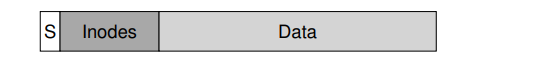

- The super block (S) contained information about the entire file system: how big the volume is, how many inodes there are, a pointer to the head of a free list of blocks, and so forth.
- The inode region of the disk contained all the inodes for the file system.
- most of the disk was taken up by data blocks.

## 41.1 The Problem: Poor Performance

### Overview
Performance in early UNIX file systems was abysmal, delivering only **2% of disk bandwidth** as measured by Kirk McKusick and colleagues at Berkeley. Performance issues worsened over time due to poor handling of disk data.

### Key Problems
1. **Disk-Agnostic Design**:
   - The file system treated the disk as random-access memory, disregarding the high positioning costs of disk operations.
   - **Inode and Data Block Separation**: File data blocks were often located far from their inodes, leading to expensive seek operations for common tasks like reading a file.

2. **Fragmentation**:
   - Free space was poorly managed, resulting in scattered free blocks across the disk.
   - Allocation of new files led to fragmentation, where logically contiguous files were physically dispersed, degrading sequential read performance.

3. **Small Block Size**:
   - Original block size was **512 bytes**, which:
     - Reduced internal fragmentation.
     - Made data transfer inefficient due to frequent positioning overhead.

### The Problem in Summary
- The system failed to account for the physical characteristics of the disk, resulting in significant performance bottlenecks.


**THE CRUX:
HOW TO ORGANIZE ON-DISK DATA TO IMPROVE PERFORMANCE - How can we organize file system data structures so as to improve performance? What types of allocation policies do we need on top of those data structures? How do we make the file system “disk aware”?**

## Fast File System (FFS): Disk Awareness and Locality

### 41.2 FFS: Disk Awareness is the Solution
- The **Fast File System (FFS)** was developed at Berkeley to address poor performance in earlier UNIX file systems by making the file system structures and allocation policies "disk aware."
- Key idea: Keep the same APIs (e.g., `open()`, `read()`, `write()`, `close()`) for compatibility but optimize internal implementations for performance.
- This innovation paved the way for modern file system designs, balancing compatibility with performance, reliability, and other improvements.

### 41.3 Organizing Structure: The Cylinder Group
- FFS organizes disks into **cylinder groups** (similar to block groups in ext2/ext3 file systems).
  - Example: A disk might have groups labeled `G0, G1, G2, ...`.
- Cylinder groups improve performance by minimizing long seeks between files and related data. 

#### Components of a Cylinder Group:
1. **Super Block (S)**:
   - Copies are stored in each group for reliability, enabling recovery if one is corrupted.
2. **Inode Bitmap (ib) and Data Bitmap (db)**:
   - Track free inodes and data blocks.
   - Efficiently manage free space and reduce fragmentation.
3. **Inode and Data Block Regions**:
   - Store file metadata (inodes) and actual file data.

#### Example of File Creation in FFS:
- Steps to create a 4KB file `/foo/bar.txt`:
  - Allocate a new inode (update inode bitmap and write inode to disk).
  - Allocate a data block for the file (update data bitmap and write block to disk).
  - Update the parent directory (`foo`), including:
    - Adding an entry for `bar.txt` to the directory.
    - Adjusting the directory’s inode (length, modification time).
  - Requires at least four writes, often buffered for efficiency.

### 41.4 Policies: Allocating Files and Directories
- **Basic Mantra**: 
  - Keep related items close together.
  - Keep unrelated items far apart.

#### Allocation Heuristics:
1. **Directories**:
   - Allocate in cylinder groups with few directories and many free inodes to balance load and ensure space for future files.
2. **Files**:
   - Allocate file data blocks in the same group as their inode to minimize seeks.
   - Group files in the same directory together in the same cylinder group, ensuring efficient access patterns.

### 41.5 Measuring File Locality
- **Namespace Locality**: Analyzing how "close" file accesses are in the directory tree.
  - Distance metric: Number of directory levels between two accessed files (e.g., same file = 0, same directory = 1, common parent = 2).

#### Key Findings (Using SEER Traces):
- ~40% of file accesses were to files in the same directory or the same file.
- ~25% had a distance of two (e.g., structured projects with related directories like `src` and `obj`).
- FFS policies effectively handle close relationships but miss optimizations for multi-level directory structures.

#### Comparison with Random Access:
- Random access traces show less locality, highlighting the advantage of FFS's heuristics in real-world usage patterns.

### Summary of FFS Improvements:
1. Disk-awareness through cylinder groups reduces seek times and fragmentation.
2. Bitmap-based free space management improves allocation efficiency.
3. Simple heuristics improve file and directory placement, leveraging common access patterns to enhance performance.
4. Namespace locality analysis validates FFS assumptions, showing practical benefits in real-world scenarios.

## 41.6 The Large-File Exception

In FFS (Fast File System), a key exception exists for large files. Normally, files are placed in a block group. 
- However, placing a large file entirely within one block group can cause locality issues, as it prevents related files from being placed nearby. 
- To solve this, FFS places large files across multiple block groups after a certain number of blocks (e.g., 12 blocks, or the number of direct pointers in an inode).
- This helps maintain file-access locality but may decrease performance for sequential file access due to disk head movements.

Amortization helps mitigate performance issues by ensuring that large enough chunks are read to minimize seek times between transfers. 
- For example, with a transfer rate of 40 MB/s and an average seek time of 10 ms, the chunk size needs to be around 409.6 KB to balance seeking and transferring data.
- Larger chunks are needed for higher bandwidth targets (e.g., 3.69 MB for 90% bandwidth).

FFS didn't explicitly calculate chunk sizes but used a simple approach where the first 12 blocks were placed in the same block group, with subsequent blocks spread across different groups, ensuring that large files don't occupy one group entirely.

## 41.7 Other Features of FFS

FFS also introduced solutions to other challenges, such as the problem of internal fragmentation for small files. 
- Instead of wasting entire 4-KB blocks for small files, FFS used 512-byte sub-blocks.
- This allowed more efficient use of space for small files, though it required extra work for file copying when transitioning from sub-blocks to full 4-KB blocks.

Additionally, FFS optimized disk layout to improve performance. 
- Traditional layout placed blocks consecutively, leading to inefficiencies in sequential reads.
- FFS avoided this by skipping blocks to allow the disk head to request the next block before it rotated out of position.
- This staggered layout improved performance but was limited by the fact that only 50% of peak bandwidth could be achieved.
- Modern disks handle this better through internal caching.

FFS also introduced usability improvements like support for long file names, symbolic links (more flexible than hard links), and an atomic `rename()` operation. These features improved the user experience and contributed to FFS's adoption.

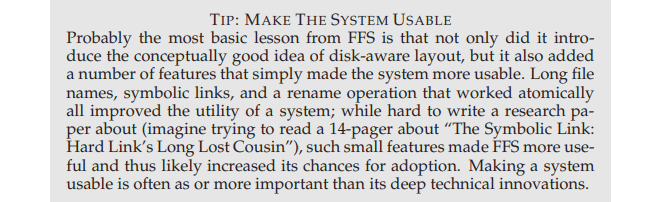

## 41.8 Summary

FFS revolutionized file systems by focusing on disk-aware layout and improving usability. 

Its influence is seen in modern file systems like Linux ext2 and ext3. 

FFS’s approach to treating disks efficiently and introducing practical usability features helped make it a widely adopted file system.

# 42 - Crash Consistency: FSCK and Journaling
As we’ve seen thus far, the file system manages a set of data structures to implement the expected abstractions: files, directories, and all of the other metadata needed to support the basic abstraction that we expect from a file system

Unlike most data structures (for example, those found in memory of a running program), file system data structures must persist over the long haul, stored on devices that retain data despite power loss (hard disks or flash-based SSDs, etc)

One major challenge faced by a file system is how to update persistent data structures despite the presence of a power loss or system crash

Because of power losses and crashes, updating a persistent data structure can be quite tricky, and leads to a new and interesting problem in file system implementation, known as the **crash-consistency problem**

This problem is quite simple to understand. 
- Imagine you have to update two on-disk structures, A and B, in order to complete a particular operation.
- Because the disk only services a single request at a time, one of these requests will reach the disk first (either A or B).
- If the system crashes or loses power after one write completes, the on-disk structure will be left in an inconsistent state. And thus, we have a problem that all file systems need to solve

**THE CRUX: HOW TO UPDATE THE DISK DESPITE CRASHES - The system may crash or lose power between any two writes, and thus the on-disk state may only partially get updated. After the crash, the system boots and wishes to mount the file system again (in order to access files and such). Given that crashes can occur at arbitrary points in time, how do we ensure the file system keeps the on-disk image in a reasonable state?**

- We’ll begin by examining the approach taken by older file systems, known as **fsck** or the **file system checker**. 
- We’ll then turn our attention to another approach, known as journaling (also known as write-ahead logging), a technique which adds a little bit of overhead to each write but recovers more quickly from crashes or power losses.

## 42.1 A Detailed Example
In this example, we explore journaling through a workload that appends a single data block to an existing file. The append is performed by opening the file, seeking to the end, and issuing a 4KB write. We assume a simple file system structure consisting of an inode bitmap, data bitmap, inodes, and data blocks.

#### File System Layout
- **Inode Bitmap**: 8 bits, one per inode.
- **Data Bitmap**: 8 bits, one per data block.
- **Inodes**: 8 inodes, numbered 0 to 7.
- **Data Blocks**: 8 blocks, numbered 0 to 7.

#### Initial State
- Inode 2 is allocated, marked in the inode bitmap.
- Data block 4 is allocated, marked in the data bitmap.
- Inode I[v1] has:
  - Size: 1 (indicating 1 block allocated).
  - Pointer to block 4.
  
#### Update Process
To append data, three structures are updated:
1. **Inode (I[v2])**: The size increases to 2, and a pointer to the new block (5) is added.
2. **Data Bitmap (B[v2])**: Updated to indicate block 5 is allocated.
3. **Data Block (Db)**: Filled with user data.

The file system must perform three writes to disk:
- Inode (I[v2])
- Data Bitmap (B[v2])
- Data Block (Db)

#### Crash Scenarios
There are several possible outcomes if a crash occurs after a write:
1. **Only the Data Block (Db) is written**: Data is on disk, but there’s no inode or bitmap entry for it, making it as if the write never occurred.
2. **Only the Updated Inode (I[v2]) is written**: The inode points to block 5, but it hasn’t been written, leading to garbage data and inconsistency with the bitmap.
3. **Only the Updated Bitmap (B[v2]) is written**: The bitmap marks block 5 as allocated, but no inode points to it, leading to a space leak.

Other scenarios where two writes succeed and the last fails lead to similar inconsistencies:
- **Inode and Bitmap written, but not the Data Block**: The metadata is consistent, but the data is missing.
- **Inode and Data Block written, but not the Bitmap**: The inode points to the correct data, but the bitmap is inconsistent.
- **Bitmap and Data Block written, but not the Inode**: The file has data, but no inode points to it.

#### The Crash Consistency Problem
These crash scenarios highlight the challenges of ensuring consistency after crashes. The file system may end up in an inconsistent state, have space leaks, return garbage data, or even lose data. Ideally, we want to transition from one consistent state to another atomically, but the disk only commits one write at a time, making this difficult. This is known as the **crash-consistency problem**

### 42.2 Solution #1: The File System Checker (fsck)

Early file systems used a simple approach to crash consistency, allowing inconsistencies to occur and fixing them later upon rebooting. 

One tool for this is `fsck`, a UNIX utility for finding and repairing inconsistencies in the file system. 

While it resolves some issues, it cannot fix all problems, such as when a file system appears consistent but points to corrupt data. 

The main goal of `fsck` is to ensure the file system metadata is internally consistent.

##### `fsck` Phases:
1. **Superblock**: Checks if the superblock is reasonable (e.g., ensures the file system size is larger than the number of blocks allocated). If corrupt, an alternate superblock may be used.
2. **Free Blocks**: Scans the inodes, indirect blocks, etc., to determine the blocks in use. The allocation bitmaps are corrected if inconsistencies are found.
3. **Inode State**: Verifies each inode for corruption, checking that each allocated inode has a valid type field. Corrupt inodes are cleared and the inode bitmap is updated.
4. **Inode Links**: Ensures the link count for each inode is accurate by scanning the directory tree. If mismatches are found, the inode's link count is fixed, or the inode is moved to the `lost+found` directory.
5. **Duplicates**: Checks for duplicate pointers, where two inodes refer to the same block. Problematic inodes are cleared or corrected by copying the block.
6. **Bad Blocks**: Removes bad block pointers if they refer to invalid addresses outside the partition's size.
7. **Directory Checks**: Verifies directory integrity, ensuring proper formatting (e.g., `.` and `..` are the first entries), that referred inodes are allocated, and no directory appears more than once.

##### Challenges:
- `fsck` requires intricate knowledge of the file system and can be slow, especially on large disks or RAID setups. The process of scanning the entire disk to fix issues can take minutes or hours, which becomes prohibitive as disk capacity increases. This inefficiency has led to the exploration of alternative solutions.

#### Criticism:
- The basic premise of `fsck` is inefficient. For example, scanning an entire disk to recover from changes made to just a few blocks is akin to searching an entire house for keys dropped in a bedroom - it's effective but wasteful.

## 42.3 Solution #2: Journaling (or Write-Ahead Logging)

#### Overview
Journaling, also known as write-ahead logging, is a method borrowed from database management systems to address consistency during updates. 

It is widely used in modern file systems like Linux ext3, ext4, ReiserFS, IBM JFS, XFS, and NTFS. 

The approach ensures that if a crash occurs during an update, recovery is more efficient.

#### Concept
1. **Write-Ahead Logging**: Before updating any structures on disk, a "note" (log entry) is written to a designated location (journal).
2. **Crash Recovery**: If a crash happens, the log provides information about what needs to be fixed, avoiding the need to scan the entire disk.
3. **File Systems with Journaling**: Ext3 is an example of a journaling file system, where the journal is used to record updates before the actual data is written to the disk.

#### Data Journaling in Linux ext3
In data journaling, the file system first writes metadata and data to the journal before updating the actual disk locations:
1. **Transaction Begin (TxB)**: Describes the update and includes a transaction identifier (TID).
2. **Data Blocks (I[v2], B[v2], Db)**: Actual data and metadata to be written.
3. **Transaction End (TxE)**: Marks the end of the transaction.

- Once the journal writes are complete, the data is then checkpointed (written to its final disk location). 
- If a crash occurs, the transaction in the journal can be replayed to recover the system.

#### Crash Scenario
If a crash happens during journal writes, issues can occur if the transaction isn't written atomically. For instance:
- The transaction might appear valid (with TxB and TxE), but if the data block (Db) is lost, it can corrupt the file system or user data.
  
#### Write Ordering
Write ordering ensures that disk writes happen in the correct sequence. This is important to avoid data corruption due to write caching in disks. Modern file systems handle this with write barriers, though some disks may ignore them for performance reasons.

#### Optimizing Log Writes
One way to optimize performance is by including a checksum in both the transaction begin and end blocks. This ensures that if a crash occurs, the file system can verify the integrity of the journal and discard incomplete transactions. This improvement was incorporated into Linux ext4, enhancing both performance and reliability.

#### Writing Process (Updated Protocol)
1. **Journal Write**: Write the transaction to the log.
2. **Journal Commit**: Write the transaction commit block (TxE) to the journal.
3. **Checkpoint**: Write the actual data and metadata to the final locations on disk.

This method ensures both atomicity and consistency during updates, reducing recovery time after a crash.

## 42.4 Solution #3: Other Approaches to File System Consistency

#### Soft Updates
- carefully order all writes to prevent inconsistent file system states.
- Example: Writing the data block before the inode that points to it ensures the inode never points to garbage.
- More complex than journaling as it requires detailed knowledge of file system structures.

#### Copy-on-Write (COW)
- Used in file systems like ZFS.
- Instead of overwriting data, new updates are written to unused locations on disk.
- After multiple updates, the root structure is flipped to point to the new data, maintaining consistency.
- A foundational technique in log-structured file systems (LFS).

#### Backpointer-Based Consistency (BBC)
- Introduced at Wisconsin, BBC adds a back pointer to each block (e.g., each data block points to the inode).
- Consistency is checked by verifying if the forward pointer refers back to the block.
- No strict write ordering is required, enabling lazy crash consistency.

#### Optimistic Crash Consistency
- Aims to minimize waiting for disk writes by issuing as many writes as possible.
- Uses transaction checksums and other techniques to detect inconsistencies if they arise.
- Improves performance, but requires a specialized disk interface.

## 42.5 Summary
- Crash consistency ensures file system integrity after a crash, with various methods for achieving it.
- The traditional file system checker (fsck) is slow on modern systems, prompting the use of journaling for faster recovery.
- Journaling reduces recovery time from O(size-of-disk) to O(size-of-log), with ordered metadata journaling offering a balance between performance and consistency.


# 43 - Log-structured File Systems
In the early 90’s, a group at Berkeley led by Professor John Ousterhout and graduate student Mendel Rosenblum developed a new file system known as the log-structured file system. 

Their motivation to do so was based on the following observations:
- Memory sizes were growing
    -  As memory got bigger, more data could be cached in memory. As more data is cached, disk traffic would increasingly consist of writes, as reads would be serviced in the cache.
    -  Thus, file system performance would largely be determined by its performance for writes.
- large and growing gap between random I/O performance and sequential I/O performance:
    - Transfer bandwidth increases roughly 50%-100% every year; seek and rotational delay costs decrease much more slowly, maybe at 5%-10% per year.
    - Thus, if one is able to use disks in a sequential manner, one gets a huge performance advantage, which grows over time.
- Existing file systems perform poorly on many common workloads
    - although FFS would place all of these blocks within the same block group, FFS would incur many short seeks and subsequent rotational delays and thus performance would fall far short of peak sequential bandwidth.
- File systems were not RAID-aware:
    - For example, RAID-4 and RAID5 have the small-write problem where a logical write to a single block causes 4 physical I/Os to take place.
    - Existing file systems do not try to avoid this worst-case RAID writing behavior
 
**An ideal file system would thus focus on write performance, and try to make use of the sequential bandwidth of the disk**. Further, it would perform well on common workloads that not only write out data but also update on-disk metadata structures frequently. 

Finally, it would work well on RAIDs as well as single disks

The new type of file system Rosenblum and Ousterhout introduced was called **LFS**, short for the **Log-structured File System**

When writing to disk, LFS first buffers all updates (including metadata!) in an inmemory **segment** 
- when the segment is full, it is written to disk in one long, sequential transfer to an unused part of the disk
- LFS never overwrites existing data, but rather always writes segments to free locations
- Because segments are large, the disk is used efficiently, and performance of the file system approaches its zenith.

**THE CRUX: HOW TO MAKE ALL WRITES SEQUENTIAL WRITES?**
- How can a file system turns all writes into sequential writes?
- For reads, this task is impossible, as the desired block to be read may be anywhere on disk.
- For writes, however, the file system always has a choice, and it is exactly this choice we hope to exploit.

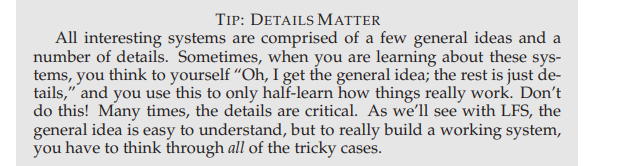

## 43.2 Writing Sequentially And Effectively
#### The Challenge of Sequential Writing
Simply writing to disk sequentially does not guarantee efficient performance. For example, if a block is written at time T to address A and another is written at time T+δ to address A+1, the disk may rotate during the wait, leading to inefficient writes. Thus, multiple contiguous writes are necessary to achieve optimal performance.

#### Solution: Write Buffering
LFS uses **write buffering**, where updates are kept in memory until a sufficient number are gathered, then written all at once. This ensures efficient use of the disk. The collection of updates written together is called a **segment**. 

#### How Much to Buffer?
The number of updates LFS should buffer depends on disk characteristics like positioning overhead and transfer rate. To minimize overhead and approach peak bandwidth, LFS should buffer enough data to amortize the positioning cost.

## 43.3 Problem: Finding Inodes

In a traditional UNIX file system, inodes are stored in fixed locations or organized in arrays, making them easy to find. However, in LFS, inodes are scattered throughout the disk, and the latest version of an inode moves as it is updated.

## 43.4 Solution: The Inode Map

LFS uses an **inode map** (imap), which is a data structure that maps inode numbers to their most recent disk addresses. The imap is updated every time an inode is written to disk.

**TIP:**  
Indirection, like the inode map, is a powerful solution in computer science, allowing structures (e.g., inodes) to move without requiring updates to all references. However, indirection introduces additional overhead.

### The Inode Map on Disk
The imap is written to disk alongside data blocks and inodes. For example, when appending a data block to file k, LFS writes the data block, its inode, and a piece of the imap to disk

This approach avoids performance hits from frequent updates to the imap by placing it near the other new data on disk.

## 43.6: The Checkpoint Region

- The **Checkpoint Region (CR)** is a fixed location on disk, providing pointers to the latest inode map pieces.
    - This helps to find the inode map even when it's scattered across the disk.
- The CR is updated periodically (e.g., every 30 seconds) to avoid performance issues.
- LFS organizes its disk layout into:
  - **Checkpoint Region** pointing to inode map pieces.
  - **Inode map chunks** with addresses to inodes.
  - **Inodes** pointing to files, similar to UNIX file systems.

### Reading a File From Disk in LFS
- To read a file, LFS first reads the **Checkpoint Region**, which points to the inode map. 
- Once the inode map is in memory, the system looks up the inode address to fetch the file's inode.
- LFS uses the inode’s direct, indirect, or doubly indirect pointers to retrieve file data blocks, performing a similar number of I/Os as traditional file systems.

### Directories in LFS
- In LFS, directories are managed like in UNIX systems, containing `(name, inode number)` mappings.
- When a file is created, LFS writes:
  - A new **inode** and **data** for the file.
  - The **directory inode** with the mapping for the new file.
- LFS avoids recursive updates by using the inode map instead of updating directory entries when an inode’s location changes.

### Garbage Collection in LFS
- LFS leaves older versions of inodes and data blocks as "garbage" on the disk when files are overwritten or appended to.
- **Garbage collection** is necessary to free up space by deleting obsolete versions of file structures.
- Unlike versioning file systems, LFS keeps only the latest live versions of files.
- **Cleaning process**: 
  - The cleaner reads old, partially-used segments, determines which blocks are live, and writes out new segments with only the live blocks.
  - Old segments are freed for future writes.

### Challenges in Garbage Collection
1. **Mechanism**: LFS needs a way to identify live and dead blocks within segments.
2. **Policy**: Deciding when to run the cleaner and which segments to clean.

### 43.10 Determining Block Liveness in LFS

- **Liveness Check**: LFS determines if a data block `D` is live by storing its inode number and offset in a **segment summary block**.
- To check if a block is live:
  1. Get the inode number `N` and offset `T` from the segment summary block for the block at address `A`.
  2. Look up `N` in the inode map (imap) and read the inode.
  3. Check if the inode’s `T`th block points to address `A`. If it does, the block is live; if not, it’s garbage.
  
### 43.11 Policy: Which Blocks to Clean, and When?

- **When to Clean**: LFS can clean periodically, during idle times, or when the disk is full.
- **Which Blocks to Clean**: LFS aims to segregate **hot** (frequently overwritten) and **cold** (stable) segments.
  - **Hot segments** should be cleaned later, as more blocks are overwritten.
  - **Cold segments** should be cleaned sooner.
- This heuristic, while effective, is not optimal. Newer research suggests more efficient strategies.

### 43.12 Crash Recovery and the Log

- **Write Buffering and Log**: LFS buffers writes in a segment, then writes the full segment to disk. It keeps a **checkpoint region (CR)** to track the head and tail of the log.
- **Handling Crashes**:
  - **CR Updates**: LFS uses two CRs for atomic updates. If a crash occurs during a CR update, the system detects inconsistent timestamps and uses the most recent consistent CR.
  - **Log Recovery**: LFS uses **roll forward** to recover from crashes by starting from the last checkpoint, reading through subsequent segments, and applying valid updates.

### 43.13 Summary

- LFS writes updates to new disk space instead of overwriting old data, then reclaims old space through **cleaning**.
- **Cleaning** involves identifying and removing old data, which can generate scattered "garbage" on disk.
- This approach, similar to **shadow paging** and **copy-on-write**, allows efficient writing but requires periodic cleaning to reclaim space.

# 44 - Data Integrity and Protection
focus on reliability once again

how should a file system or storage system ensure that data is safe, given the unreliable nature of modern storage devices?

This general area is referred to as **data integrity** or **data protection**.

**CRUX: HOW TO ENSURE DATA INTEGRITY - How should systems ensure that the data written to storage is protected? What techniques are required? How can such techniques be made efficient, with both low space and time overheads?**

## 44.1 Disk Failure Modes

Two common types of single-block failures are **latent-sector errors (LSEs)** and **block corruption**:

- **LSEs** occur when a disk sector becomes unreadable due to damage, such as a head crash or cosmic rays. Disks often use error-correcting codes (ECC) to detect and correct these errors.
- **Block corruption** is more subtle and occurs when data is silently altered, often due to firmware issues or faulty data transfers between the host and disk.

These errors are relatively rare but still significant, and their occurrence is higher in cheaper drives compared to costly ones. Some findings include:
- **LSEs** are more frequent in larger disks, and most affected disks have fewer than 50 LSEs.
- **Corruption** can vary significantly across different models and may be correlated with LSEs.

Both errors can impact storage system reliability, requiring mechanisms to detect and recover from them.

## 44.2 Handling Latent Sector Errors

Latent sector errors are easier to handle since they are detectable when the system tries to access the data. Storage systems can use **redundancy mechanisms** like RAID to recover from these errors. When an LSE is encountered, the system can access alternate copies of the data or reconstruct the missing data using parity from other drives in the system. 

In RAID-4/5 systems, if both a full disk failure and an LSE occur during reconstruction, the system may not be able to complete the process. Some systems, like **NetApp’s RAID-DP**, provide extra redundancy with two parity disks to address this issue.

## 44.3 Detecting Corruption: The Checksum

Detecting and handling data corruption is more challenging because it is a silent failure. The primary method used by modern systems to preserve data integrity is the **checksum**. 
- A checksum is a small value computed from a block of data that can later be used to verify the data’s integrity. 
- When a block is read, the system checks the checksum to confirm that the data has not been altered.

There is a trade-off in choosing checksum functions: 
- more protection typically means higher computation costs. 
- A common, simple checksum function is based on **XOR**, where each byte of the data block is XOR’d together to produce a checksum.

### Common Checksum Functions

Different checksum functions offer varying levels of strength and speed. The stronger the protection, the more computationally expensive it is, which reflects the principle that "there’s no such thing as a free lunch."

## 44.4 Using Checksums

When reading a block (D), the client retrieves the stored checksum (Cs(D)) from disk. 
- The client then computes a checksum (Cc(D)) over the block. 
- If both checksums match, the data is likely intact. 
- If they differ, it indicates corruption, and the system may attempt to use a redundant copy if available or return an error if not.

## 44.5 A New Problem: Misdirected Writes

Misdirected writes occur when data is written to the wrong location. For example, a block might be written to the wrong address on the same disk or another disk. 
- To detect this, additional information (such as the disk and sector number) can be added to the checksum. 
- If the stored location doesn’t match the expected location, a misdirected write is detected.

## 44.6 One Last Problem: Lost Writes

A lost write occurs when a system reports a write as successful, but the data is not actually persisted. 
- Checksums alone cannot detect this because the old block's checksum may still match. 
- Solutions include **write verify** (reading back the data immediately after writing) or adding checksums to other parts of the system (e.g., inodes) to ensure data integrity.

## 44.7 Scrubbing

To address unchecked data, many systems use disk scrubbing, which periodically checks all blocks for checksum validity. 
- This helps reduce the risk of data corruption when bits degrade over time. 
- Scrubbing typically happens on a regular schedule (e.g., nightly or weekly).

## 44.8 Overheads of Checksumming

Checksumming introduces both space and time overheads:
- **Space overhead**: Each checksum consumes storage space, usually a small fraction (e.g., 0.19% for an 8-byte checksum per 4 KB block). Additional memory is required for checksums during data access.
- **Time overhead**: The CPU must compute checksums when data is stored and accessed. Combining data copying and checksumming can reduce overhead. Additional I/O overheads can occur if checksums are stored separately from data or during scrubbing operations, which can be minimized by controlling when scrubbing occurs.

## 44.9 Summary

Checksums are essential for data protection in modern storage systems, helping to detect and handle various faults like corruption, misdirected writes, and lost writes. 

While they introduce some overhead, their role in ensuring data integrity is critical as storage devices evolve and new failure modes emerge.


# 45 - Summary Dialogue on Persistence
it is much harder to manage data for a long time (persistently) than it is to manage data that isn’t persistent (like the stuff in memory). After all, if your machines crashes, memory contents disappear! But the stuff in the file system needs to live forever.

even simple things, such as updating a persistent storage device, are complicated, because you have to care what happens if you crash. Recovery, something I had never even thought of when we were virtualizing memory, is now a big deal!

disk scheduling, and about data protection techniques like RAID and even checksums

building technology aware systems, like FFS and LFS. Neat stuff! Being disk aware seems cool. But will it matter anymore, with Flash and all the newest, latest technologies?
- even with Flash, all of this stuff is still relevant, amazingly.
- For example, Flash Translation Layers (FTLs) use log-structuring internally, to improve performance and reliability of Flash-based SSDs.
- And thinking about locality is always useful.
- So while the technology may be changing, many of the ideas we have studied will continue to be useful

# 46 - A Dialogue on Distribution
our final little piece in the world of operating systems: distributed systems. 

Since we can’t cover much here, we’ll sneak in a little intro here in the section on persistence, and focus mostly on distributed file systems

There’s a peach. But this time, it’s far away from you, and may take some time to get the peach. And there are a lot of them! Even worse, sometimes a peach becomes rotten. But you want to make sure that when anybody bites into a peach, they will get a mouthful of deliciousness

Building distributed systems is hard, because things fail all the time. Messages get lost, machines go down, disks corrupt data. 

Using distributed systems all the time; when you send a search request to google, it usually comes back in a snap, with some great results! Same thing wrt use facebook, or Amazon, and so forth.

And that’s despite all of those failures taking place! Those companies build a huge amount of machinery into their systems so as to ensure that even though some machines have failed, the entire system stays up and running. They use a lot of techniques to do this: replication, retry, and various other tricks people have developed over time to detect and recover from failures.



# 47 - Distributed Systems
Distributed systems have changed the face of the world. 

When your web browser connects to a web server somewhere else on the planet, it is participating in what seems to be a simple form of a **client/server** distributed system

When you contact a modern web service such as Google or facebook, you are not just interacting with a single machine, however; behind the scenes, these complex services are built from a large collection (i.e., thousands) of machines, each of which cooperate to provide the particular service of the site.

A number of new challenges arise when building a distributed system. The major one we focus on is **failure**; machines, disks, networks, and software all fail from time to time, as we do not (and likely, will never) know how to build “perfect” components and systems.

However, when we build a modern web service, we’d like it to appear to clients as if it never fails; how can we accomplish this task?

**THE CRUX: HOW TO BUILD SYSTEMS THAT WORK WHEN COMPONENTS FAIL - How can we build a working system out of parts that don’t work correctly all the time? The basic question should remind you of some of the topics we discussed in RAID storage arrays; however, the problems here tend to be more complex, as are the solutions**

Yes, machines fail; but the mere fact that a machine fails does not imply the entire system must fail. By collecting together a set of machines, we can build a system that appears to rarely fail, despite the fact that its components fail regularly
- This reality is the central beauty and value of distributed systems, and why they underly virtually every modern web service you use, including Google, Facebook, etc.

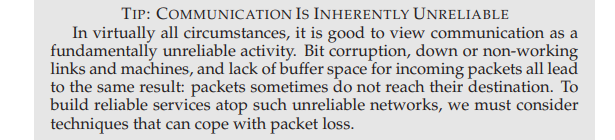

Other important issues:
- System **performance**; with a network connecting our distributed system together, system designers must often think carefully about how to accomplish their given tasks, trying to reduce the number of messages sent and further make communication as efficient (low latency, high bandwidth) as possible.
- **security**; When connecting to a remote site, having some assurance that the remote party is who they say they are becomes a central problem. Further, ensuring that third parties cannot monitor or alter an on-going communication between two others is also a challenge

## 47.1 Communication Basics

Modern networking assumes communication is unreliable, with packets often lost, corrupted, or not reaching their destination due to factors like electrical interference, hardware issues, or lack of buffering in network devices (routers, switches, or endpoints). 

Even with properly functioning components, packet loss occurs when buffers in these devices overflow.

#### Causes of Packet Loss:
- **Transmission errors**: Bits may flip during transmission due to interference.
- **Hardware failure**: Damaged network devices or cables.
- **Buffering issues**: Network devices like routers or end hosts can drop packets when they are overwhelmed.

#### Handling Packet Loss:
The challenge is how to manage packet loss effectively within network communication.

## 47.2 Unreliable Communication Layers

One approach to handle packet loss is to use **unreliable communication layers**. A good example is the **UDP/IP stack**, which provides simple communication without any built-in mechanisms for ensuring message delivery.

#### Example UDP/IP Client/Server Code:
- **Client**: Sends a message to a server using UDP and waits for a reply.
- **Server**: Receives the message and responds with a reply.

## 47.3 Reliable Communication Layers

To build reliable communication over an unreliable network, new techniques are necessary to handle packet loss. The key mechanism for achieving reliability is the use of **acknowledgments (acks)**.

#### Acknowledgments:
When a sender sends a message, the receiver sends an acknowledgment (ack) back to confirm receipt of the message. If the sender doesn't receive an ack, it will retry sending the message.

#### Example of Message Plus Acknowledgment:
1. **Sender** sends a message.
2. **Receiver** receives the message and sends back an ack.
3. **Sender** waits for the ack and confirms receipt.

#### Handling Packet Loss:
If an ack is lost, the sender may mistakenly assume the original message was lost and retry. To avoid duplicate messages, the sender must handle **timeouts** and **retries** by maintaining a copy of the message until an ack is received.

#### Sequence Counter:
To prevent duplicate messages in case of lost acknowledgments, both the sender and receiver maintain a **sequence counter**. The sender sends the message with a unique counter, which the receiver expects in the order of the messages.

- If the receiver gets the same message (due to a lost ack), it recognizes it as a duplicate using the sequence counter and ignores the duplicate, ensuring each message is processed exactly once.

#### Example of Sequence Counter:
1. **Sender** sends a message with a sequence number (e.g., 1).
2. **Receiver** expects message 1. If received, the receiver sends an ack and increments the counter.
3. If the ack is lost, the sender will retry, but the receiver will ignore the duplicate because its counter value is higher.

#### Common Reliable Layer: TCP/IP
**TCP/IP** (Transmission Control Protocol) is a widely used protocol that builds reliable communication by managing retransmissions, sequence numbers, and congestion control to ensure reliable message delivery.

## 47.4 Communication Abstractions

In building a distributed system, the key question is: what abstraction of communication should be used? 

#### Tip: Be Careful Setting the Timeout Value
Setting the timeout value correctly is crucial. 
- If the timeout is too small, the sender will unnecessarily re-send messages, wasting CPU time and network resources. 
- If the timeout is too large, the sender waits too long before re-sending, affecting perceived performance.

The "right" timeout value balances detecting packet loss without causing delay.

In systems with many clients, packet loss might indicate server overload. 
- In such cases, an adaptive retry strategy like exponential back-off can help.
- This approach avoids system overload by progressively increasing the timeout value after each retry, a technique inspired by the Aloha network and early Ethernet systems.

#### Distributed Shared Memory (DSM) Systems
Distributed shared memory (DSM) systems extend OS abstractions for a distributed environment, allowing processes on different machines to share a large, virtual address space. 
- However, DSM systems face challenges such as handling failures and performance issues due to the expensive nature of fetching data from remote machines. 
- Today, DSM is not widely used due to its difficulty in handling failure and performance inefficiencies.

## 47.5 Remote Procedure Call (RPC)
**Remote Procedure Call (RPC)** simplifies executing code on remote machines by making it appear like a local function call. 

The RPC system is composed of two main components: 
- the stub generator 
- the runtime library

#### Stub Generator
The stub generator automates packing function arguments and results into messages, reducing errors and potentially optimizing performance. It generates code for both the client and server.

#### Client Side
- The client calls a function (e.g., `func1(x)`), and the client stub does the following:
  - Creates a message buffer.
  - Packs function identifier and arguments (serialization).
  - Sends the message to the server.
  - Waits for the reply.
  - Unpacks return values (deserialization).
  - Returns the result to the client.

#### Server Side
- The server receives the message and performs these steps:
  - Unpacks the message.
  - Calls the appropriate function with arguments.
  - Packages and sends back the result.

#### Runtime Library
The runtime library handles essential functionality in an RPC system, including performance and reliability concerns.

#### Key Challenges
- **Locating Remote Services**: Naming is crucial for identifying the server providing the RPC service. This can be based on hostnames and port numbers.
- **Transport Layer Protocol**: Should RPC use a reliable protocol like TCP/IP or an unreliable one like UDP? While TCP/IP provides reliability, it can lead to inefficiency due to extra acknowledgment messages. Using UDP can enhance efficiency but requires the RPC system to manage reliability through timeout/retry and sequence numbering.
- **Handling Long-Running Calls**: For long-running calls, an explicit acknowledgment mechanism helps the client understand that the request has been received, and periodic checks can be made.
- **Handling Large Arguments**: The RPC system must handle large arguments that exceed packet size, often by fragmenting and reassembling the data.

#### Endianness
Machines use either big endian or little endian ordering, which can cause issues when communicating between different systems. RPC packages like Sun’s XDR (eXternal Data Representation) handle these differences by converting the data as needed, ensuring correct message transmission.

#### The End-to-End Argument
The end-to-end argument suggests that certain functionalities, such as ensuring reliable file transfer, should be implemented at the highest level in the system. 
- For example, a reliable file transfer requires end-to-end checks, even if the network layer ensures reliable delivery. 
- This argument contrasts with the idea of solving problems by adding functionality at lower layers. Some lower-level functionalities can improve system performance but should be carefully considered for their overall utility.

## 47.6 Summary
As they say inside of Google, when you have just your desktop machine, failure is rare; when you’re in a data center with thousands of machines, failure is happening all the time.

The key to any distributed system is how you deal with that failure.

**communication forms the heart of any distributed system**
- A common abstraction of that communication is found in remote procedure call (RPC), which enables clients to make remote calls on servers; the RPC package handles all of the gory details, including timeout/retry and acknowledgment, in order to deliver a service that closely mirrors a local procedure call.


# 48 - Sun’s Network File System (NFS)
One of the first uses of distributed client/server computing was in the realm of distributed file systems.

In such an environment, there are a number of client machines and one server (or a few); the server stores the data on its disks, and clients request data through well-formed protocol messages.

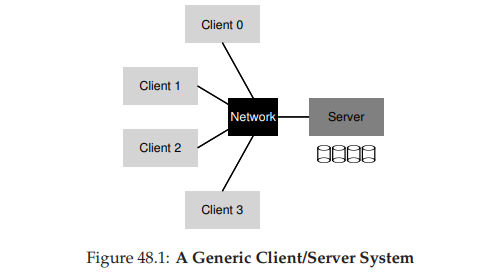

Why do we bother with this arrangement? (i.e., why don’t we just let clients use their local disks?) 
1. primarily this setup allows for easy sharing of data across clients. 
- if you access a file on one machine (Client 0) and then later use another (Client 2), you will have the same view of the file system.
- Your data is naturally shared across these different machines

2. centralized administration; eg, backing up files can be done from the few server machines instead of from the multitude of clients.

3. security; having all servers in a locked machine room prevents certain types of problems from arising

**CRUX: HOW TO BUILD A DISTRIBUTED FILE SYSTEM - How do you build a distributed file system? What are the key aspects to think about? What is easy to get wrong? What can we learn from existing systems?**

## 48.1 A Basic Distributed File System
A simple client/server distributed file system has more components than the file systems we have studied so far

On the client side, there are client applications which access files and directories through the clientside file system. A client application issues system calls to the client-side file system (such as open(), read(), write(), close(), mkdir(), etc.) in order to access files which are stored on the server.

Thus, to client applications, the file system does not appear to be any different than a local (disk-based) file system, except perhaps for performance; in this way, distributed file systems provide transparent access to files, an obvious goal; after all, who would want to use a file system that required a different set of APIs or otherwise was a pain to use?

The role of the client-side file system is to execute the actions needed to service those system calls. For example, if the client issues a read() request, the client-side file system may send a message to the server-side file system (or, more commonly, the file server) to read a particular block; the file server will then read the block from disk (or its own in-memory cache), and send a message back to the client with the requested data

The client-side file system will then copy the data into the user buffer supplied to the read() system call and thus the request will complete

Note that a subsequent read() of the same block on the client may be cached in client memory or on the client’s disk even; in the best such case, no network traffic need be generated.

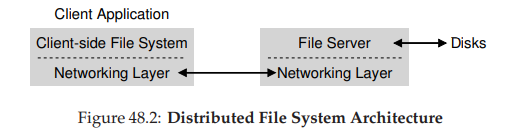

**2 important pieces of software in a client/server distributed file system:**
1. the client-side file system 
2. the file server

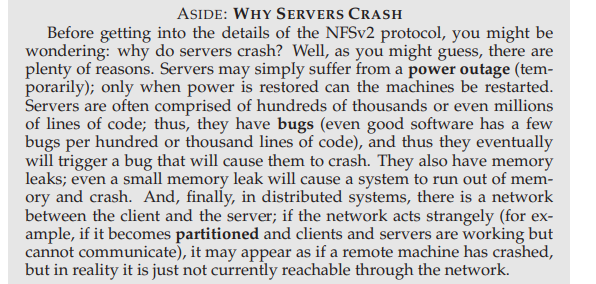

## 48.2 On To NFS
The Sun **Network File System (NFS)** is one of the earliest distributed systems. 
- **Open Protocol**: Sun defined an open protocol specifying client-server communication message formats, fostering competition and interoperability in the NFS marketplace. 
- **Widespread Success**: The open market approach led to many companies (e.g., Oracle/Sun, NetApp, EMC, IBM) creating NFS servers.

## 48.3 Simple and Fast Server Crash Recovery
- **NFSv2** - known for simplicity and fast crash recovery.
- **Importance of Recovery**: In a single-server, multi-client environment, server downtime directly affects productivity.

## 48.4 Statelessness: Key to Fast Crash Recovery
- **Stateless Protocol** - The server doesn't track client states (open files, file pointers, etc)
  - All client operations include sufficient information for the server to process the request.
- **Advantages**:
  - Simplifies crash recovery: After a server restarts, clients may only need to retry operations.
  - Avoids complications from client crashes and state synchronization.
- **Contrast with Stateful Protocols**: Stateful protocols share information (e.g., file descriptors) between client and server, complicating recovery when crashes occur.

## 48.5 The NFSv2 Protocol
#### Problem Statement
- **Designing a Stateless File Protocol**: How to support standard POSIX API calls (e.g., `open`, `read`, `write`, `close`) without maintaining server-side state.

#### File Handle
- **Definition**: A unique identifier combining a volume ID, inode number, and generation number.
- **Purpose**: Used in protocol requests to identify files or directories without requiring server state.
- **Key Benefits**:
  - Supports stateless operations
  - Prevents accidental access to newly allocated files by ensuring uniqueness through the generation number

#### Protocol Messages
- **Core Operations**:
  - **LOOKUP**: Fetches a file handle using a directory file handle and file/directory name.
  - **GETATTR**: Fetches metadata (e.g., modification time, size, permissions) for a file using its handle.
  - **READ**: Reads data from a file using a file handle, offset, and count.
  - **WRITE**: Writes data to a file using a file handle, offset, count, and data.
  - **CREATE/MKDIR**: Creates files/directories.
  - **REMOVE/RMDIR**: Deletes files/directories.
  - **READDIR**: Reads directory entries.

- **Caching Importance**:
  - Metadata attributes like last modification time are critical for caching mechanisms.

#### Example Workflow
1. **LOOKUP**: The client requests a file handle for a specific file (e.g., `/foo.txt`) from the server.
2. **READ/WRITE**: Using the file handle, the client performs operations like reading or writing data.

#### Highlights
- **Statelessness in Practice**: NFSv2's stateless protocol ensures robust and efficient crash recovery.
- **Simplified Client-Server Interaction**: Clients provide all necessary information per operation, minimizing server-side complexity.

## 48.6 From Protocol to Distributed File System in NFS

#### Client and Server Interactions
- **Client-Side File System**:
  - Tracks open files and maps file descriptors to NFS file handles.
  - Maintains state such as current file positions to transform application calls into properly formatted NFS protocol messages.
- **Server**:
  - Responds to each protocol request with the necessary information to complete the operation without maintaining state.

#### Example: Reading a File
- The client translates application system calls (e.g., `open`, `read`) into protocol messages (`LOOKUP`, `READ`).
- Key steps:
  - On `open`, the client issues multiple `LOOKUP` requests to traverse the file path.
  - For each `read`, the client sends a `READ` request with the file handle and offset, receives data, and updates the file position locally.
  - `close` is handled entirely by the client without server interaction.

#### Idempotency and Server Failure
- **Idempotency**:
  - Operations that can be repeated with the same result are critical for reliability.
  - Example: `LOOKUP` and `READ` are inherently idempotent; `WRITE` is designed to be idempotent by including all necessary data (e.g., offset) in the request.
- **Failure Handling**:
  - Clients use timeouts and retries to handle server unresponsiveness due to message loss, server crashes, or reply loss.
  - Retries work seamlessly for idempotent operations, allowing recovery without additional complexity.

#### Types of Failures
1. **Request Lost**: Client resends; server processes the request.
2. **Server Down**: Client resends when the server is back online.
3. **Reply Lost**: Server re-executes the request upon client retry, ensuring consistent results.

#### Limitations and Design Philosophy
- Non-idempotent operations, such as `mkdir`, may encounter edge cases (e.g., re-execution results in a "directory already exists" error).
- The design balances simplicity and reliability, prioritizing practicality over perfection, adhering to Voltaire's Law: *"Perfect is the enemy of the good."*

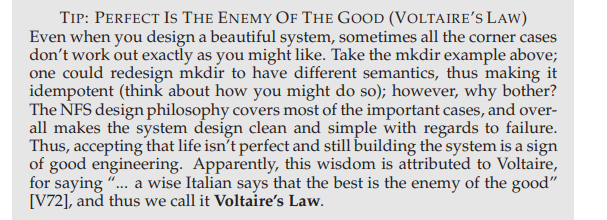



## 48.8 Improving Performance: Client-Side Caching
- **Performance Problem**: Distributed file systems often suffer from slow network communication for file operations.
- **Solution**: Use client-side caching:
  - File data and metadata are cached in client memory after the first access.
  - Write operations are buffered in the client cache before being sent to the server, reducing application latency.
- **Challenge**: Caching introduces the **cache consistency problem**.

## 48.9 The Cache Consistency Problem
#### Overview
- Problem arises when multiple clients cache the same file and changes occur:
  - **Update Visibility**: Changes made by one client may not be immediately visible to others.
  - **Stale Cache**: A client may continue to use outdated data from its cache.

#### NFSv2 Solutions
1. **Flush-on-Close Semantics**:
   - Ensures that when a file is closed, all updates are flushed to the server.
   - Guarantees that subsequent opens by other clients fetch the latest version.
2. **GETATTR Requests**:
   - Clients validate cached data by checking file attributes (e.g., modification time) on the server.
   - If the file has changed, the cache is invalidated.

#### Optimization: Attribute Cache
- To reduce the overhead of frequent GETATTR requests, an attribute cache is added.
- Cached attributes have a short timeout (e.g., 3 seconds), allowing validation without repeated server communication.

## 48.10 Assessing NFS Cache Consistency
- **Performance Tradeoffs**:
  - Flush-on-close ensures correctness but introduces unnecessary server interaction for short-lived files.
  - Attribute caching can cause clients to sometimes use outdated versions of files.
- **User Experience**:
  - Inconsistent behavior depending on cache timing complicates reasoning about file state.

## 48.11 Implications on Server-Side Write Buffering
#### Server-Side Caching
- Servers cache data in memory to improve performance for subsequent reads.
- Write requests must be committed to persistent storage before acknowledging success to clients, avoiding:
  - Data loss from server crashes.
  - Inconsistent file states when write order is disrupted.

#### Performance Bottlenecks
- Writing to disk for every request can be slow.
- **Optimizations**:
  - Use battery-backed memory for write buffering.
  - Design file systems optimized for fast writes.

#### Key Takeaways
- Client-side caching improves performance but introduces consistency challenges.
- NFS addresses these challenges with mechanisms like flush-on-close and attribute caching.
- Server-side write buffering ensures reliability but requires careful optimization to avoid bottlenecks.

## 48.12 Summary 
We have seen the introduction of the NFS distributed file system. 

NFS is centered around the idea of simple and fast recovery in the face of server failure, and achieves this end through careful protocol design. 

Idempotency of operations is essential; because a client can safely replay a failed operation, it is OK to do so whether or not the server has executed the request

Caching Challenges:
- Client-side Caching: Improves performance but introduces the cache consistency problem.
- Consistency Issues: Handled in an ad hoc manner in NFS, occasionally leading to unpredictable behavior.
- Server-side Caching: Writes must be committed to stable storage before confirming success to avoid data loss during server failures.

Security Concerns:
- Early NFS versions had weak security, allowing users to impersonate others and access restricted files.
- Integration with robust authentication systems like Kerberos improved security in later implementations.

# 49 - The Andrew File System (AFS)
The Andrew File System was introduced by researchers at Carnegie-Mellon University (CMU) in the 1980’s

main goal of this project was simple: **scale** - how can one design a distributed file system such that a server can support as many clients as possible?

numerous aspects of design and implementation that affect scalability. Most important is the design of the protocol between clients and servers

In NFS, for example, the protocol forces clients to check with the server periodically to determine if cached contents have changed; because each check uses server resources (including CPU and network bandwidth), frequent checks like this will limit the number of clients a server can respond to and thus limit scalability.

AFS also differs from NFS in that from the beginning, reasonable uservisible behavior was a first-class concern. In NFS, cache consistency is hard to describe because it depends directly on low-level implementation details, including client-side cache timeout intervals. In AFS, cache consistency is simple and readily understood: when the file is opened, a client will generally receive the latest consistent copy from the server.

## AFS Version 1 and 2: Overview and Improvements

### AFS Version 1 (AFSv1)
- **Design Features**:
  - Relied on **whole-file caching** on the local disk of the client.
  - File operations like `read()` and `write()` were performed locally after fetching the file during `open()`.
  - Upon `close()`, modified files were sent back to the server for permanent storage.
  - Utilized protocol messages:
    - `Fetch`: Retrieve file contents.
    - `Store`: Save the file back to the server.
    - `TestAuth`: Check if the cached file is still valid.

- **Key Problems**:
  1. **High Path-Traversal Costs**: Entire file paths were sent to the server for every `Fetch` and `Store`, leading to inefficiency under heavy client load.
  2. **Frequent Validation Requests**: Overuse of `TestAuth` messages caused high server traffic to verify cached file validity.
  3. **Load Imbalance and Overheads**:
     - Servers were not load-balanced.
     - Single-process-per-client design caused performance bottlenecks.

### AFS Version 2 (AFSv2)
- **Improvements**:
  1. **Callbacks**:
     - Introduced a mechanism where the server informs the client of file changes.
     - Reduced the need for frequent `TestAuth` checks, as clients could assume cached files were valid until notified otherwise.
  2. **File Identifiers (FIDs)**:
     - Used unique identifiers (composed of volume ID, file ID, and a uniquifier) instead of full pathnames.
     - Allowed clients to traverse paths locally and cache intermediate results, reducing server load.
  3. **Threaded Server Design**:
     - Improved scalability by replacing single-process-per-client architecture with threads.
  4. **Load Balancing**:
     - Introduced volumes, allowing administrators to distribute load across servers.

- **Performance Gains**:
  - Initial access required multiple client-server interactions (e.g., fetching directories/files and setting up callbacks).
  - Subsequent accesses became entirely local, achieving near-local disk performance.

### Cache Consistency Limitations
- AFS provided baseline cache consistency but was insufficient for managing concurrent file updates across multiple clients.
- Explicit mechanisms like file-level locking were required for applications with concurrent access needs (e.g., code repositories).

### Key Takeaway
AFSv2 addressed the scalability and efficiency limitations of AFSv1 through callbacks, FIDs, and architectural improvements, making it a more robust distributed file system.

## **49.5 Cache Consistency**
- **Key Aspects**:
  - **Update Visibility**: Updates are sent to the server when a file is closed. The server invalidates all cached copies simultaneously, ensuring clients retrieve the latest version on the next open.
  - **Cache Staleness**: Clients see the updated version only after the file is closed and the server flushes it.
  
- **Behavior**:
  - **Between Machines**: Updates are visible on close; the "last closer wins" model ensures that the server's file reflects the last client's changes.
  - **Within the Same Machine**: Local writes are immediately visible to other processes, providing UNIX-like semantics.
  - **Concurrency Case**: Simultaneous updates by different machines result in the last writer's version being the definitive file, avoiding fragmented or mixed files (e.g., NFS).

## 49.6 Crash Recovery
- **Challenges**:
  - **Client Crash**: If a client misses callback invalidations during a reboot, it treats its cache as suspect and validates files with the server.
  - **Server Crash**: Callbacks are lost as they are stored in memory. Clients must detect server crashes and validate cached files upon reconnecting.
- **Solutions**:
  - Server informs clients to invalidate caches upon recovery.
  - Clients can periodically verify server availability through heartbeat messages.

## 49.7 AFSv2: Scale and Performance
- **Improvements**:
  - Enhanced scalability: A single server supports ~50 clients (up from 20).
  - Better client-side performance: Reads often use local disk caches, minimizing server interaction.
  
- **Performance Comparison with NFS**:
  - **Equivalences**:
    - Initial file reads and small sequential writes perform similarly on both systems.
  - **Advantages of AFS**:
    - Sequential re-reads of large files are faster due to local disk caching.
  - **Disadvantages of AFS**:
    - Sequential overwrites are slower as AFS fetches the entire file before overwriting.
    - Small updates to large files are inefficient, as AFS fetches and writes the entire file.

## 49.8 Other Improvements in AFS
- **Global Namespace**: Provides a unified file naming system across clients, simplifying management and consistency.
- **Contrast with NFS**: NFS allows flexible client mounts, requiring administrative effort to maintain uniformity.

#### Key Insights
- AFS excels in scenarios where local caching can be leveraged but struggles with small updates to large files.
- While more scalable and user-friendly, AFS's crash recovery mechanisms are more complex than NFS due to callback invalidation and client-server synchronization.

## 49.9 Summary
AFS shows us how distributed file systems can be built quite differently than what we saw with NFS. The protocol design of AFS is particularly important; by minimizing server interactions (through whole-file caching and callbacks), each server can support many clients and thus reduce the number of servers needed to manage a particular site.

Many other features, including the single namespace, security, and access-control lists, make AFS quite nice to use

Perhaps unfortunately, AFS is likely on the decline. Because NFS became an open standard, many different vendors supported it, and, along with CIFS (the Windows-based distributed file system protocol), NFS dominates the marketplace.

Although one still sees AFS installations from time to time (such as in various educational institutions, including Wisconsin), the only lasting influence will likely be from the ideas of AFS rather than the actual system itself. Indeed, NFSv4 now adds server state (e.g., an “open” protocol message), and thus bears an increasing similarity to the basic AFS protocol. 

# 50 - Summary Dialogue on Distribution
by having lots of these things (whether disks, machines, or whatever), you can hide much of the failure that arises.

Some basic techniques like retrying are really useful.

you have to think carefully about protocols: the exact bits that are exchanged between machines. Protocols can affect everything, including how systems respond to failure and how scalable they are
